In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime

%matplotlib inline

In [2]:
all_data = pd.read_csv("../Basel/Patients_and_Weather.csv")

In [3]:
all_data['Assess_Date_With_Time'] = pd.to_datetime(all_data['Assess_Date_With_Time'], format='%Y-%m-%d %H:%M:%S')
all_data['Assess_date_No_Time'] = all_data['Assess_Date_With_Time'].dt.date

In [426]:
interesting_parameters = ("pulse_Triage", "spo2_Triage", "question_Triage", "manual_Triage")
num_days = 10


for index, row in all_data.iterrows():
    print("Row: ", index)
    for d in range(1,num_days):
        subselection = all_data[(all_data['Merida ID'] == row['Merida ID']) &
            ((row['Assess_date_No_Time'] - all_data['Assess_date_No_Time']) < datetime.timedelta(days=d+1)) &
            ((row['Assess_date_No_Time'] - all_data['Assess_date_No_Time']) > datetime.timedelta(days=d-1))]
        #print("\t", len(subselection))
        for par in interesting_parameters:
            all_data.loc[index, par+"_"+str(d)] = np.nanmean(subselection[par])

Row:  0


/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: Mean of empty slice
  del sys.path[0]


Row:  1
Row:  2
Row:  3
Row:  4
Row:  5
Row:  6
Row:  7
Row:  8
Row:  9
Row:  10
Row:  11
Row:  12
Row:  13
Row:  14
Row:  15
Row:  16
Row:  17
Row:  18
Row:  19
Row:  20
Row:  21
Row:  22
Row:  23
Row:  24
Row:  25
Row:  26


KeyboardInterrupt: 

In [45]:
#selected_data = all_data[all_data["Merida ID"]==1000405]

#for index, row in selected_data.iterrows():
#    print("Row: ", index)
#    for d in range(1,2):
#        print(row['Assess_date_No_Time'])
#        subselection = selected_data[(selected_data['Merida ID'] == row['Merida ID']) &
#            ((row['Assess_date_No_Time'] - selected_data['Assess_date_No_Time']) < datetime.timedelta(days=d+1)) &
#            ((row['Assess_date_No_Time'] - selected_data['Assess_date_No_Time']) > datetime.timedelta(days=d-1))]
#        print(subselection[['Assess_date_No_Time']+pars])
        #print("\t", len(subselection))
#        for par in interesting_parameters:
#            selected_data.loc[index, par+"_"+str(d)] = np.nanmean(subselection[par])

In [452]:
selected_data[['Assess_date_No_Time'] + pars + [i+"_"+str(j) for j in range(1,5) for i in pars]]

NameError: name 'selected_data' is not defined

In [19]:
all_data.to_csv("../Basel/Patients_and_Weather_w_history.csv")

In [ ]:
# Need some data cleaning
# What happens if we have several overwritten measurements in a single day?

In [4]:
pars = ["question_Triage"]
all_data[pars + [i+"_"+str(j) for j in range(1,5) for i in pars]]

,question_Triage,question_Triage_1,question_Triage_2,question_Triage_3,question_Triage_4
0,1.0,NaN,NaN,NaN,NaN
1,3.0,1.0,NaN,NaN,NaN
2,3.0,3.0,1.0,NaN,NaN
3,3.0,NaN,NaN,3.0,3.0
4,1.0,3.0,NaN,NaN,3.0
5,NaN,1.0,3.0,NaN,NaN
6,NaN,1.0,3.0,NaN,NaN
7,1.0,1.0,3.0,NaN,NaN
8,1.0,1.0,1.0,3.0,NaN
9,1.0,1.0,1.0,1.0,3.0


In [5]:
all_data.loc[5:5,]

,Unnamed: 0,Merida ID,Assess_Date_With_Time,Region,Merida ID.1,Patient_Group,Assess_Date_With_Time.1,Assess_date_No_Time,SO2,Pulse,...,question_Triage_7,manual_Triage_7,pulse_Triage_8,spo2_Triage_8,question_Triage_8,manual_Triage_8,pulse_Triage_9,spo2_Triage_9,question_Triage_9,manual_Triage_9
5,5,1000405,2015-01-14 09:38:09,10.0,1000405,1.0,2015-01-14 09:38:09.000,2015-01-14,NaN,69.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
all_ids = all_data['Merida ID'].unique()
np.random.seed(0)
selected_ids = np.random.choice(all_ids, size = int(len(all_ids)*0.9))

In [7]:
selected_ids

array([1011793, 1012234, 1015316, 1015520, 1015520, 9900011, 1002016,
       1016543, 1006786, 1010801, 1017075, 1015622, 1017096, 1017096,
       1003559, 1014090, 1015384, 9900009, 1010994, 1017075, 1012135,
       1017096, 1016405, 1010802, 1007521, 1015804, 1015624, 1002016,
       1006655, 1016300, 1015587, 1016140, 1012234, 1015316, 1016533,
       9900004, 1017096, 1012274, 1008256, 1005943, 1005943, 1004568,
       1010994, 1008779, 1015384, 1002016, 1014084, 1008779, 1008340,
       1015680, 1006921, 1010693, 1015735, 1013896, 1008255, 1010322,
       1000405, 1000405, 1010801, 1012492, 1001191, 1010982, 9900123,
       1005247, 1016140, 1000763, 9900124, 1011651, 1014090, 1008340,
       1000559, 1015384, 9900011, 1011631, 1014084, 1010693, 9900009,
       1003095, 1012135, 1016533, 1017437, 1000405, 1004568, 9900004,
       1012492, 1003559, 1011651, 1016708, 1015735, 1015538, 1001534,
       1015538, 1012234, 1000609, 1015751, 9900006, 1012458, 9900123])

In [8]:
data = all_data[[i in selected_ids for i in all_data['Merida ID']]]

In [9]:
data

,Unnamed: 0,Merida ID,Assess_Date_With_Time,Region,Merida ID.1,Patient_Group,Assess_Date_With_Time.1,Assess_date_No_Time,SO2,Pulse,...,question_Triage_7,manual_Triage_7,pulse_Triage_8,spo2_Triage_8,question_Triage_8,manual_Triage_8,pulse_Triage_9,spo2_Triage_9,question_Triage_9,manual_Triage_9
0,0,1000405,2015-01-07 11:14:31,10.0,1000405,1.0,2015-01-07 11:14:31.000,2015-01-07,97.0,71.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1000405,2015-01-08 09:47:05,10.0,1000405,1.0,2015-01-08 09:47:05.000,2015-01-08,98.0,75.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1000405,2015-01-09 09:28:19,10.0,1000405,1.0,2015-01-09 09:28:19.000,2015-01-09,95.0,67.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1000405,2015-01-12 09:17:07,10.0,1000405,1.0,2015-01-12 09:17:07.000,2015-01-12,96.0,73.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1000405,2015-01-13 09:25:21,10.0,1000405,1.0,2015-01-13 09:25:21.000,2015-01-13,95.0,69.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5,1000405,2015-01-14 09:38:09,10.0,1000405,1.0,2015-01-14 09:38:09.000,2015-01-14,NaN,69.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,6,1000405,2015-01-14 09:38:10,10.0,1000405,1.0,2015-01-14 09:38:10.000,2015-01-14,NaN,73.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7,1000405,2015-01-14 09:39:24,10.0,1000405,1.0,2015-01-14 09:39:24.000,2015-01-14,95.0,76.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,8,1000405,2015-01-15 09:35:12,10.0,1000405,1.0,2015-01-15 09:35:12.000,2015-01-15,96.0,70.0,...,3.0,3.0,1.000000,1.0,1.000000,NaN,NaN,NaN,NaN,NaN
9,9,1000405,2015-01-16 09:28:43,10.0,1000405,1.0,2015-01-16 09:28:43.000,2015-01-16,94.0,56.0,...,3.0,3.0,1.000000,1.0,3.000000,3.0,1.000000,1.0,1.000000,NaN


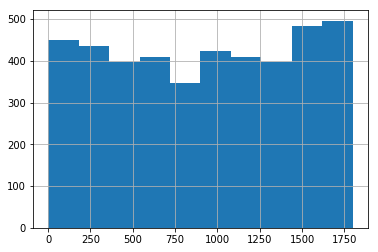

In [37]:
data["time_difference"].hist()

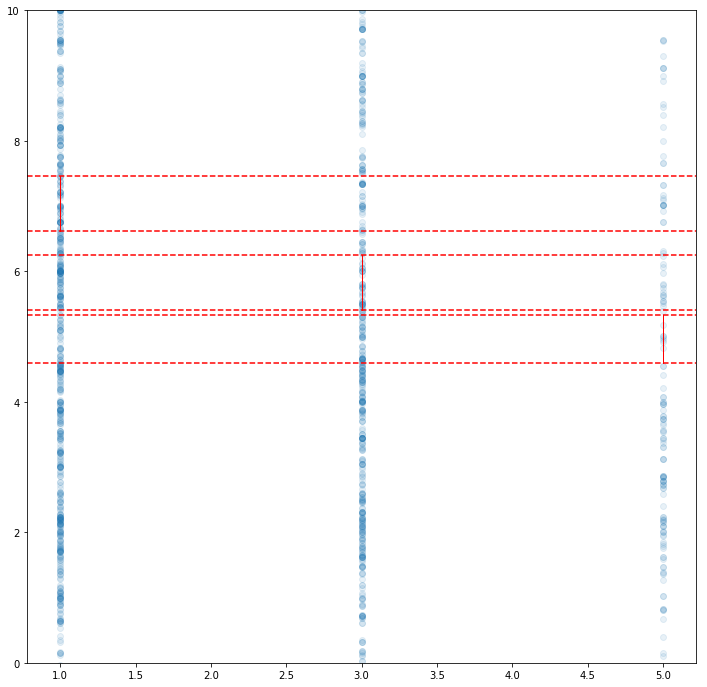

In [78]:
non_nan = [not np.isnan(i) for i in data['manual_Triage']]

plt.gcf().set_size_inches(12,12)

data_non_nan = data[non_nan]
data_1 = data_non_nan[data_non_nan['manual_Triage']==1]['temp']-273.15
data_3 = data_non_nan[data_non_nan['manual_Triage']==3]['temp']-273.15
data_5 = data_non_nan[data_non_nan['manual_Triage']==5]['temp']-273.15

plt.plot([1.0,1.0],
         [np.mean(data_1)-3*np.std(data_1)/np.sqrt(len(data_non_nan)),
          np.mean(data_1)+3*np.std(data_1)/np.sqrt(len(data_non_nan))], c='red', linewidth='1.0')

plt.plot([3.0,3.0],
         [np.mean(data_3)-3*np.std(data_3)/np.sqrt(len(data_non_nan)),
          np.mean(data_3)+3*np.std(data_3)/np.sqrt(len(data_non_nan))], c='red', linewidth='1.0')

plt.plot([5.0,5.0],
         [np.mean(data_5)-3*np.std(data_5)/np.sqrt(len(data_non_nan)),
          np.mean(data_5)+3*np.std(data_5)/np.sqrt(len(data_non_nan))], c='red', linewidth='1.0')

plt.axhline(np.mean(data_1)-3*np.std(data_1)/np.sqrt(len(data_non_nan)),c='red',ls='--')
plt.axhline(np.mean(data_1)+3*np.std(data_1)/np.sqrt(len(data_non_nan)),c='red',ls='--')

plt.axhline(np.mean(data_3)-3*np.std(data_3)/np.sqrt(len(data_non_nan)),c='red',ls='--')
plt.axhline(np.mean(data_3)+3*np.std(data_3)/np.sqrt(len(data_non_nan)),c='red',ls='--')

plt.axhline(np.mean(data_5)-3*np.std(data_5)/np.sqrt(len(data_non_nan)),c='red',ls='--')
plt.axhline(np.mean(data_5)+3*np.std(data_5)/np.sqrt(len(data_non_nan)),c='red',ls='--')

plt.scatter(data['manual_Triage'][non_nan], (data['temp']-273.15)[non_nan], alpha=0.1)
plt.ylim([0,10])
plt.show()

In [55]:
?plt.hist

/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


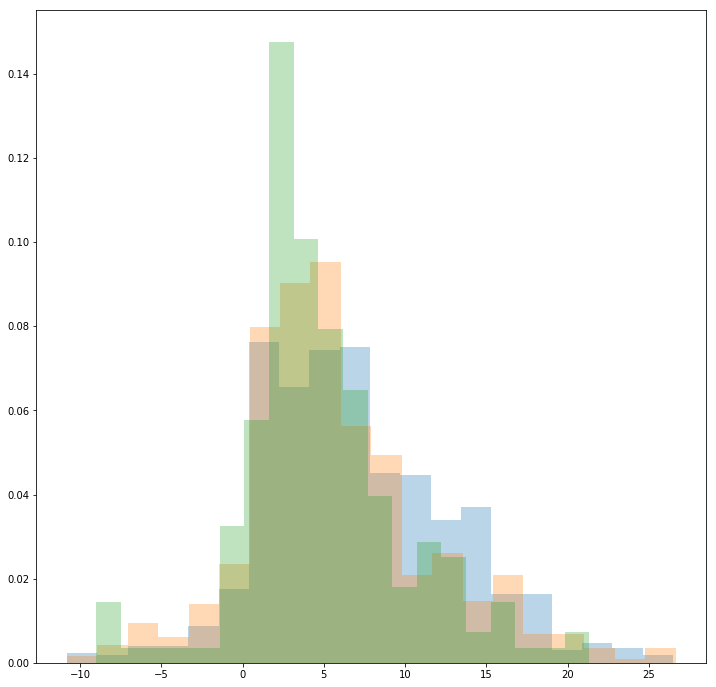

In [52]:
non_nan = [not np.isnan(i) for i in data['manual_Triage']]

data_non_nan = data[non_nan]
data_1 = data_non_nan[data_non_nan['manual_Triage']==1]['temp']-273.15
data_3 = data_non_nan[data_non_nan['manual_Triage']==3]['temp']-273.15
data_5 = data_non_nan[data_non_nan['manual_Triage']==5]['temp']-273.15

plt.gcf().set_size_inches(12,12)

bins = 20

plt.hist(data_1, alpha=0.3, bins=bins, normed=True)
plt.hist(data_3, alpha=0.3, bins=bins, normed=True)
plt.hist(data_5, alpha=0.3, bins=bins, normed=True)

plt.show()

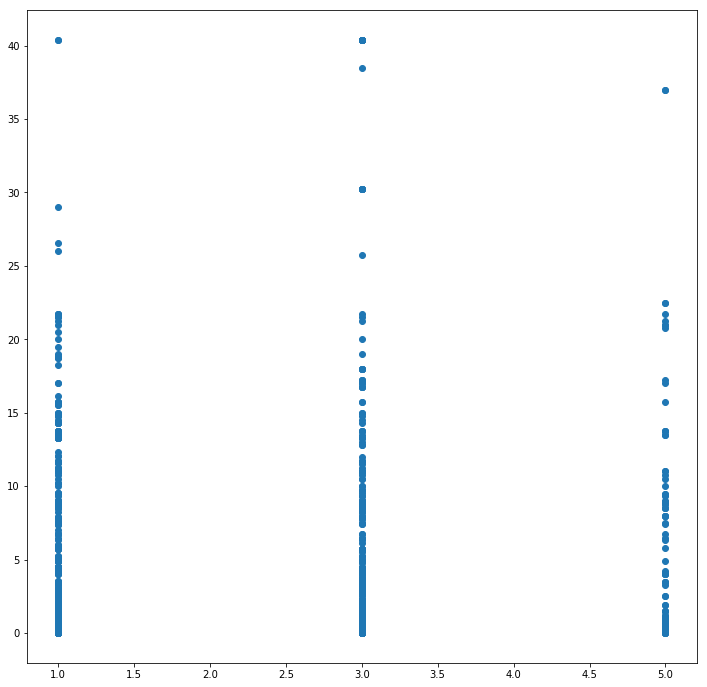

In [42]:
non_nan = [not np.isnan(i) for i in data['manual_Triage']]

plt.gcf().set_size_inches(12,12)
plt.scatter(data['manual_Triage'][non_nan], data['rain_3h'][non_nan])
std1 = np.stdev()
#plt.ylim([60,100])
plt.show()

/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarn

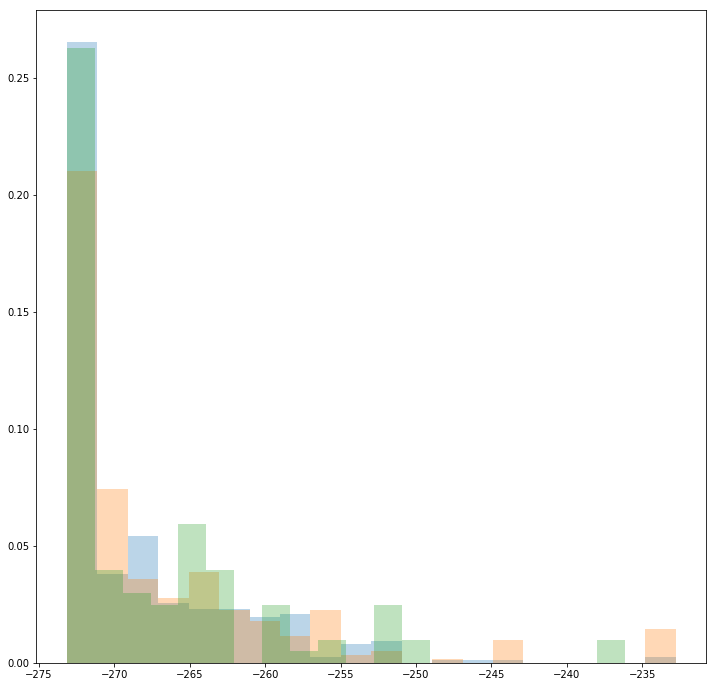

In [53]:
non_nan = [not np.isnan(i) for i in data['manual_Triage']]

data_non_nan = data[non_nan]
data_1 = data_non_nan[data_non_nan['manual_Triage']==1]['rain_3h']-273.15
data_3 = data_non_nan[data_non_nan['manual_Triage']==3]['rain_3h']-273.15
data_5 = data_non_nan[data_non_nan['manual_Triage']==5]['rain_3h']-273.15

plt.gcf().set_size_inches(12,12)

bins = 20

plt.hist(data_1, alpha=0.3, bins=bins, normed=True)
plt.hist(data_3, alpha=0.3, bins=bins, normed=True)
plt.hist(data_5, alpha=0.3, bins=bins, normed=True)

plt.show()

In [39]:
data['manual_Triage']

0       NaN
1       3.0
2       3.0
3       3.0
4       1.0
5       NaN
6       NaN
7       1.0
8       1.0
9       1.0
10      3.0
11      NaN
12      1.0
13      1.0
14      1.0
15      NaN
16      3.0
17      1.0
18      1.0
19      3.0
20      NaN
21      5.0
22      3.0
23      1.0
24      1.0
25      1.0
26      1.0
27      NaN
28      1.0
29      1.0
       ... 
6788    NaN
6789    1.0
6790    NaN
6791    1.0
6792    1.0
6793    1.0
6794    1.0
6795    1.0
6796    NaN
6797    NaN
6798    NaN
6799    NaN
6800    NaN
6801    NaN
6802    NaN
6803    NaN
6804    NaN
6805    1.0
6806    1.0
6807    1.0
6808    NaN
6809    NaN
6810    1.0
6811    NaN
6812    1.0
6813    1.0
6814    1.0
6815    1.0
6816    NaN
6817    NaN
Name: manual_Triage, Length: 4249, dtype: float64

In [9]:
empty_zero_columns = ['rain_1h', 'rain_3h', 'rain_24h', 'snow_1h', 'snow_3h', 'snow_24h']
for i in empty_zero_columns:
    data[i] = data[i].fillna(0)
# Don't mind the warning

/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [10]:
np.corrcoef(data['Pulse'][non_nan], data['SO2'][non_nan])

array([[nan, nan],
       [nan,  1.]])

In [11]:
data.columns

Index(['Merida ID', 'Assess_Date_With_Time', 'Region', 'Merida ID.1',
       'Patient_Group', 'Assess_Date_With_Time.1', 'Assess_date_No_Time',
       'SO2', 'Pulse', 'Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'CQ1', 'CQ2',
       'CQ3', 'CQ4', 'CQ5', 'CQ6', 'CQ7', 'CQ8', 'OverWrite',
       'question_Triage', 'pulse_Triage', 'spo2_Triage', 'manual_Triage',
       'ReferenceValueId', 'SpO2ReferenceValue', 'PulseReferenceValue',
       'SpO2RedLimitVariation', 'SpO2YellowLimitVariation',
       'PulseRedLimitUpper', 'PulseRedLimitLower', 'PulseRedLimitVariation',
       'PulseYellowLimitVariation', 'patients_only_date', 'patients_only_time',
       'dt', 'dt_iso', 'city_id', 'city_name', 'lat', 'lon', 'temp',
       'temp_min', 'temp_max', 'pressure', 'sea_level', 'grnd_level',
       'humidity', 'wind_speed', 'wind_deg', 'rain_1h', 'rain_3h', 'rain_24h',
       'rain_today', 'snow_1h', 'snow_3h', 'snow_24h', 'snow_today',
       'clouds_all', 'weather_id', 'weather_main', 'weather_descr

In [12]:
data['rain_1h'][[not np.isnan(i) for i in data['rain_1h']]]

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
5       0.0
6       0.0
7       0.0
8       0.0
9       0.0
10      0.0
11      0.0
12      0.0
13      0.0
14      0.0
15      0.0
16      0.0
17      0.0
18      0.0
19      0.0
20      0.0
21      0.0
22      0.0
23      0.0
24      0.0
25      0.0
26      0.0
27      0.0
28      0.0
29      0.0
       ... 
6788    0.0
6789    0.0
6790    0.0
6791    0.0
6792    0.0
6793    0.0
6794    0.0
6795    0.0
6796    0.0
6797    0.0
6798    0.0
6799    0.0
6800    0.0
6801    0.0
6802    0.0
6803    0.0
6804    0.0
6805    0.0
6806    0.0
6807    0.0
6808    0.0
6809    0.0
6810    0.0
6811    0.0
6812    0.0
6813    0.0
6814    0.0
6815    0.0
6816    0.0
6817    0.0
Name: rain_1h, Length: 4249, dtype: float64

In [35]:
interesting_columns_patient = ['SO2', 'Pulse', 'Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'CQ1', 'CQ2',
       'CQ3', 'CQ4', 'CQ5', 'CQ6', 'CQ7', 'CQ8',
       'question_Triage', 'pulse_Triage', 'spo2_Triage', 'manual_Triage',
       'SpO2ReferenceValue', 'PulseReferenceValue',
       'SpO2RedLimitVariation', 'SpO2YellowLimitVariation',
       'PulseRedLimitUpper', 'PulseRedLimitLower', 'PulseRedLimitVariation',
       'PulseYellowLimitVariation']
interesting_columns_weather = ['temp', 'pressure',
       'humidity', 'wind_speed', 'wind_deg', 'rain_1h', 'rain_3h', 'rain_24h',
       'rain_today', 'snow_1h', 'snow_3h', 'snow_24h', 'snow_today',
       'clouds_all']
avg_triage_columns = ["Avg_pulse_Triage","Avg_spo2_Triage","Avg_question_Triage","Avg_manual_Triage"]

STARTING  temp SO2


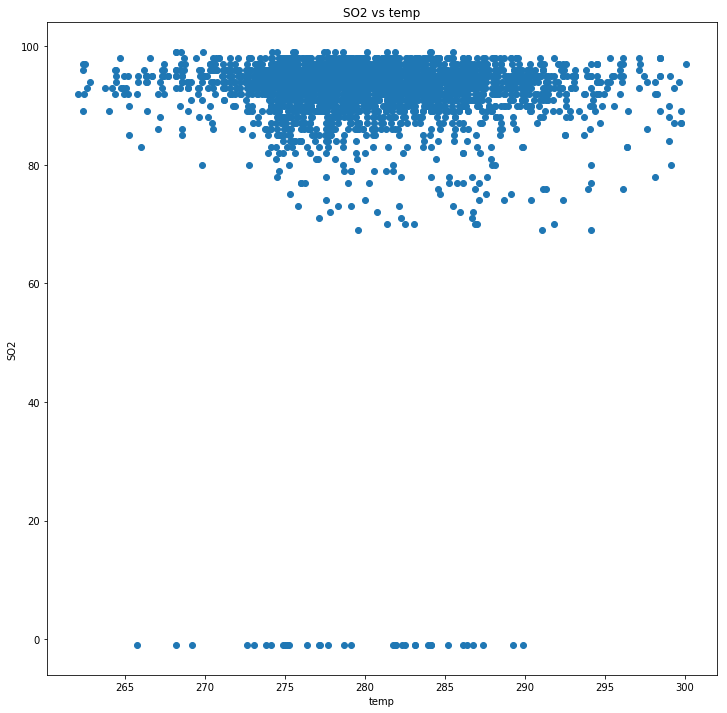

SO2 temp -0.030114464288994485
STARTING  pressure SO2


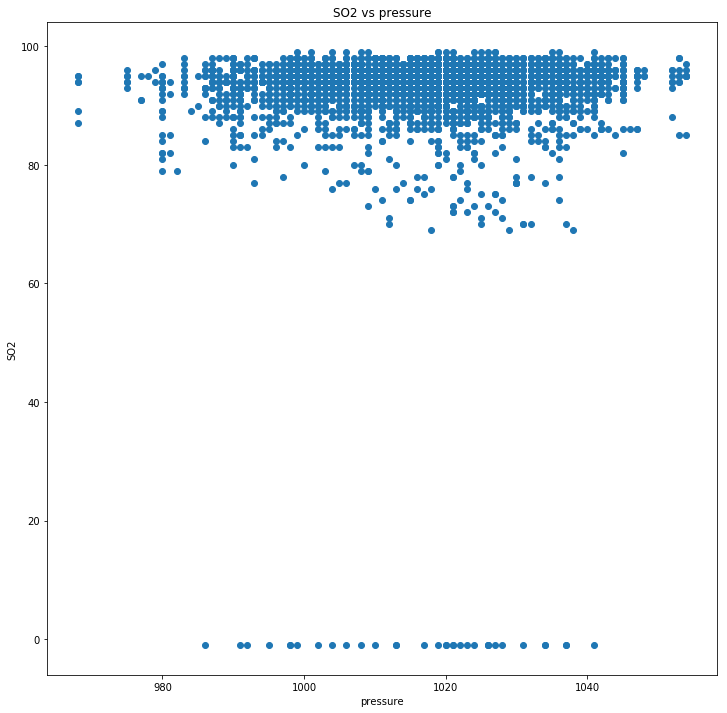

SO2 pressure 0.011479682739713946
STARTING  humidity SO2


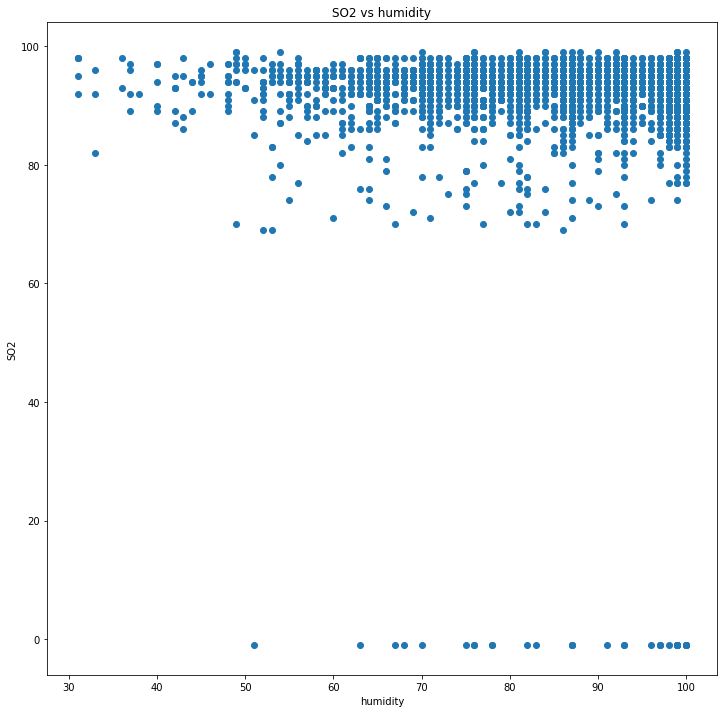

SO2 humidity -0.001957021731544528
STARTING  wind_speed SO2


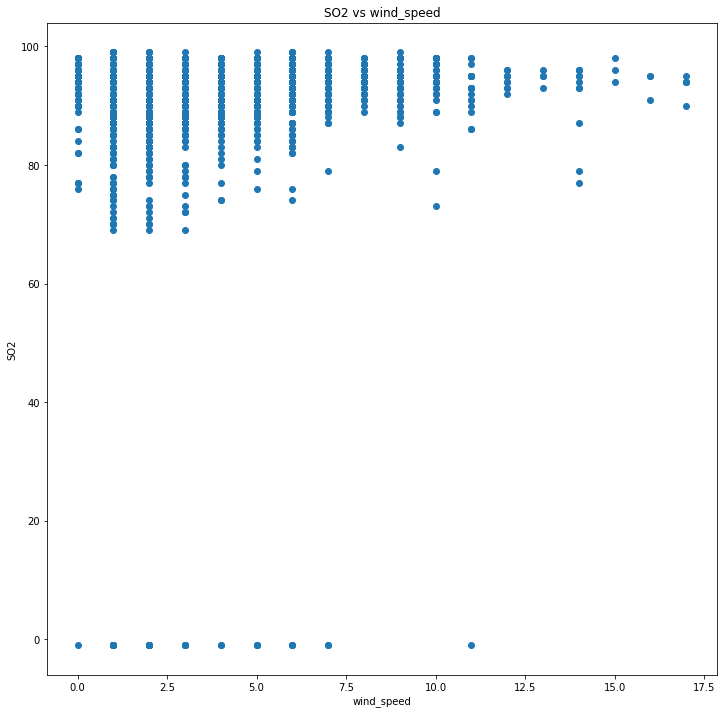

SO2 wind_speed 0.016069077768268856
STARTING  wind_deg SO2


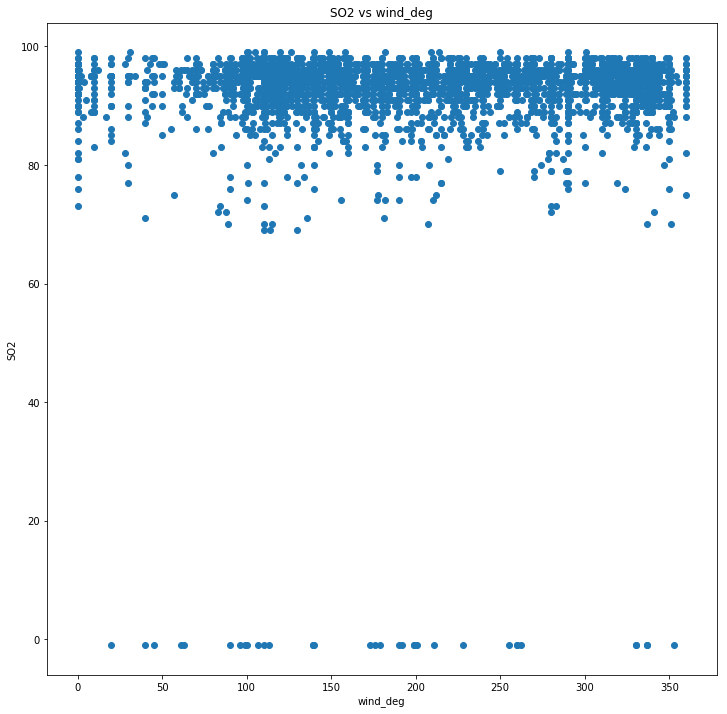

SO2 wind_deg 0.0210336769153096
STARTING  rain_1h SO2


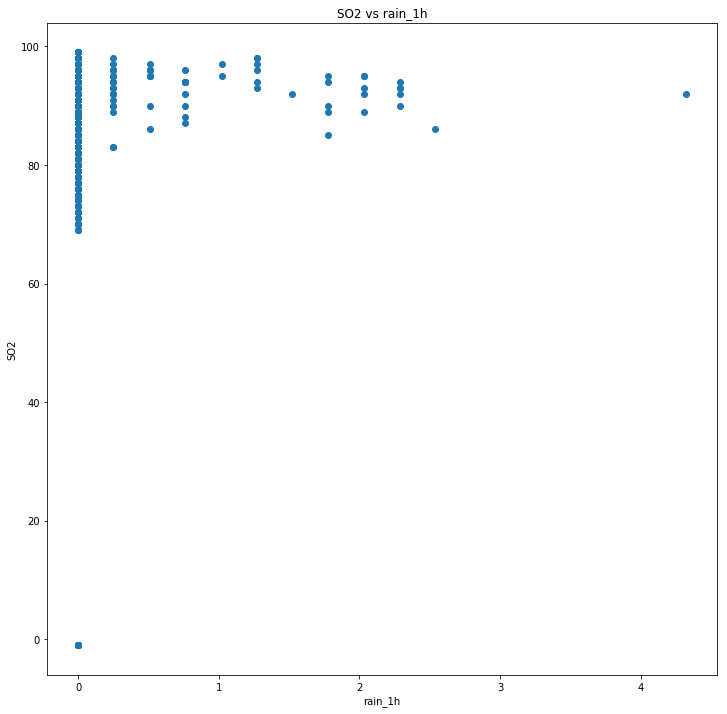

SO2 rain_1h 0.005037901293727011
STARTING  rain_3h SO2


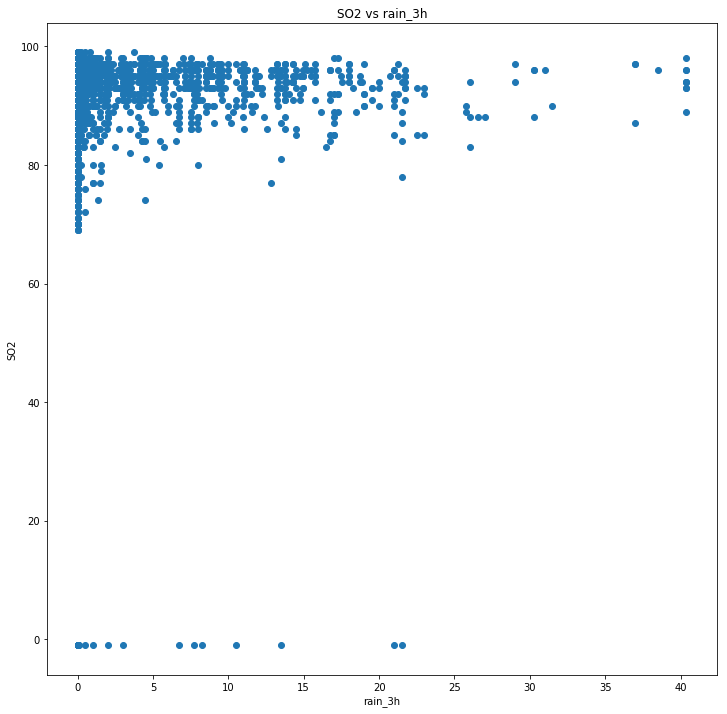

SO2 rain_3h -0.019848973463305726
STARTING  rain_24h SO2


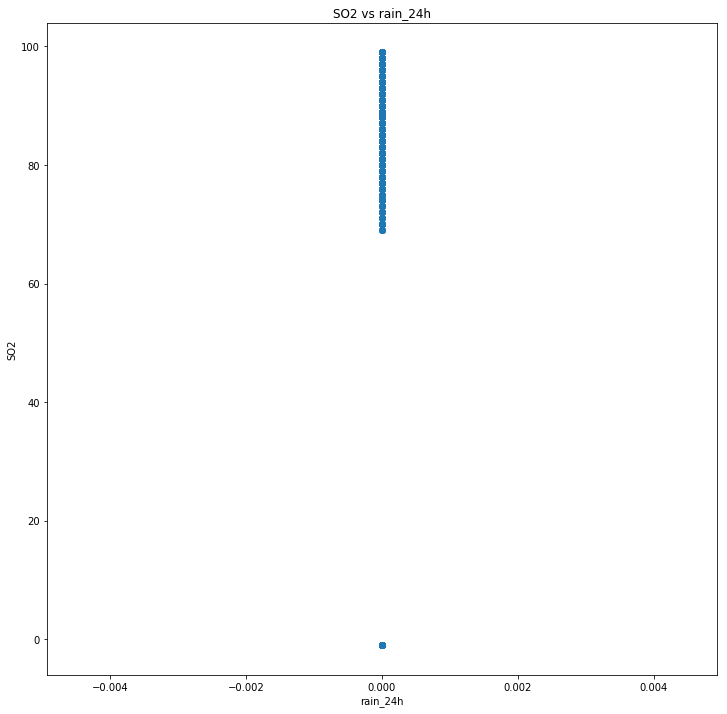

/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/numpy/lib/function_base.py:2530: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/numpy/lib/function_base.py:2531: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


SO2 rain_24h nan
STARTING  rain_today SO2


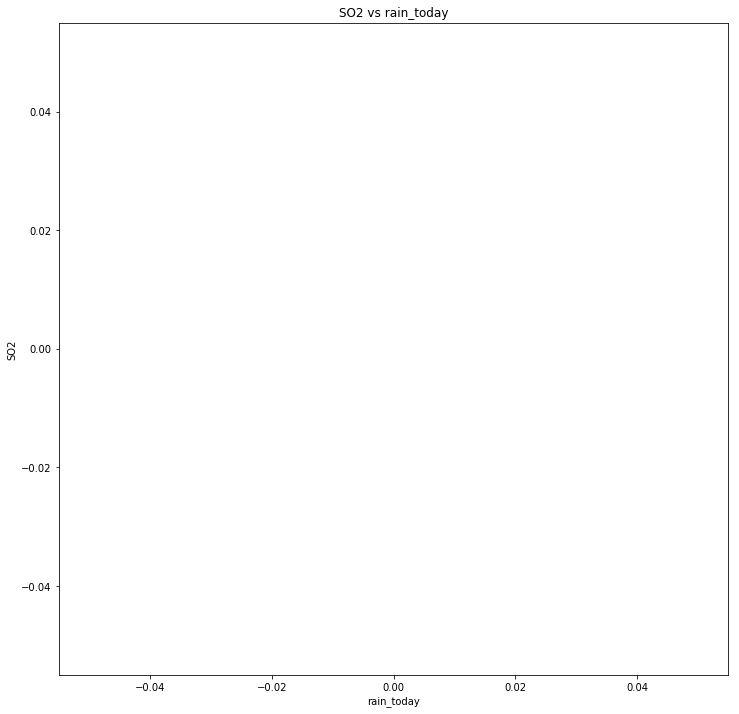

/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/numpy/lib/function_base.py:392: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/numpy/core/_methods.py:78: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/numpy/lib/function_base.py:2522: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/numpy/lib/function_base.py:2451: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
/Users/andrey.boytsov/anaconda/lib/python3.6/site-packages/numpy/lib/function_base.py:2451: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


SO2 rain_today nan
STARTING  snow_1h SO2


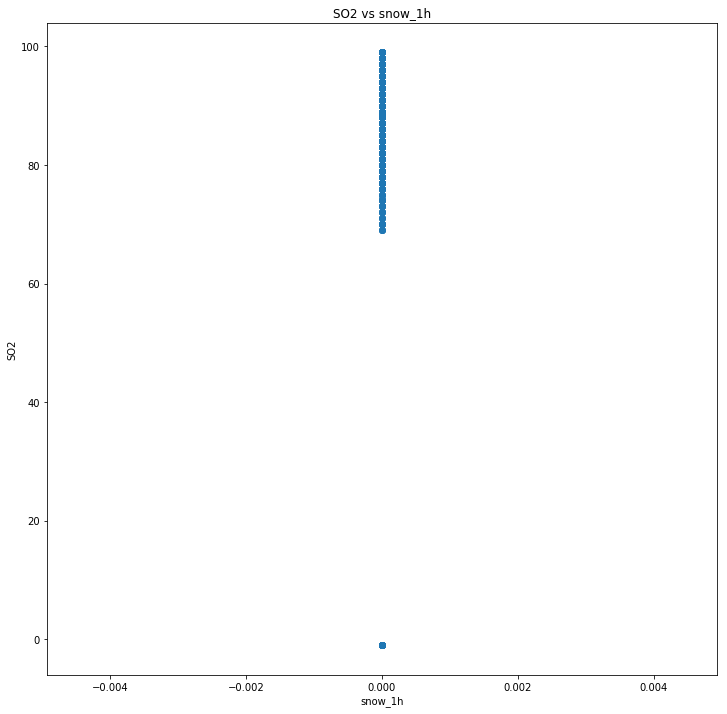

SO2 snow_1h nan
STARTING  snow_3h SO2


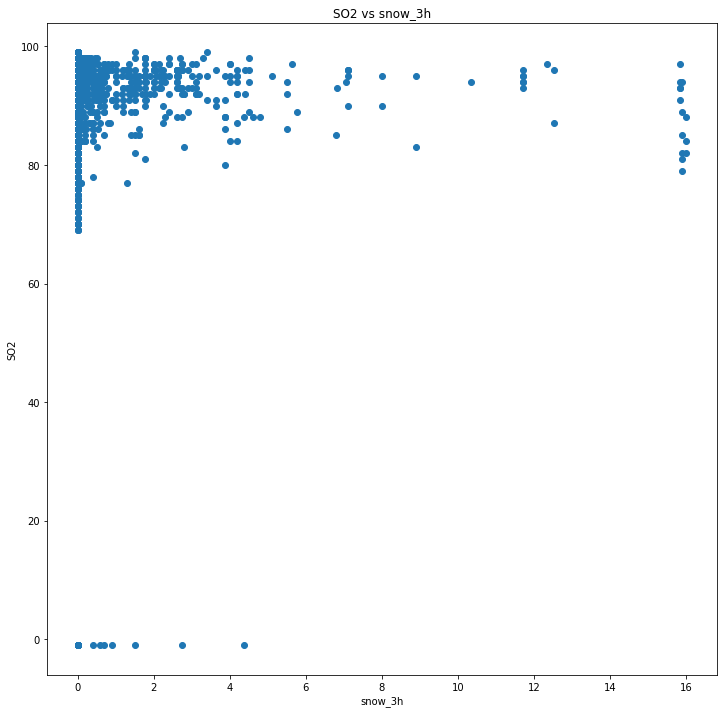

SO2 snow_3h -0.024067616401915973
STARTING  snow_24h SO2


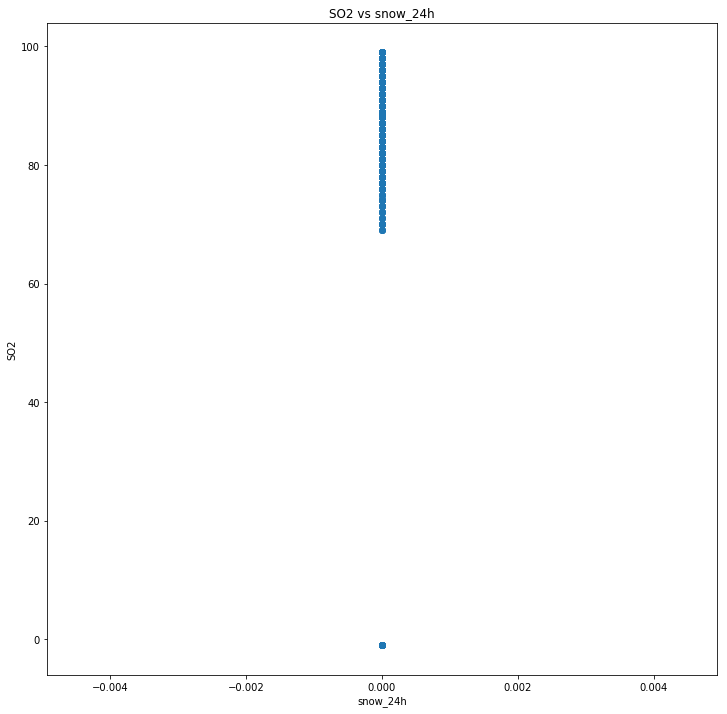

SO2 snow_24h nan
STARTING  snow_today SO2


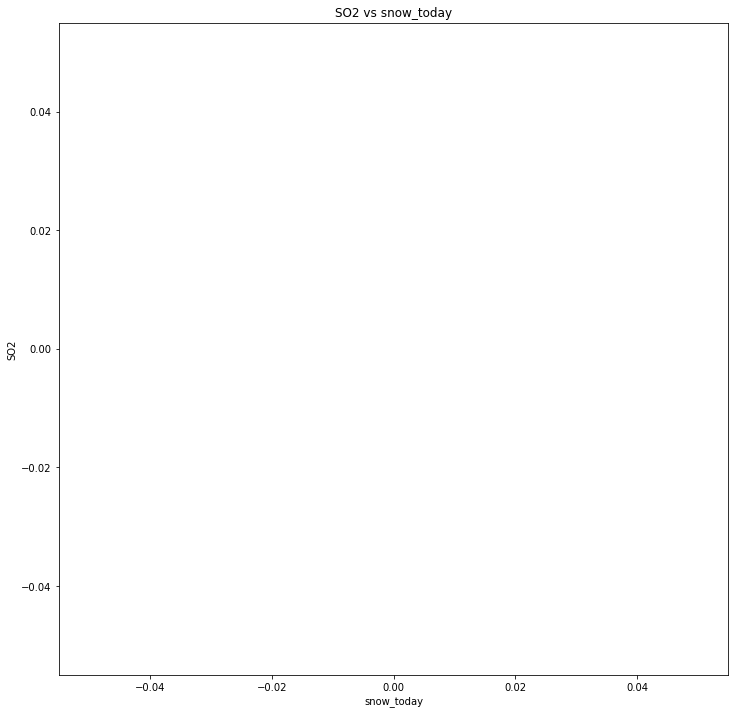

SO2 snow_today nan
STARTING  clouds_all SO2


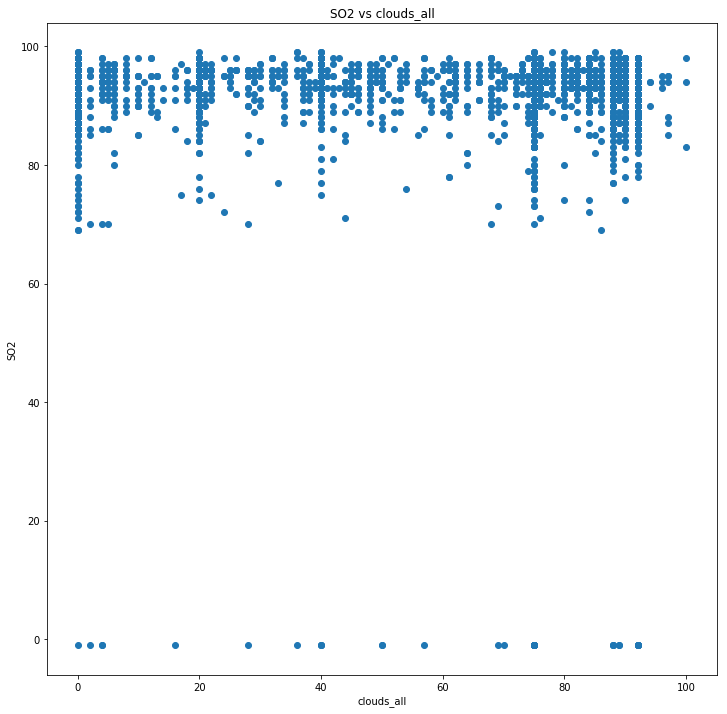

SO2 clouds_all -0.0027343286971947952
STARTING  temp Pulse


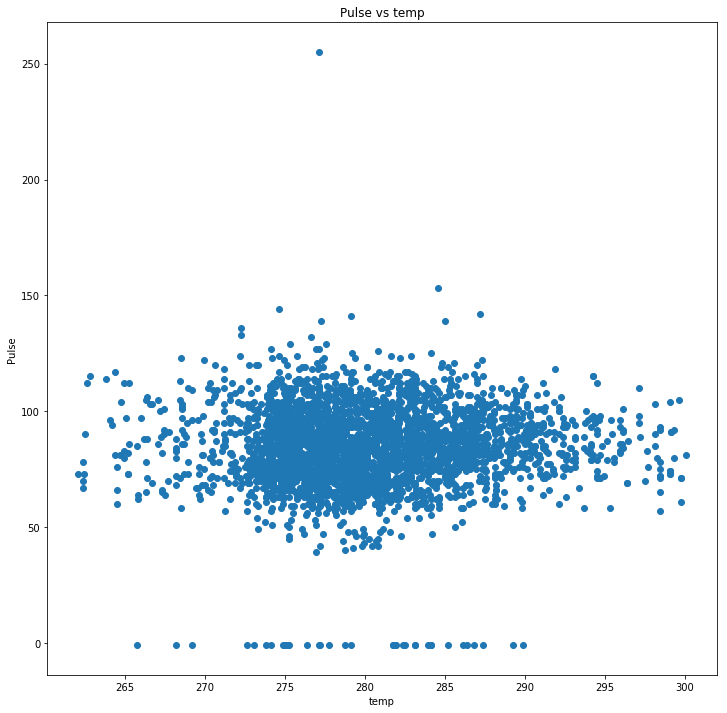

Pulse temp 0.036245186244044776
STARTING  pressure Pulse


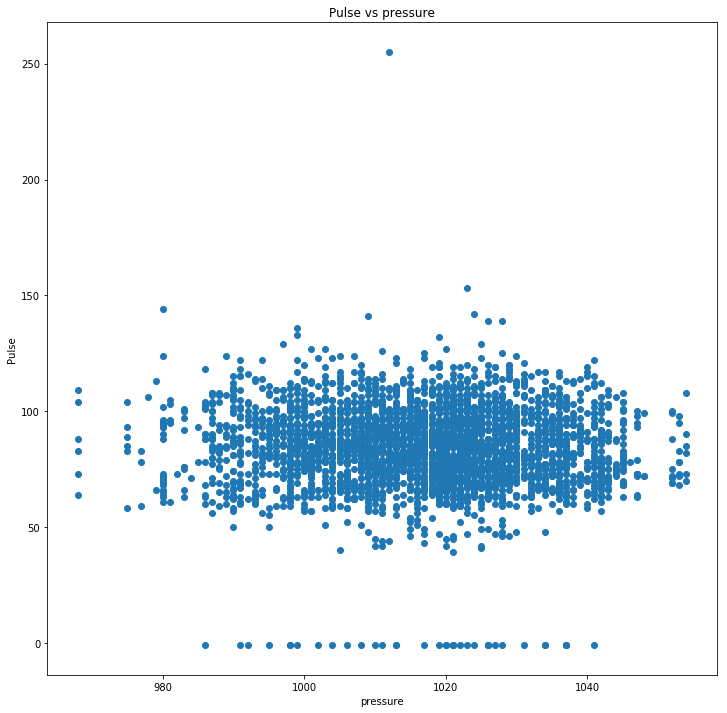

Pulse pressure -0.037765668642934215
STARTING  humidity Pulse


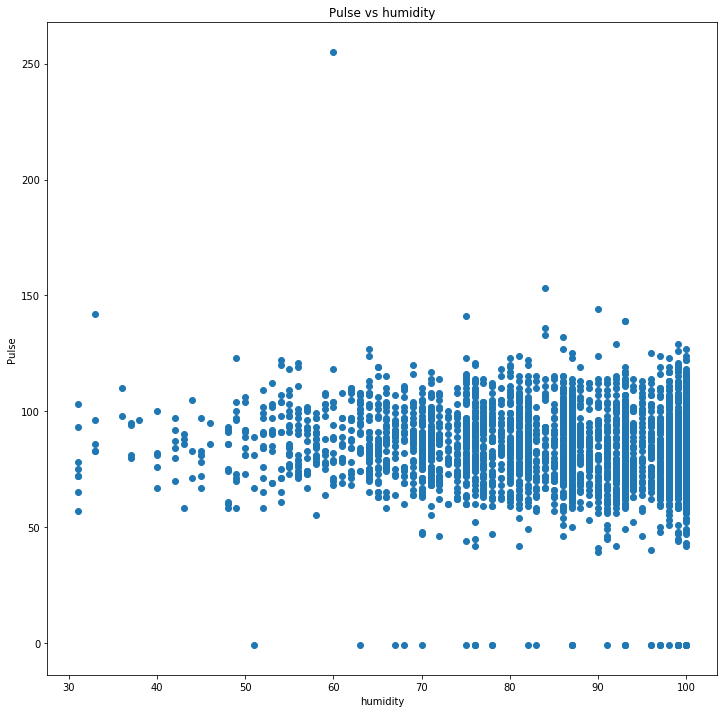

Pulse humidity -0.08006987392213055
STARTING  wind_speed Pulse


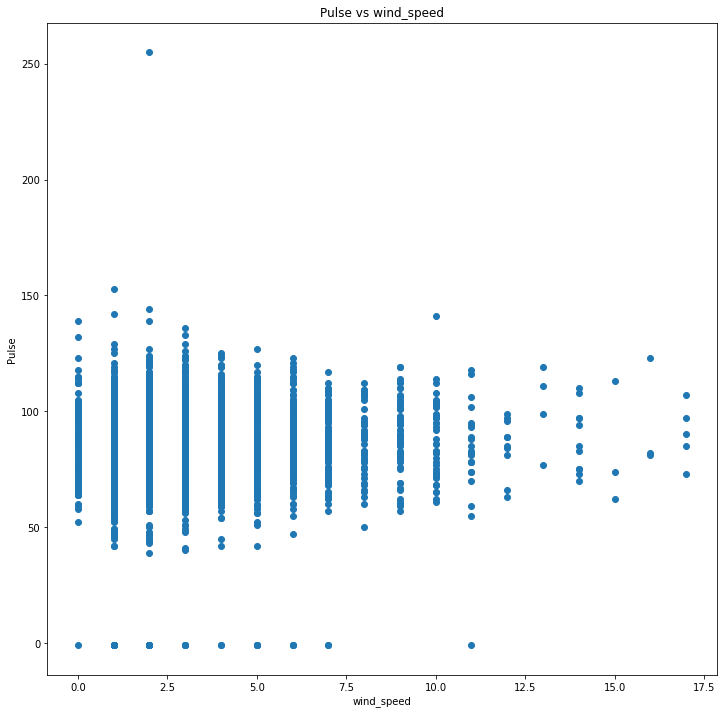

Pulse wind_speed 0.07131553562927363
STARTING  wind_deg Pulse


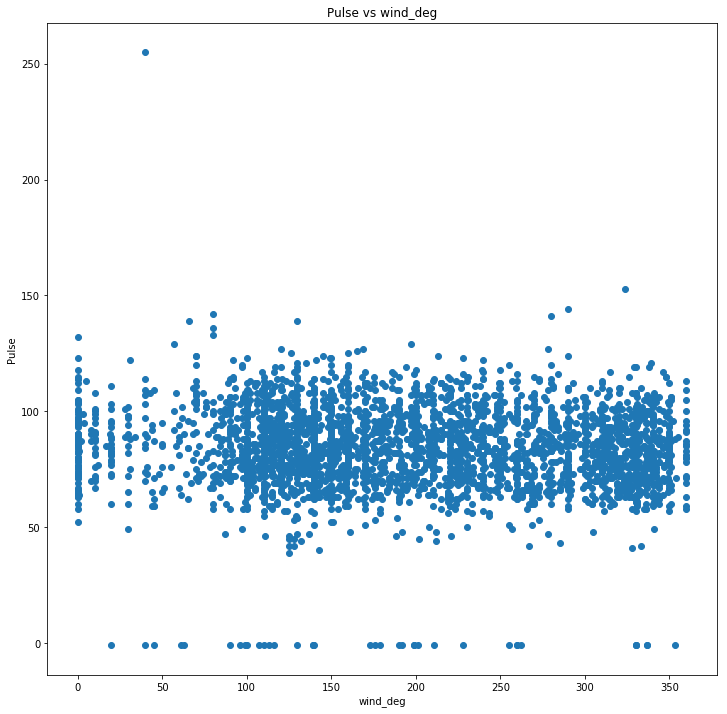

Pulse wind_deg -0.05711161091583371
STARTING  rain_1h Pulse


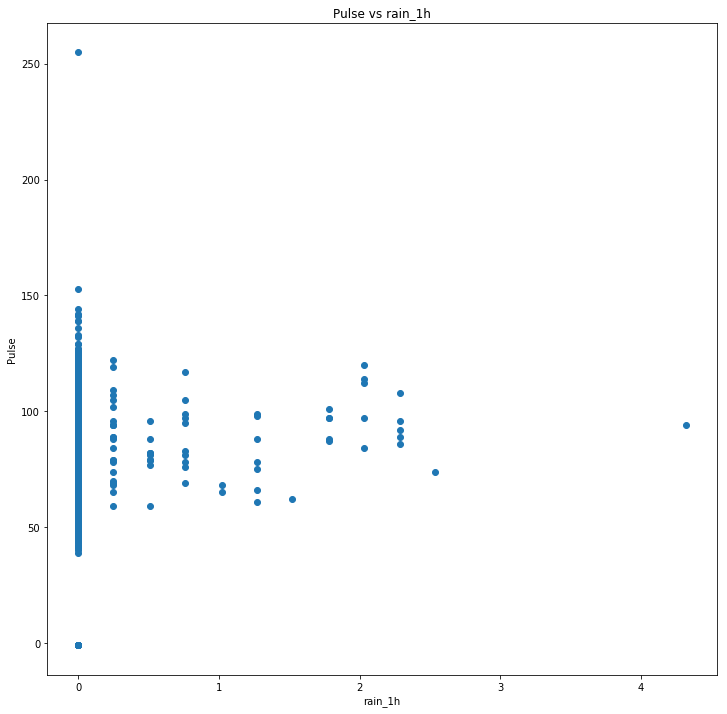

Pulse rain_1h 0.035260397944312946
STARTING  rain_3h Pulse


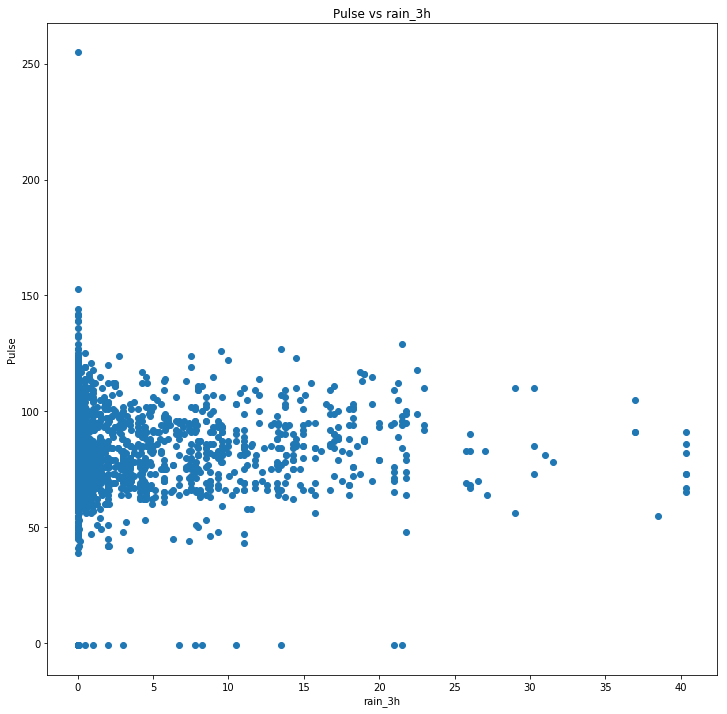

Pulse rain_3h -0.02129237022924168
STARTING  rain_24h Pulse


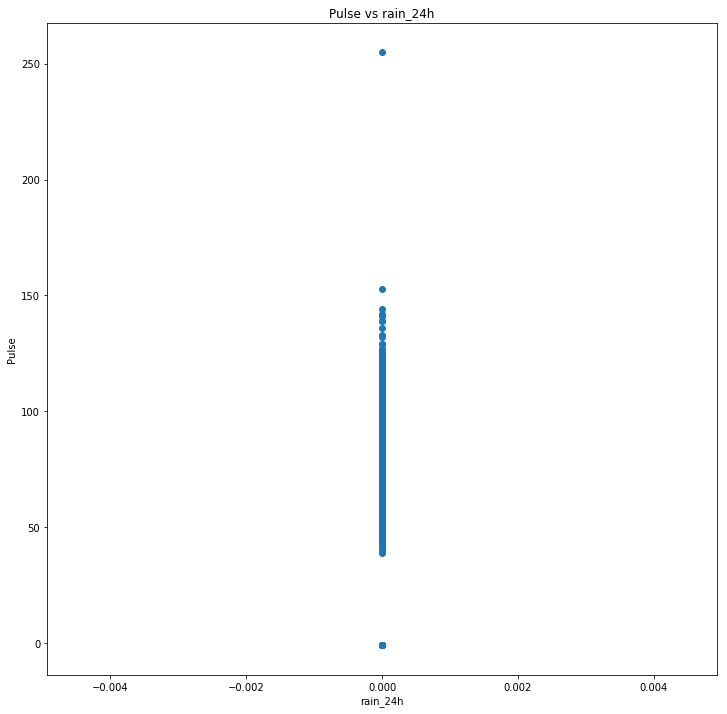

Pulse rain_24h nan
STARTING  rain_today Pulse


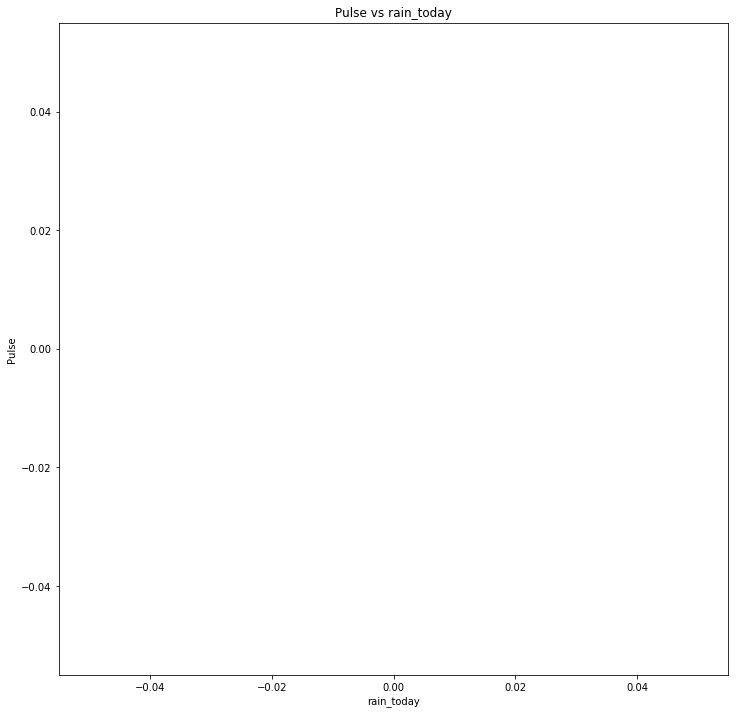

Pulse rain_today nan
STARTING  snow_1h Pulse


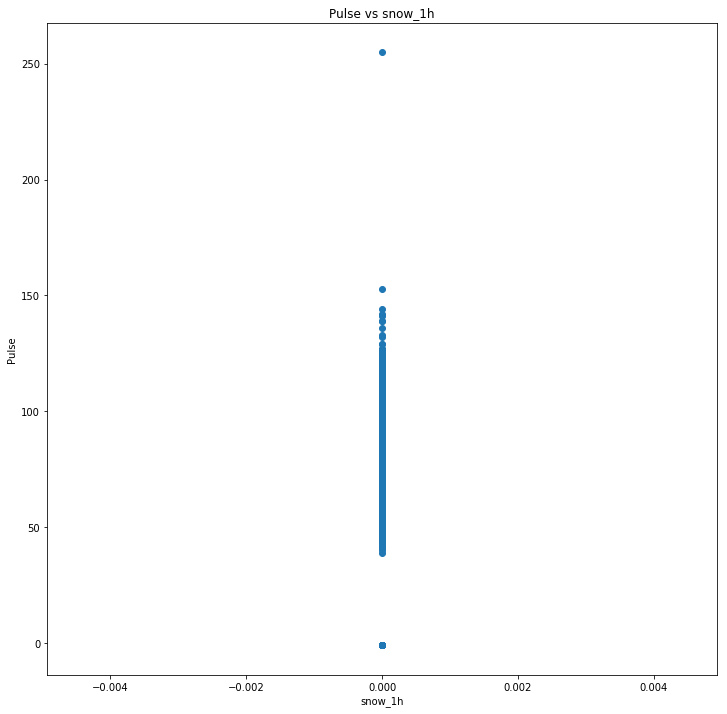

Pulse snow_1h nan
STARTING  snow_3h Pulse


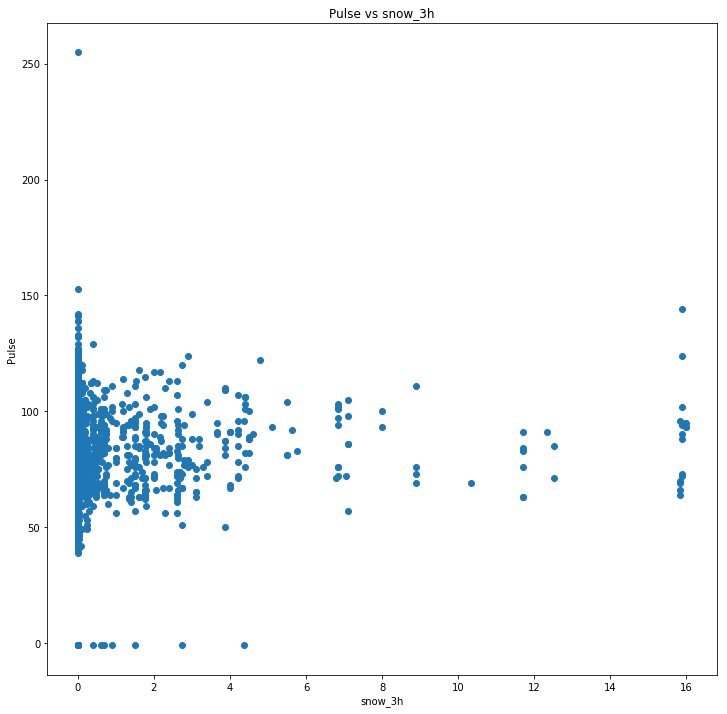

Pulse snow_3h 0.008510183604290459
STARTING  snow_24h Pulse


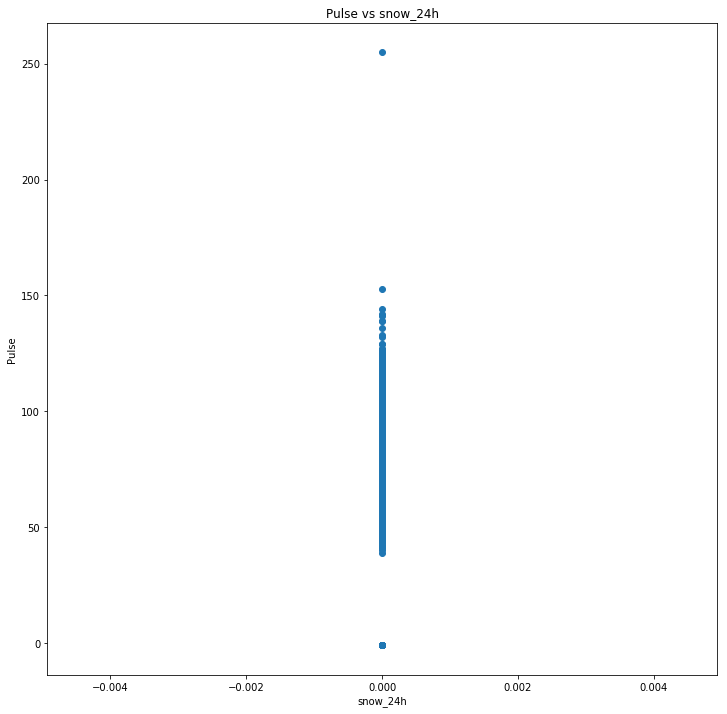

Pulse snow_24h nan
STARTING  snow_today Pulse


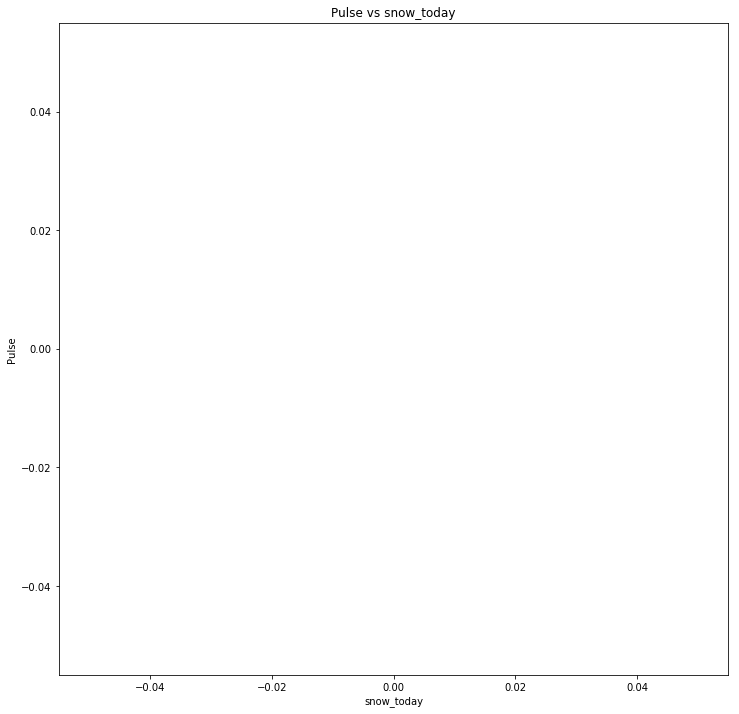

Pulse snow_today nan
STARTING  clouds_all Pulse


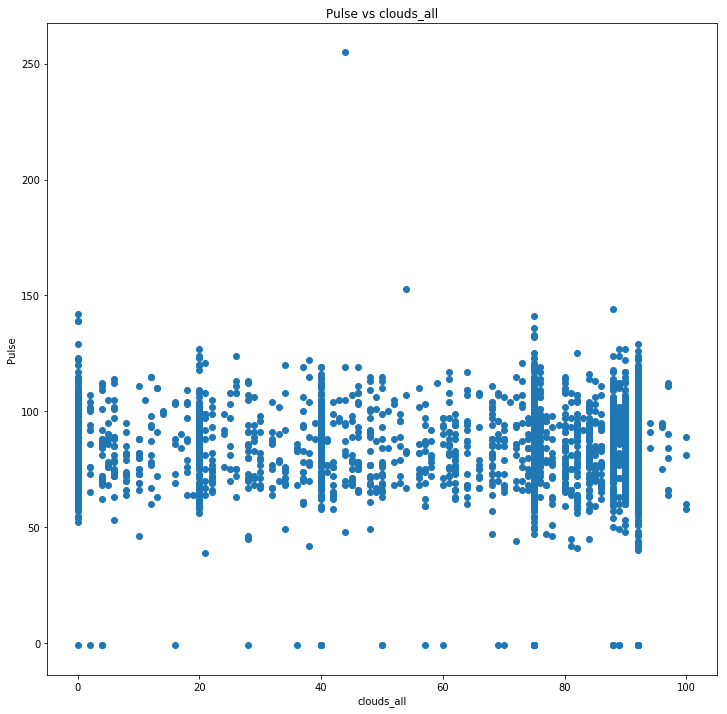

Pulse clouds_all -0.010572004705002216
STARTING  temp Q1


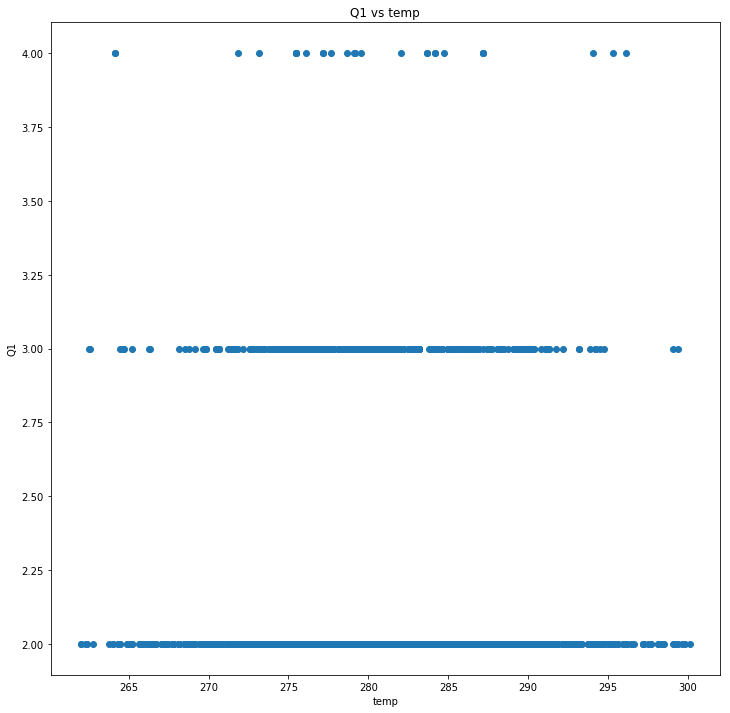

Q1 temp -0.019954151383000635
STARTING  pressure Q1


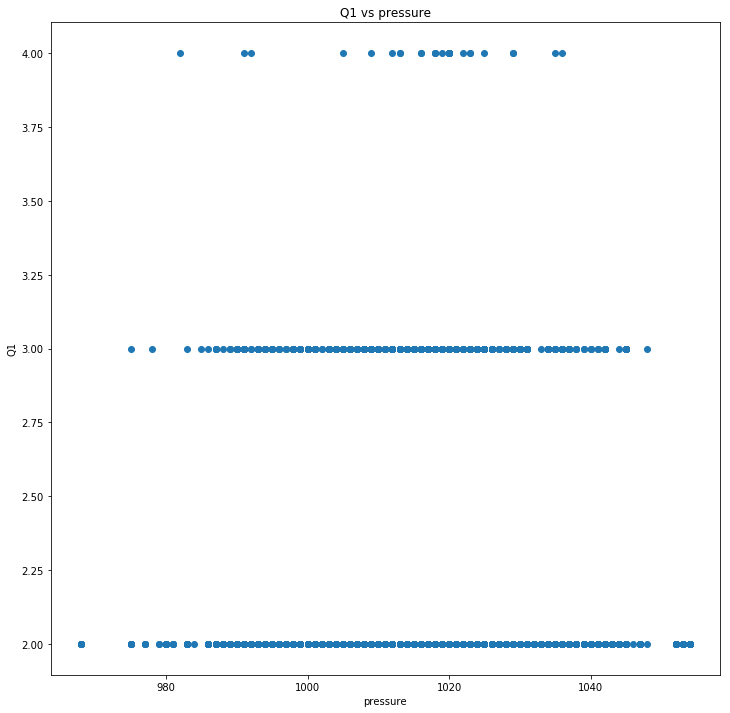

Q1 pressure -0.04992500856275474
STARTING  humidity Q1


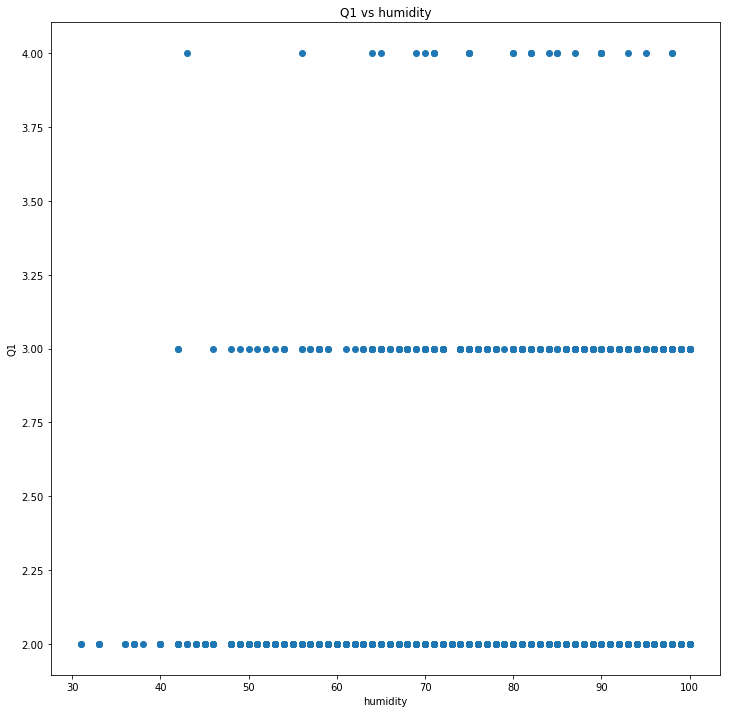

Q1 humidity -0.019714292883062326
STARTING  wind_speed Q1


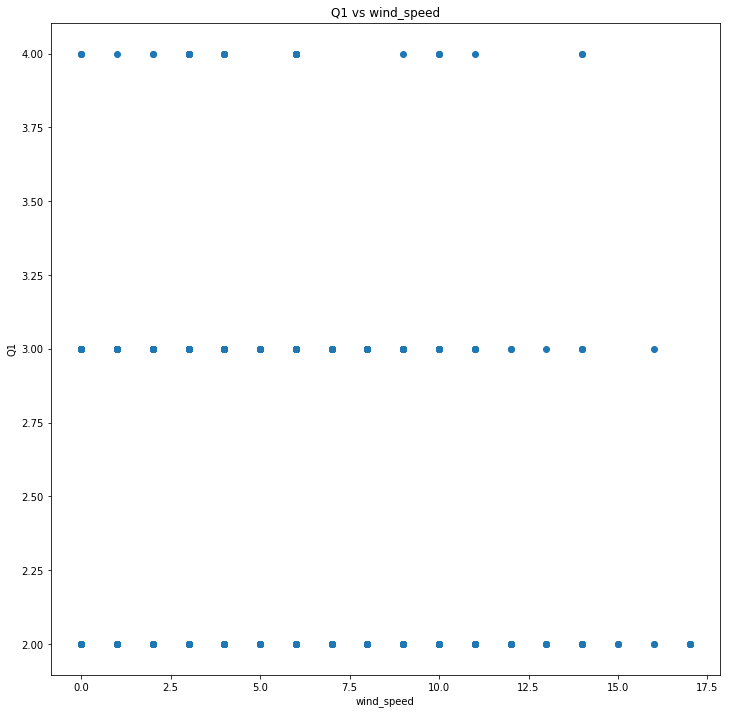

Q1 wind_speed 0.09189891178861362
STARTING  wind_deg Q1


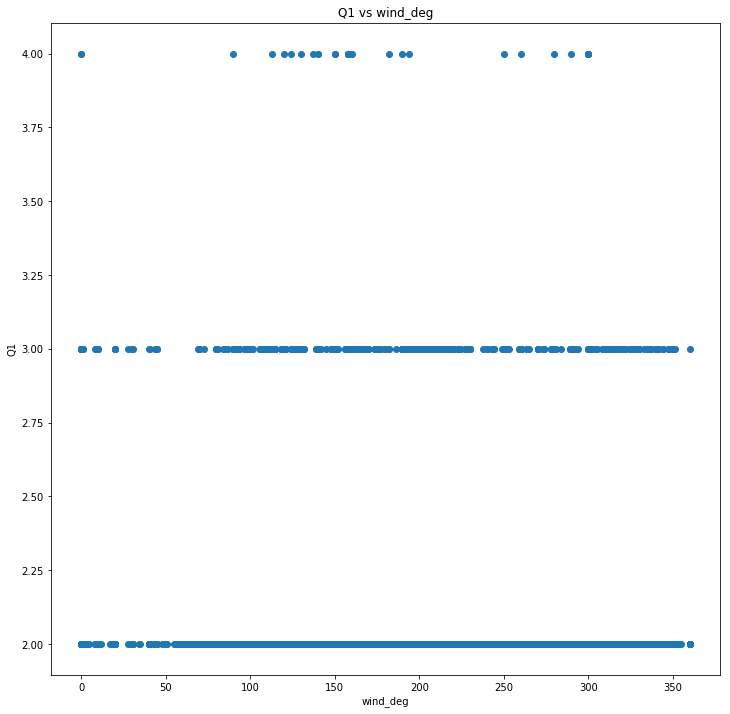

Q1 wind_deg -0.049183209672742416
STARTING  rain_1h Q1


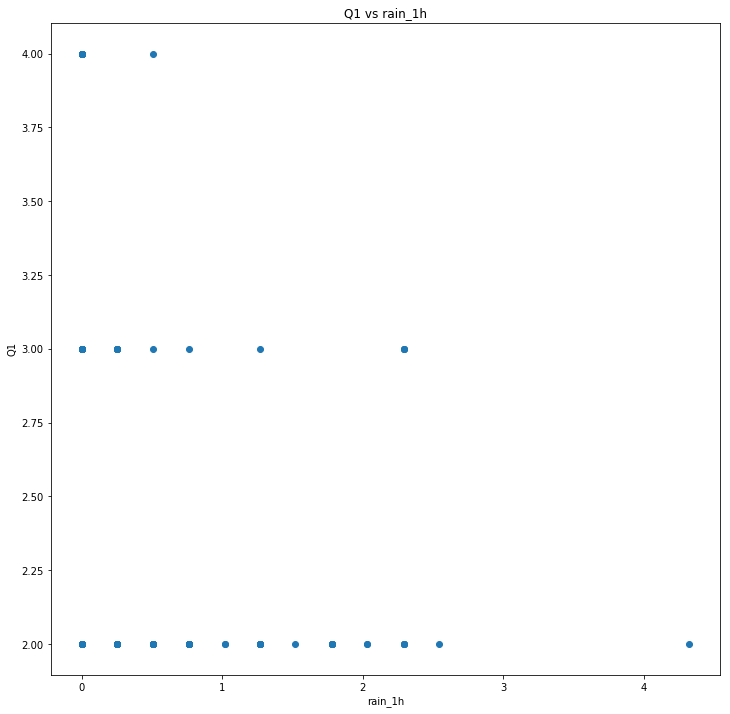

Q1 rain_1h 0.008911631416497793
STARTING  rain_3h Q1


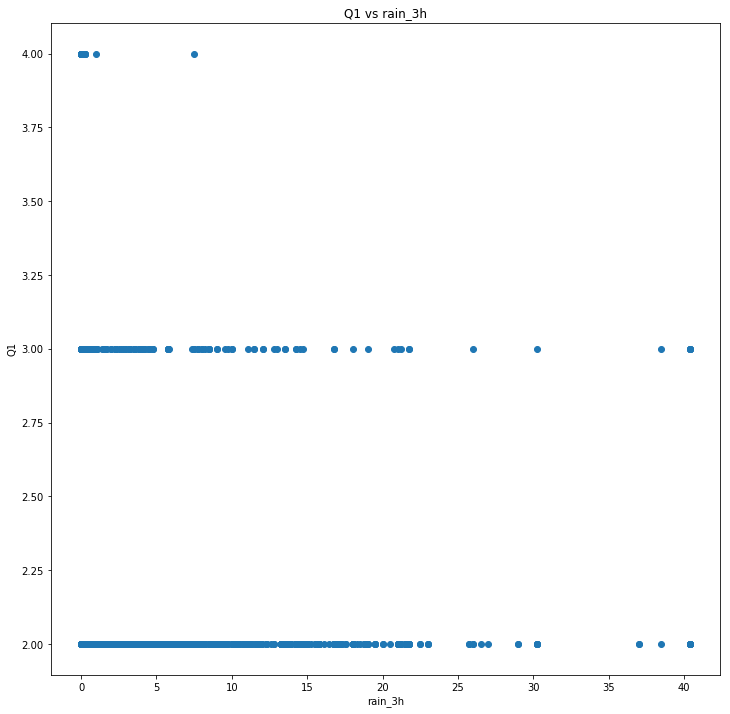

Q1 rain_3h -0.0005914688702879642
STARTING  rain_24h Q1


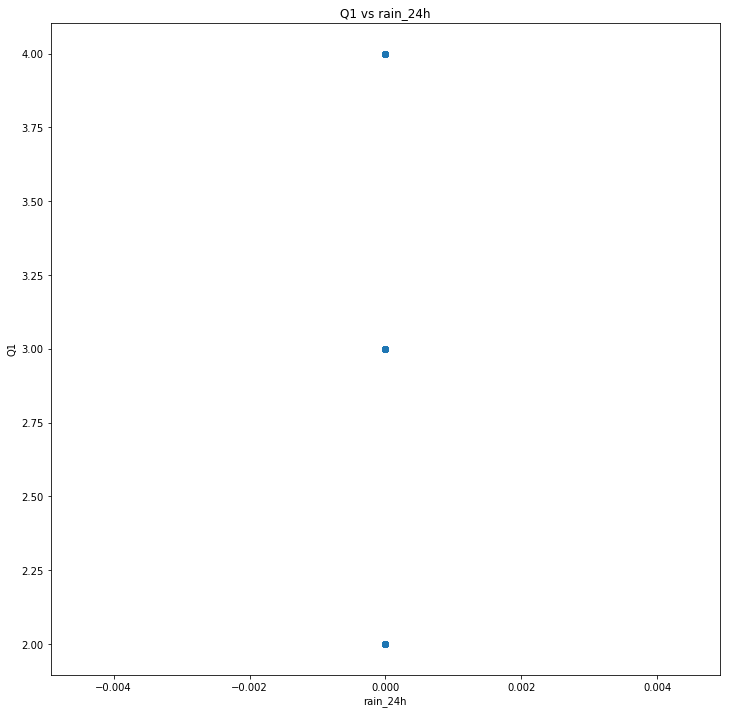

Q1 rain_24h nan
STARTING  rain_today Q1


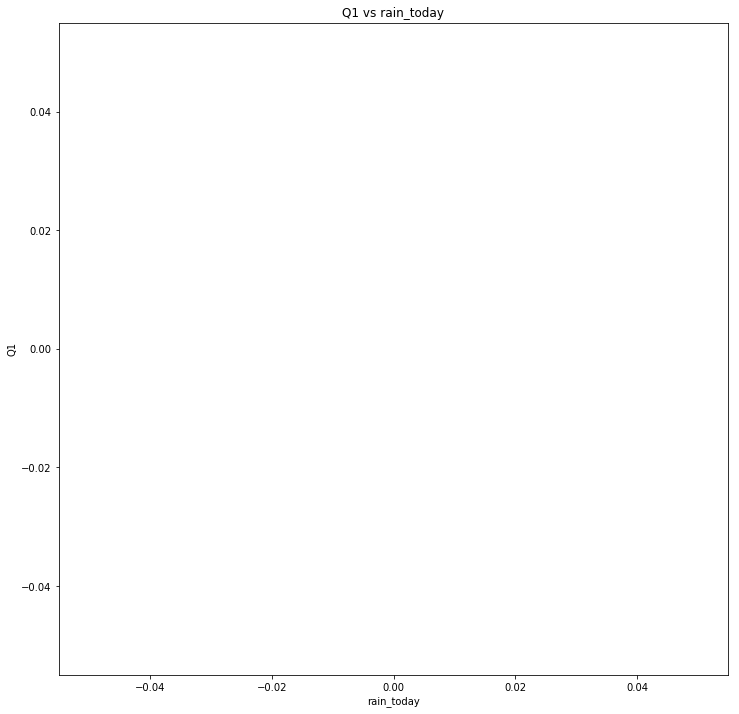

Q1 rain_today nan
STARTING  snow_1h Q1


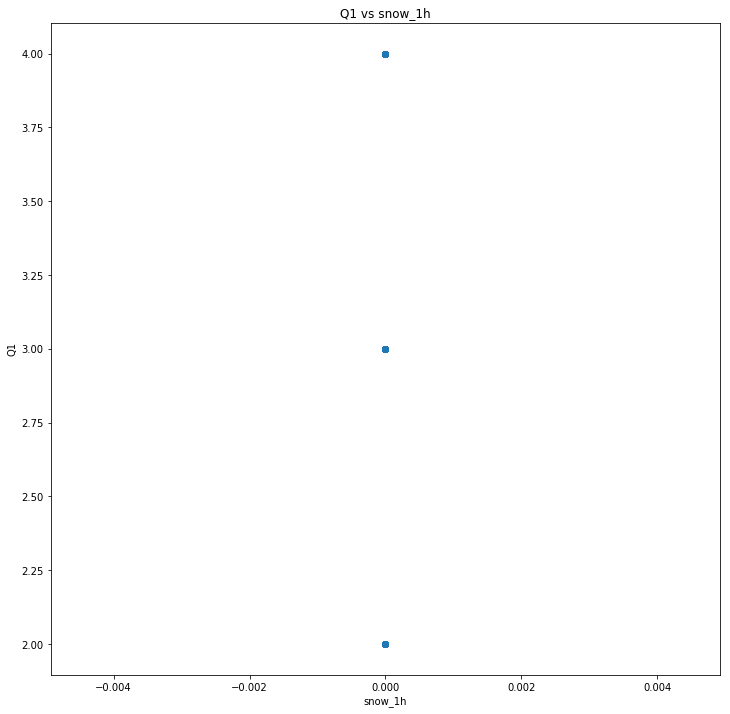

Q1 snow_1h nan
STARTING  snow_3h Q1


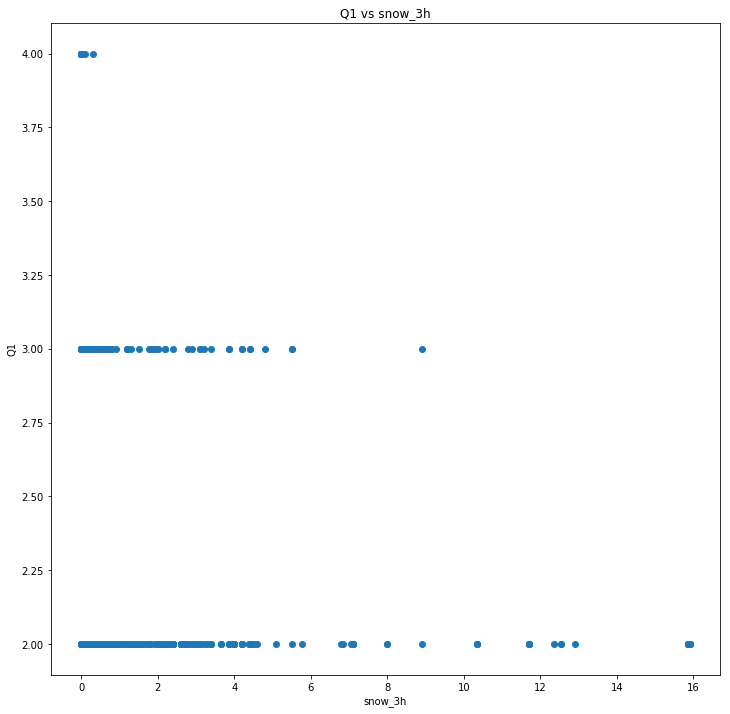

Q1 snow_3h -0.018113788538914124
STARTING  snow_24h Q1


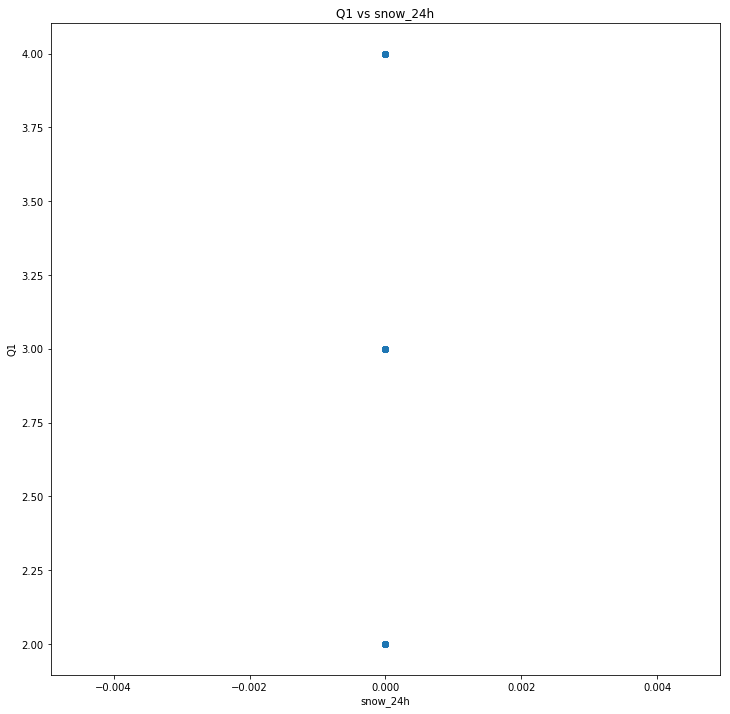

Q1 snow_24h nan
STARTING  snow_today Q1


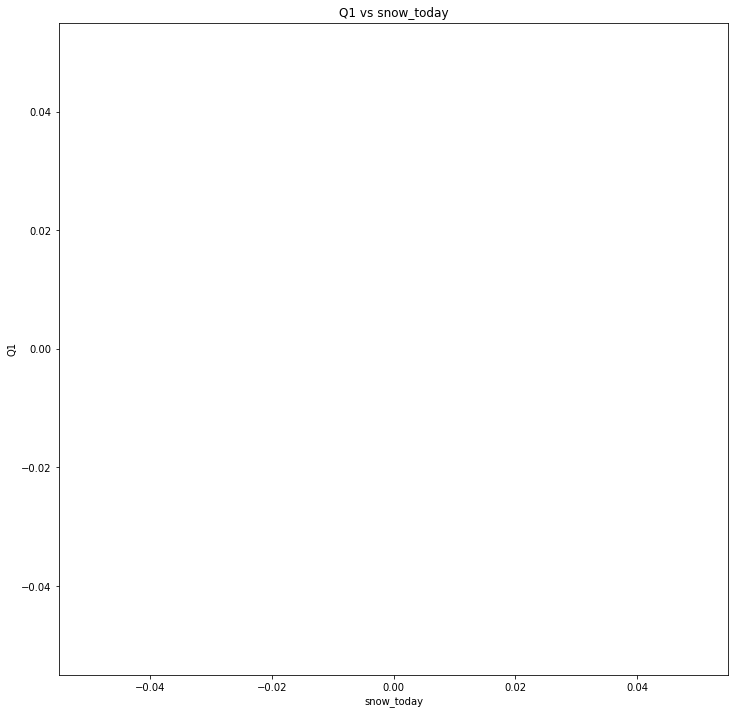

Q1 snow_today nan
STARTING  clouds_all Q1


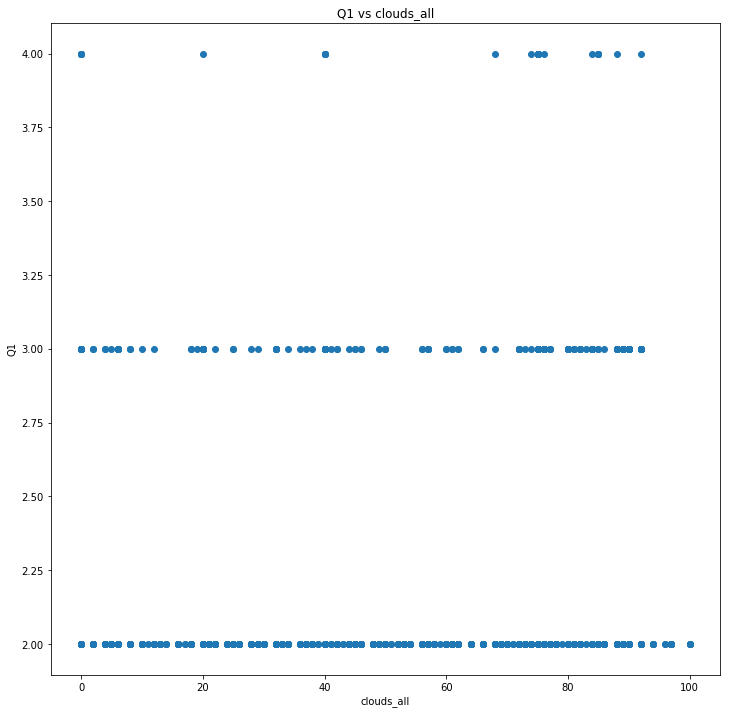

Q1 clouds_all 0.029242436690128923
STARTING  temp Q2


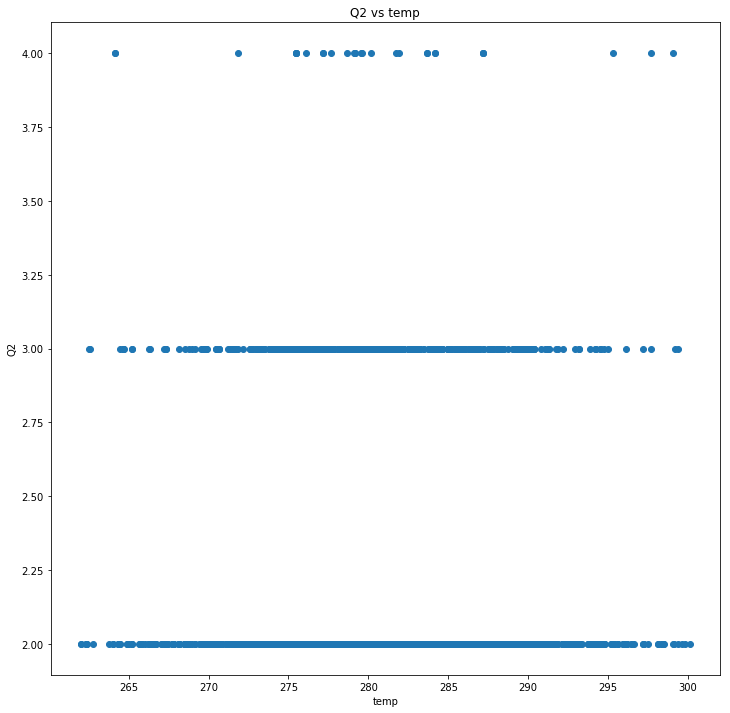

Q2 temp -0.002752359074118612
STARTING  pressure Q2


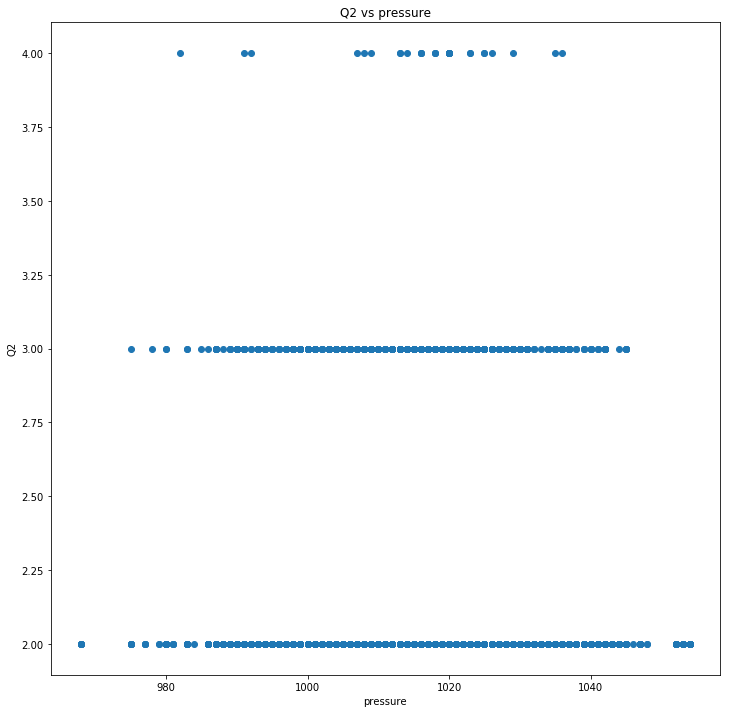

Q2 pressure -0.05671279911717677
STARTING  humidity Q2


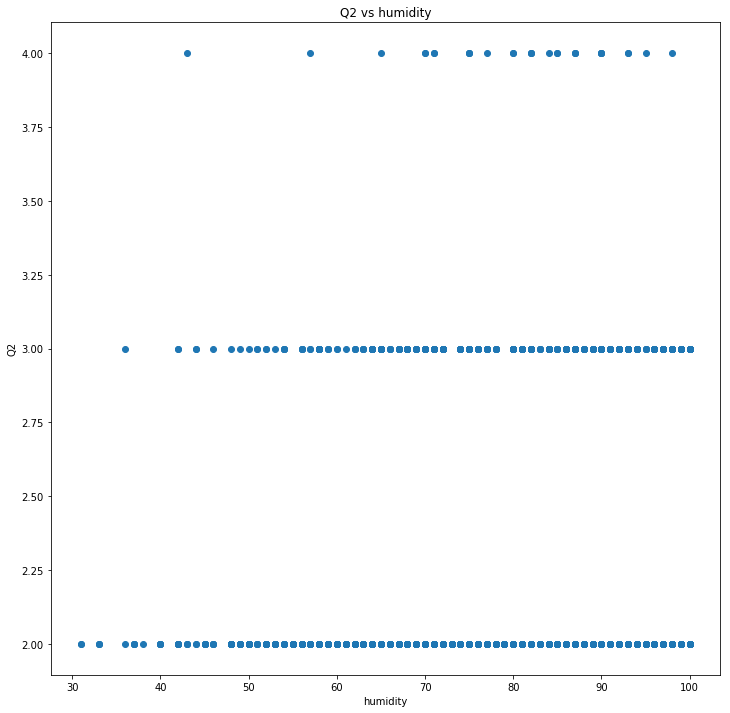

Q2 humidity -0.0345350185405983
STARTING  wind_speed Q2


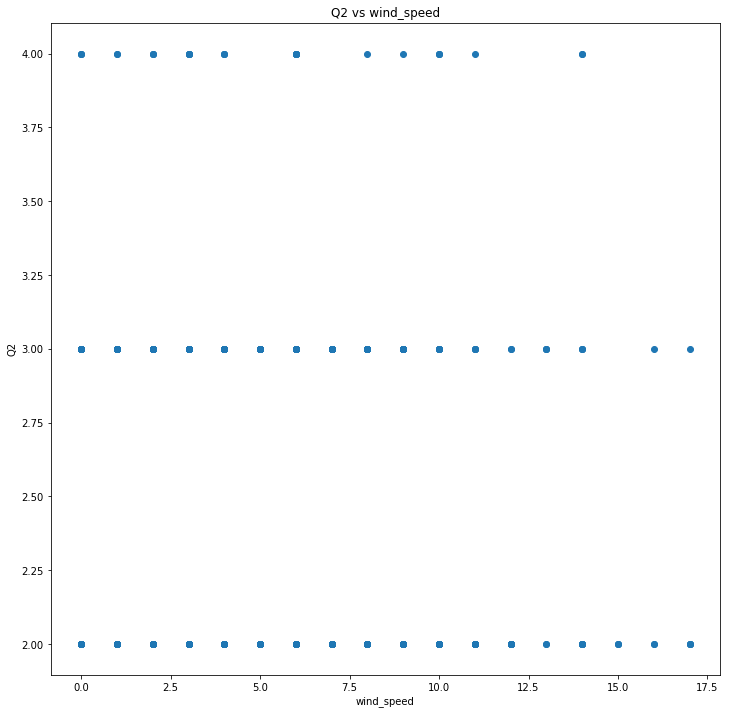

Q2 wind_speed 0.09822312549191477
STARTING  wind_deg Q2


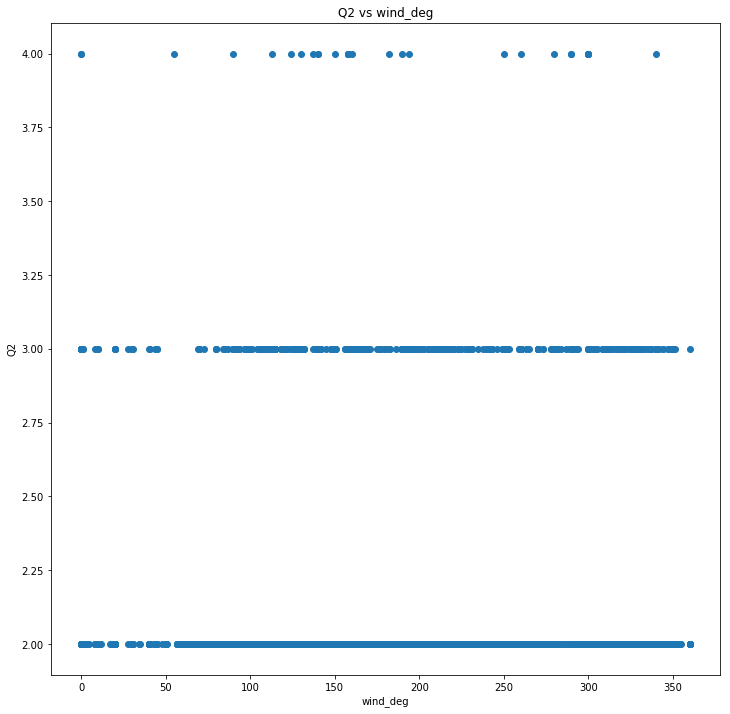

Q2 wind_deg -0.05066647672983871
STARTING  rain_1h Q2


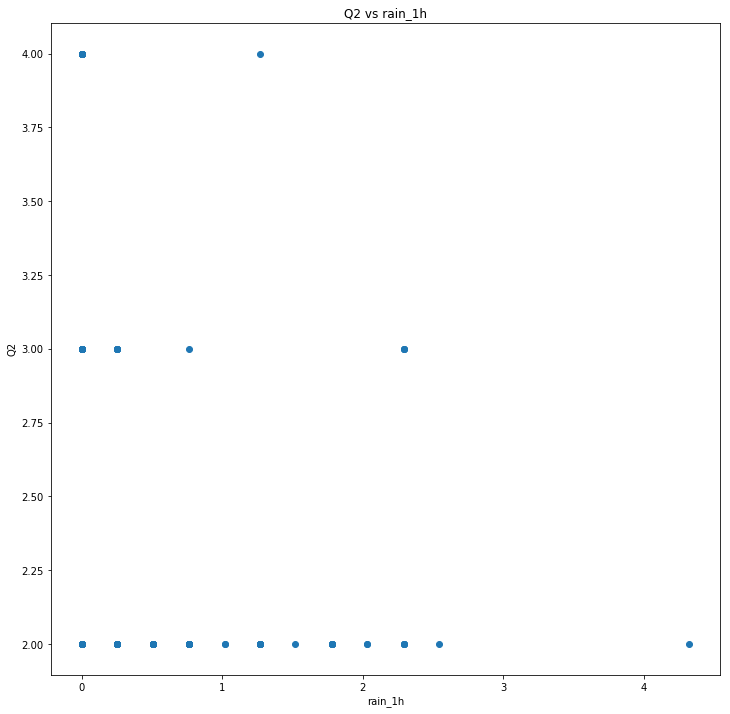

Q2 rain_1h 0.00020354229990430692
STARTING  rain_3h Q2


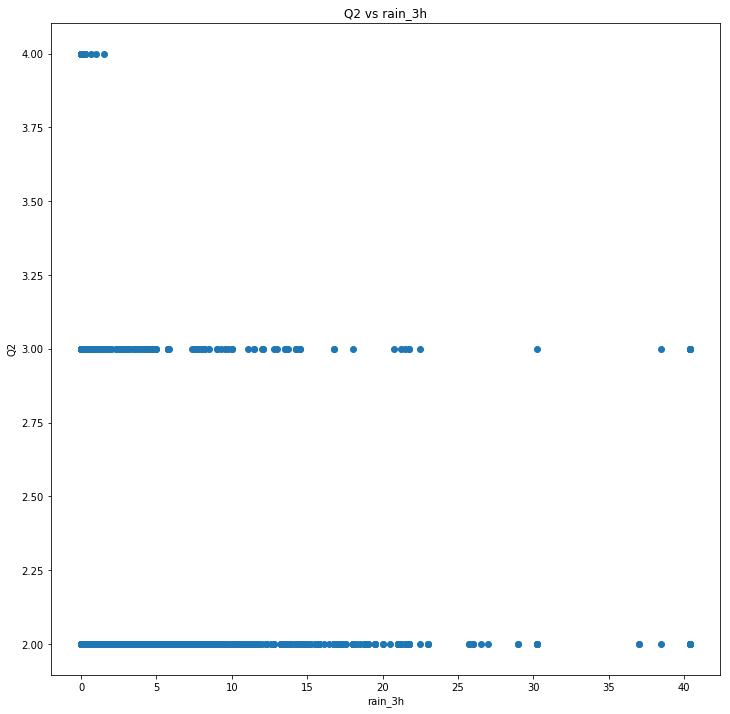

Q2 rain_3h -0.021602053271513672
STARTING  rain_24h Q2


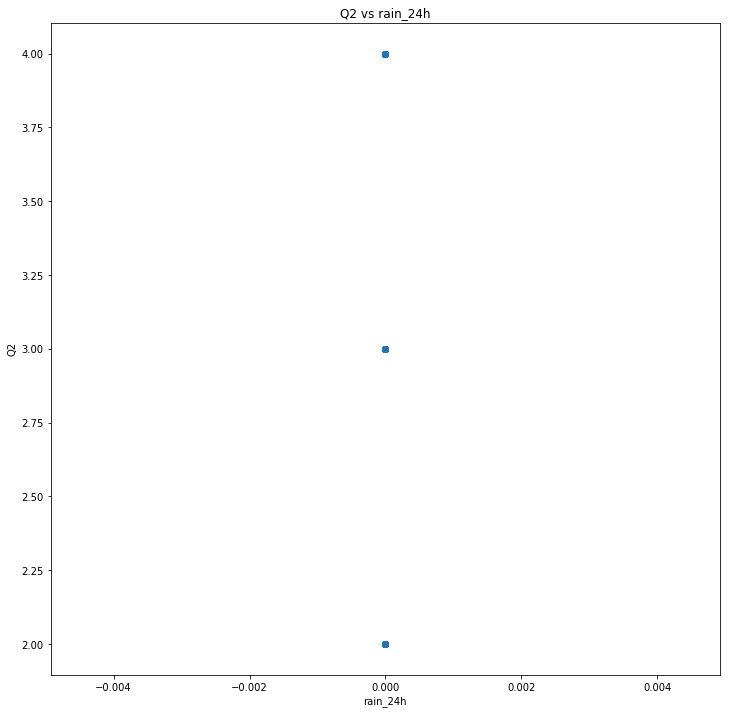

Q2 rain_24h nan
STARTING  rain_today Q2


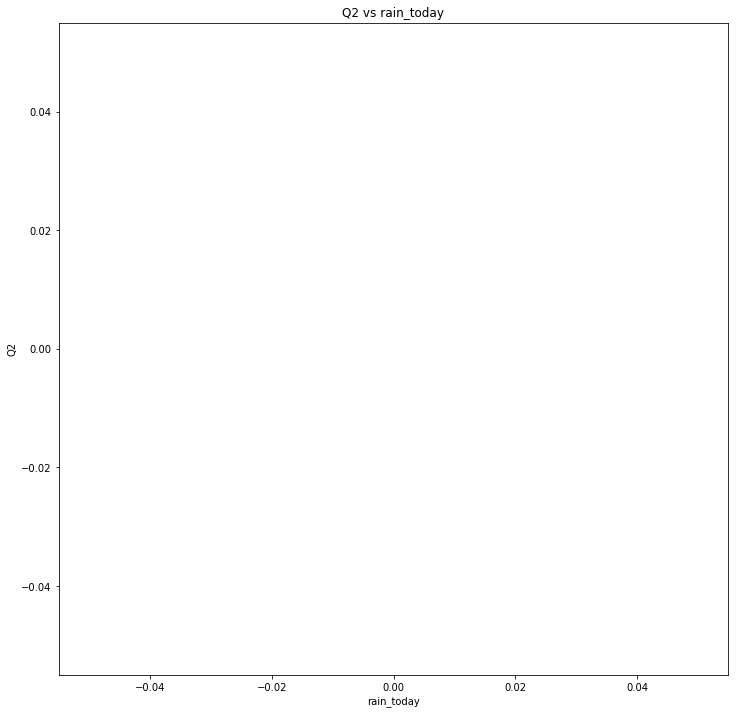

Q2 rain_today nan
STARTING  snow_1h Q2


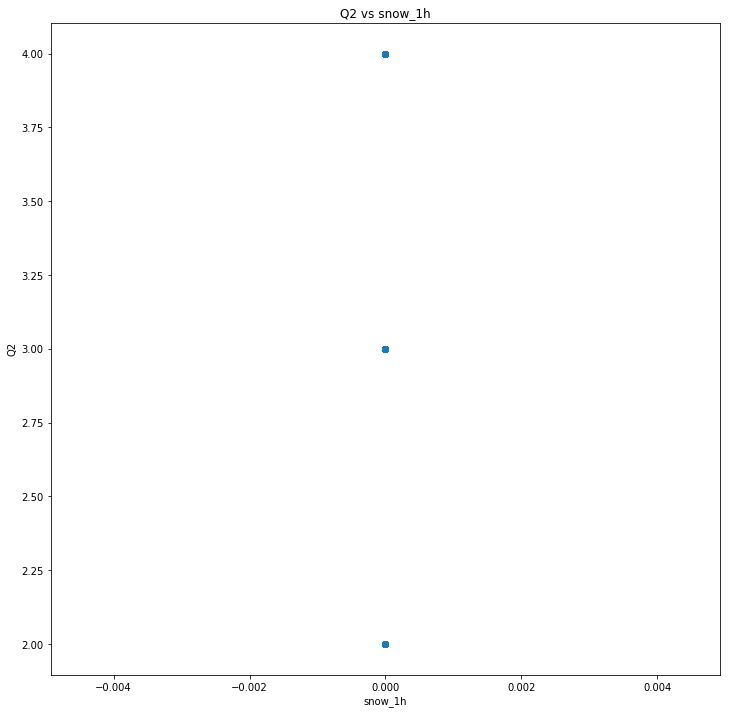

Q2 snow_1h nan
STARTING  snow_3h Q2


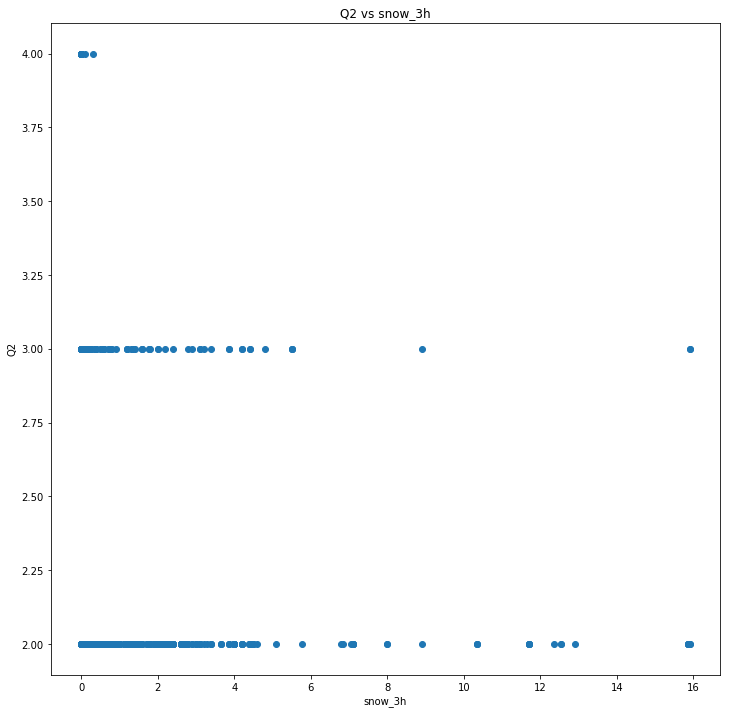

Q2 snow_3h -0.01209682600088185
STARTING  snow_24h Q2


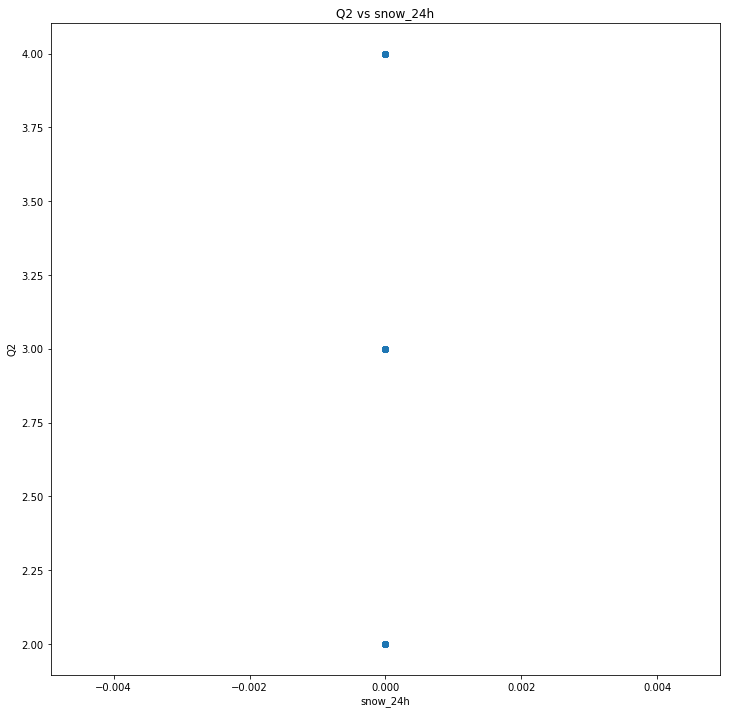

Q2 snow_24h nan
STARTING  snow_today Q2


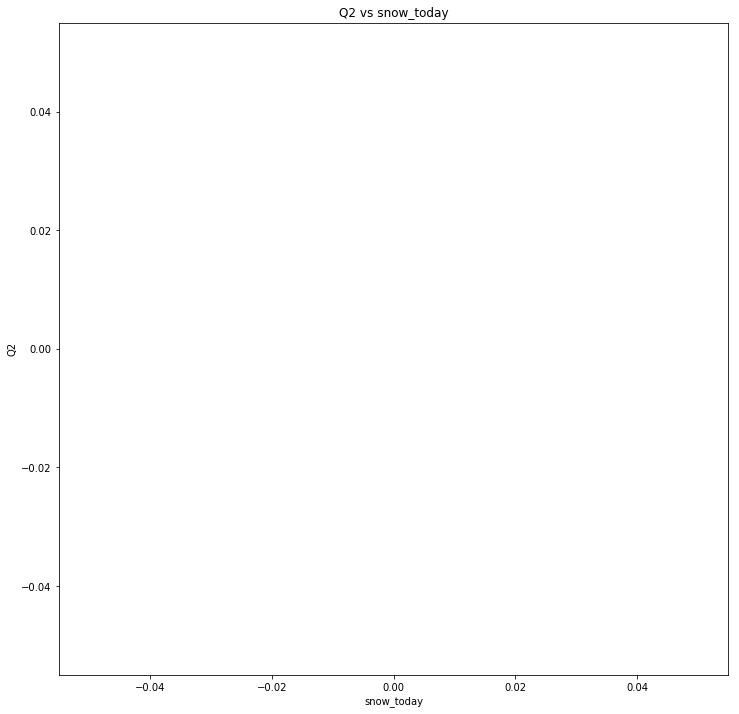

Q2 snow_today nan
STARTING  clouds_all Q2


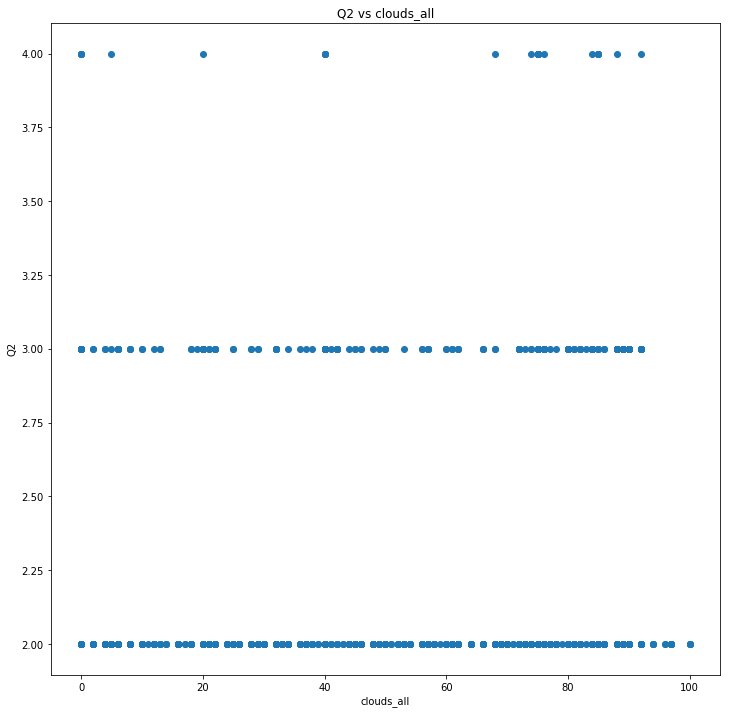

Q2 clouds_all 0.010620228781994853
STARTING  temp Q3


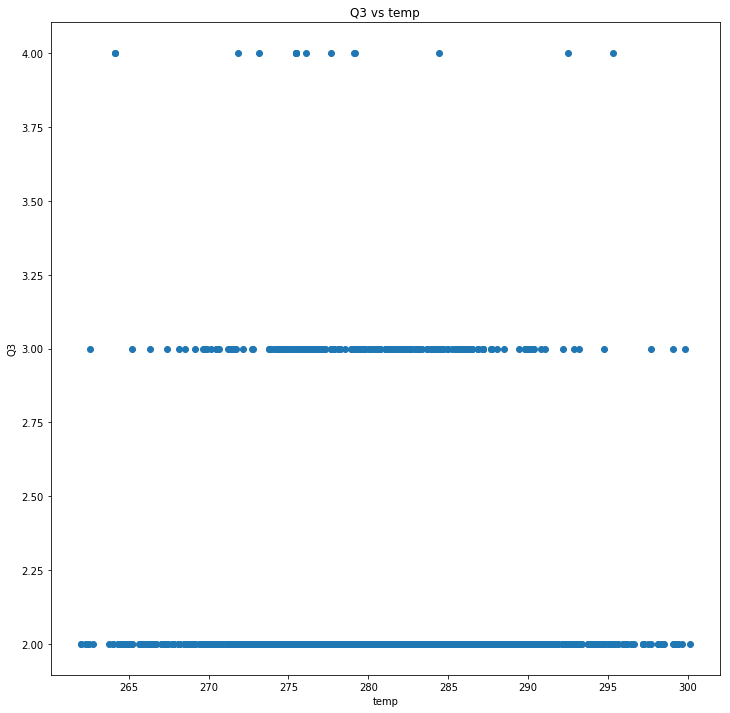

Q3 temp -0.008122166112220624
STARTING  pressure Q3


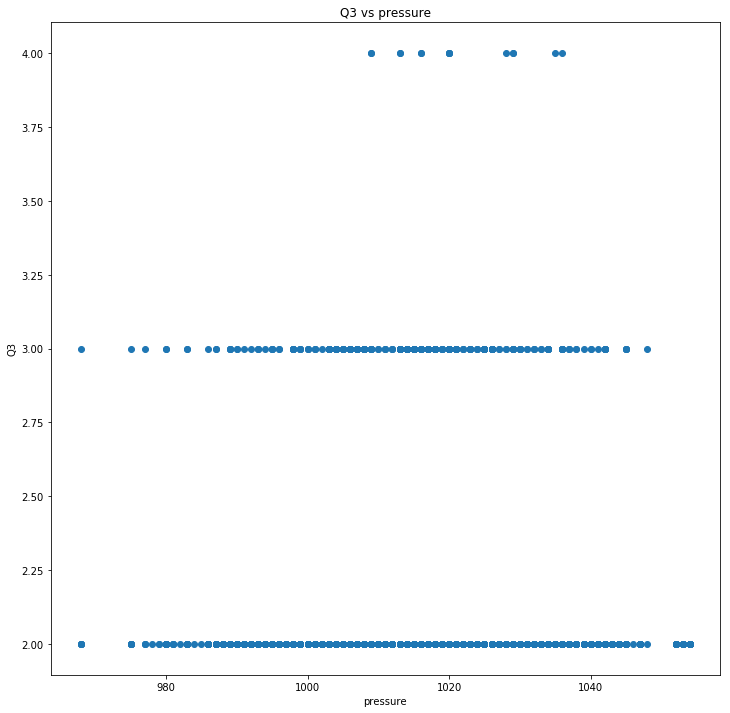

Q3 pressure -0.03027844494474155
STARTING  humidity Q3


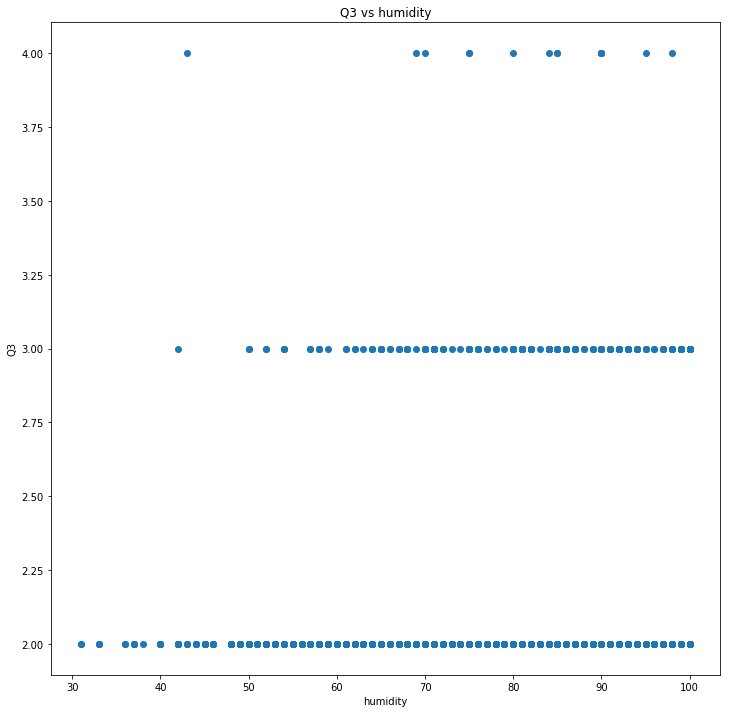

Q3 humidity -0.019642439566991025
STARTING  wind_speed Q3


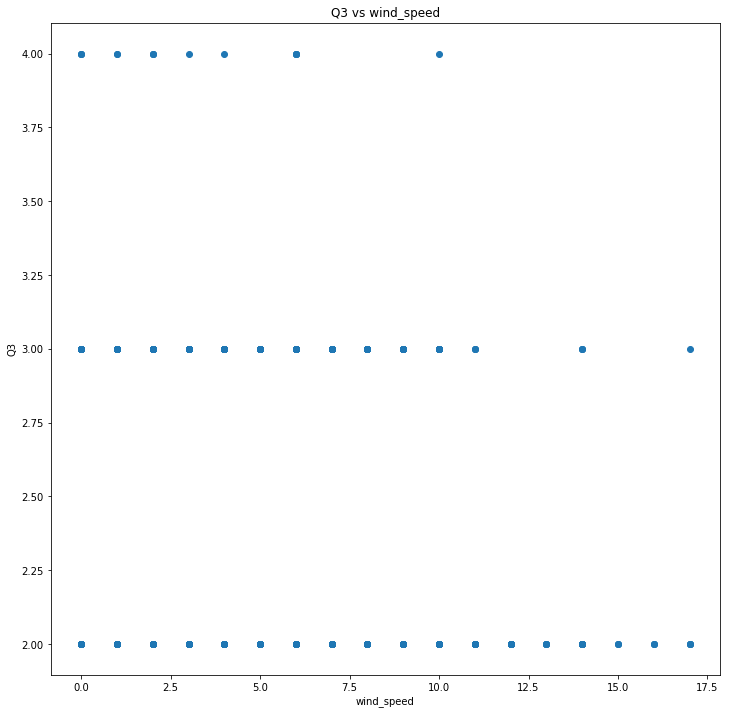

Q3 wind_speed 0.05943450126881899
STARTING  wind_deg Q3


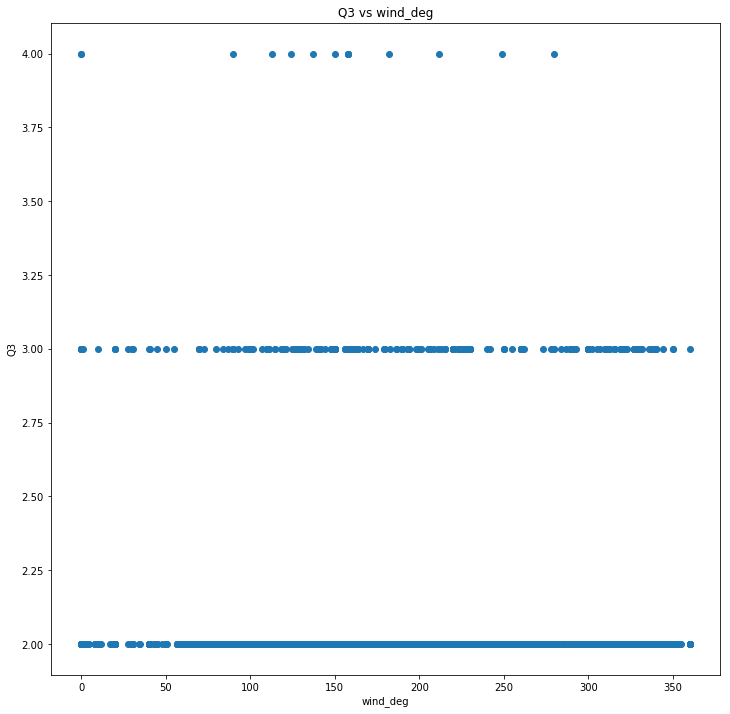

Q3 wind_deg -0.012881867765897762
STARTING  rain_1h Q3


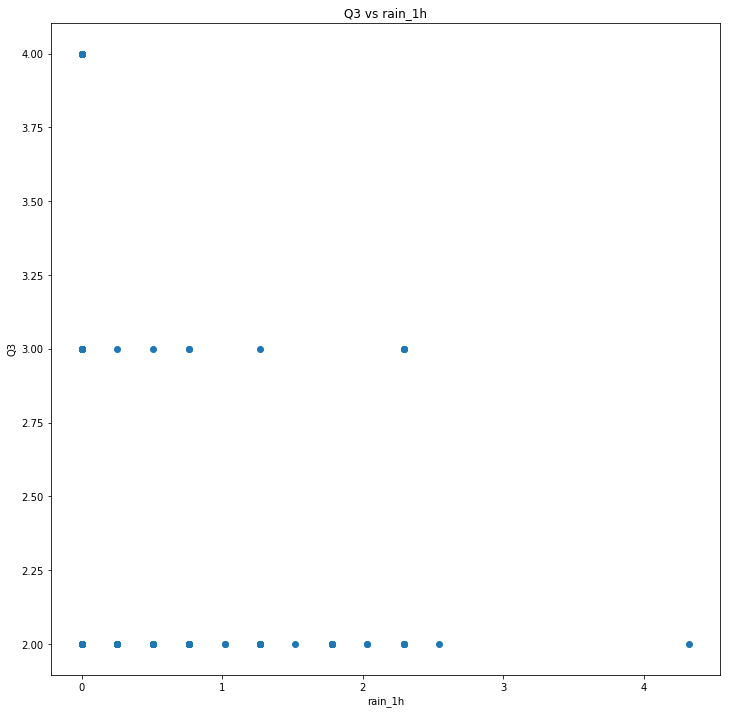

Q3 rain_1h 0.024830226931647173
STARTING  rain_3h Q3


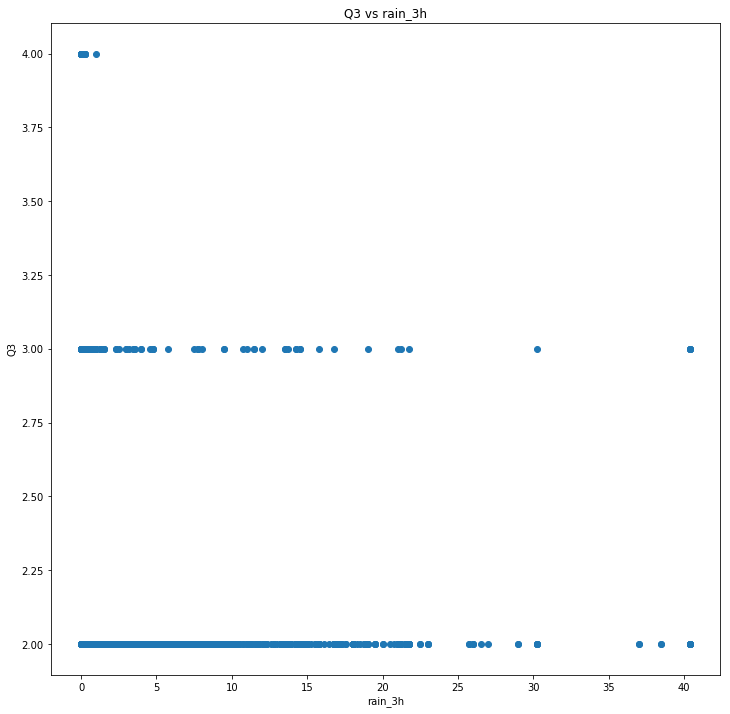

Q3 rain_3h 0.011711757935044387
STARTING  rain_24h Q3


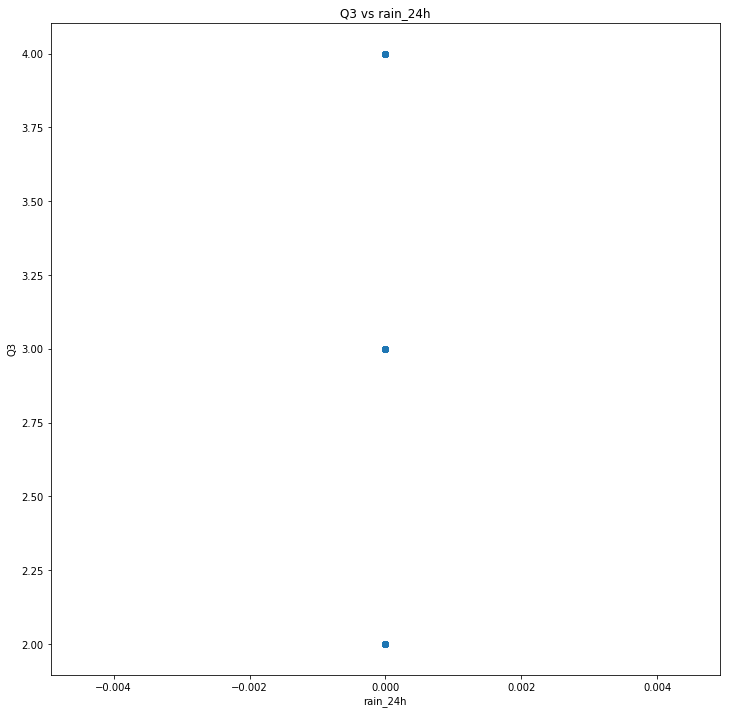

Q3 rain_24h nan
STARTING  rain_today Q3


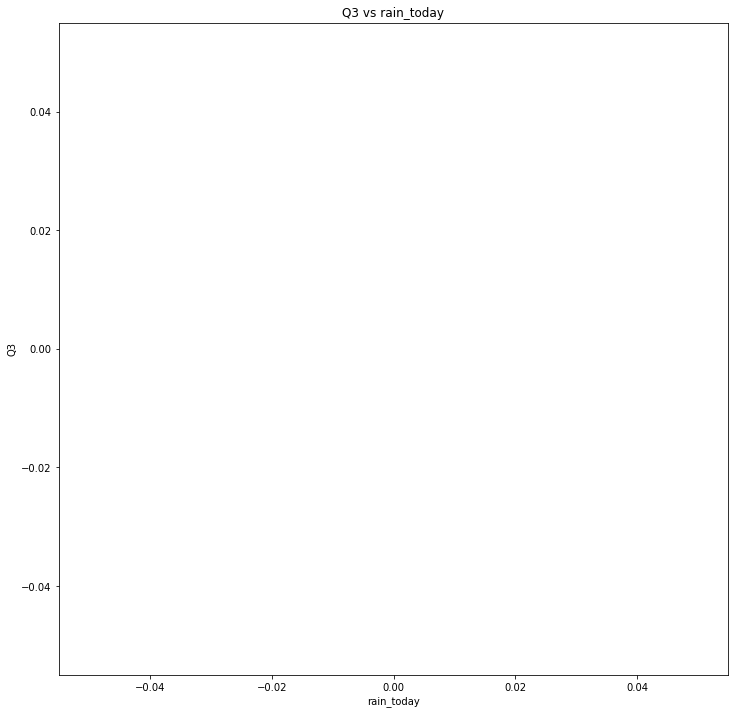

Q3 rain_today nan
STARTING  snow_1h Q3


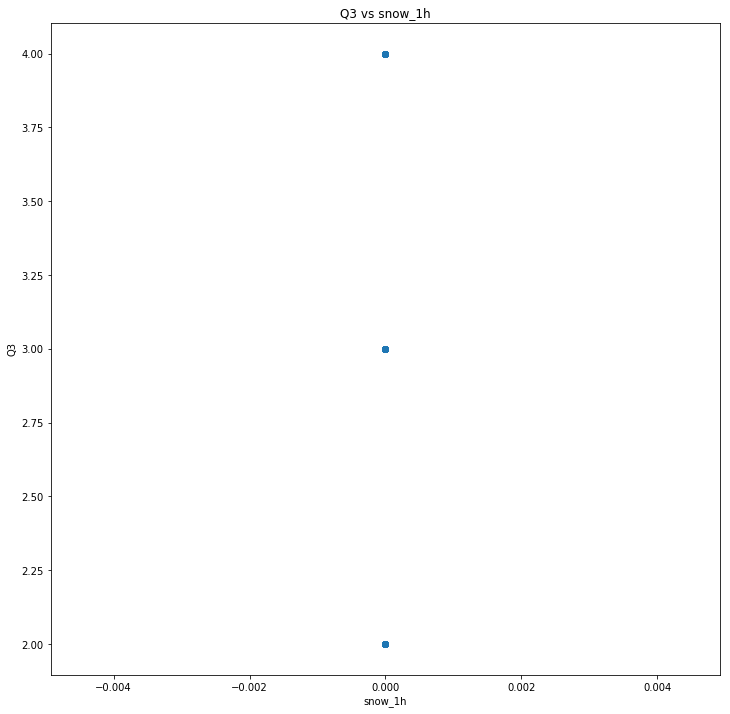

Q3 snow_1h nan
STARTING  snow_3h Q3


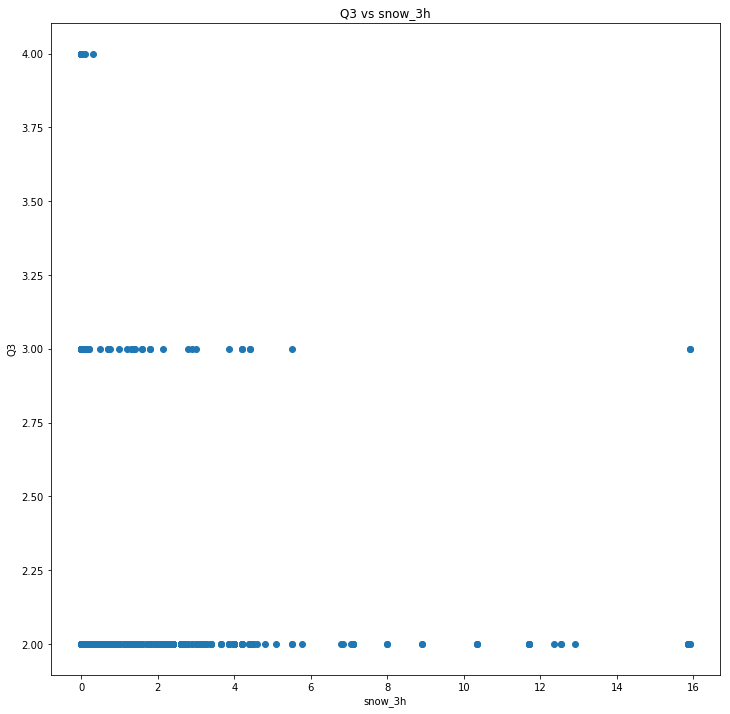

Q3 snow_3h 0.003381812476788356
STARTING  snow_24h Q3


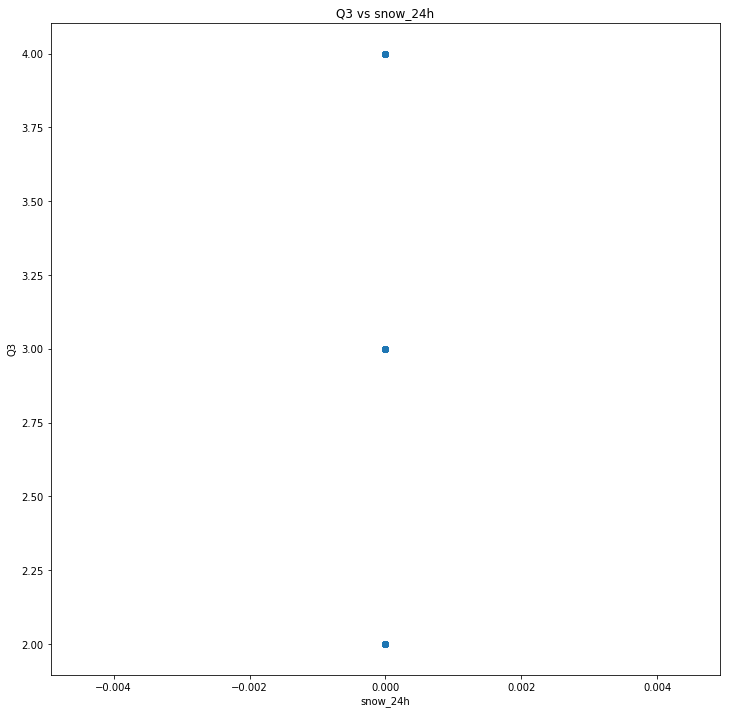

Q3 snow_24h nan
STARTING  snow_today Q3


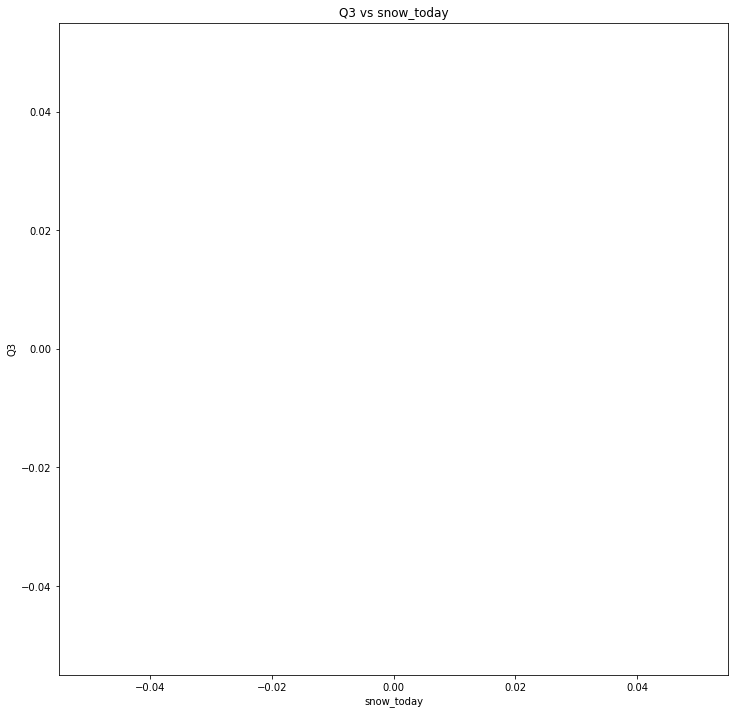

Q3 snow_today nan
STARTING  clouds_all Q3


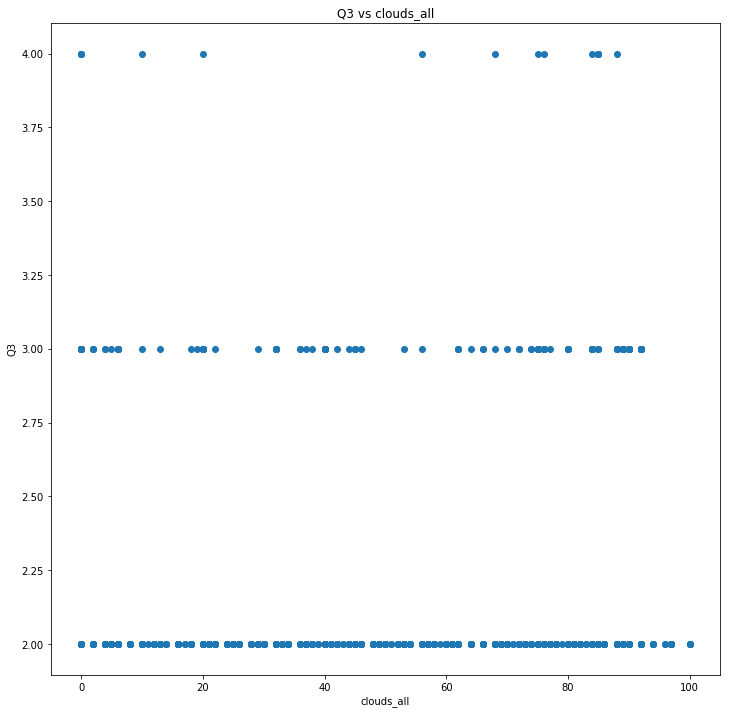

Q3 clouds_all 0.0002871642018426575
STARTING  temp Q4


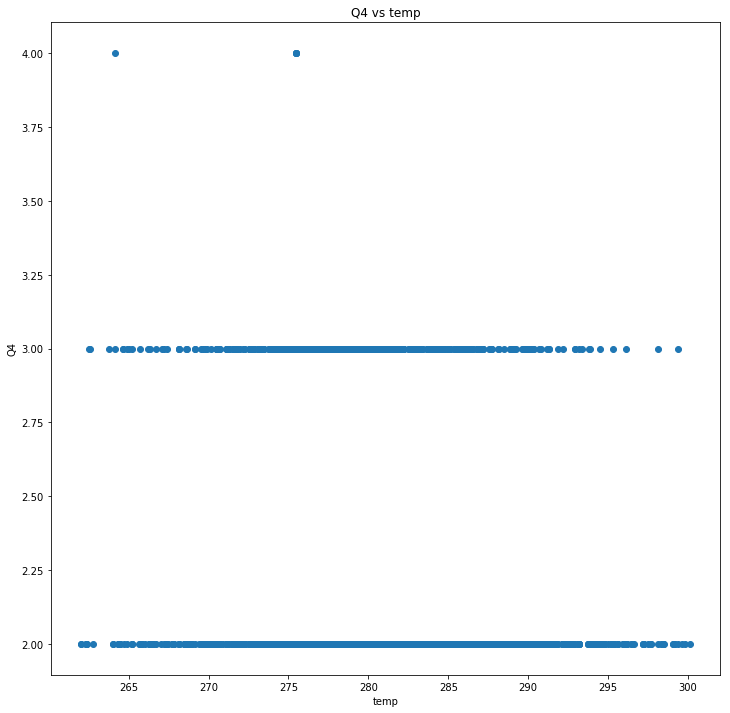

Q4 temp -0.09404311893529561
STARTING  pressure Q4


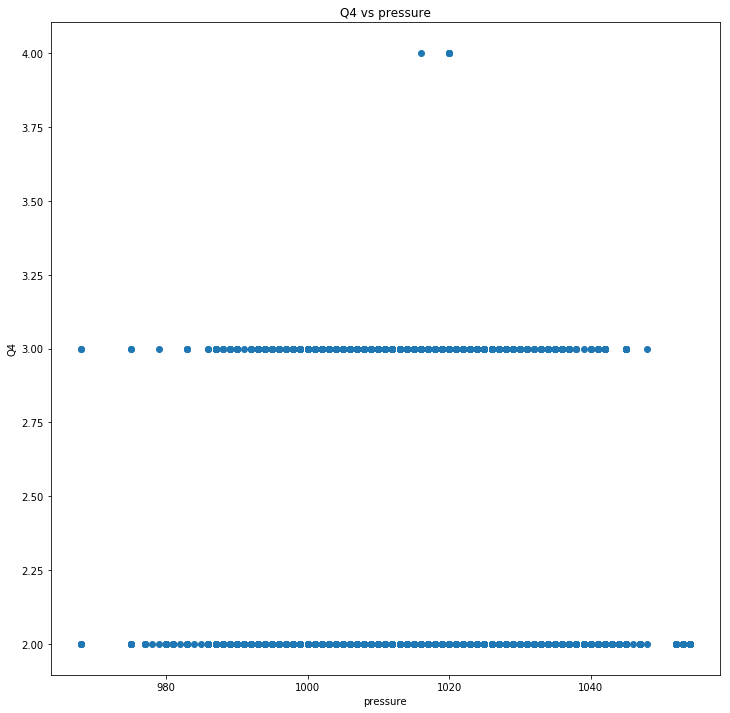

Q4 pressure -0.10262970521725781
STARTING  humidity Q4


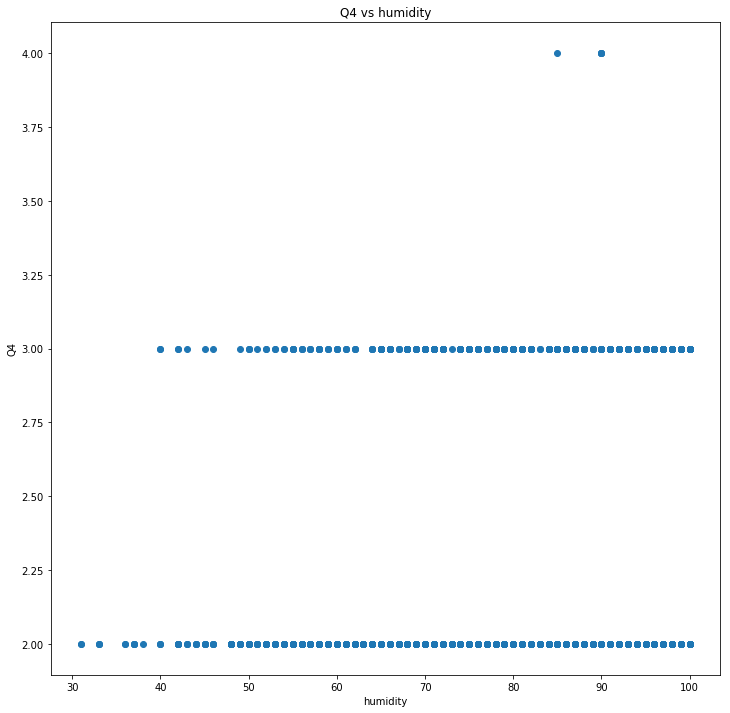

Q4 humidity 0.004127705258516298
STARTING  wind_speed Q4


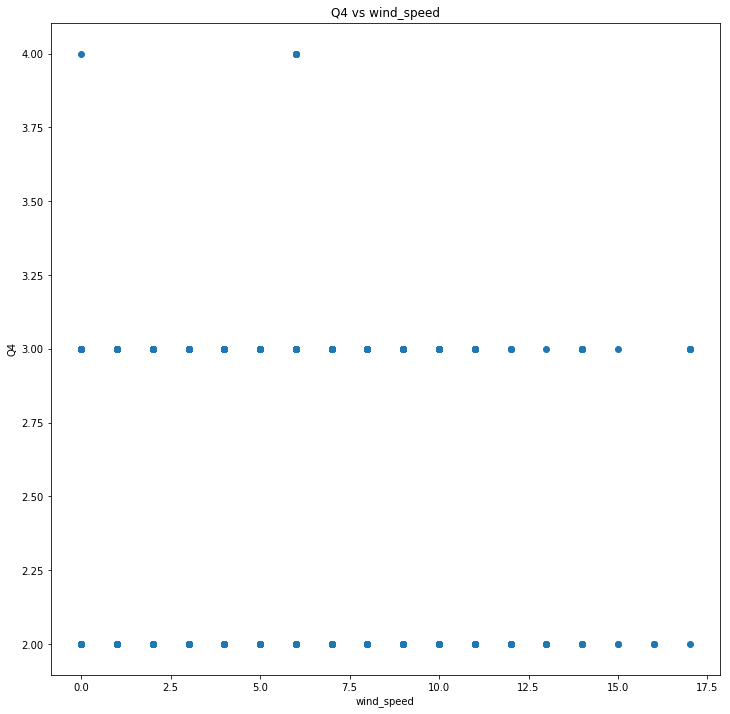

Q4 wind_speed 0.12054308254654636
STARTING  wind_deg Q4


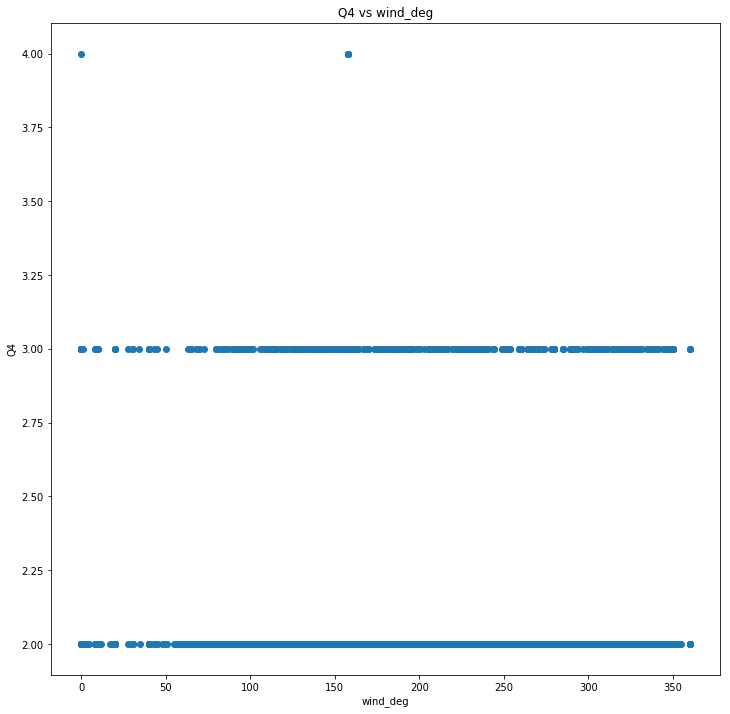

Q4 wind_deg -0.04828383407364265
STARTING  rain_1h Q4


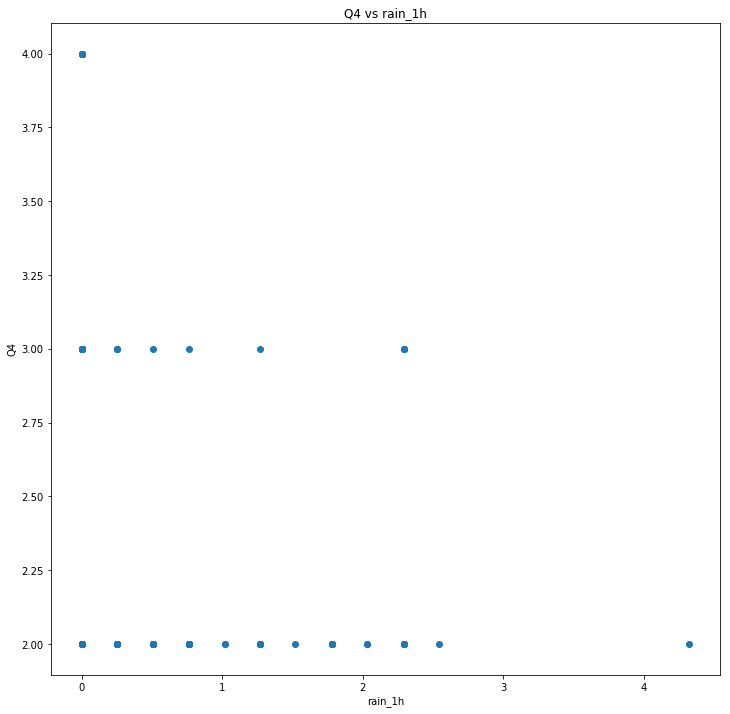

Q4 rain_1h -0.013718403278452198
STARTING  rain_3h Q4


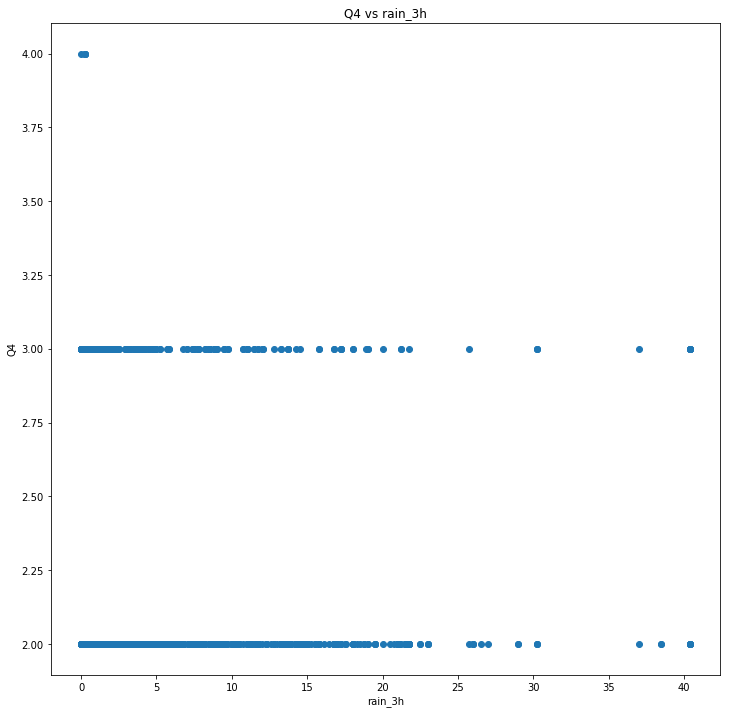

Q4 rain_3h 0.017633053224527278
STARTING  rain_24h Q4


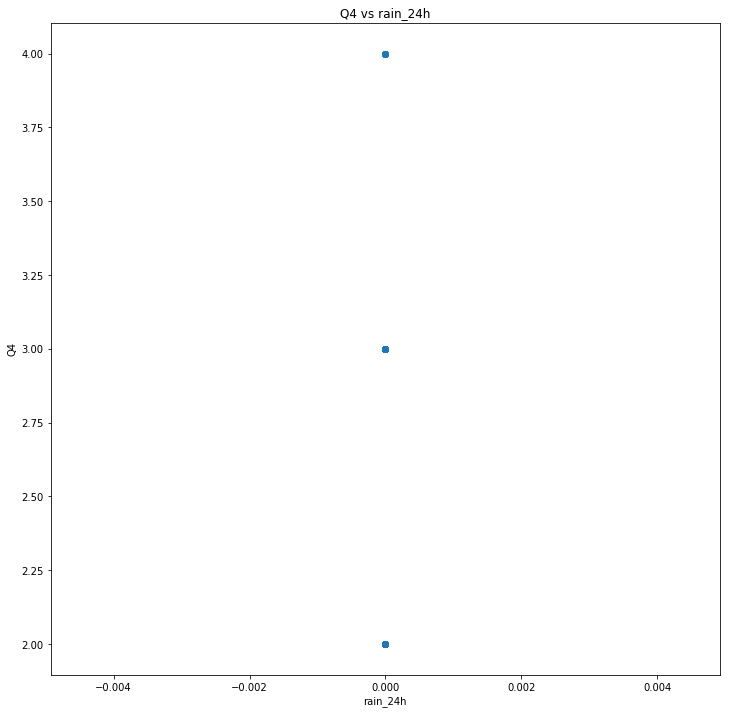

Q4 rain_24h nan
STARTING  rain_today Q4


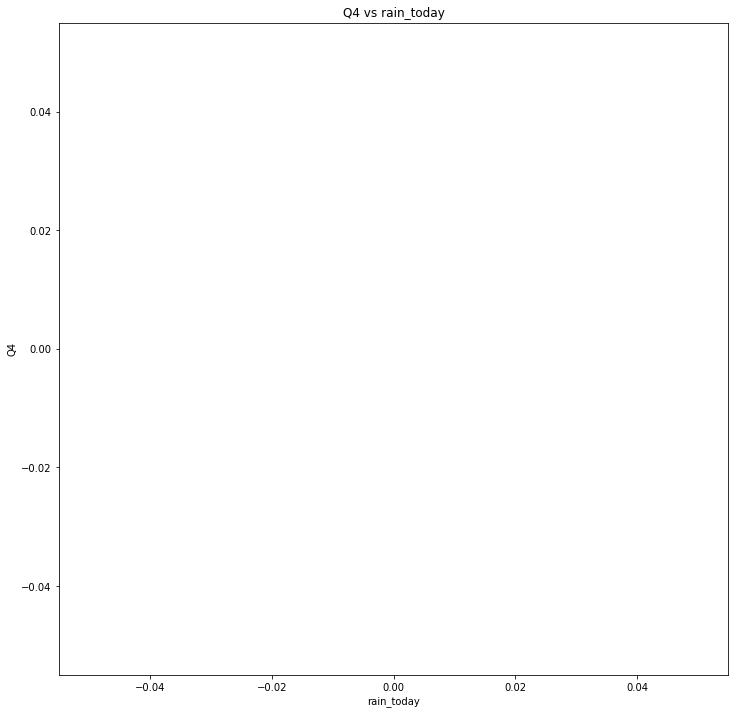

Q4 rain_today nan
STARTING  snow_1h Q4


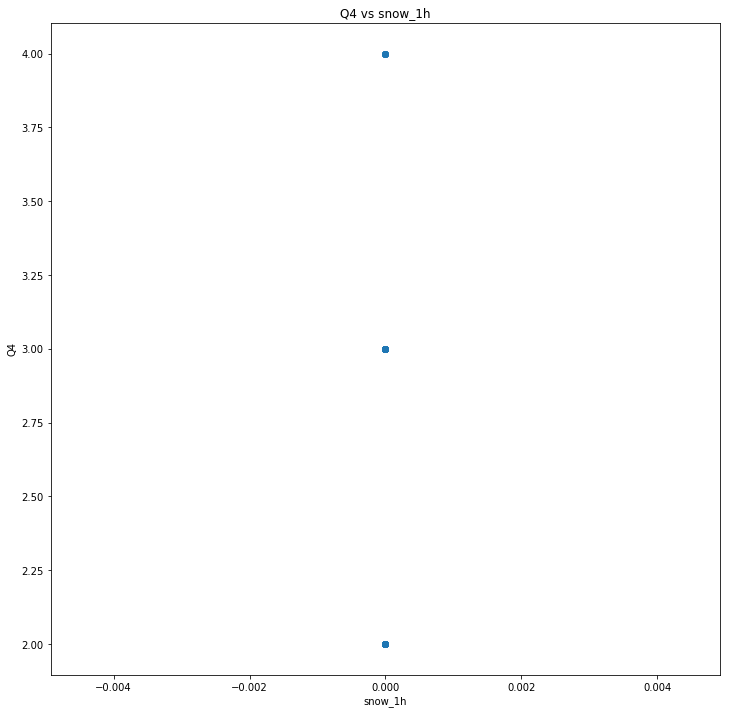

Q4 snow_1h nan
STARTING  snow_3h Q4


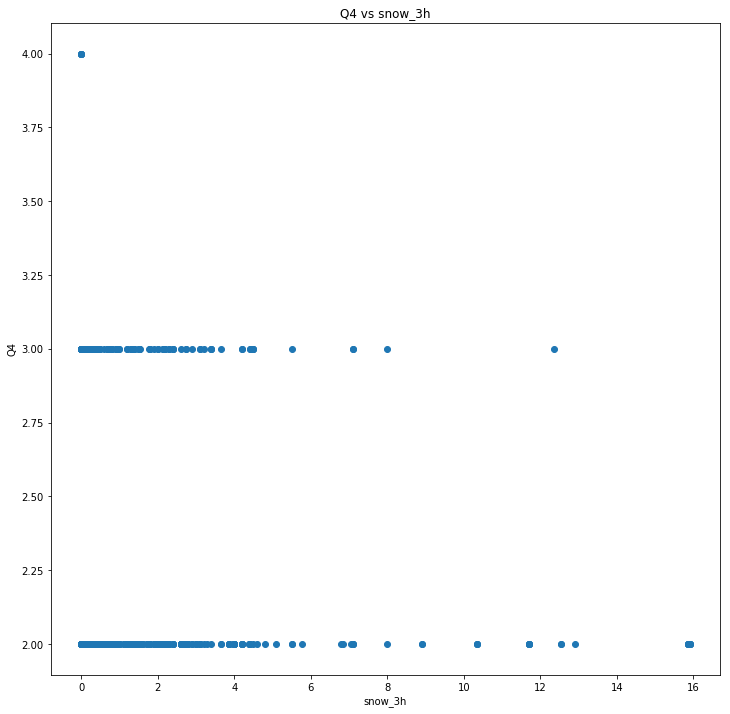

Q4 snow_3h -0.008123903443639
STARTING  snow_24h Q4


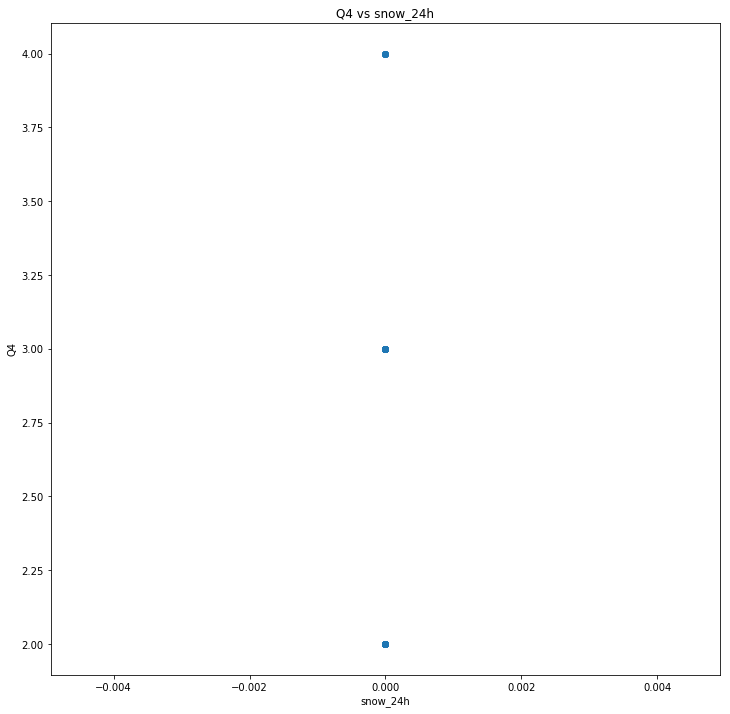

Q4 snow_24h nan
STARTING  snow_today Q4


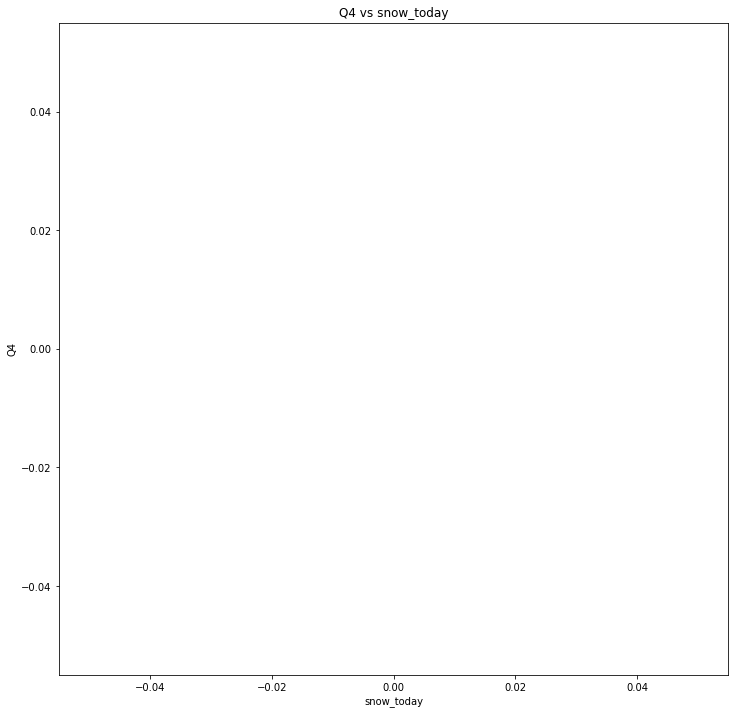

Q4 snow_today nan
STARTING  clouds_all Q4


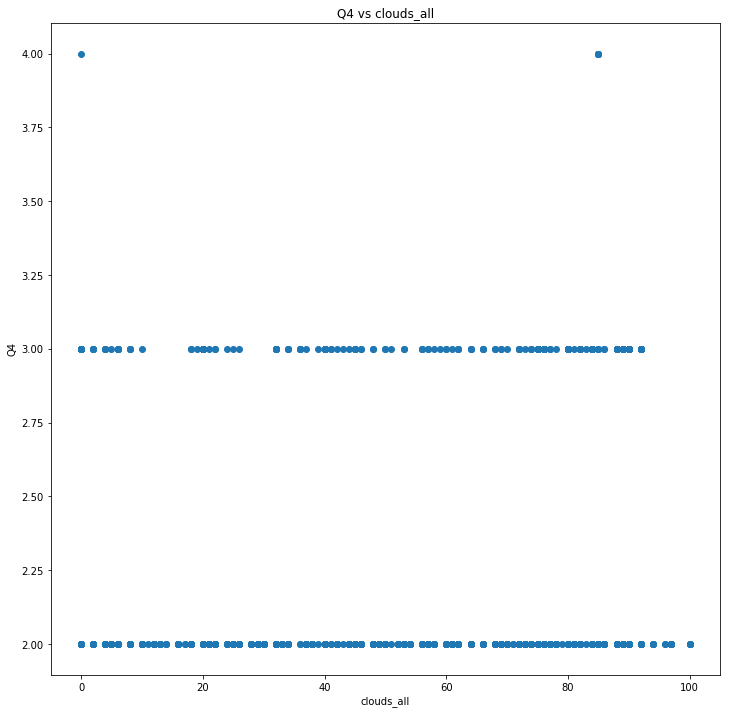

Q4 clouds_all 0.05126610082867052
STARTING  temp Q5


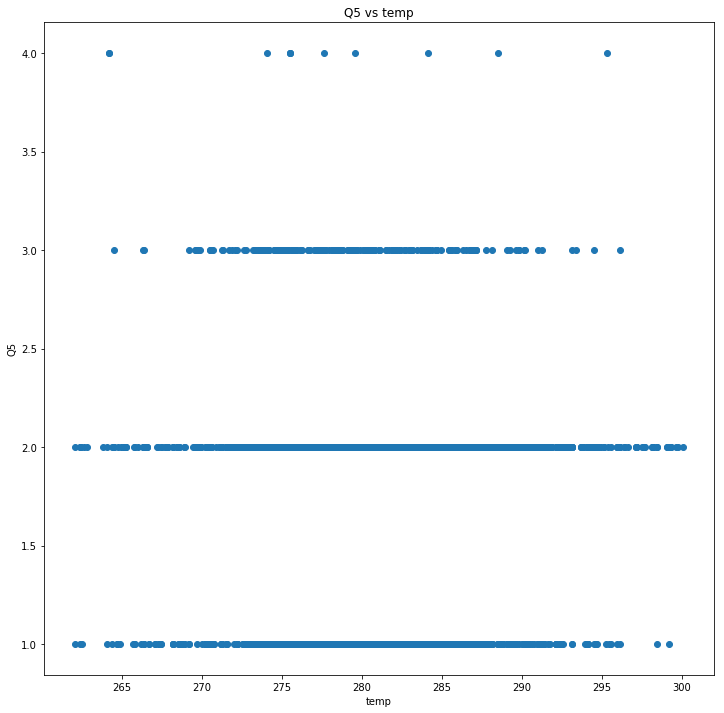

Q5 temp 0.02408620148036835
STARTING  pressure Q5


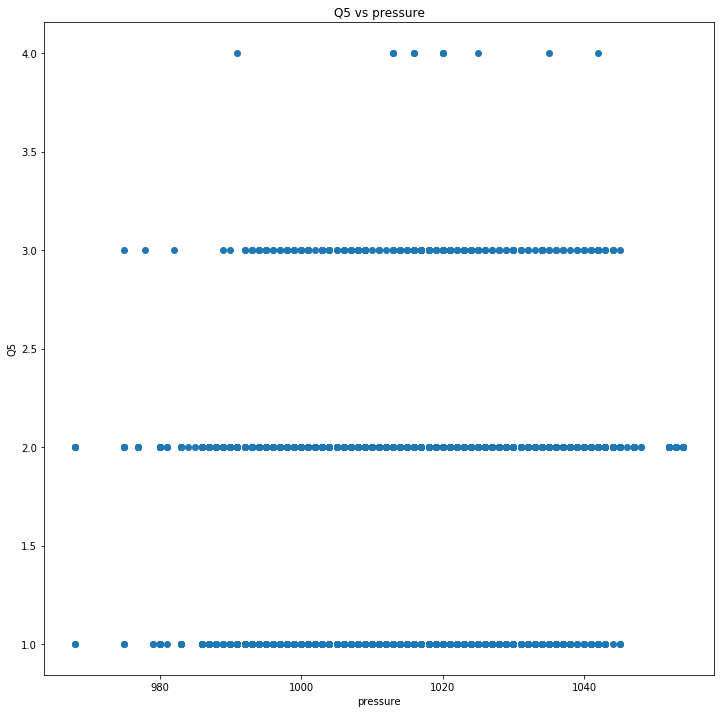

Q5 pressure 0.08743836831327981
STARTING  humidity Q5


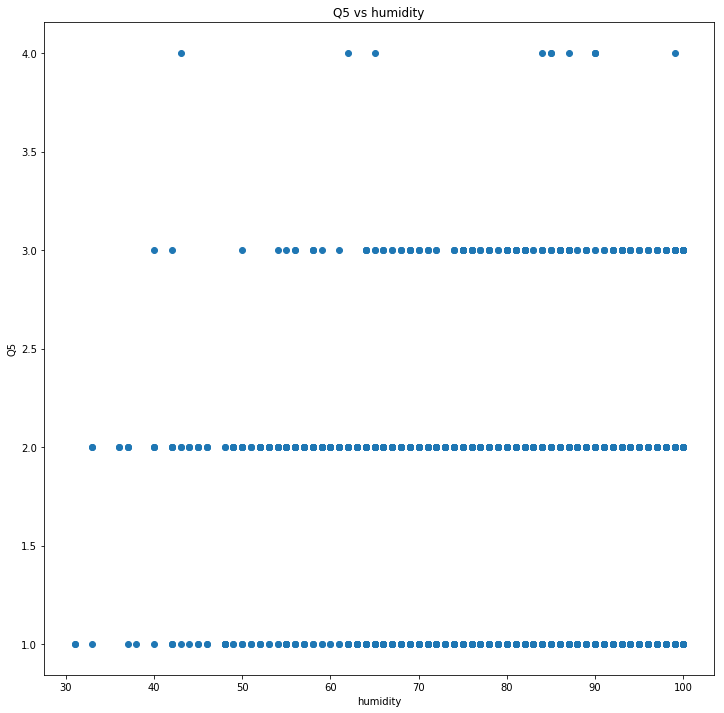

Q5 humidity -0.023489354641338264
STARTING  wind_speed Q5


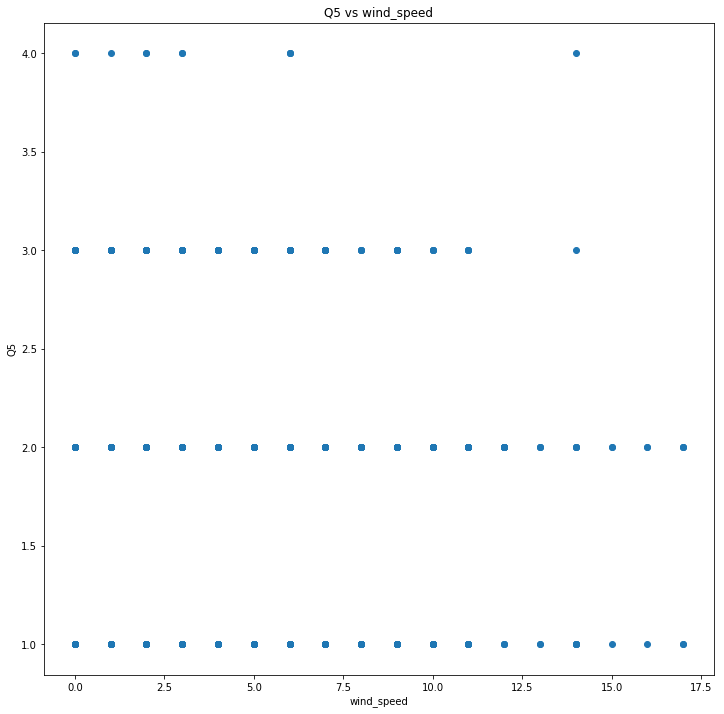

Q5 wind_speed -0.05396371086282224
STARTING  wind_deg Q5


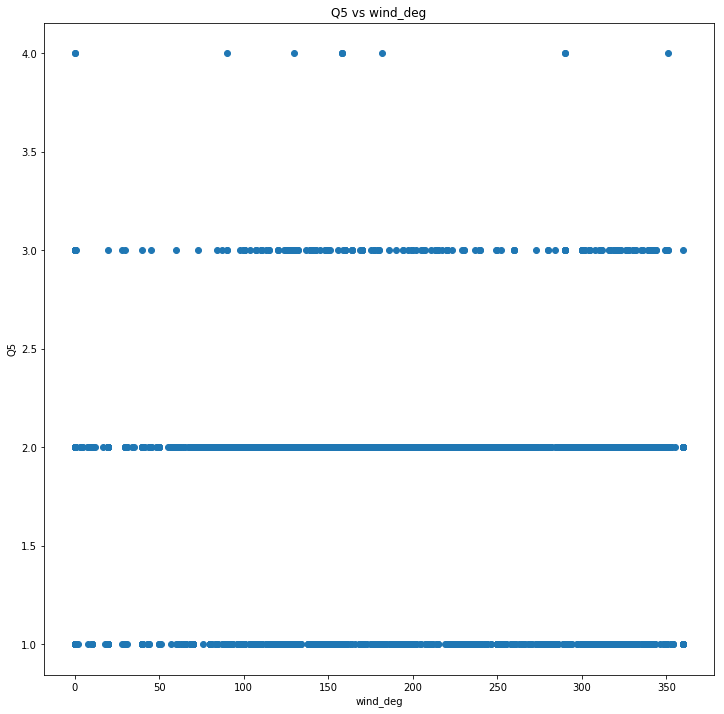

Q5 wind_deg 0.021254370609358565
STARTING  rain_1h Q5


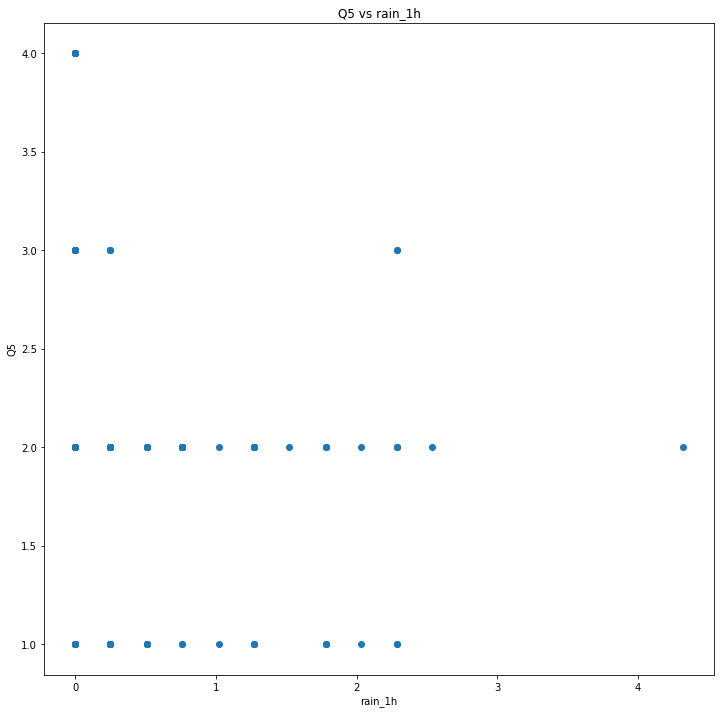

Q5 rain_1h 1.3226921265083948e-05
STARTING  rain_3h Q5


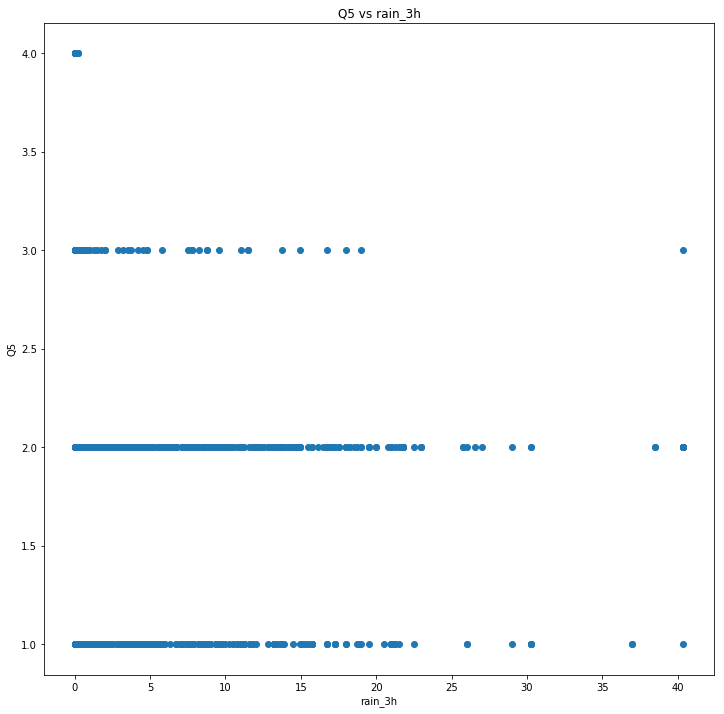

Q5 rain_3h -0.01340938054079472
STARTING  rain_24h Q5


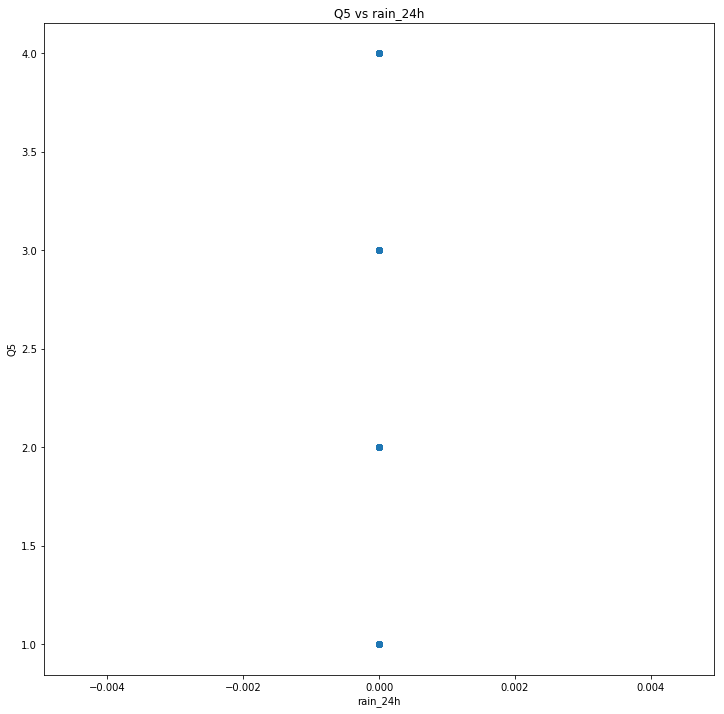

Q5 rain_24h nan
STARTING  rain_today Q5


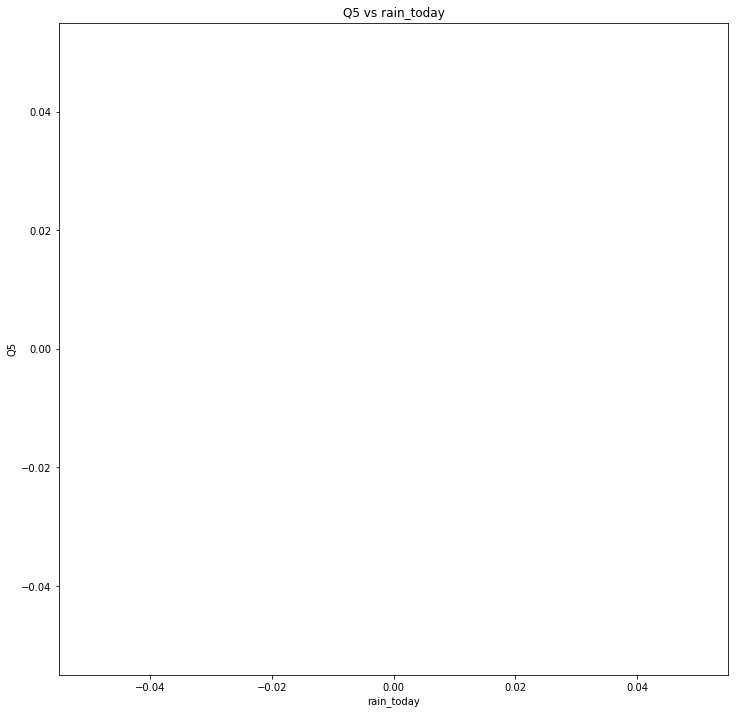

Q5 rain_today nan
STARTING  snow_1h Q5


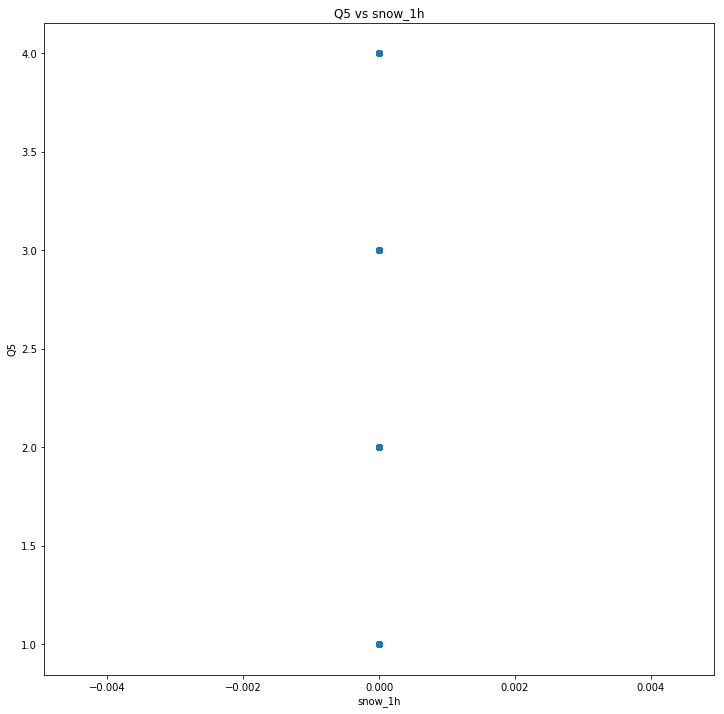

Q5 snow_1h nan
STARTING  snow_3h Q5


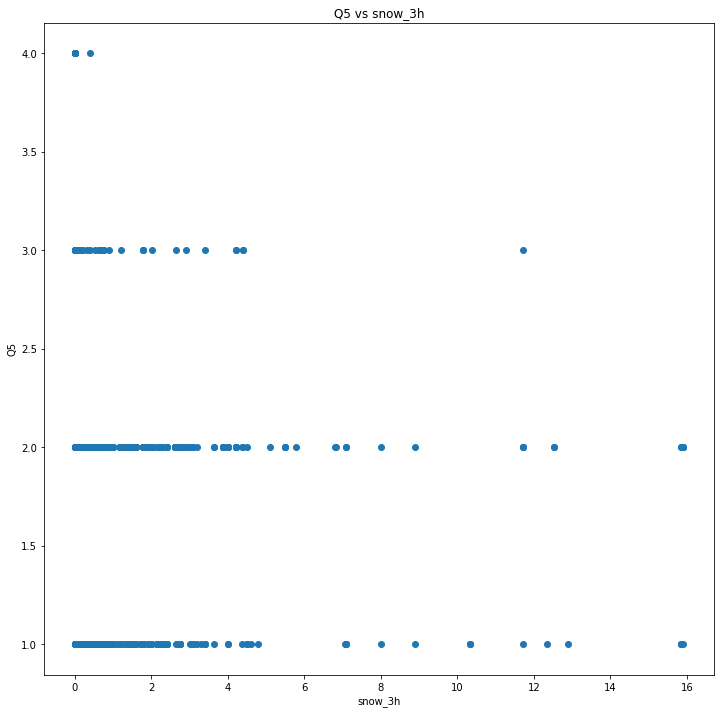

Q5 snow_3h -0.04014444799758416
STARTING  snow_24h Q5


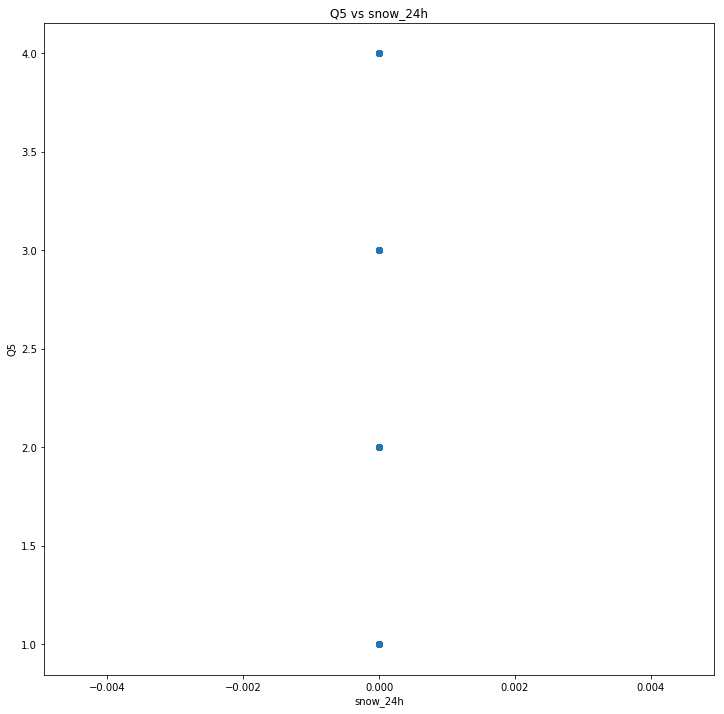

Q5 snow_24h nan
STARTING  snow_today Q5


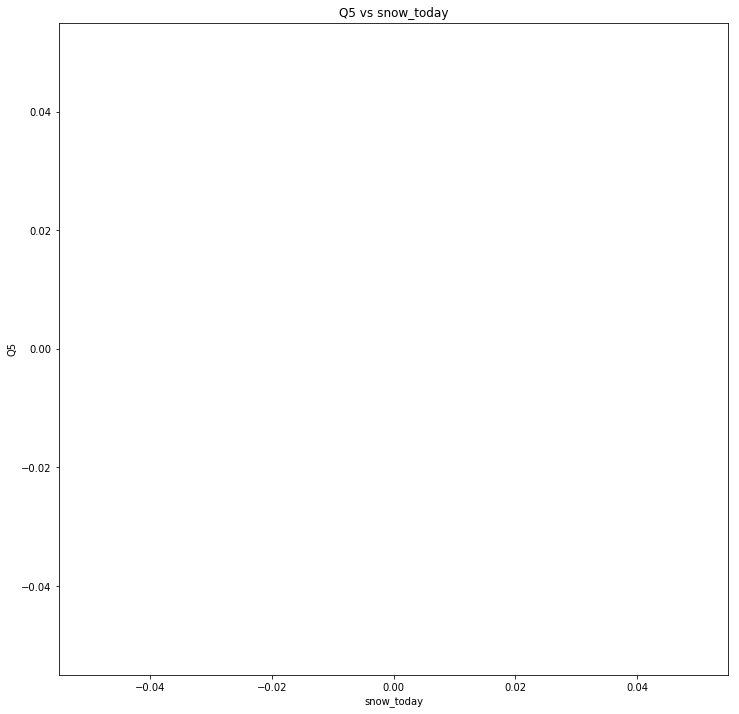

Q5 snow_today nan
STARTING  clouds_all Q5


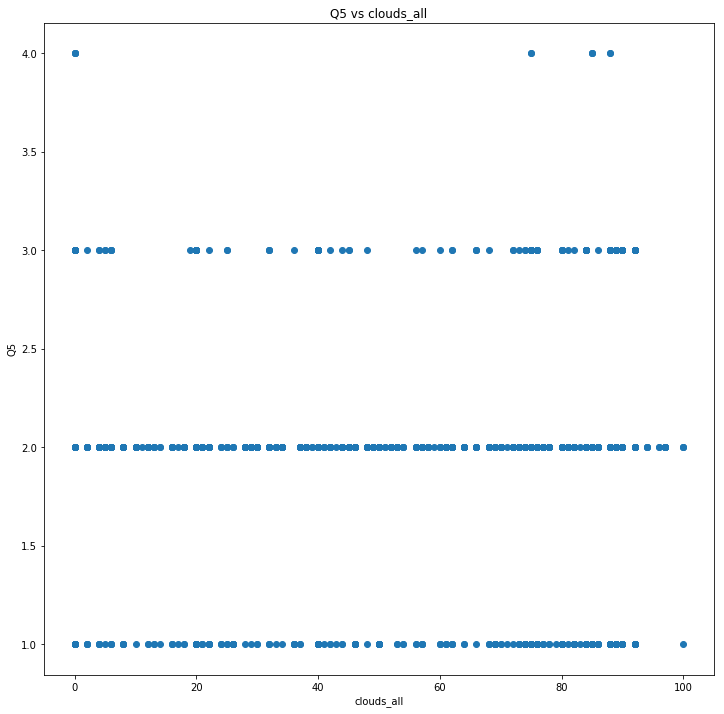

Q5 clouds_all -0.02081524561654574
STARTING  temp Q6


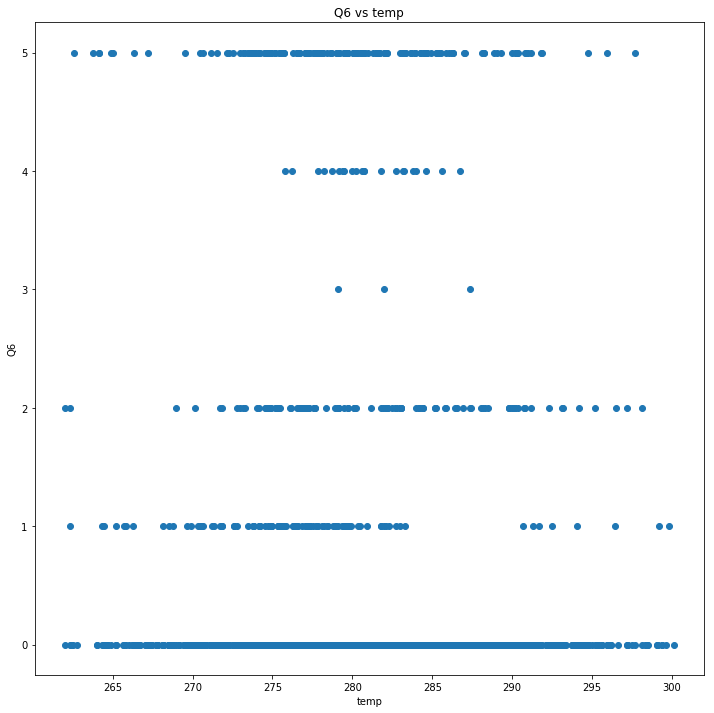

Q6 temp -0.022908804611379414
STARTING  pressure Q6


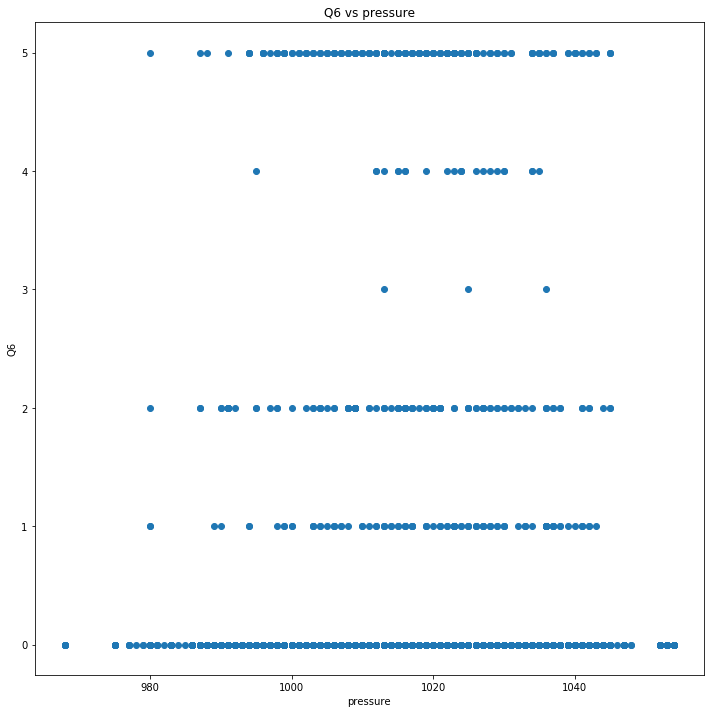

Q6 pressure 0.0031833660658321297
STARTING  humidity Q6


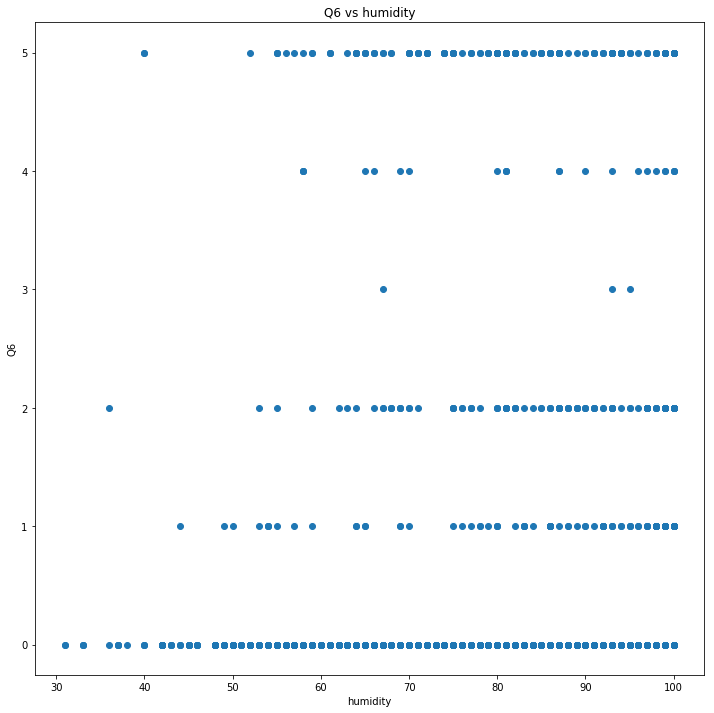

Q6 humidity -0.03086445424702487
STARTING  wind_speed Q6


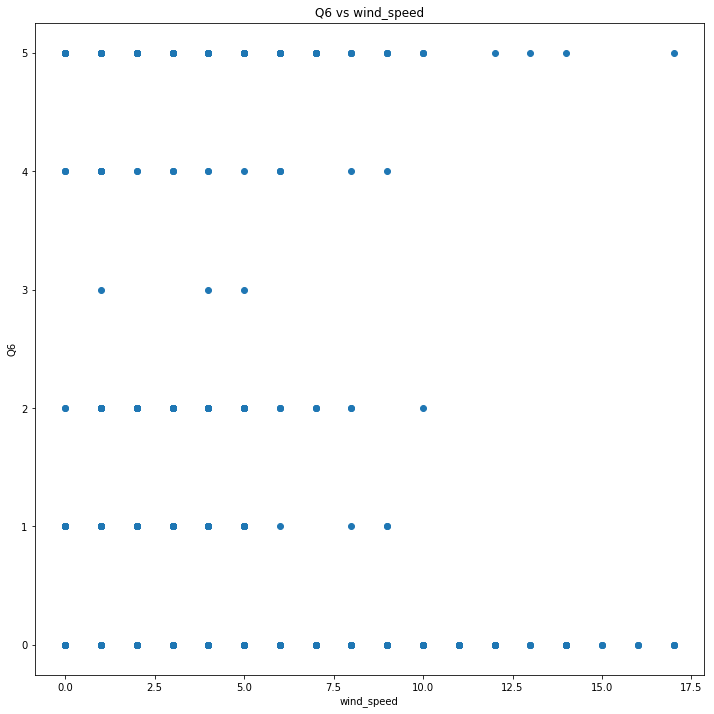

Q6 wind_speed -0.00191022221705113
STARTING  wind_deg Q6


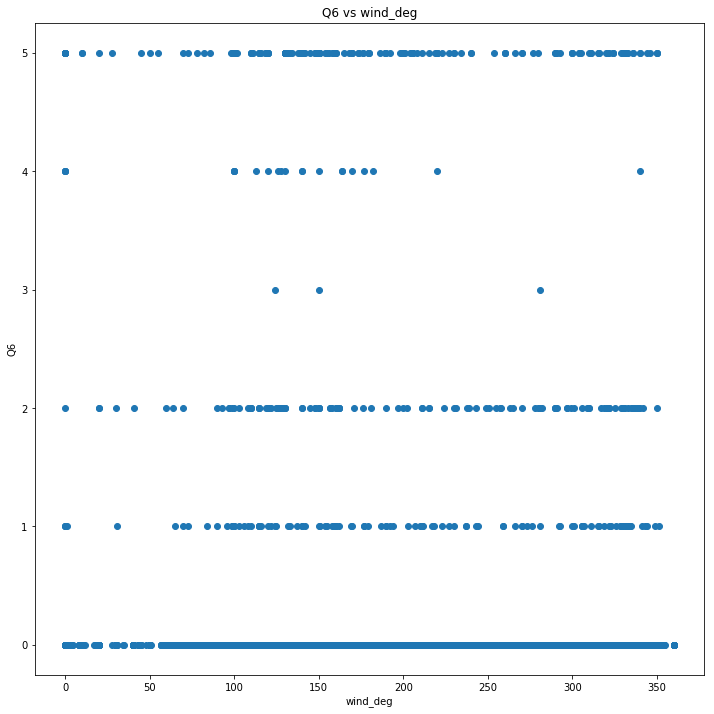

Q6 wind_deg -0.04796453017123261
STARTING  rain_1h Q6


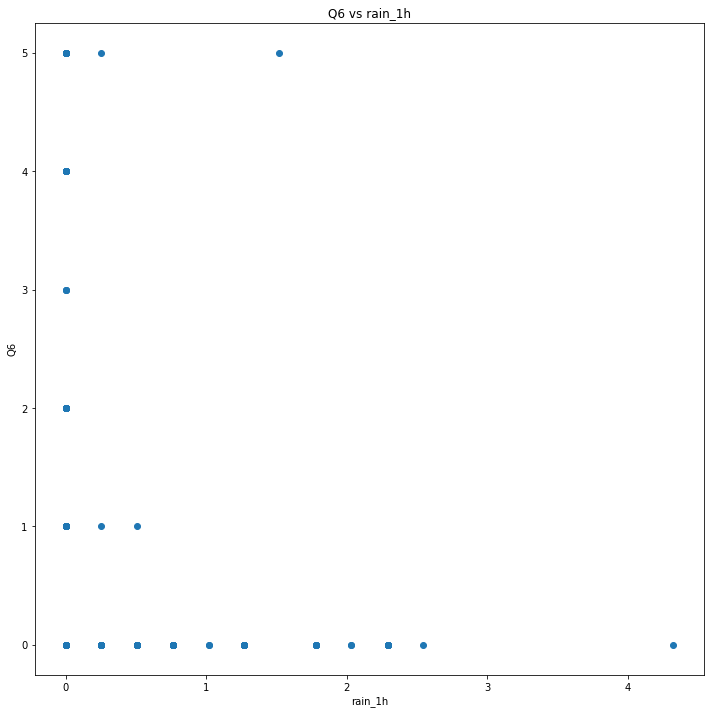

Q6 rain_1h -0.02276876016039582
STARTING  rain_3h Q6


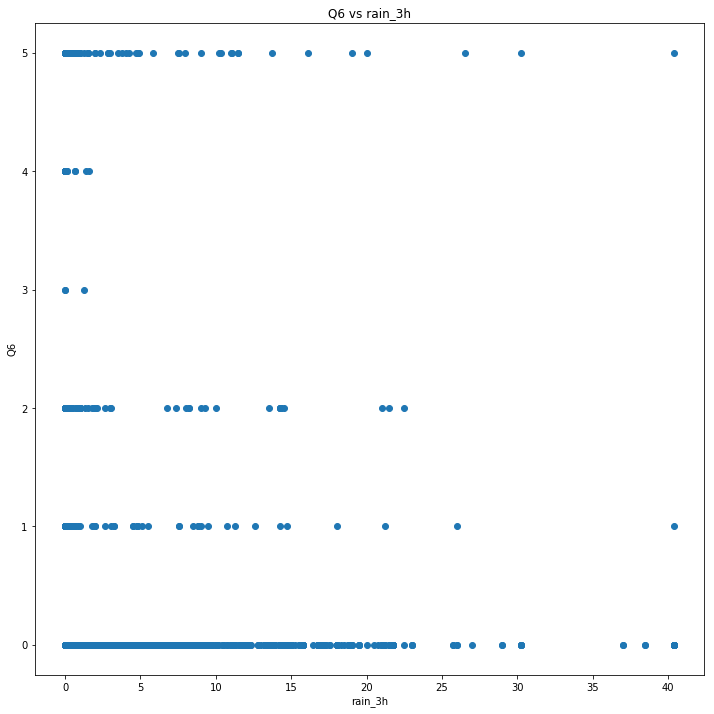

Q6 rain_3h -0.009860277127545341
STARTING  rain_24h Q6


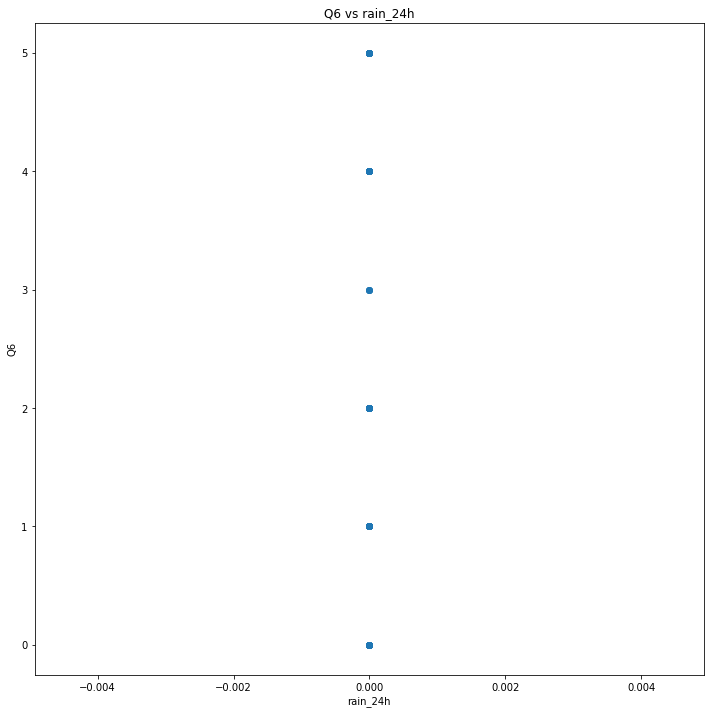

Q6 rain_24h nan
STARTING  rain_today Q6


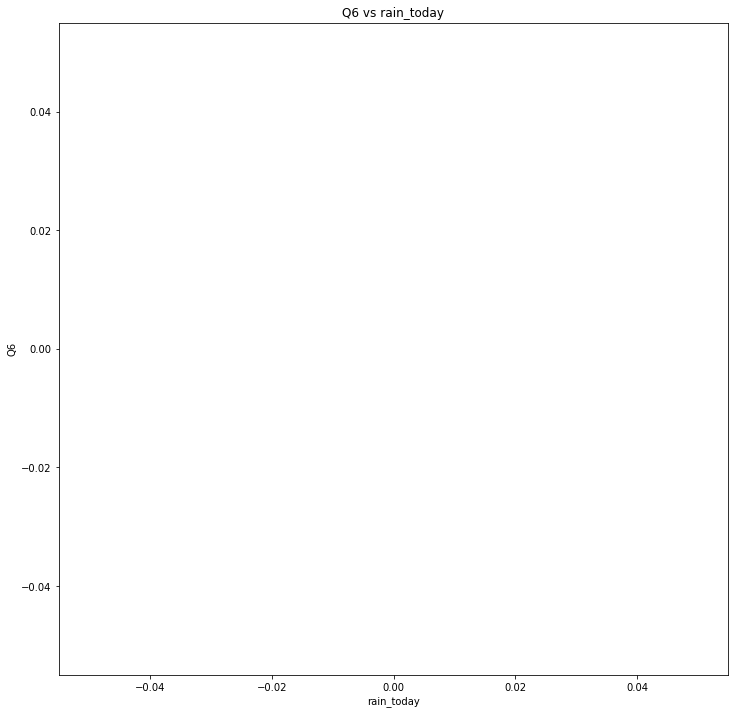

Q6 rain_today nan
STARTING  snow_1h Q6


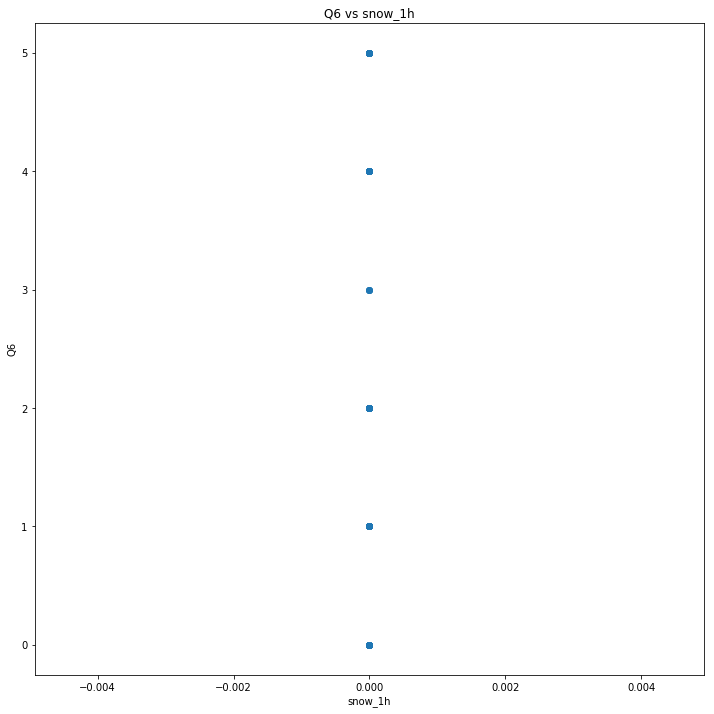

Q6 snow_1h nan
STARTING  snow_3h Q6


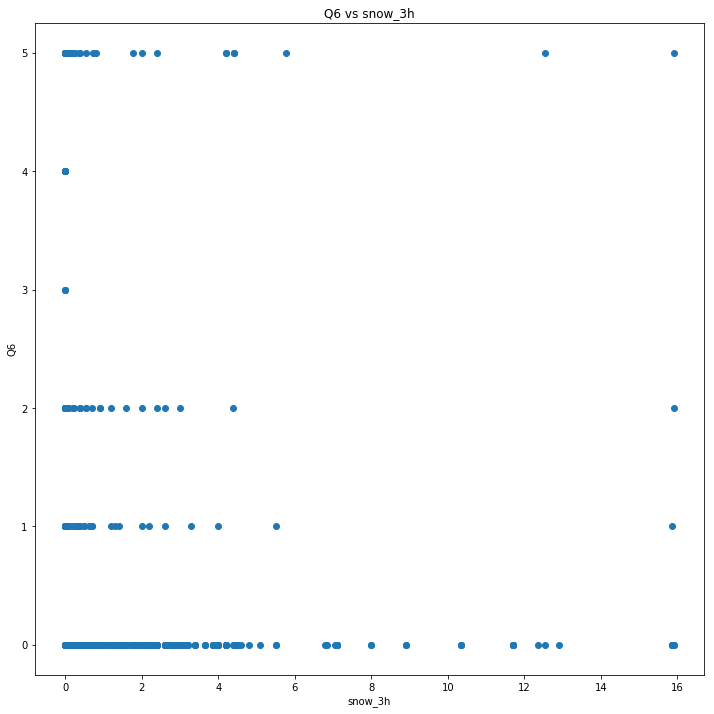

Q6 snow_3h 0.008798939166283026
STARTING  snow_24h Q6


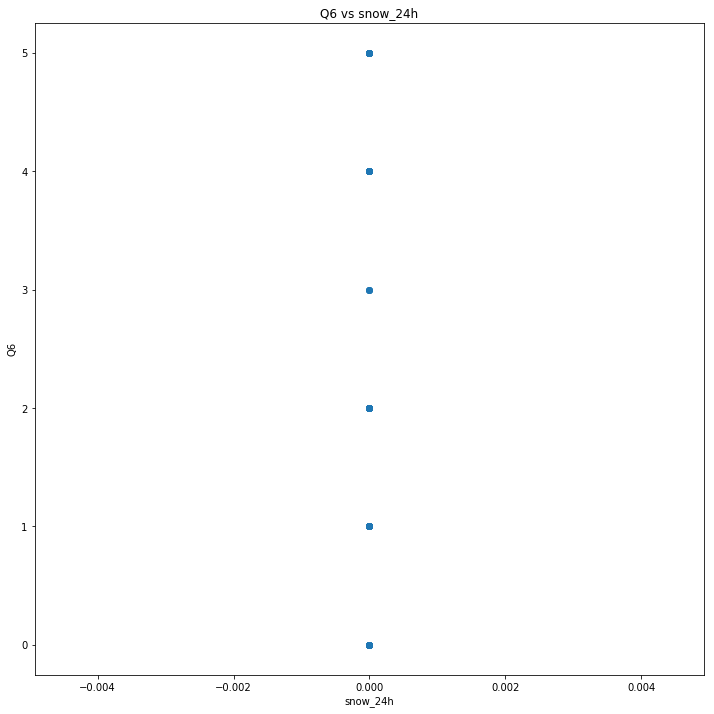

Q6 snow_24h nan
STARTING  snow_today Q6


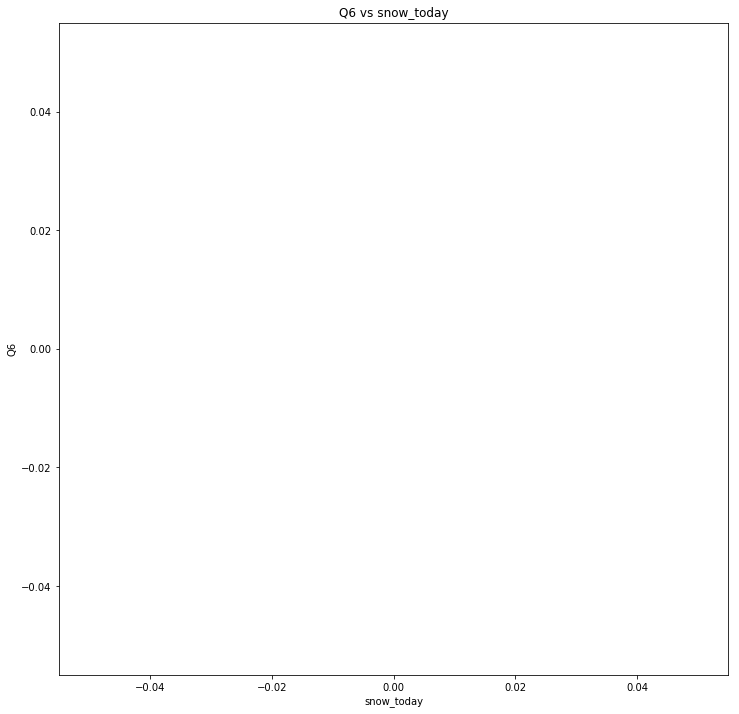

Q6 snow_today nan
STARTING  clouds_all Q6


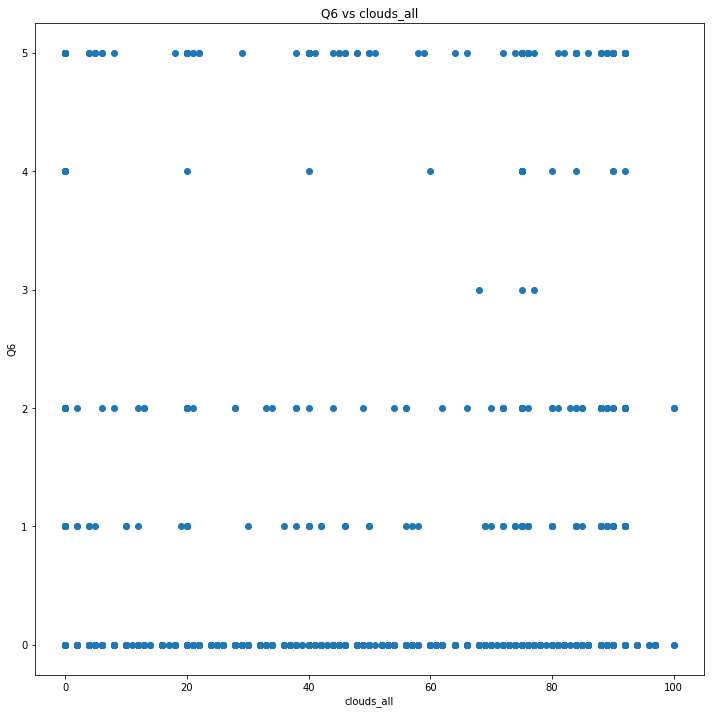

Q6 clouds_all 0.009776073097774961
STARTING  temp Q7


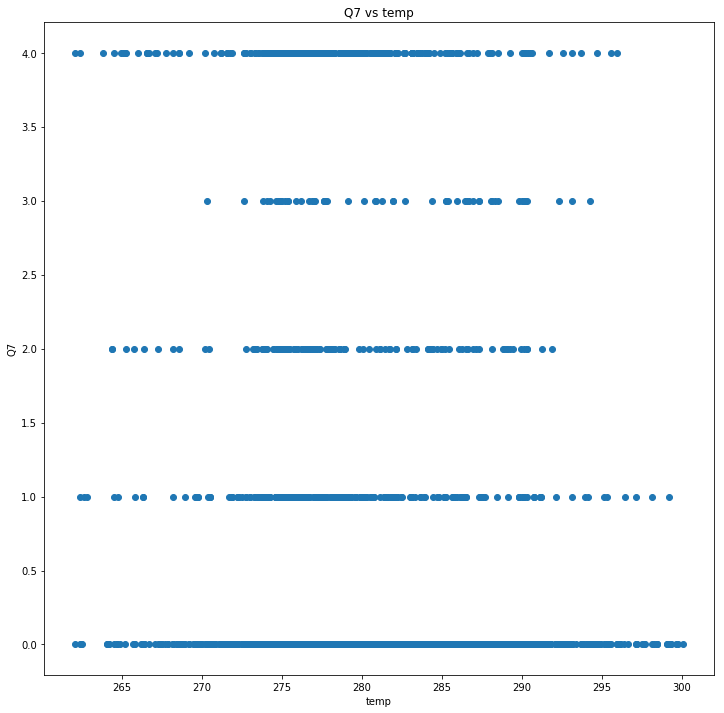

Q7 temp -0.12811309485248498
STARTING  pressure Q7


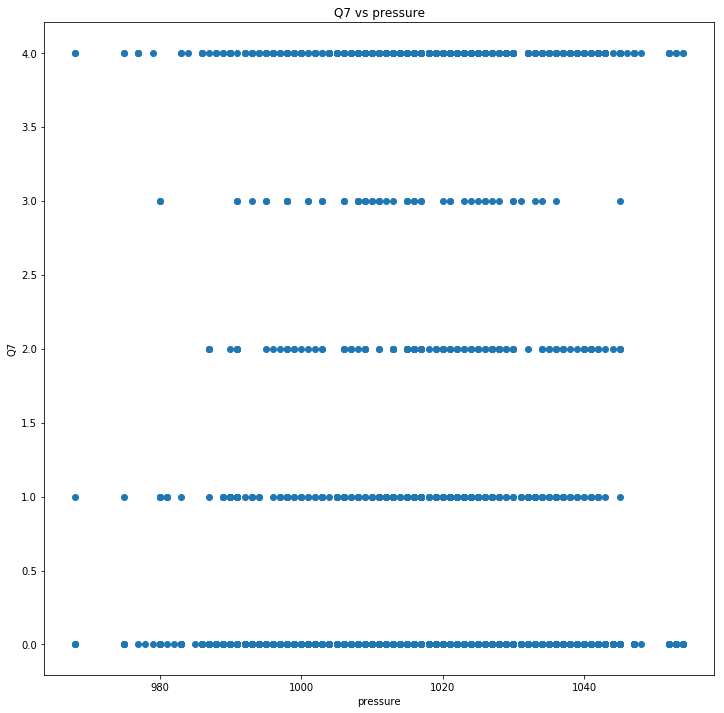

Q7 pressure 0.009036416639280134
STARTING  humidity Q7


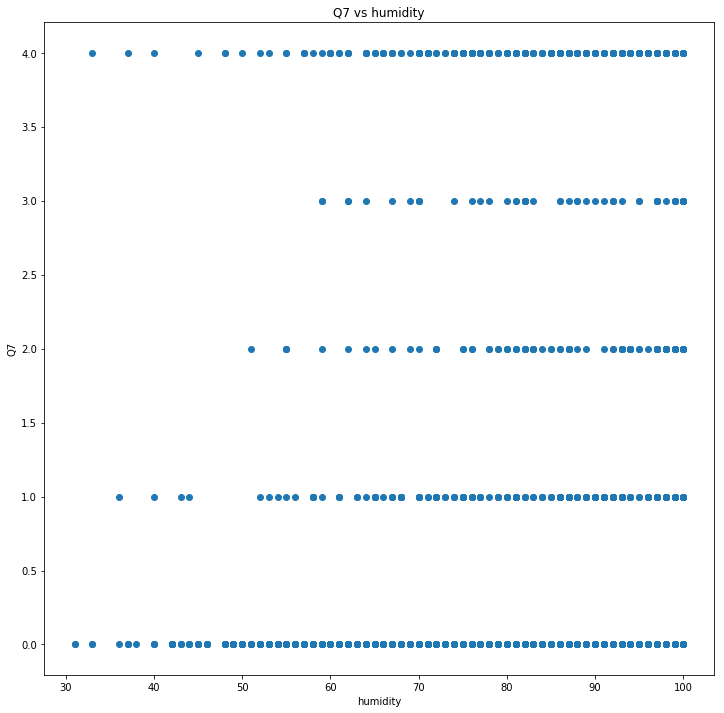

Q7 humidity 0.05010893945421784
STARTING  wind_speed Q7


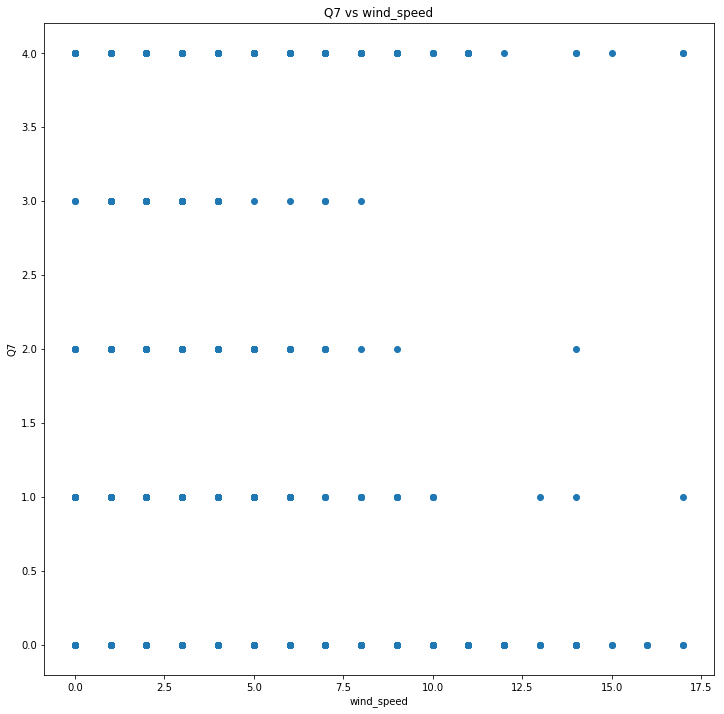

Q7 wind_speed -0.011031419086726175
STARTING  wind_deg Q7


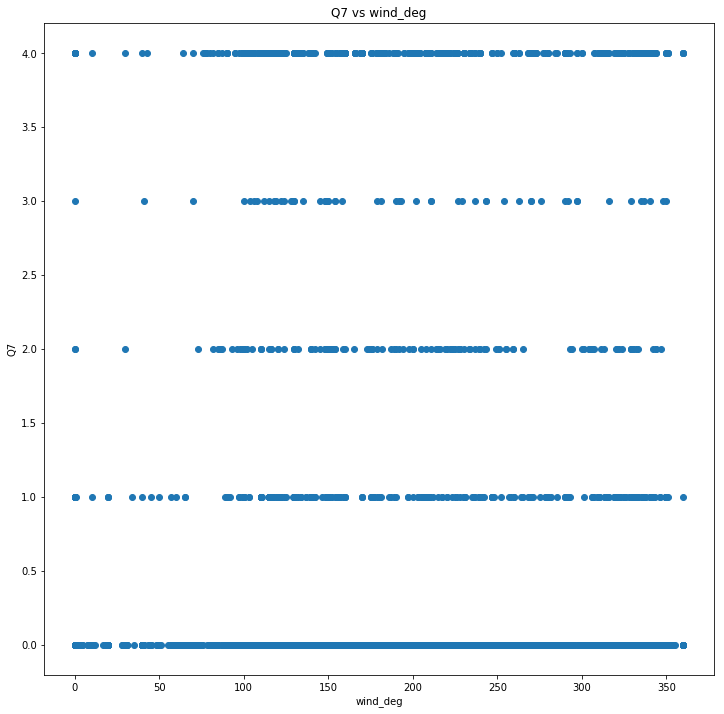

Q7 wind_deg 0.0224986004678621
STARTING  rain_1h Q7


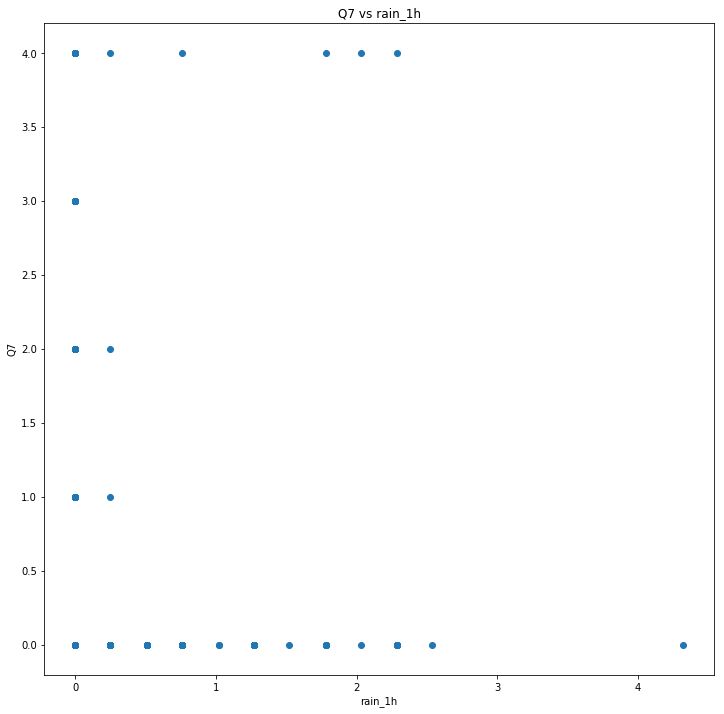

Q7 rain_1h -0.019591786095688846
STARTING  rain_3h Q7


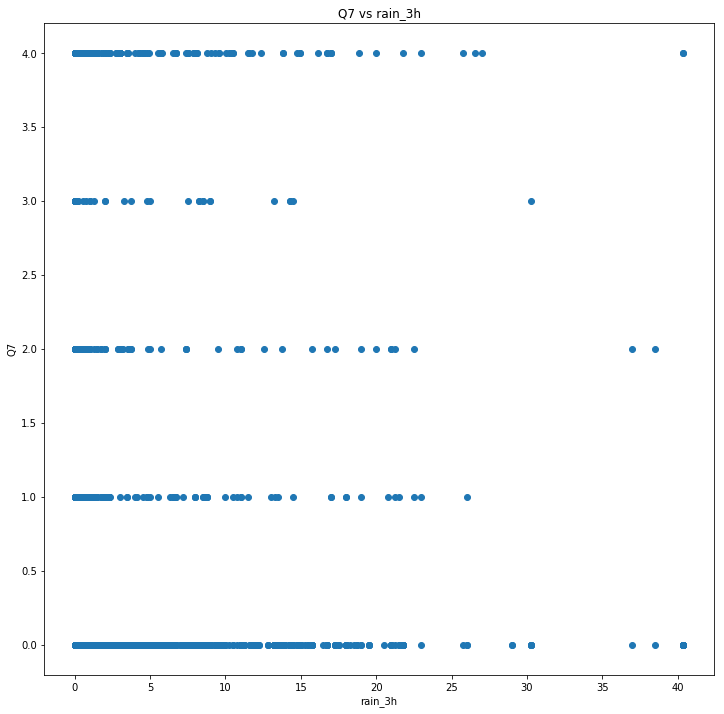

Q7 rain_3h 0.032701884171876944
STARTING  rain_24h Q7


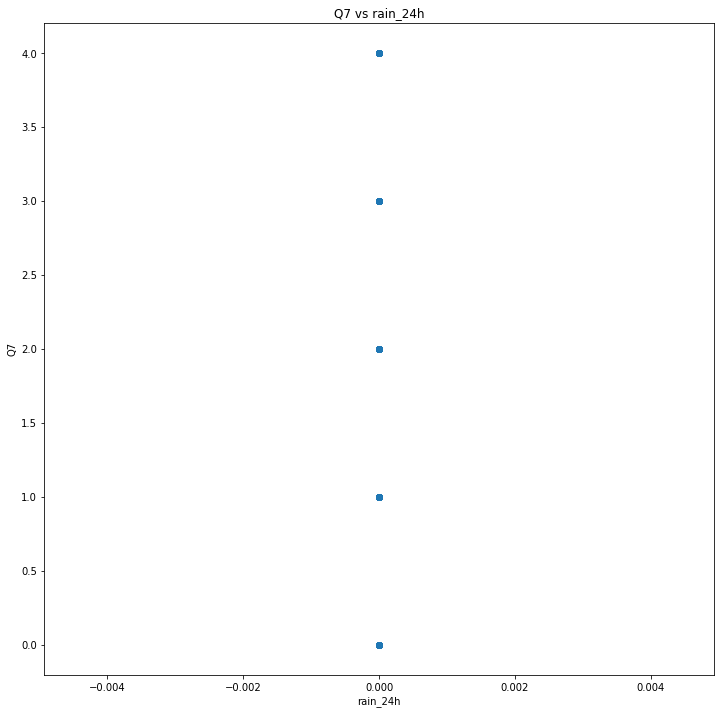

Q7 rain_24h nan
STARTING  rain_today Q7


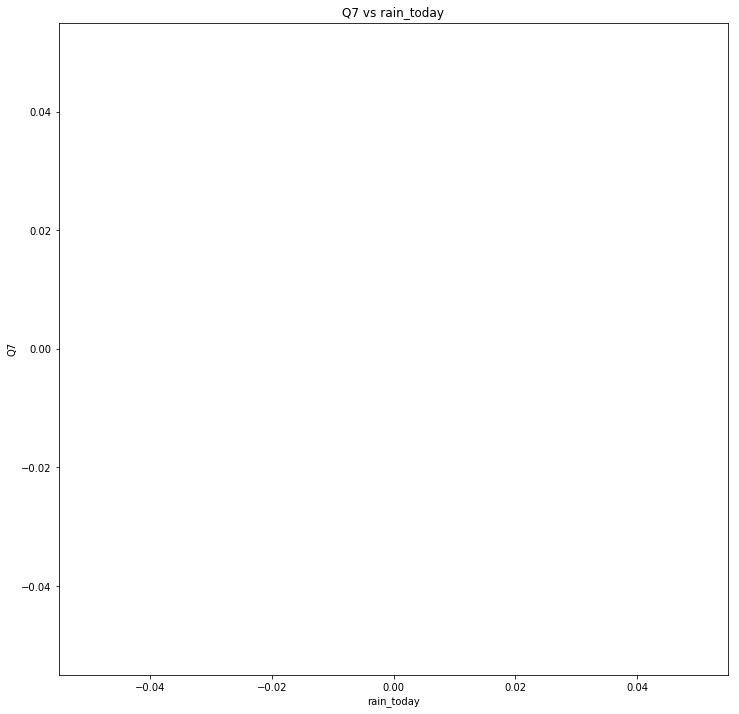

Q7 rain_today nan
STARTING  snow_1h Q7


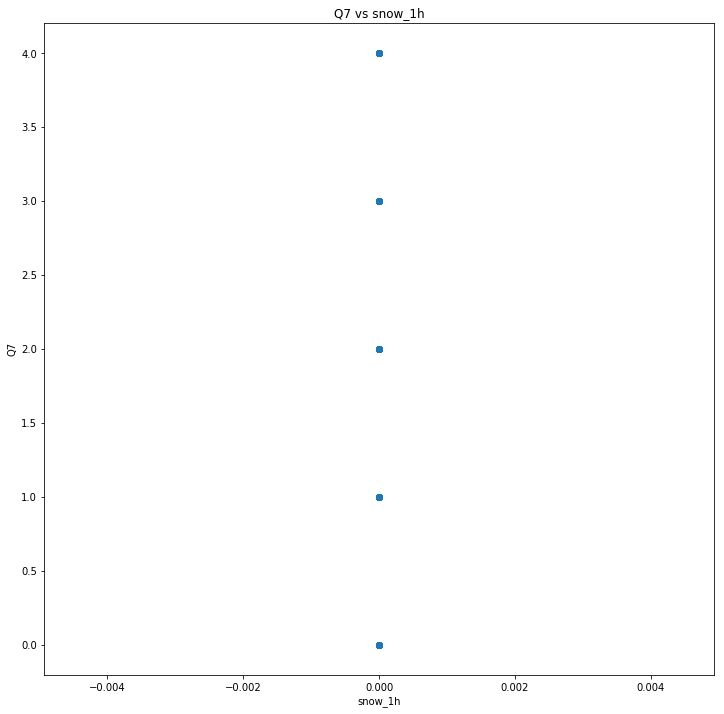

Q7 snow_1h nan
STARTING  snow_3h Q7


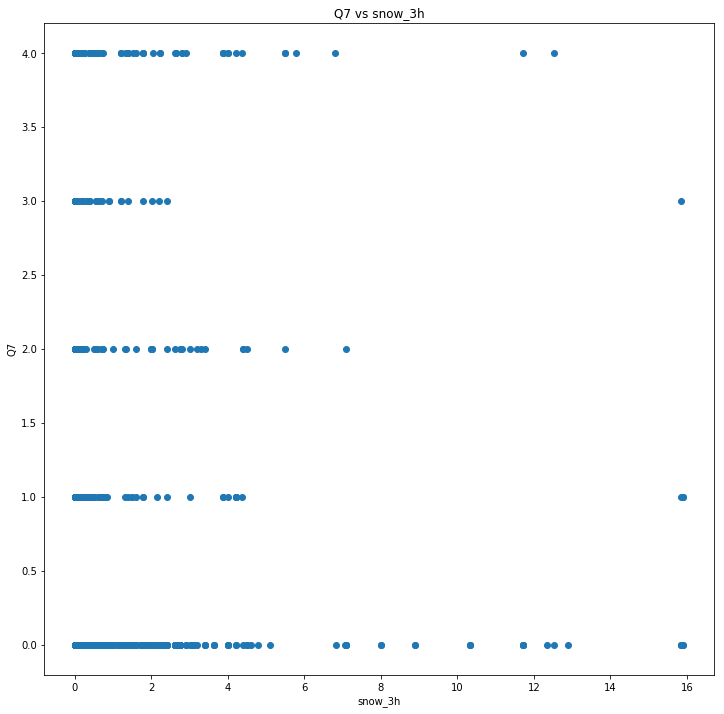

Q7 snow_3h 0.039250756135210126
STARTING  snow_24h Q7


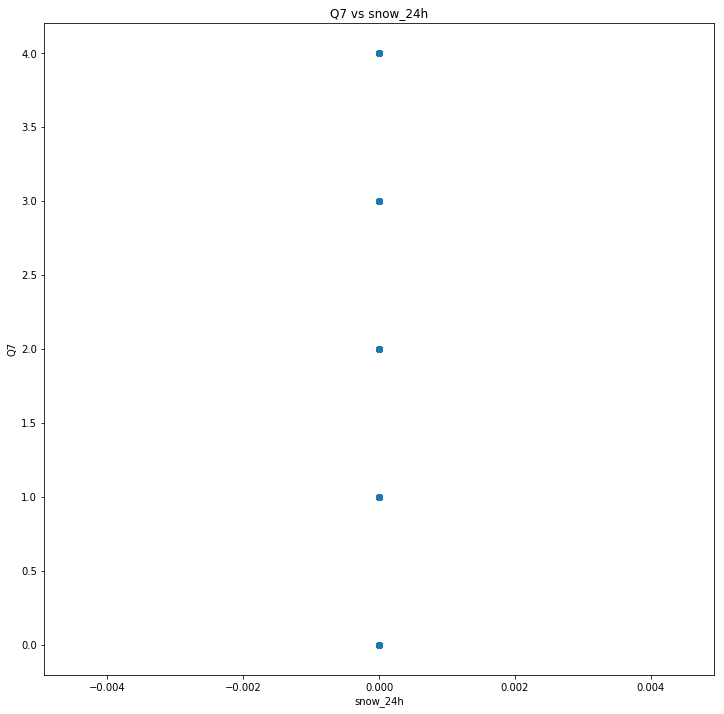

Q7 snow_24h nan
STARTING  snow_today Q7


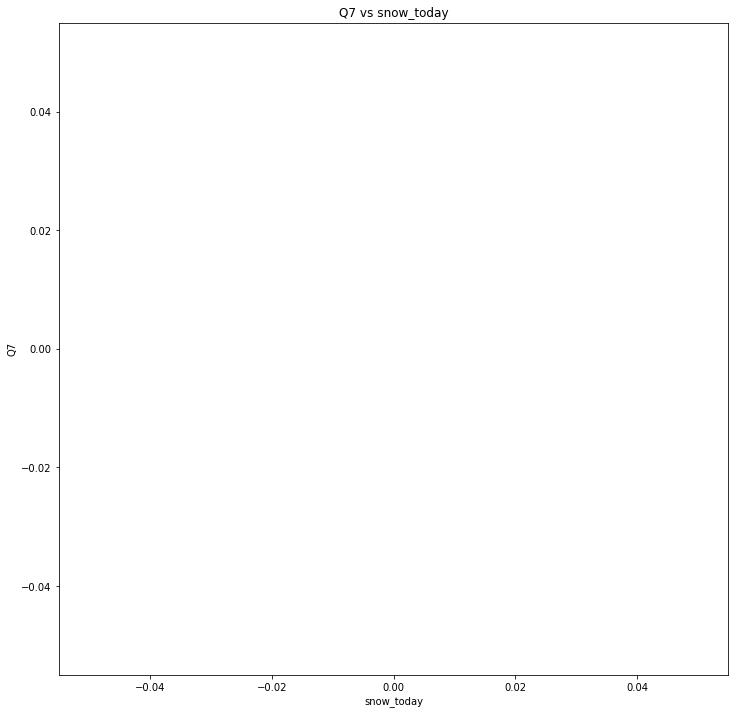

Q7 snow_today nan
STARTING  clouds_all Q7


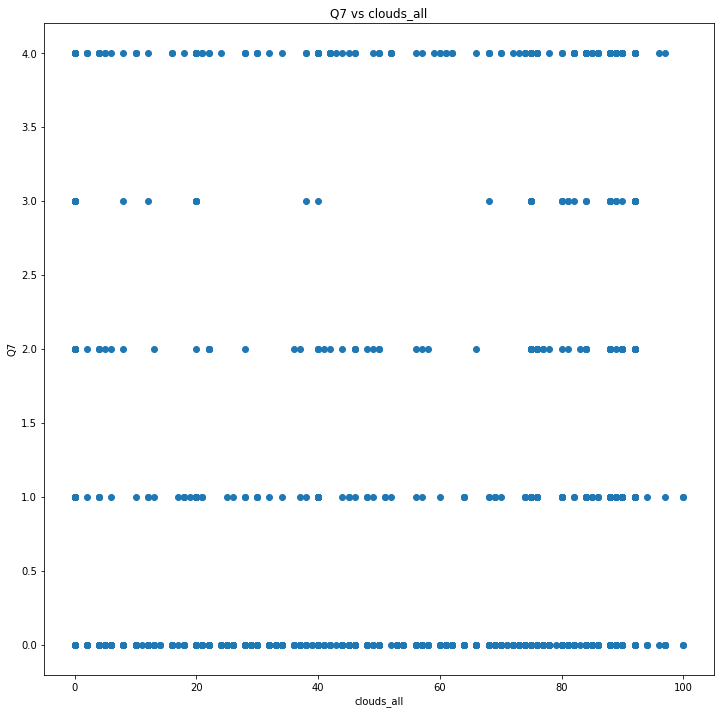

Q7 clouds_all 0.027732697310683452
STARTING  temp CQ1


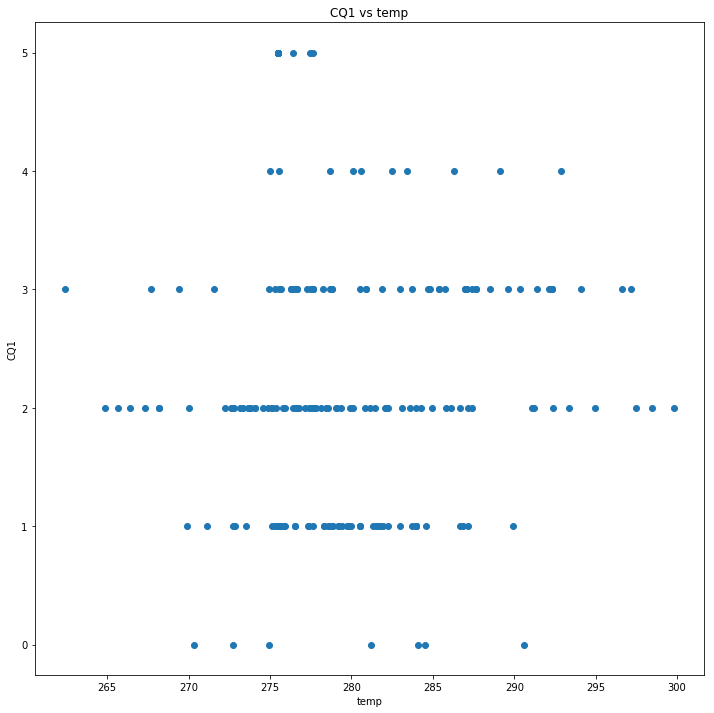

CQ1 temp 0.008553933296867839
STARTING  pressure CQ1


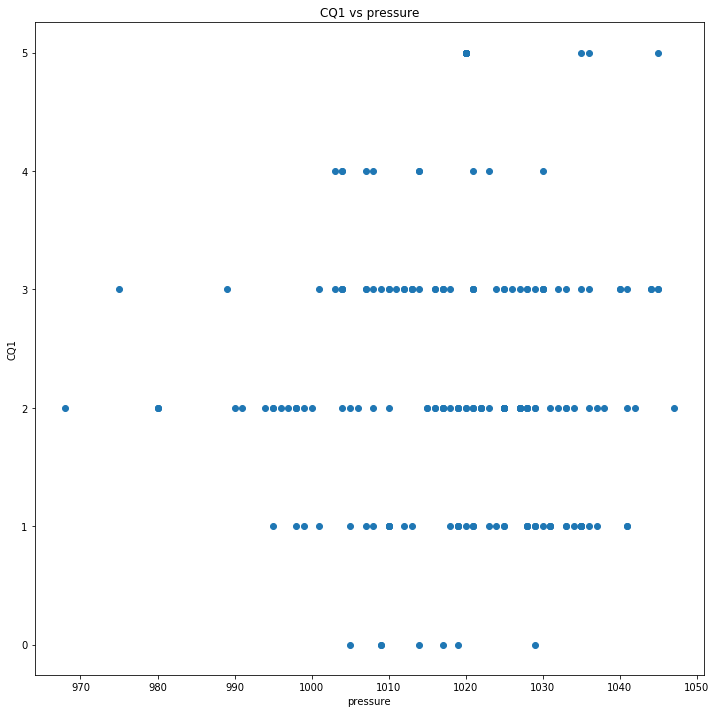

CQ1 pressure -0.0018189276275385378
STARTING  humidity CQ1


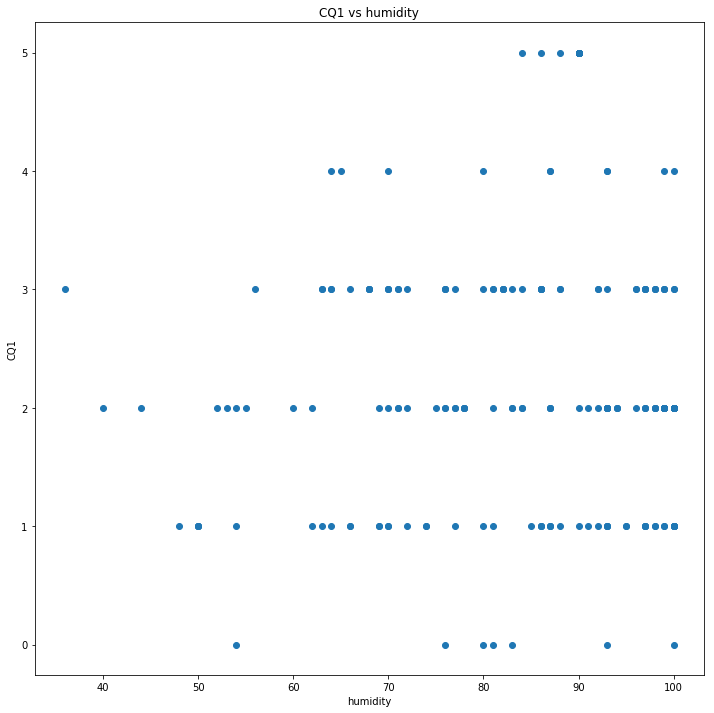

CQ1 humidity 0.06391820688800667
STARTING  wind_speed CQ1


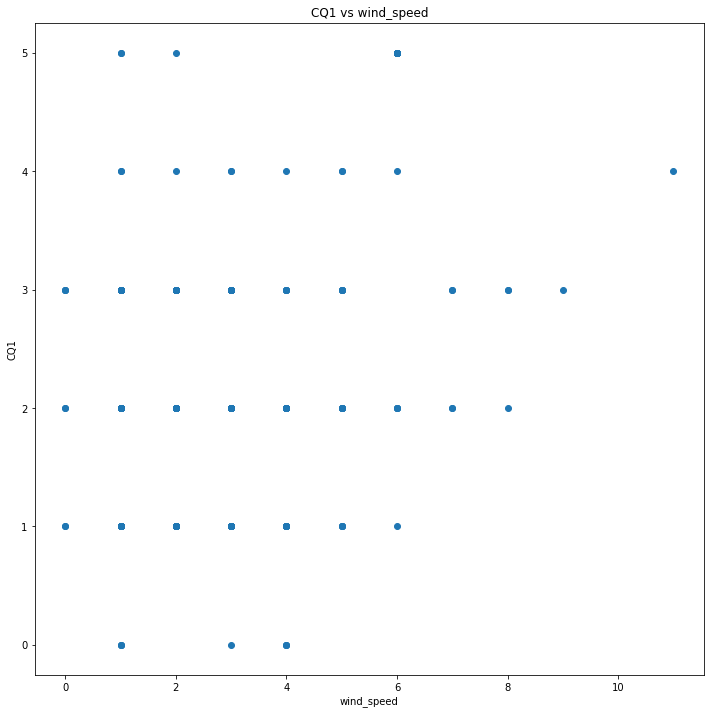

CQ1 wind_speed 0.32278871749644306
STARTING  wind_deg CQ1


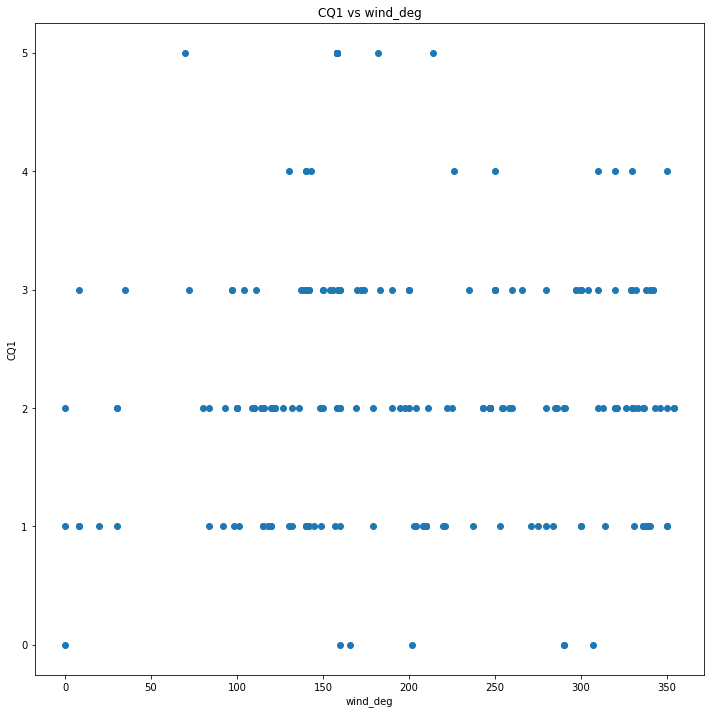

CQ1 wind_deg -0.019573818307366368
STARTING  rain_1h CQ1


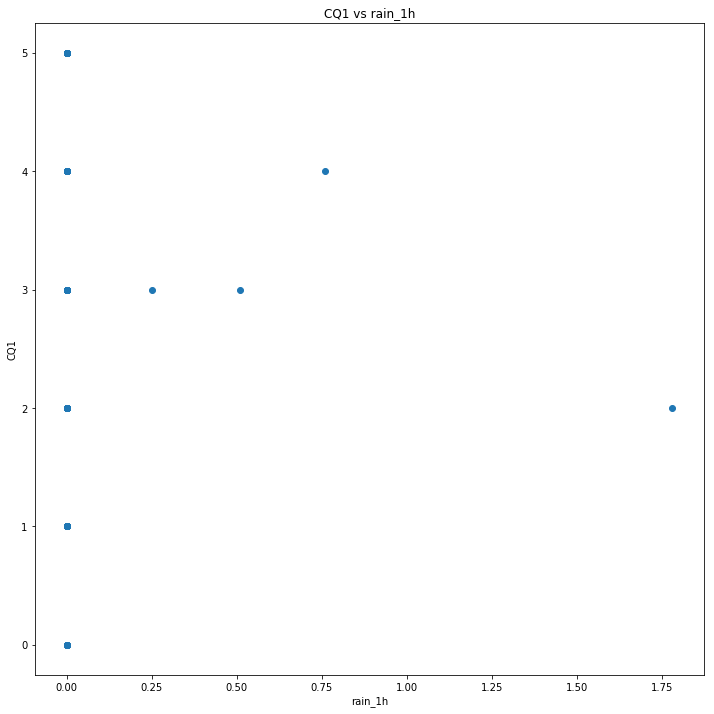

CQ1 rain_1h 0.040682777638632435
STARTING  rain_3h CQ1


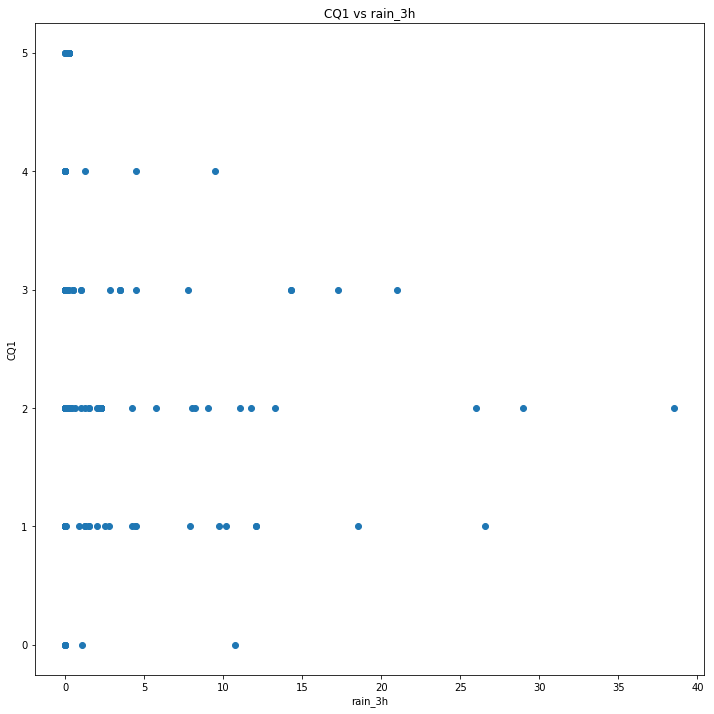

CQ1 rain_3h -0.0954919603390851
STARTING  rain_24h CQ1


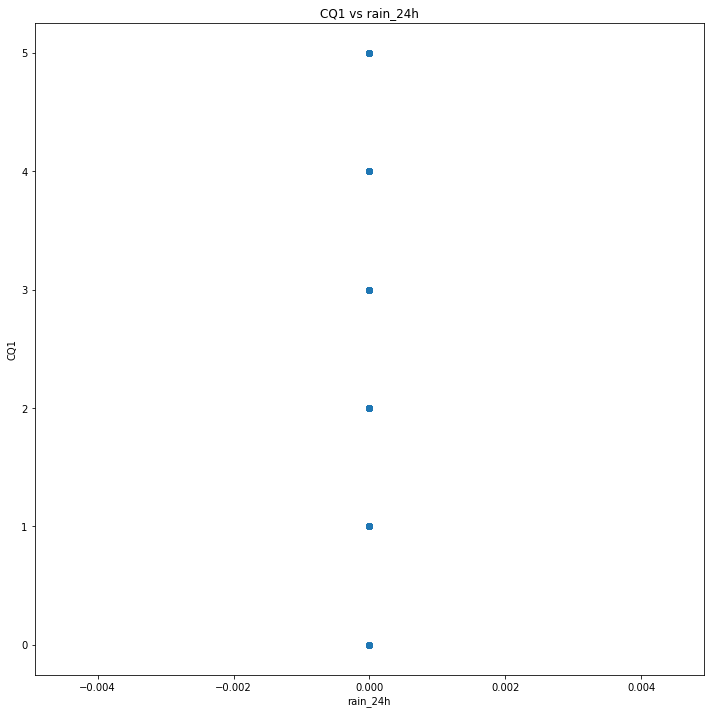

CQ1 rain_24h nan
STARTING  rain_today CQ1


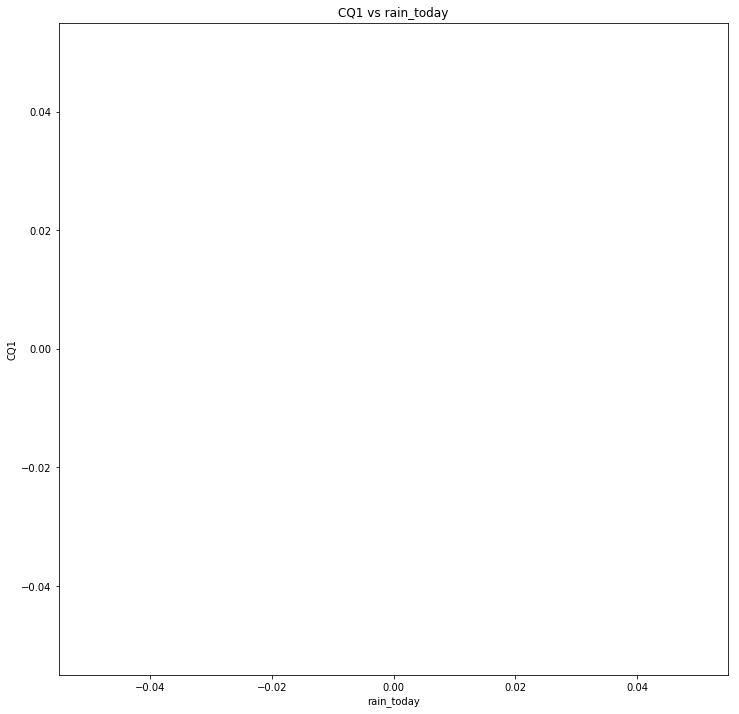

CQ1 rain_today nan
STARTING  snow_1h CQ1


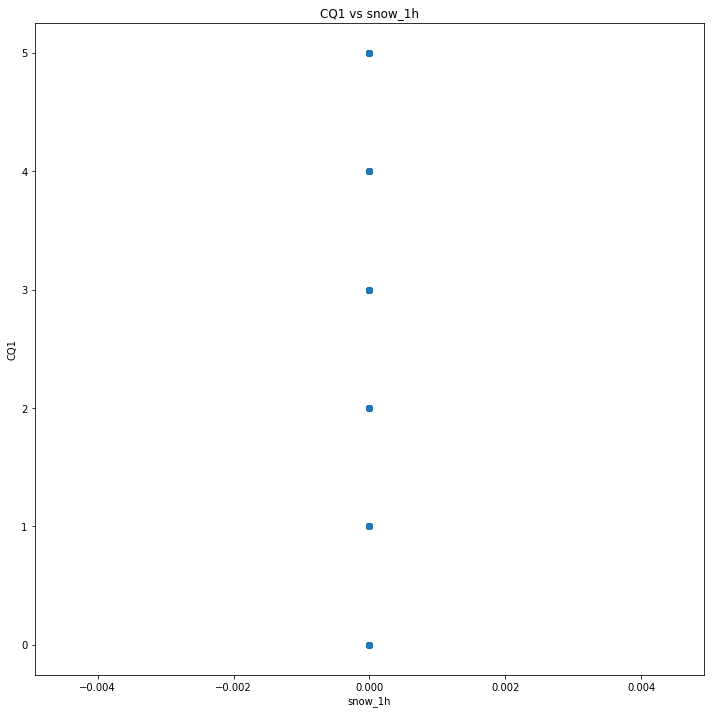

CQ1 snow_1h nan
STARTING  snow_3h CQ1


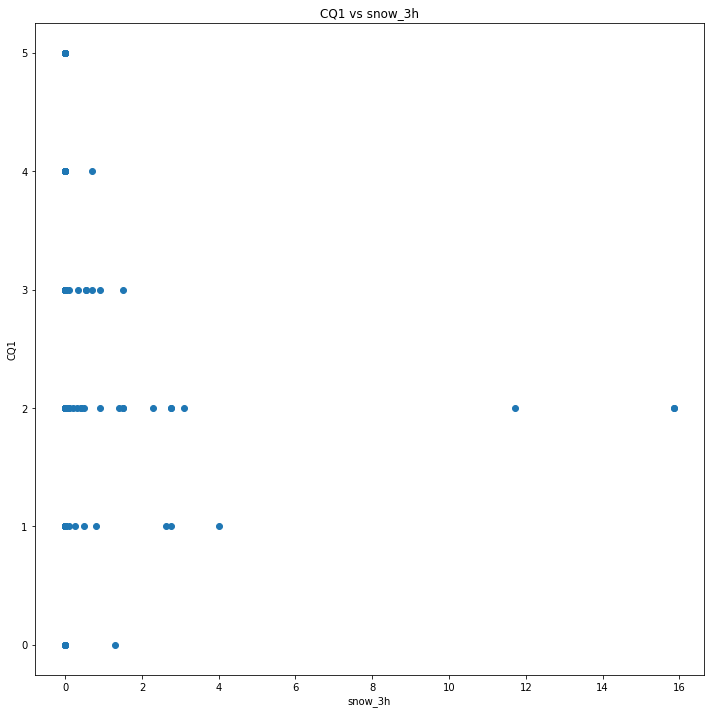

CQ1 snow_3h -0.06190194592615311
STARTING  snow_24h CQ1


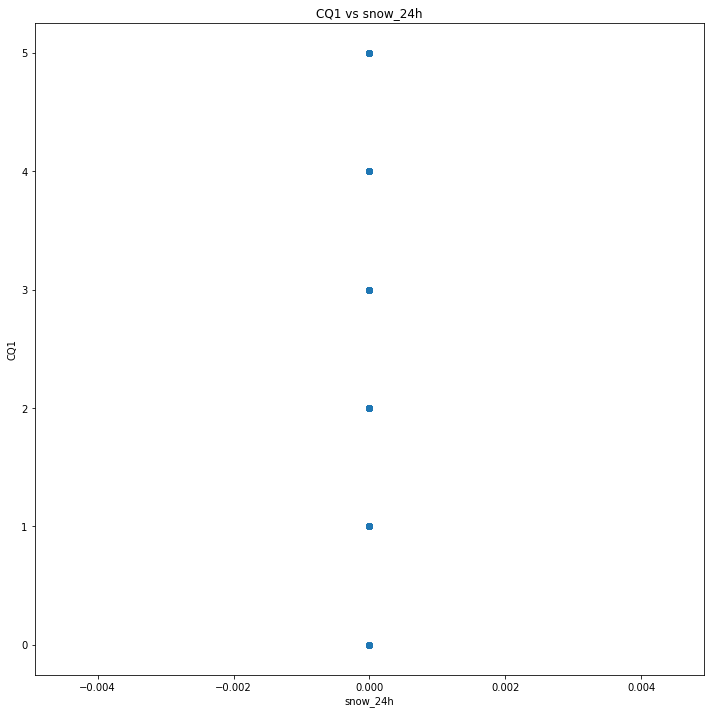

CQ1 snow_24h nan
STARTING  snow_today CQ1


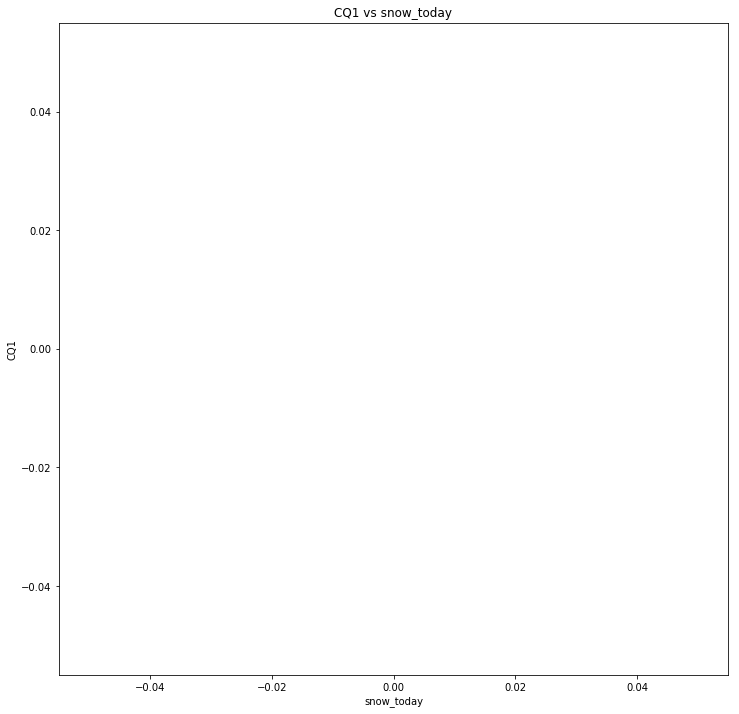

CQ1 snow_today nan
STARTING  clouds_all CQ1


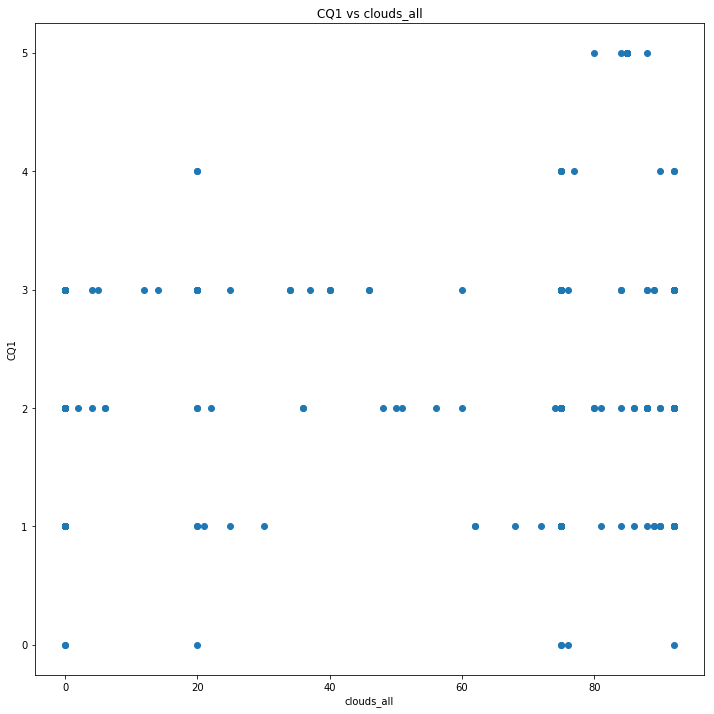

CQ1 clouds_all 0.18163143198929754
STARTING  temp CQ2


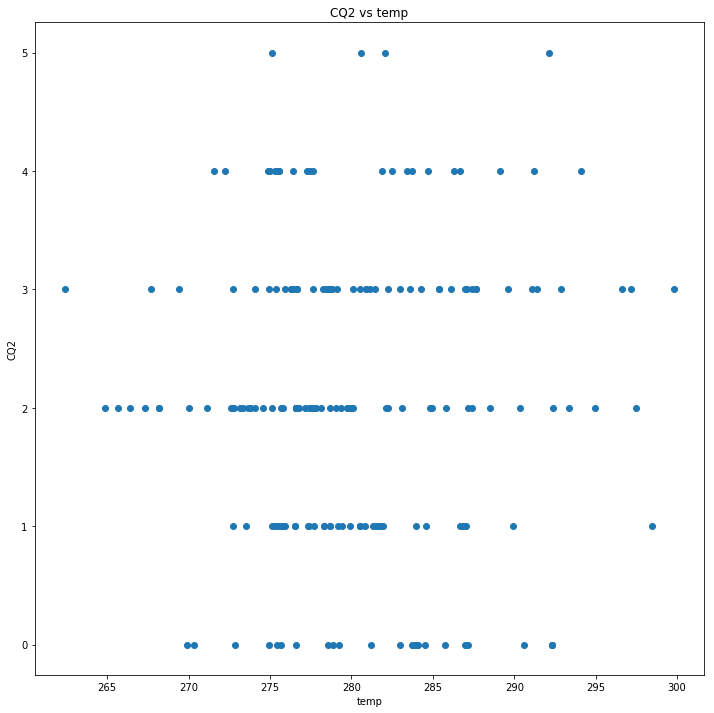

CQ2 temp -0.049866439672423574
STARTING  pressure CQ2


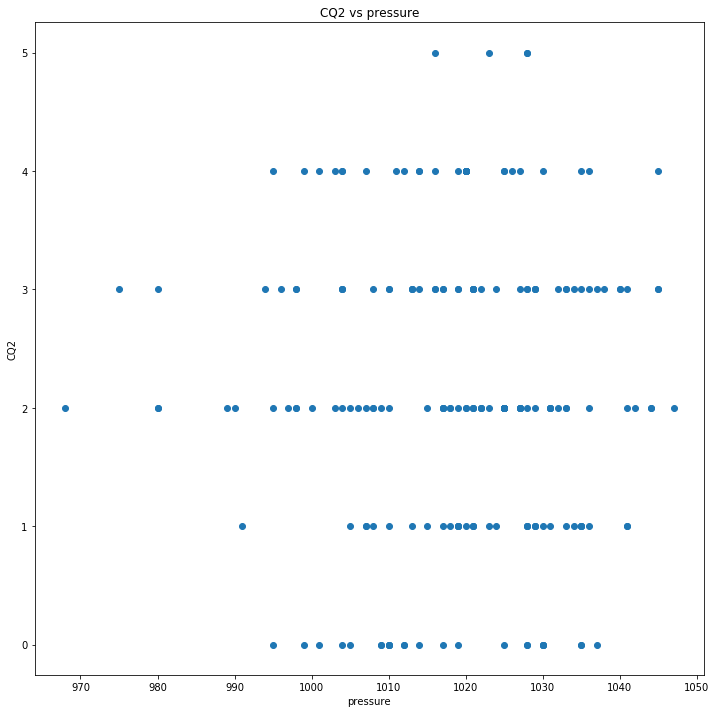

CQ2 pressure -0.012048798663972859
STARTING  humidity CQ2


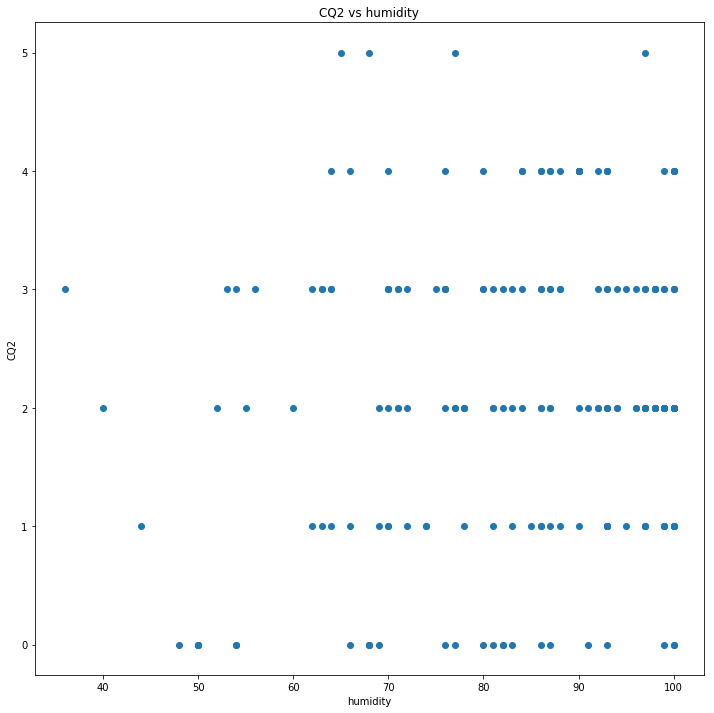

CQ2 humidity 0.13963992420275745
STARTING  wind_speed CQ2


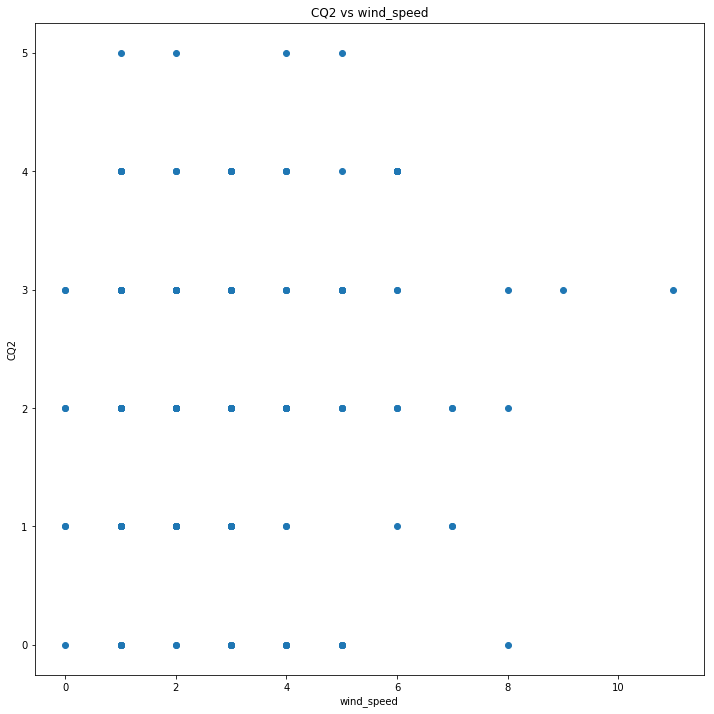

CQ2 wind_speed 0.14812453507401876
STARTING  wind_deg CQ2


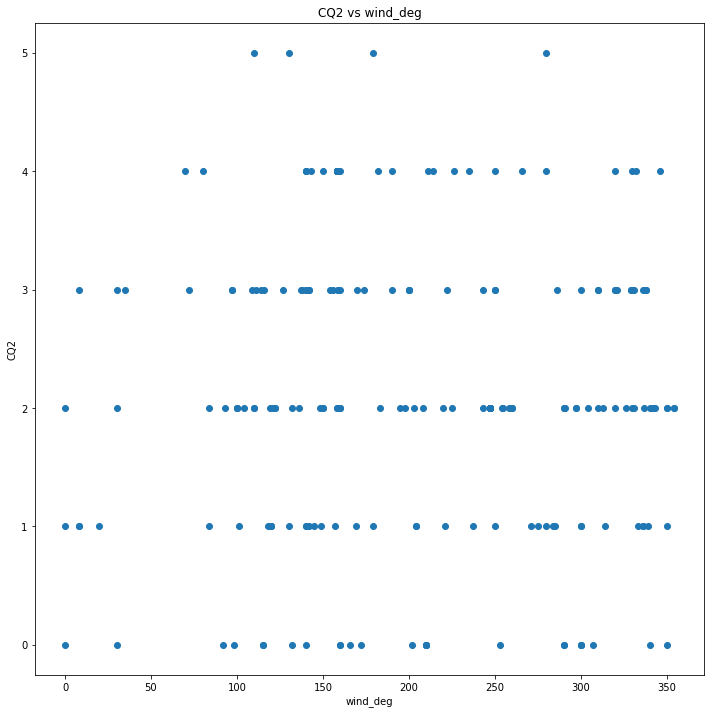

CQ2 wind_deg -0.03687408730824228
STARTING  rain_1h CQ2


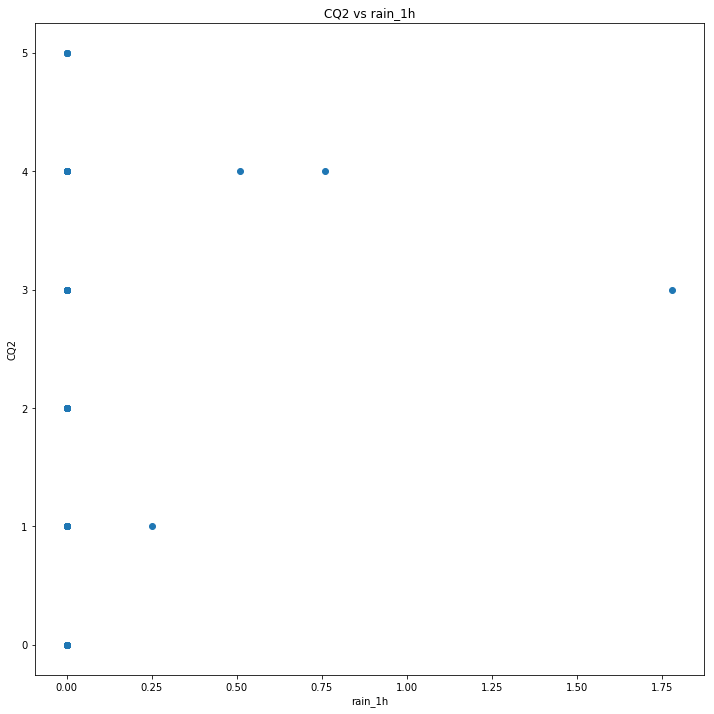

CQ2 rain_1h 0.09205468558428331
STARTING  rain_3h CQ2


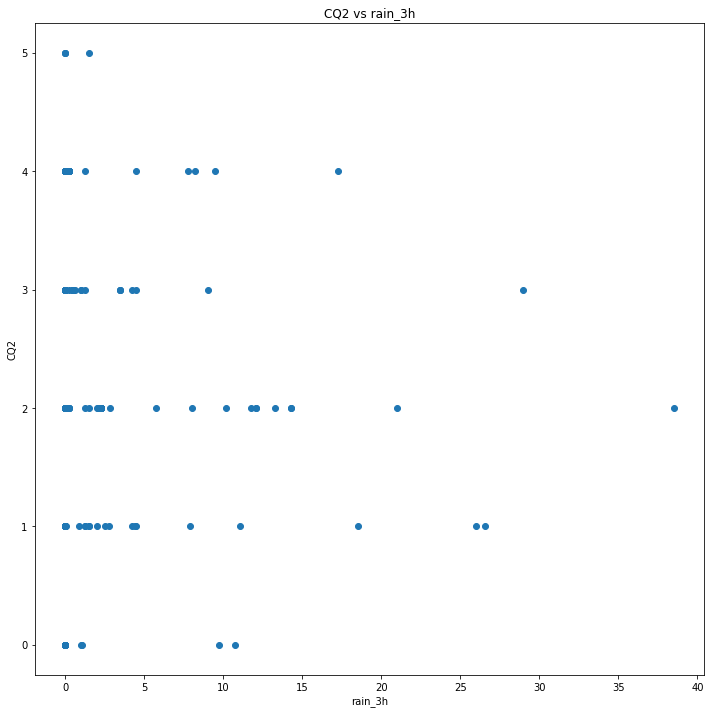

CQ2 rain_3h -0.049069245993972214
STARTING  rain_24h CQ2


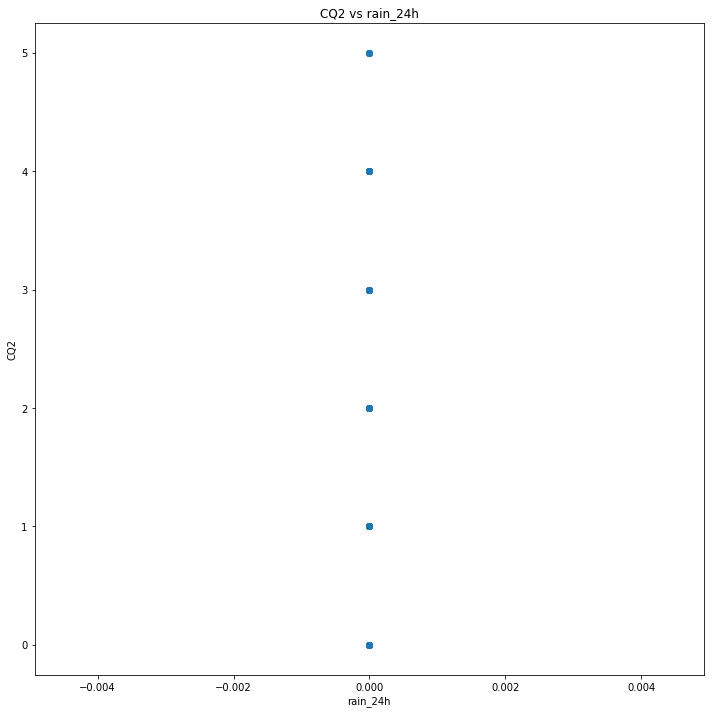

CQ2 rain_24h nan
STARTING  rain_today CQ2


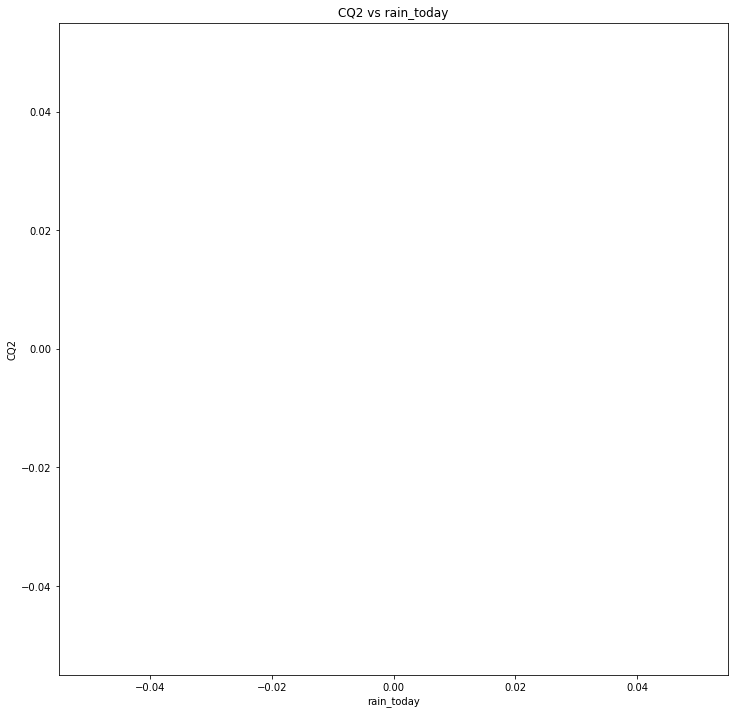

CQ2 rain_today nan
STARTING  snow_1h CQ2


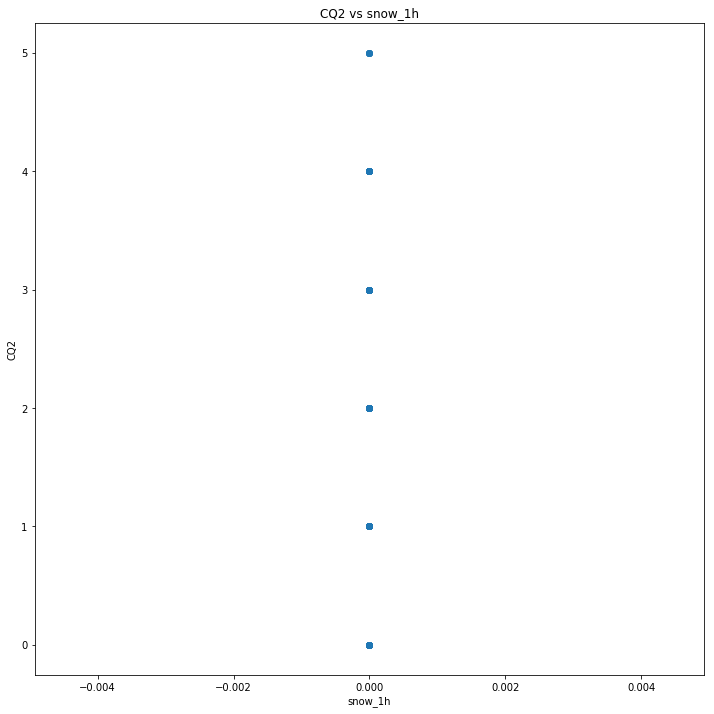

CQ2 snow_1h nan
STARTING  snow_3h CQ2


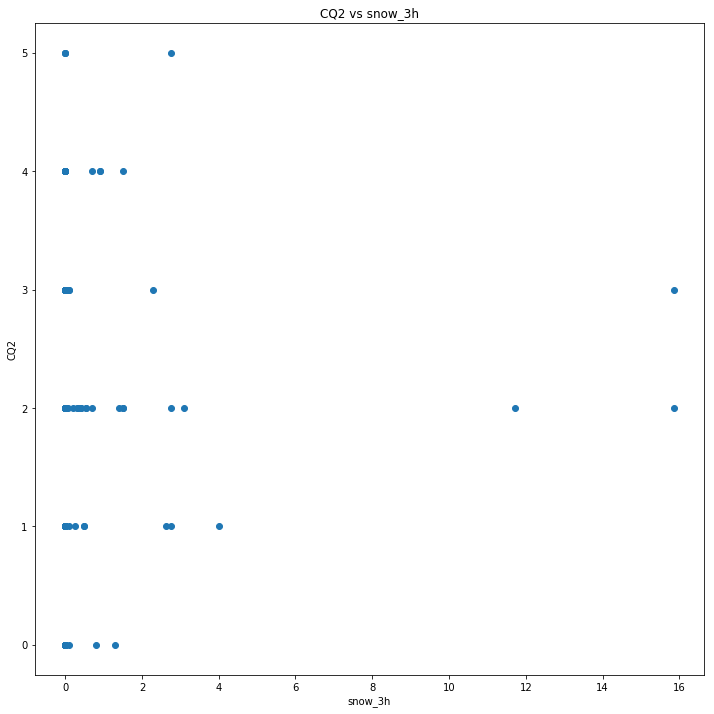

CQ2 snow_3h 0.010401394447606217
STARTING  snow_24h CQ2


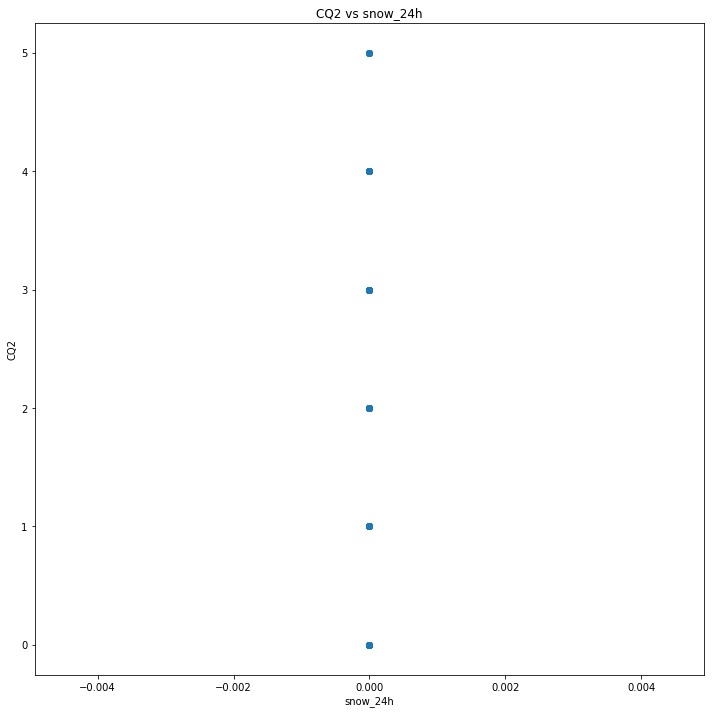

CQ2 snow_24h nan
STARTING  snow_today CQ2


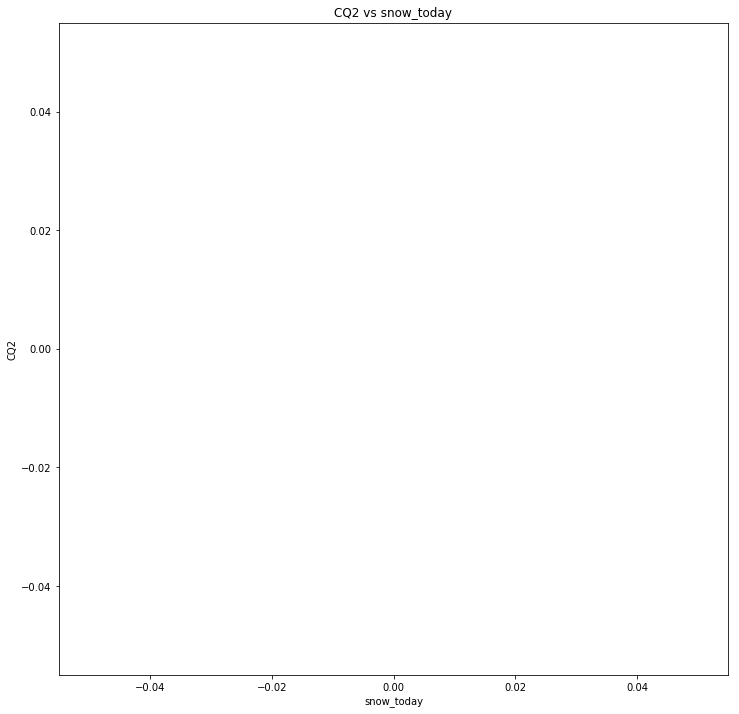

CQ2 snow_today nan
STARTING  clouds_all CQ2


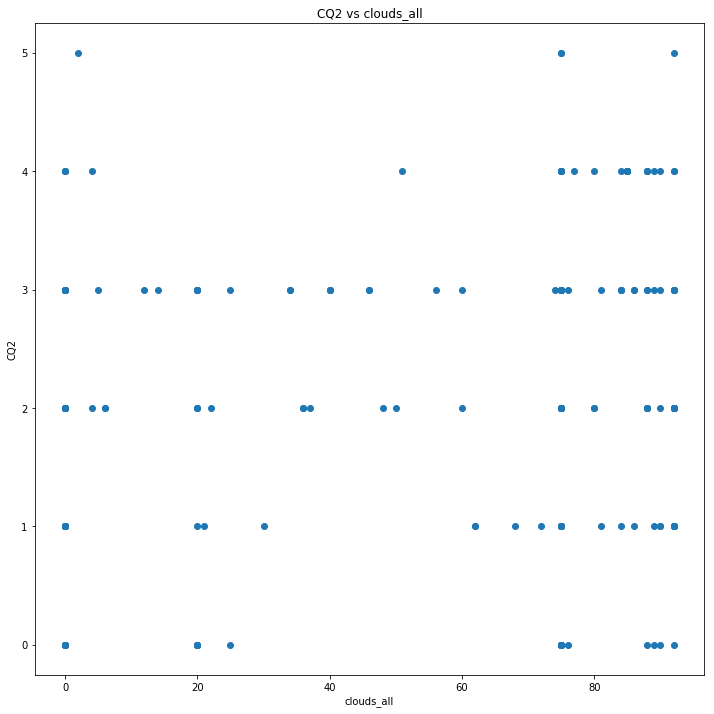

CQ2 clouds_all 0.17405245489222246
STARTING  temp CQ3


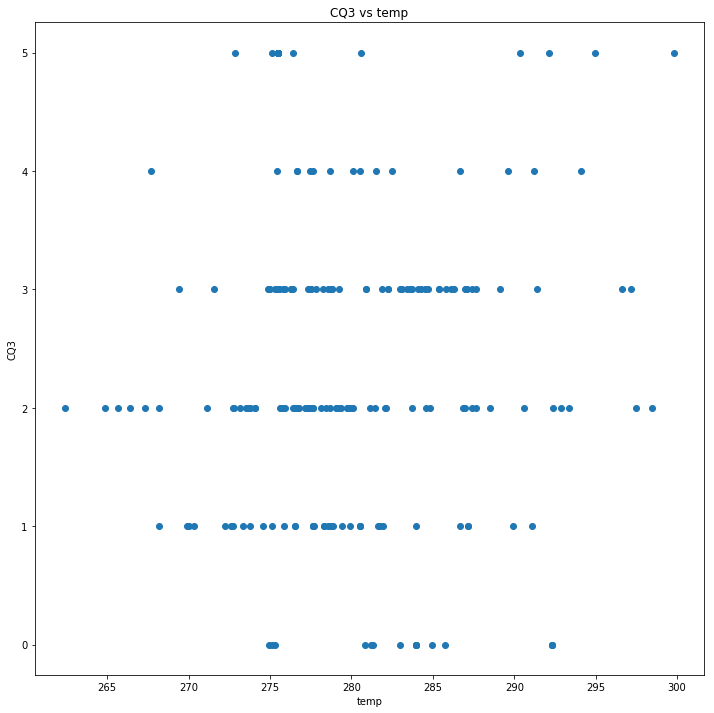

CQ3 temp 0.011741075068960731
STARTING  pressure CQ3


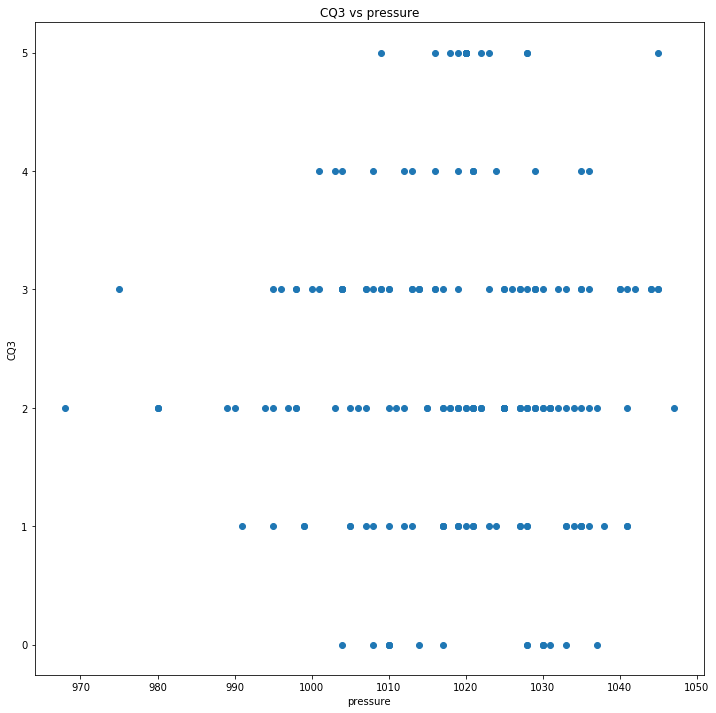

CQ3 pressure -0.008254275486173114
STARTING  humidity CQ3


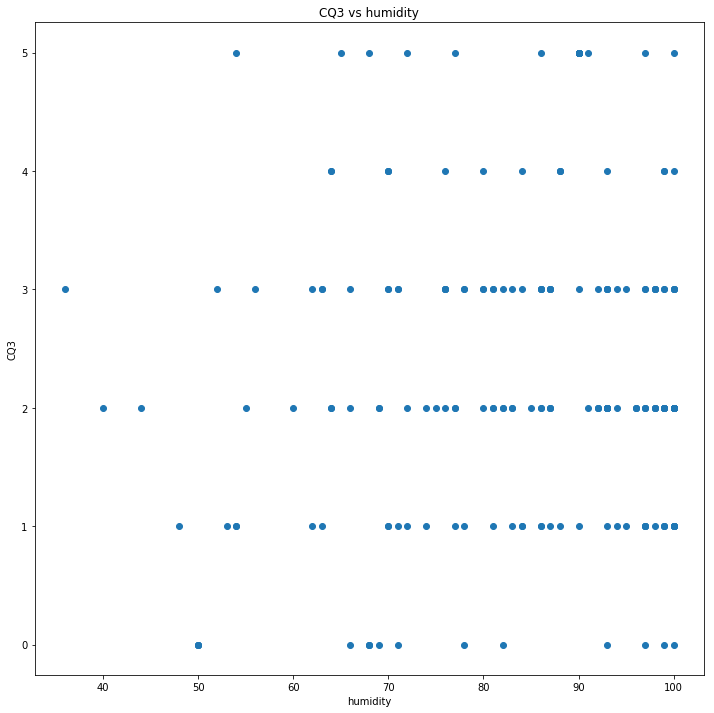

CQ3 humidity 0.08158969921693515
STARTING  wind_speed CQ3


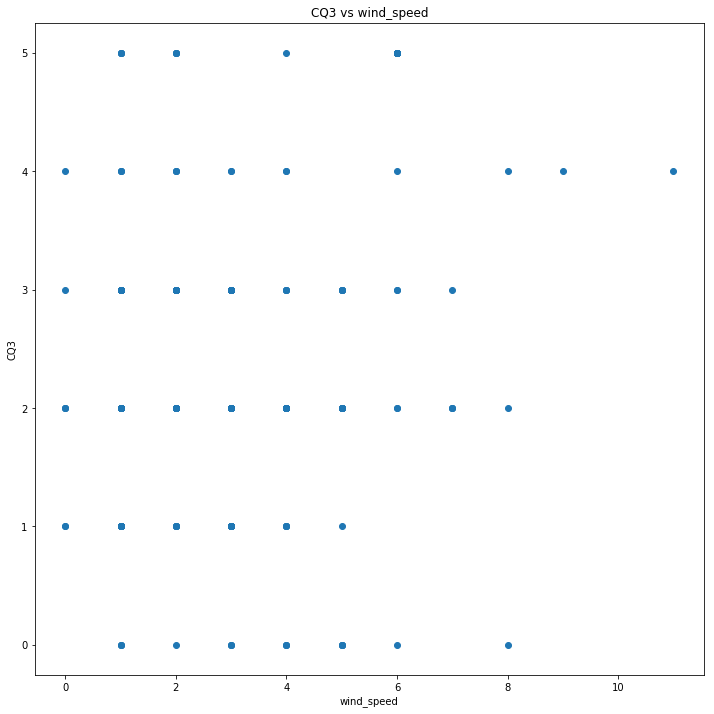

CQ3 wind_speed 0.17748949475669432
STARTING  wind_deg CQ3


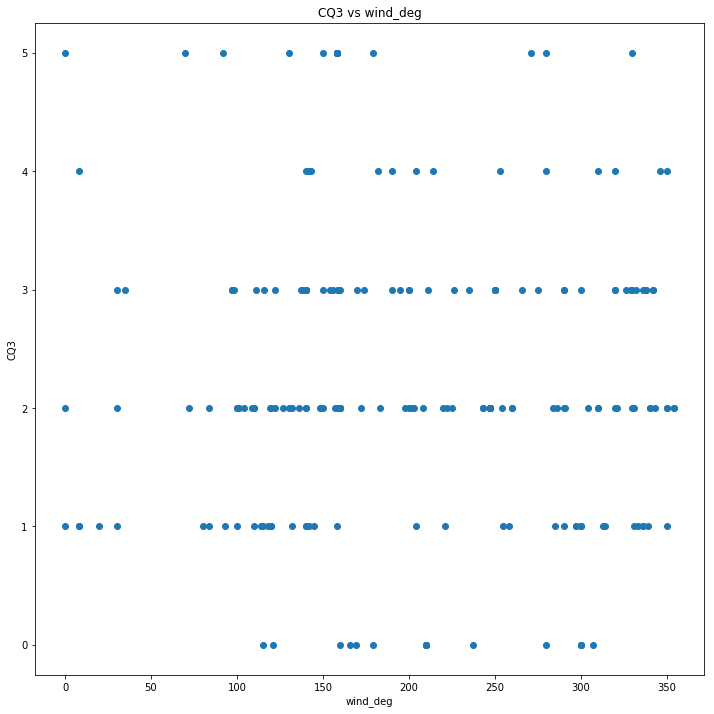

CQ3 wind_deg -0.06104908379364896
STARTING  rain_1h CQ3


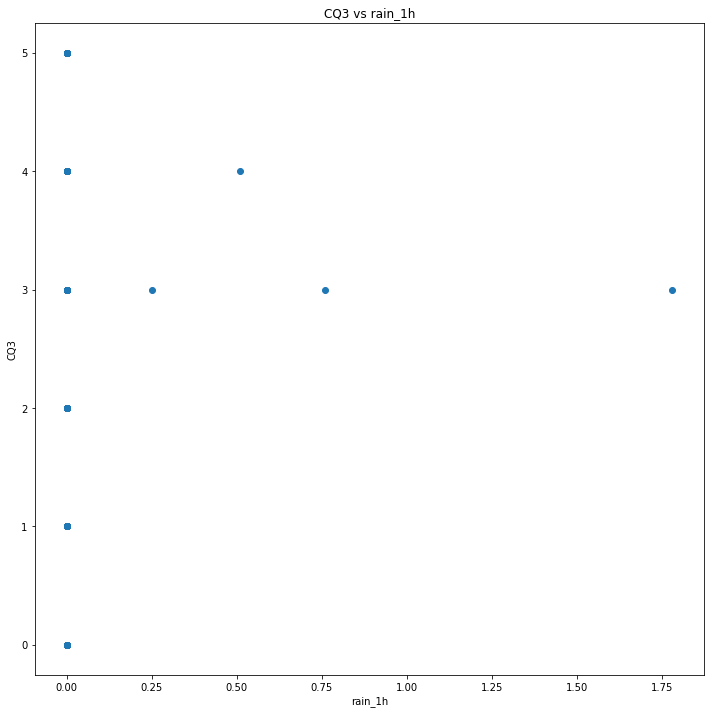

CQ3 rain_1h 0.0667847431911491
STARTING  rain_3h CQ3


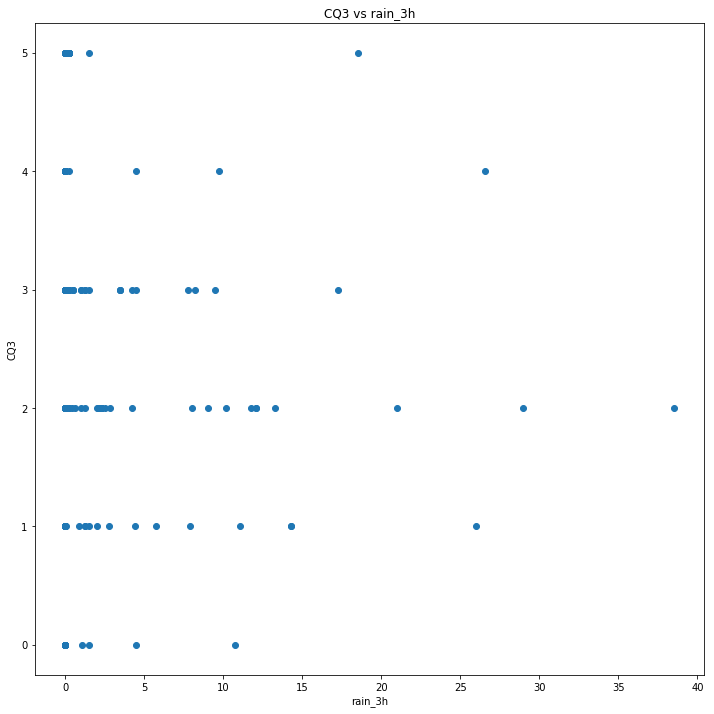

CQ3 rain_3h -0.04427913102766752
STARTING  rain_24h CQ3


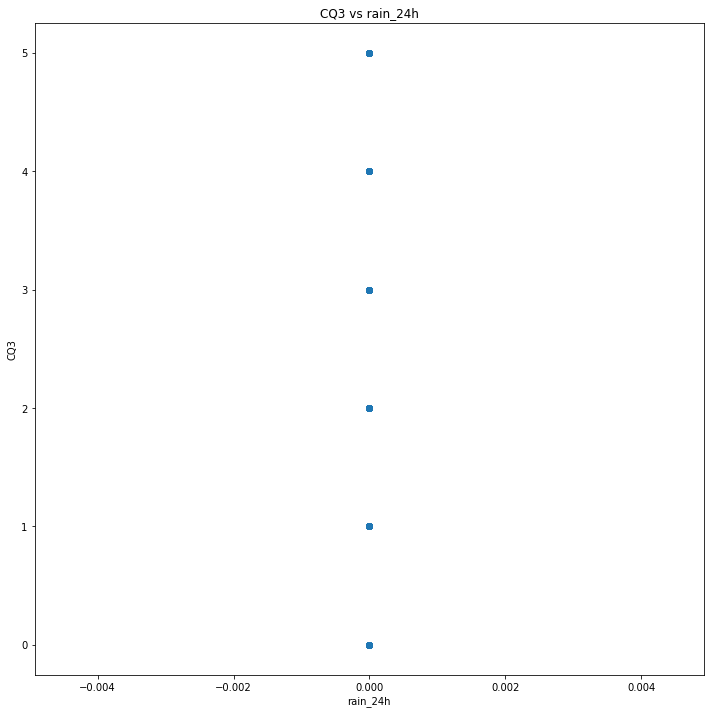

CQ3 rain_24h nan
STARTING  rain_today CQ3


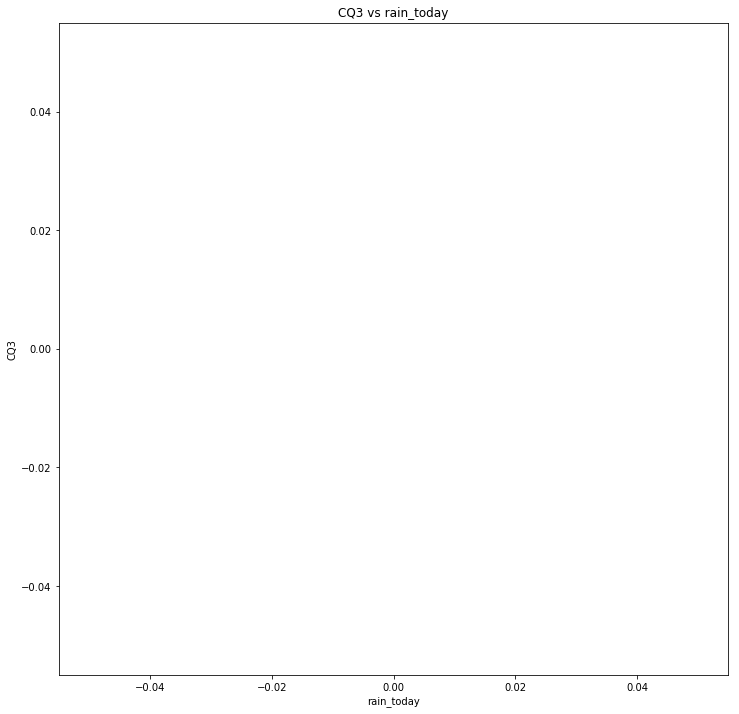

CQ3 rain_today nan
STARTING  snow_1h CQ3


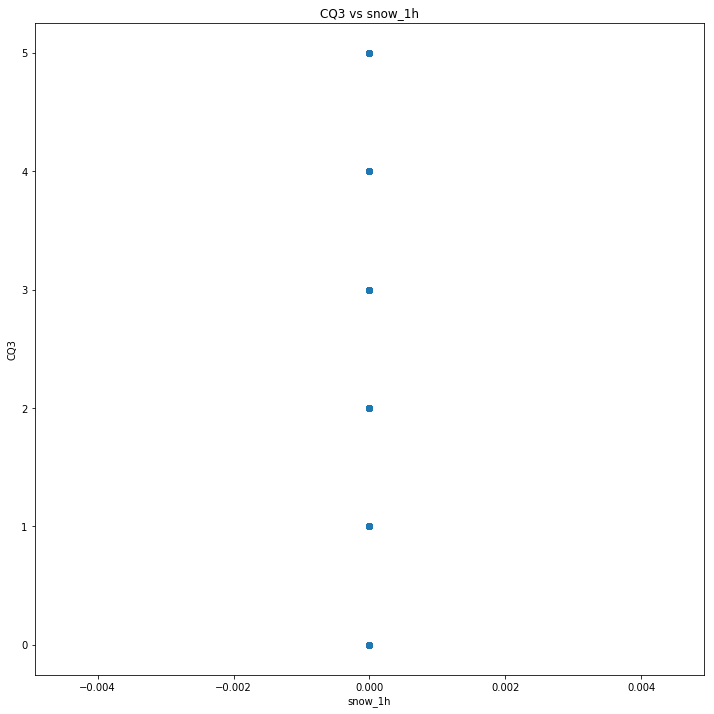

CQ3 snow_1h nan
STARTING  snow_3h CQ3


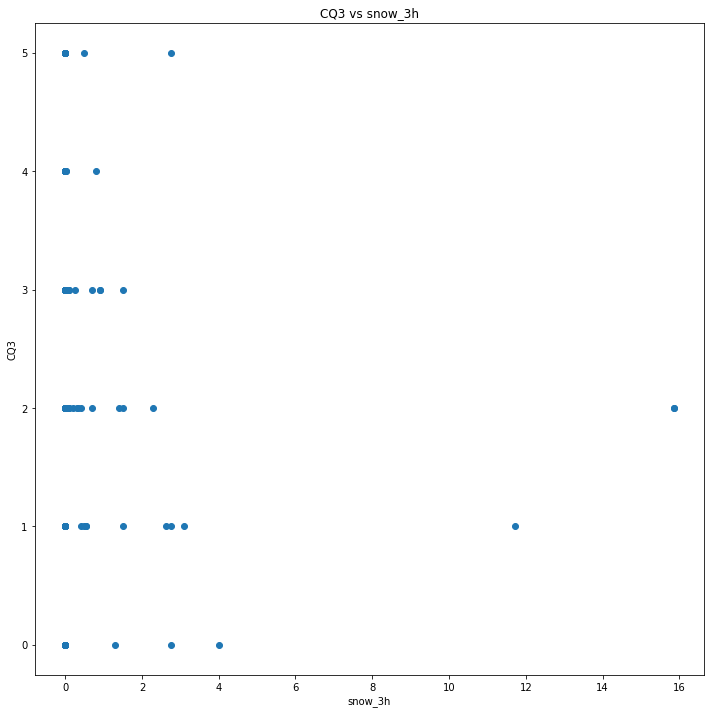

CQ3 snow_3h -0.10171442863729865
STARTING  snow_24h CQ3


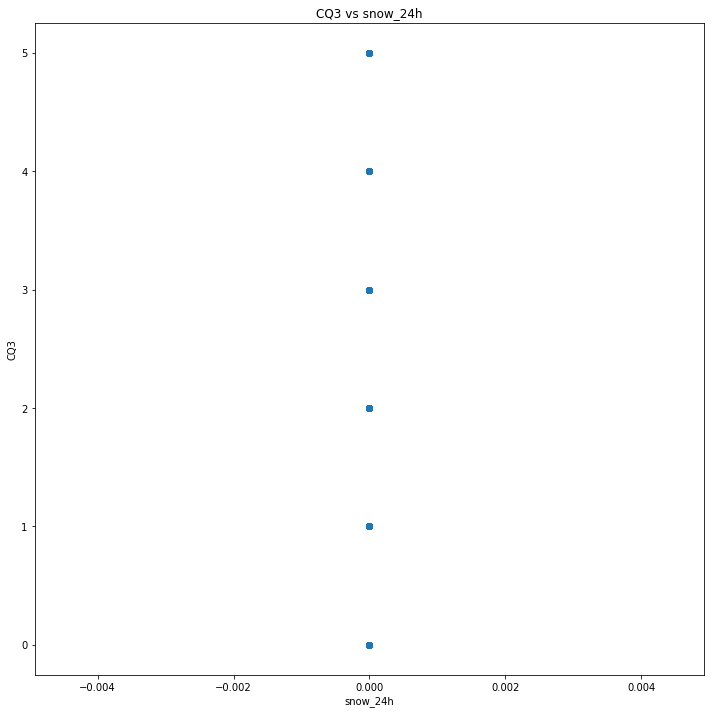

CQ3 snow_24h nan
STARTING  snow_today CQ3


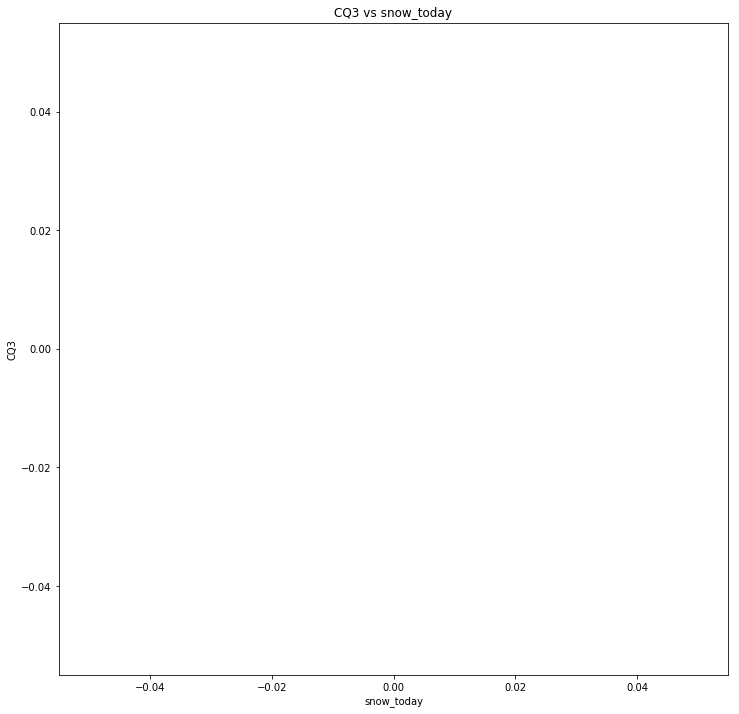

CQ3 snow_today nan
STARTING  clouds_all CQ3


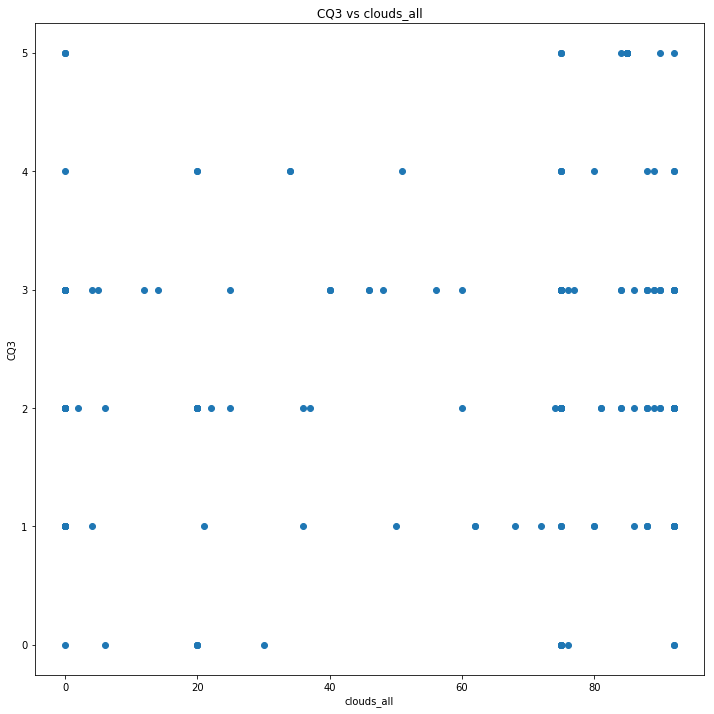

CQ3 clouds_all 0.15605539888949677
STARTING  temp CQ4


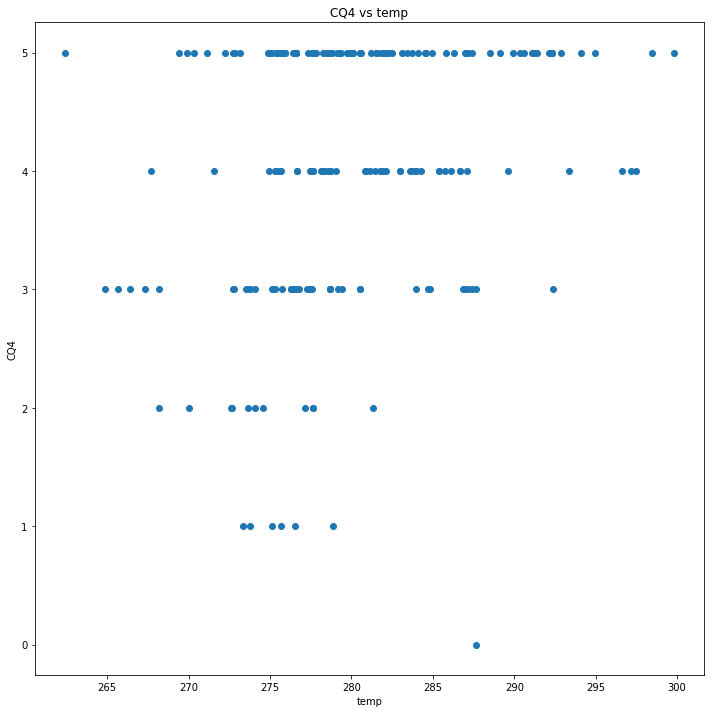

CQ4 temp 0.19475683512994693
STARTING  pressure CQ4


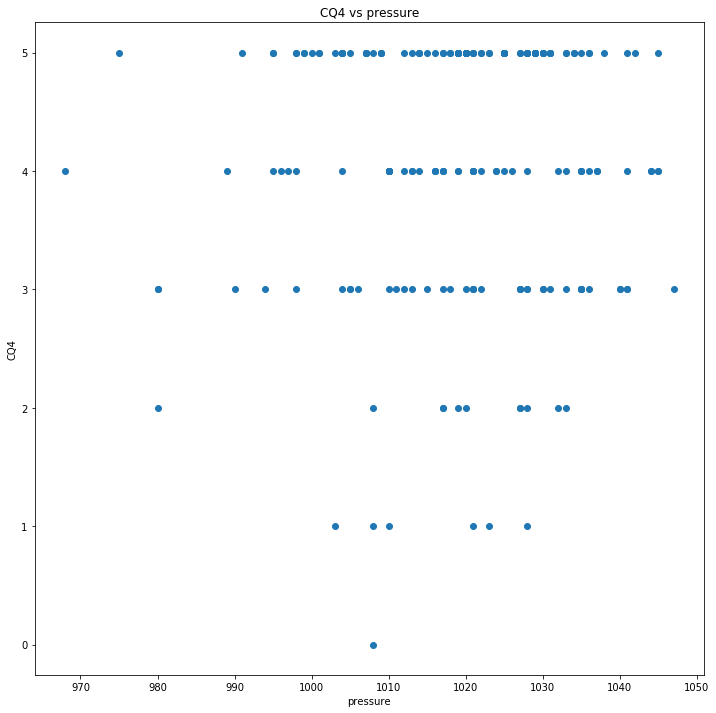

CQ4 pressure 0.02655789525679538
STARTING  humidity CQ4


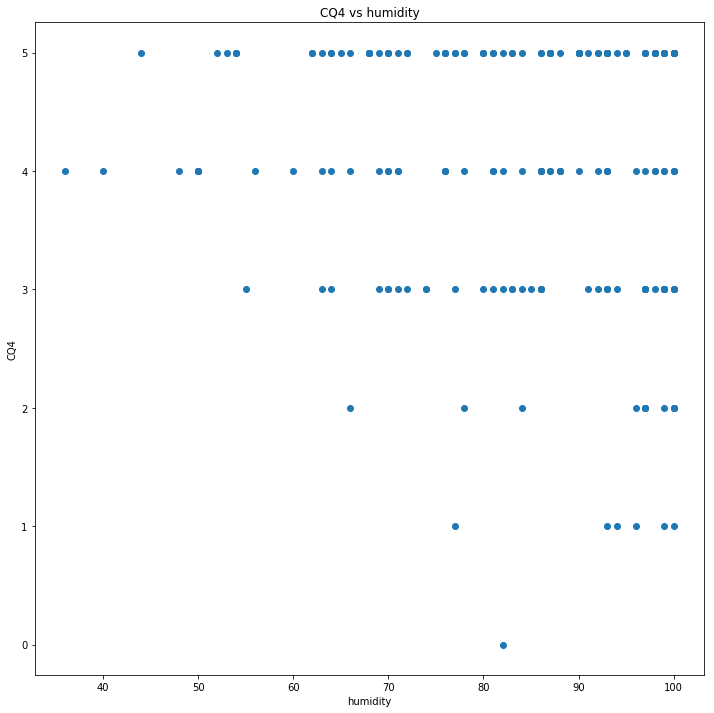

CQ4 humidity -0.07991724418434697
STARTING  wind_speed CQ4


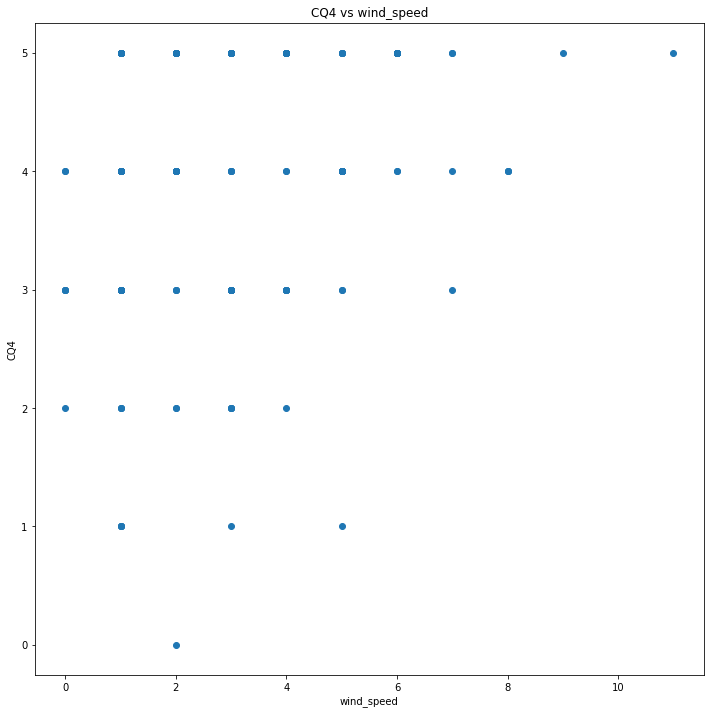

CQ4 wind_speed 0.1820554167787549
STARTING  wind_deg CQ4


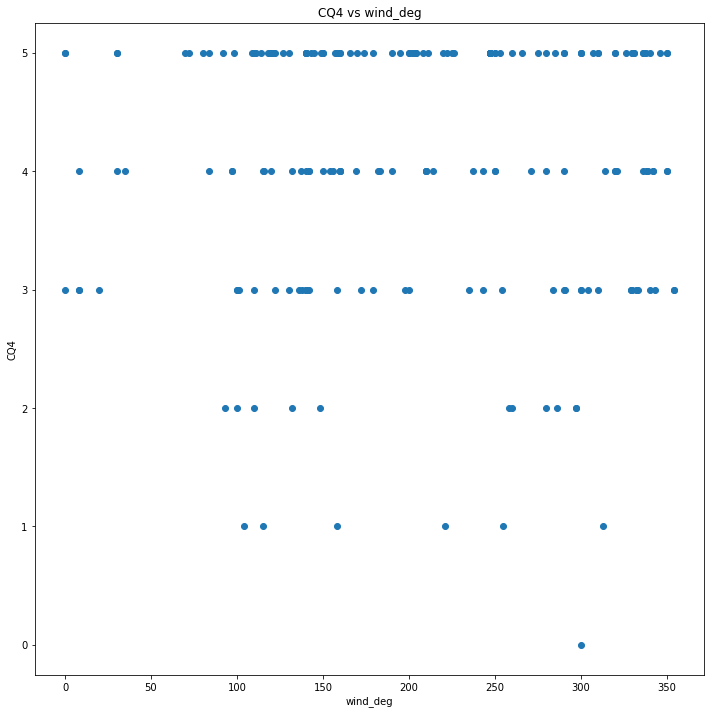

CQ4 wind_deg -0.03692632514535834
STARTING  rain_1h CQ4


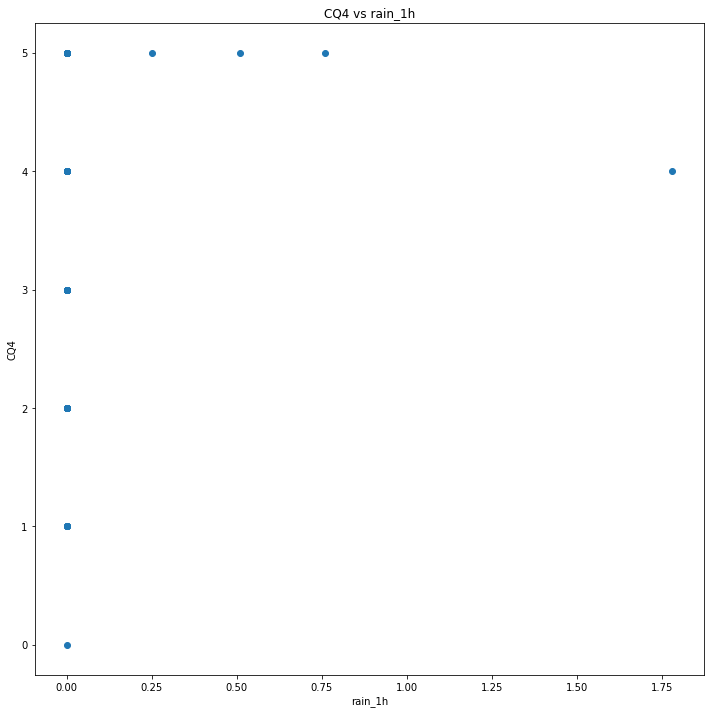

CQ4 rain_1h 0.035149443580408106
STARTING  rain_3h CQ4


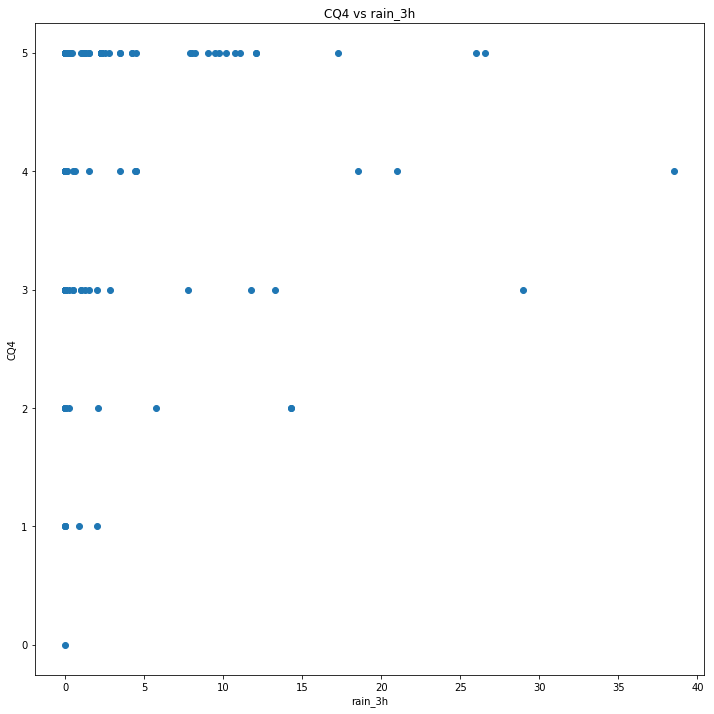

CQ4 rain_3h 0.02551217843086997
STARTING  rain_24h CQ4


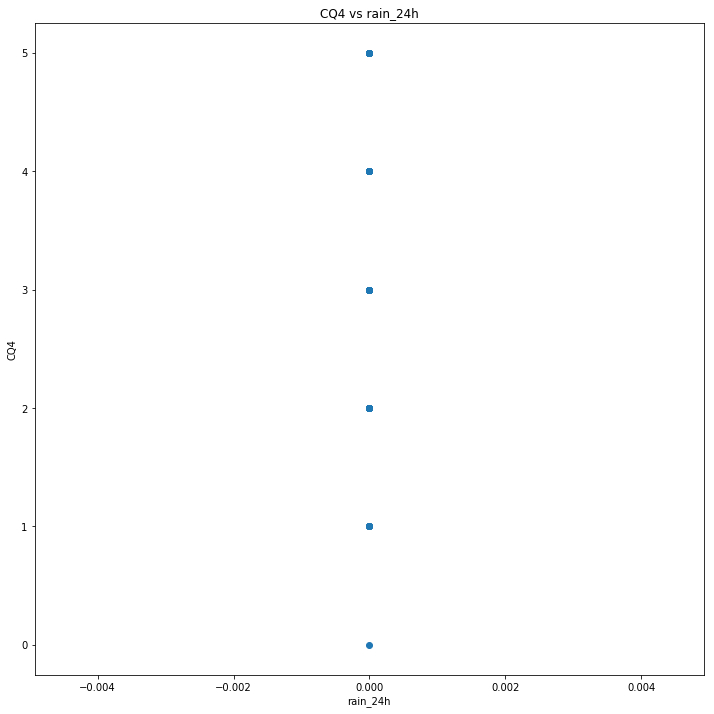

CQ4 rain_24h nan
STARTING  rain_today CQ4


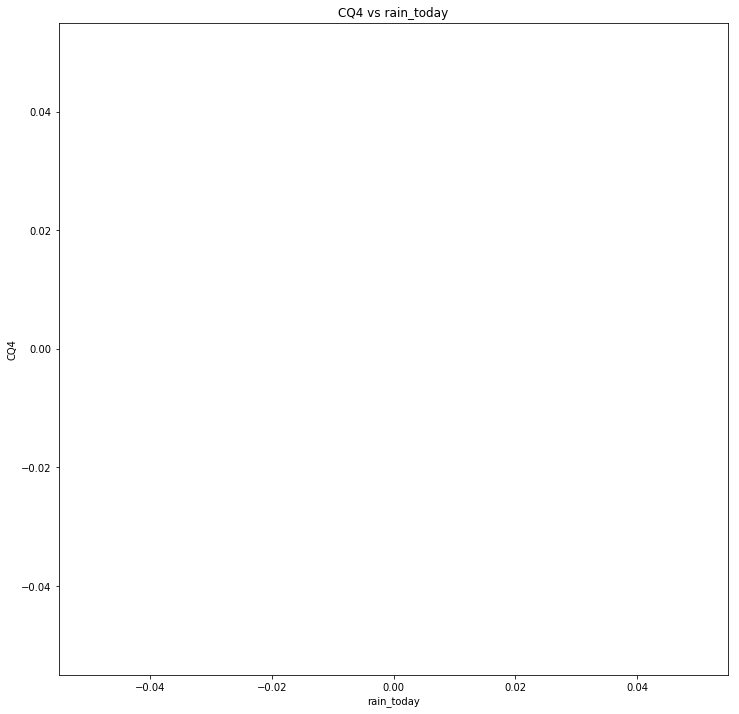

CQ4 rain_today nan
STARTING  snow_1h CQ4


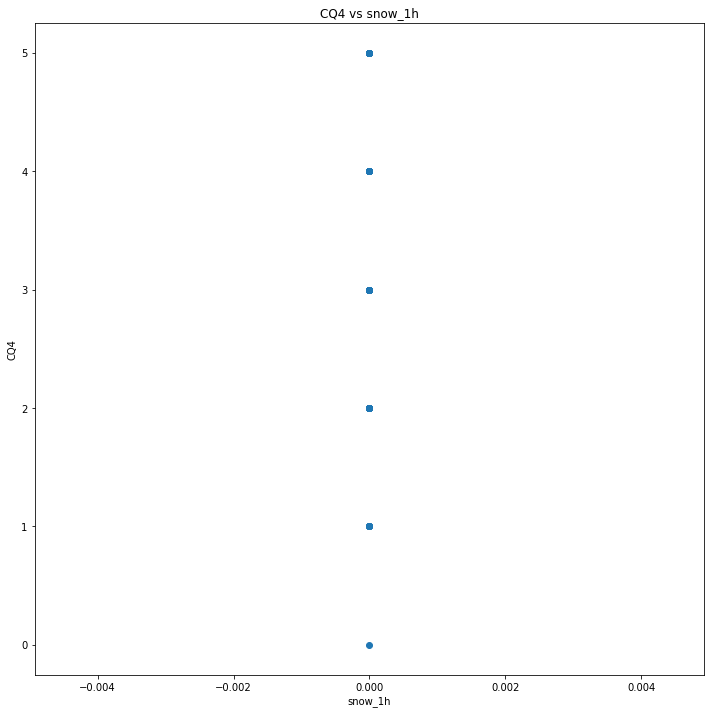

CQ4 snow_1h nan
STARTING  snow_3h CQ4


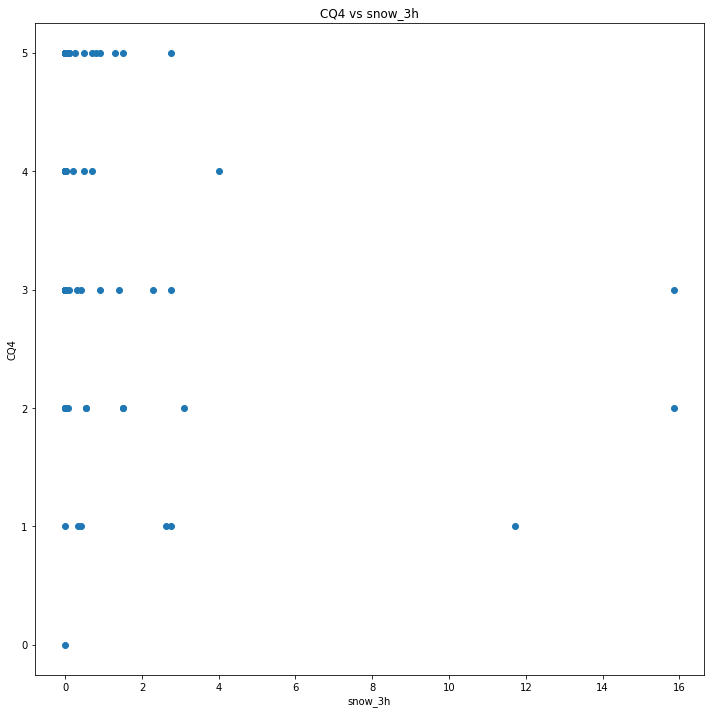

CQ4 snow_3h -0.29318917667122985
STARTING  snow_24h CQ4


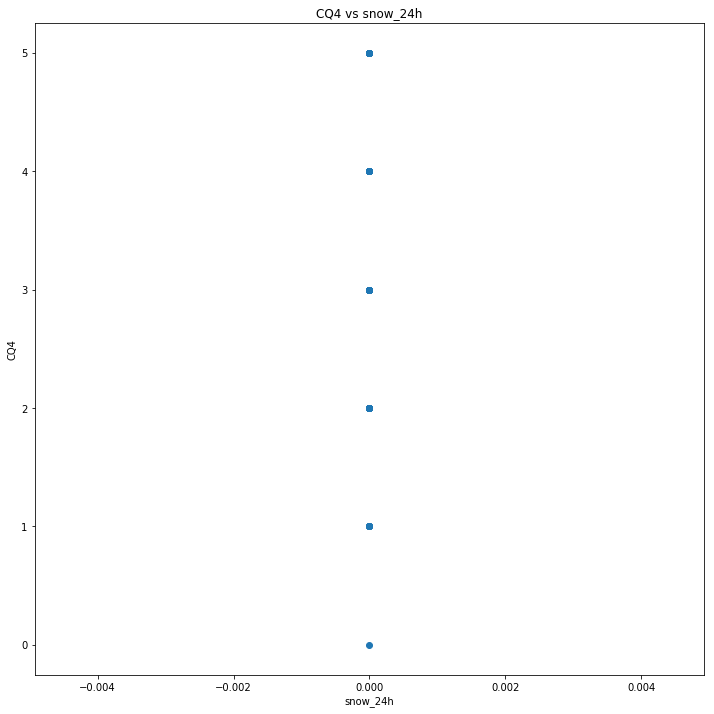

CQ4 snow_24h nan
STARTING  snow_today CQ4


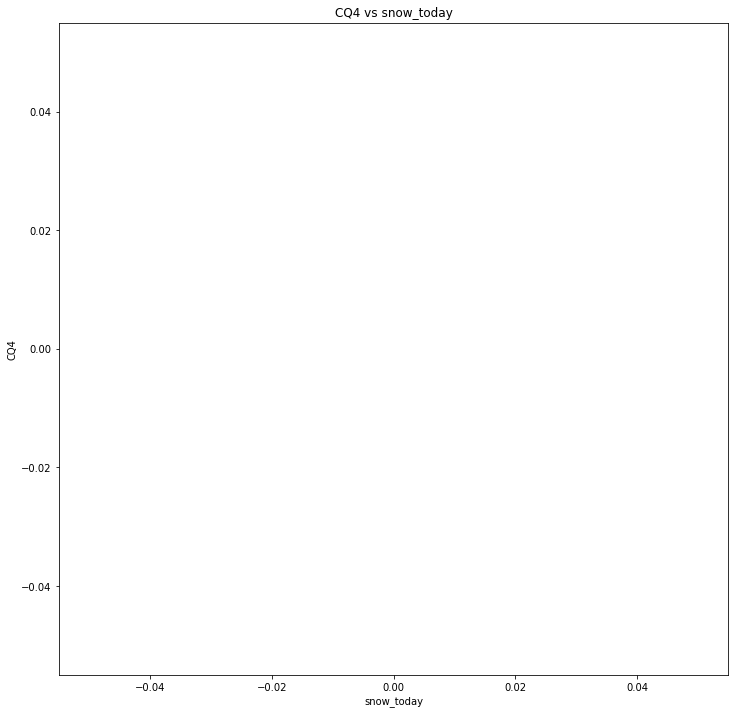

CQ4 snow_today nan
STARTING  clouds_all CQ4


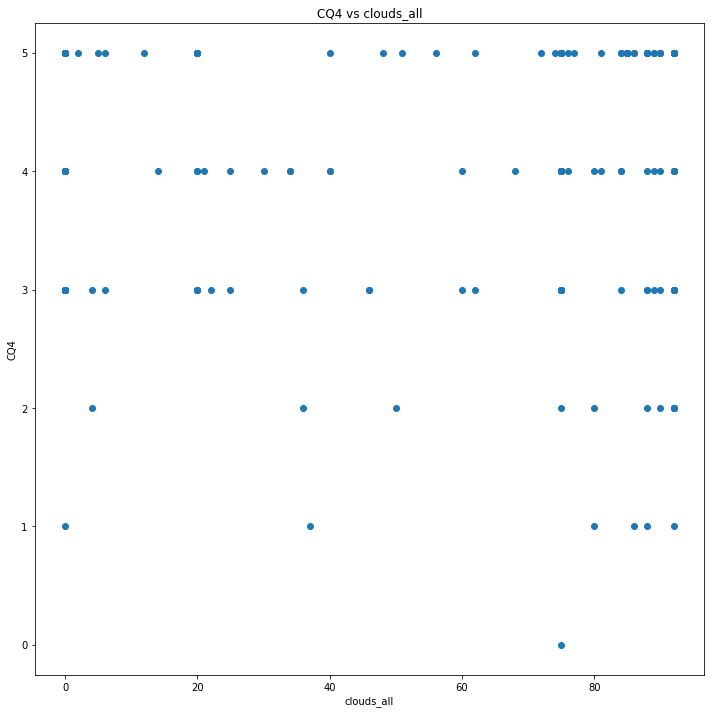

CQ4 clouds_all 0.0604819218844412
STARTING  temp CQ5


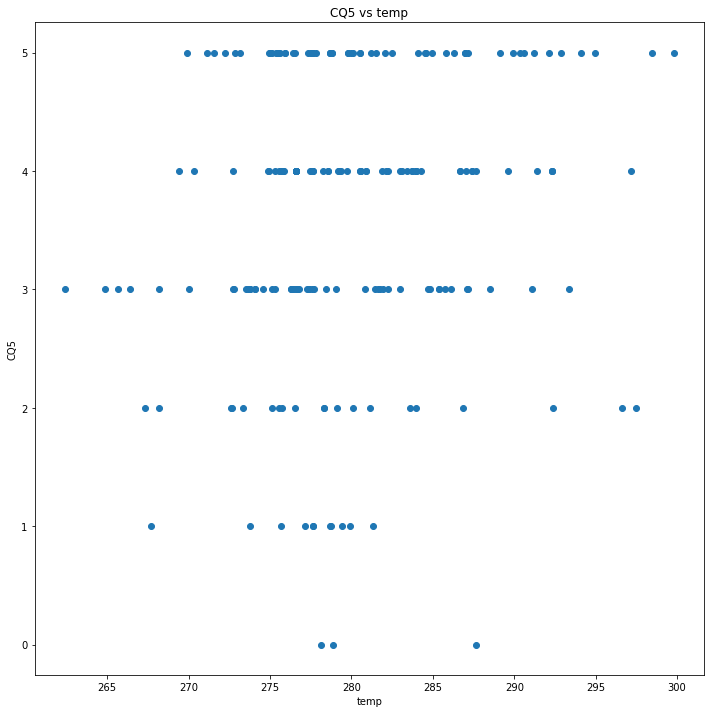

CQ5 temp 0.11445023269785878
STARTING  pressure CQ5


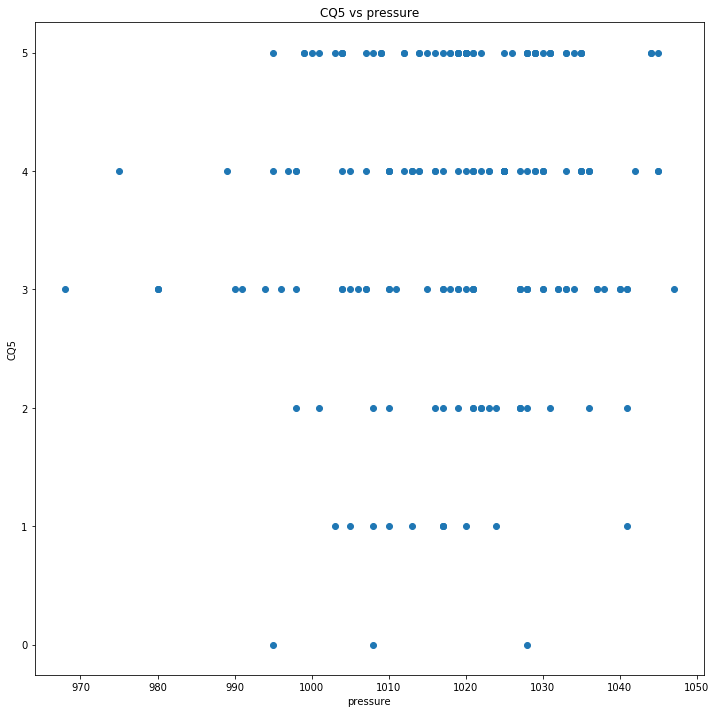

CQ5 pressure 0.09042841152217085
STARTING  humidity CQ5


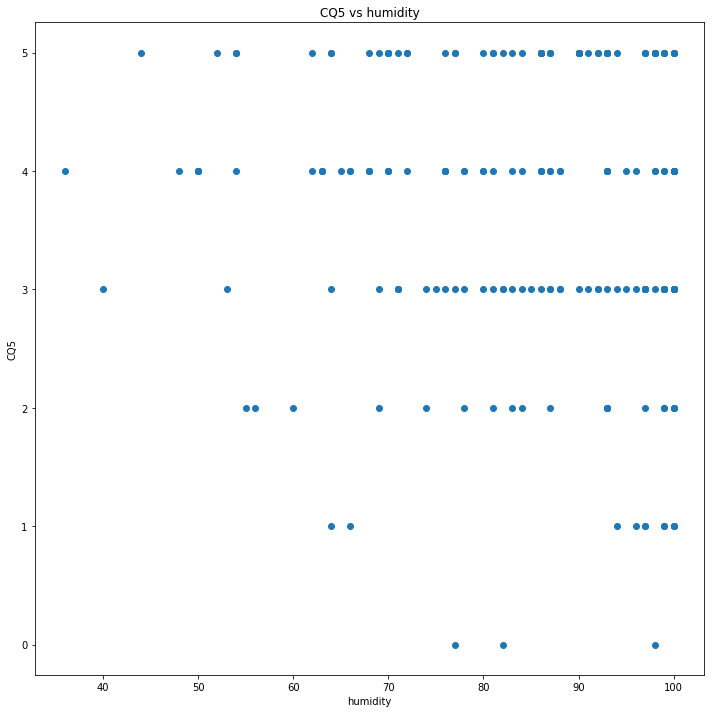

CQ5 humidity -0.10197550726111124
STARTING  wind_speed CQ5


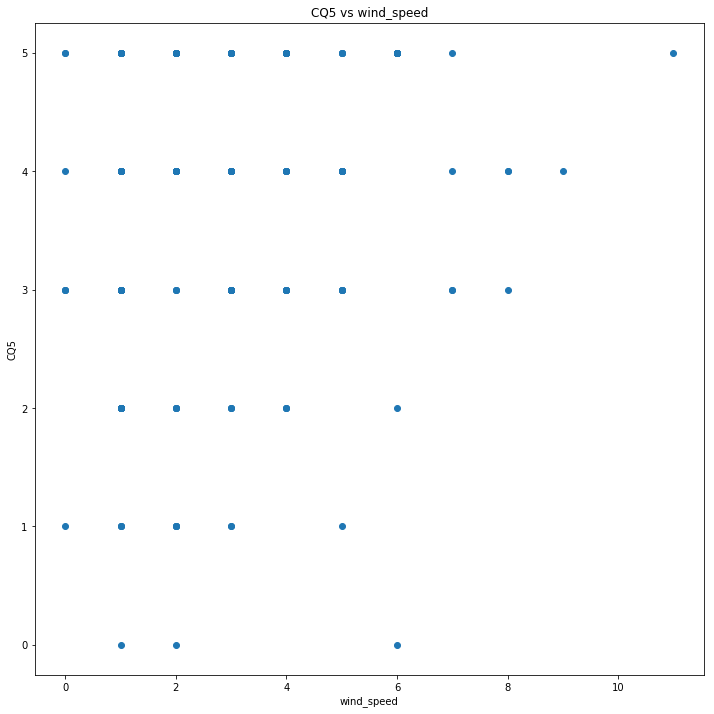

CQ5 wind_speed 0.1876083291359423
STARTING  wind_deg CQ5


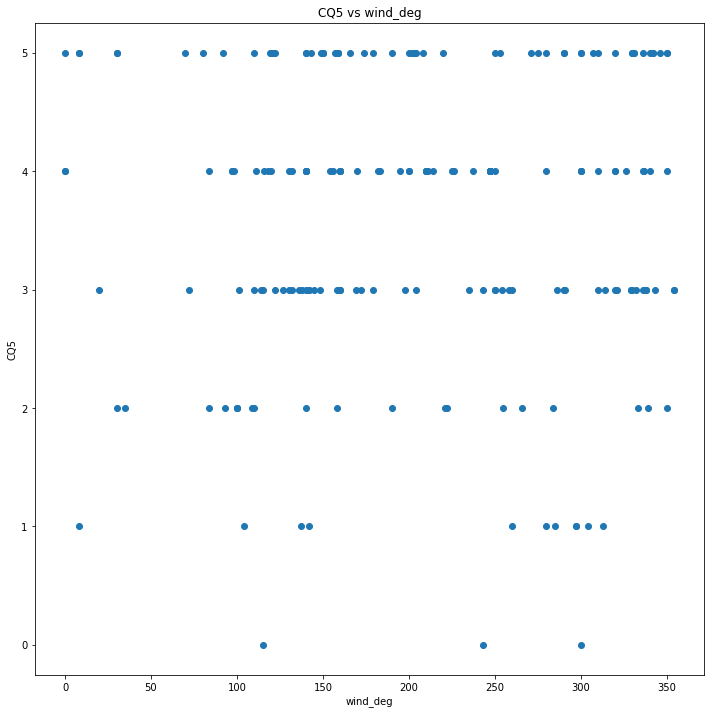

CQ5 wind_deg -0.045806299139146474
STARTING  rain_1h CQ5


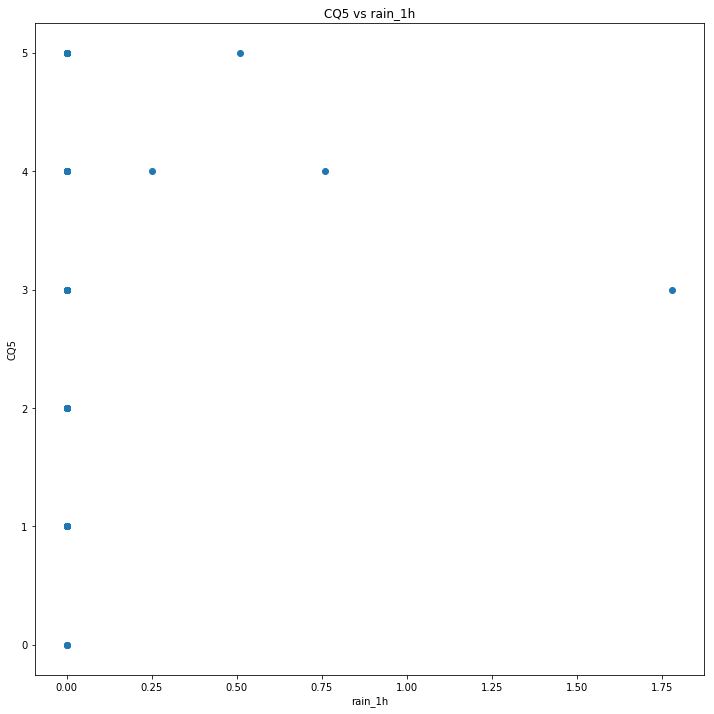

CQ5 rain_1h -0.007912885201193865
STARTING  rain_3h CQ5


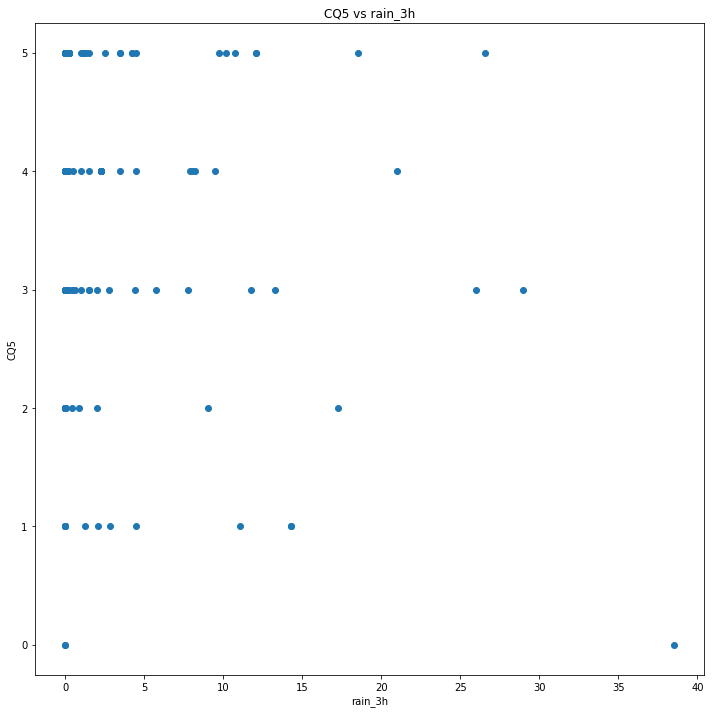

CQ5 rain_3h -0.14547011267206175
STARTING  rain_24h CQ5


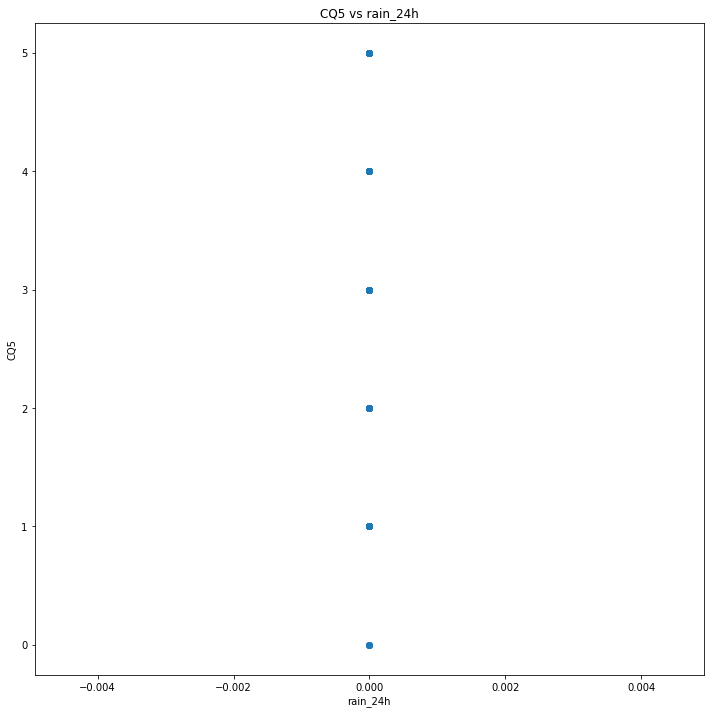

CQ5 rain_24h nan
STARTING  rain_today CQ5


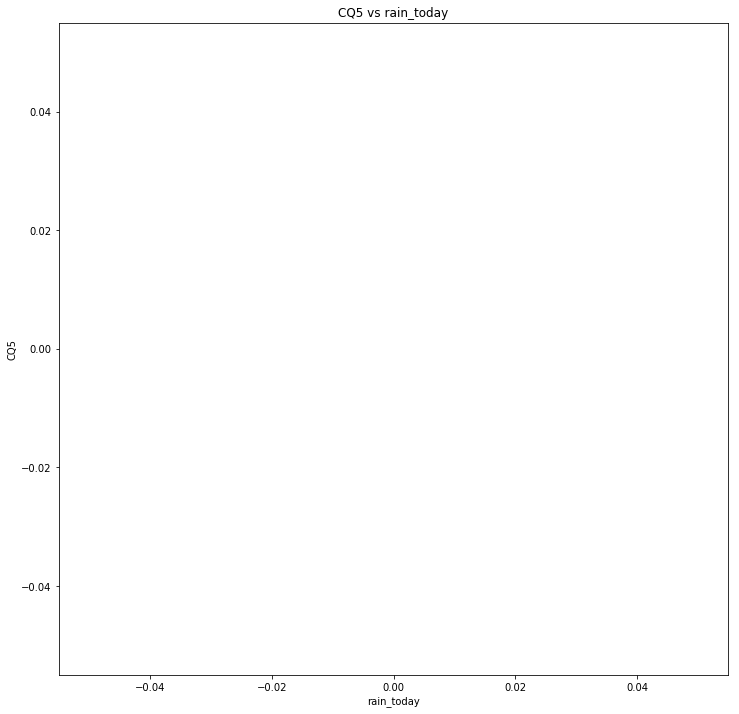

CQ5 rain_today nan
STARTING  snow_1h CQ5


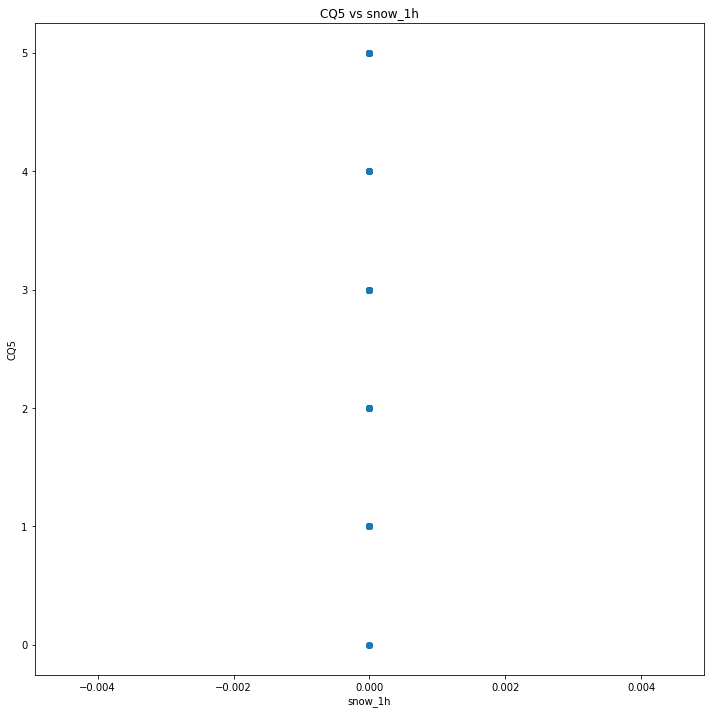

CQ5 snow_1h nan
STARTING  snow_3h CQ5


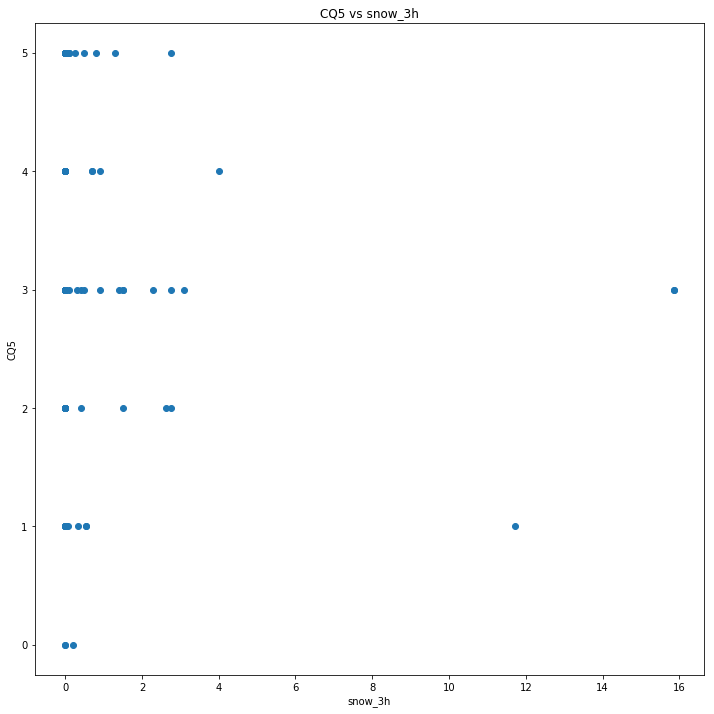

CQ5 snow_3h -0.15133250407358265
STARTING  snow_24h CQ5


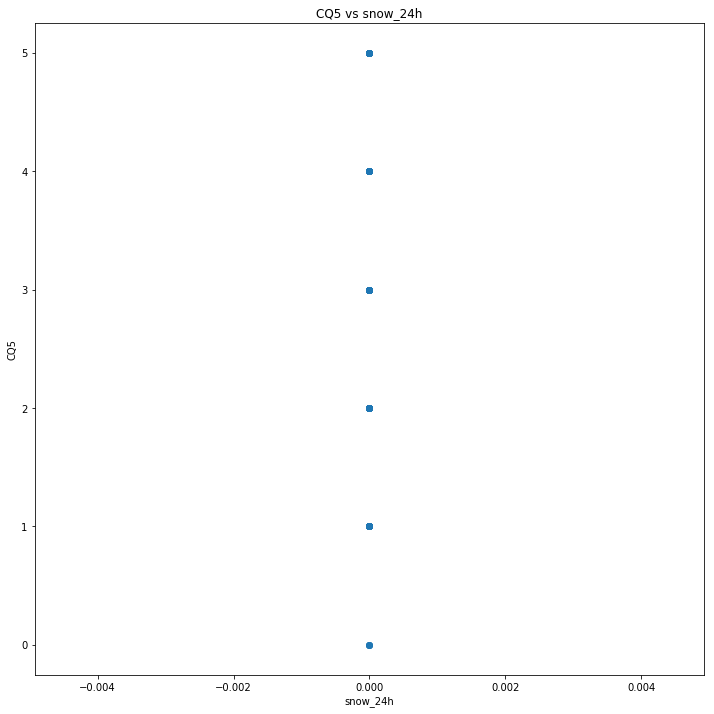

CQ5 snow_24h nan
STARTING  snow_today CQ5


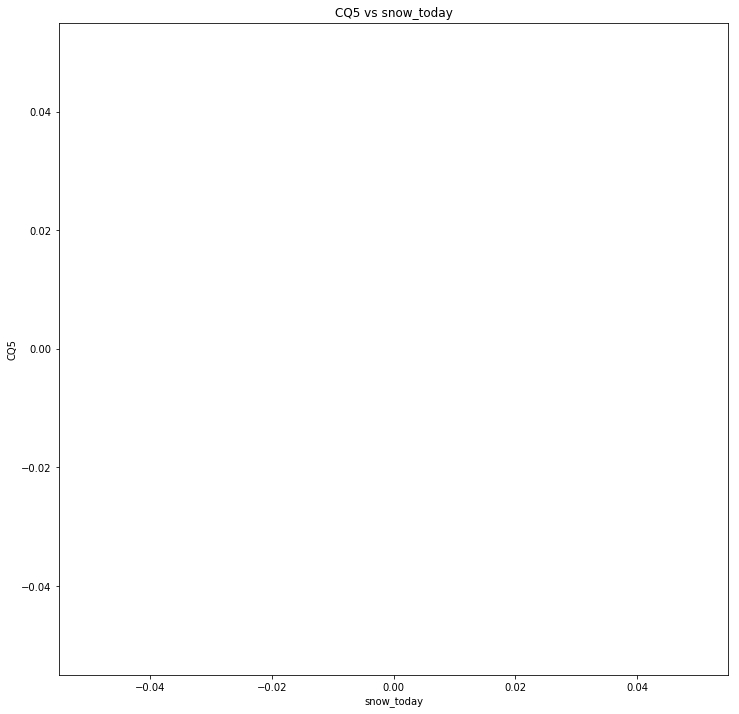

CQ5 snow_today nan
STARTING  clouds_all CQ5


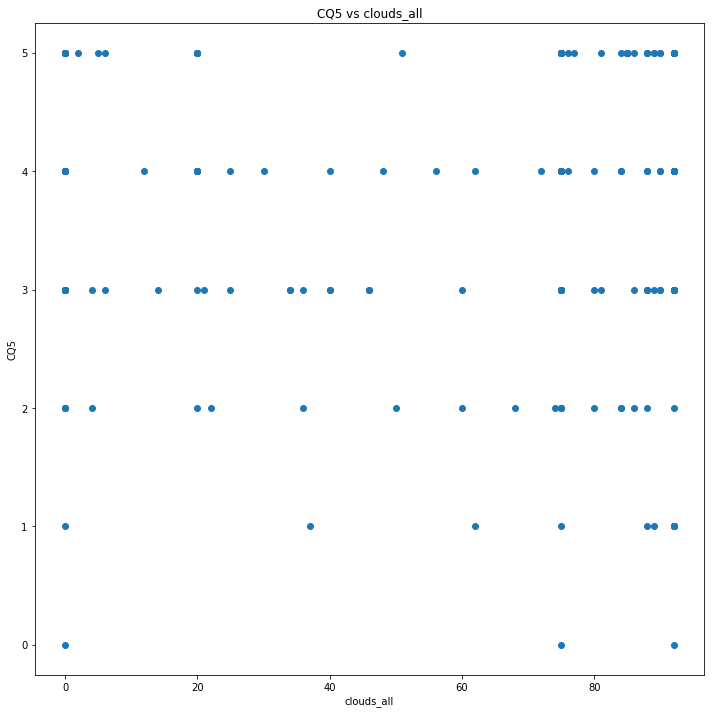

CQ5 clouds_all -0.010741799138172931
STARTING  temp CQ6


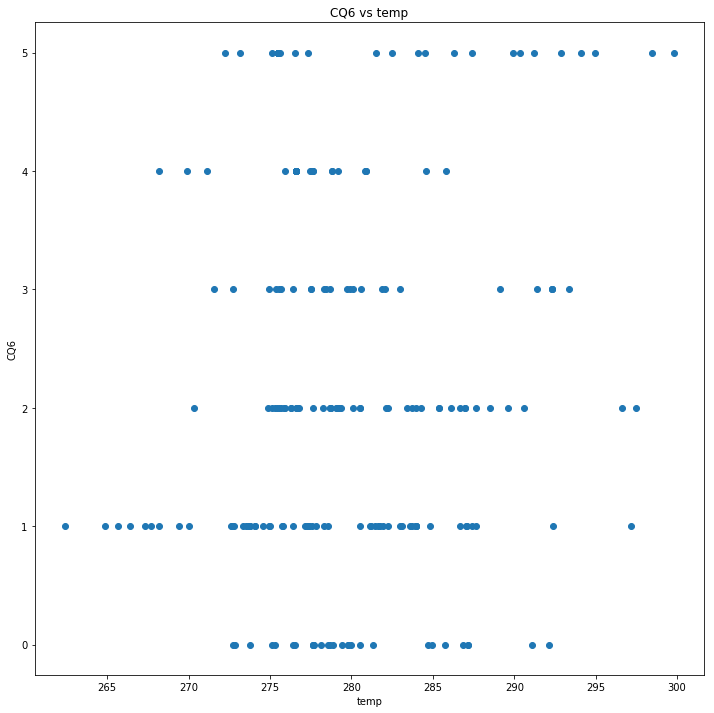

CQ6 temp 0.06480541110356207
STARTING  pressure CQ6


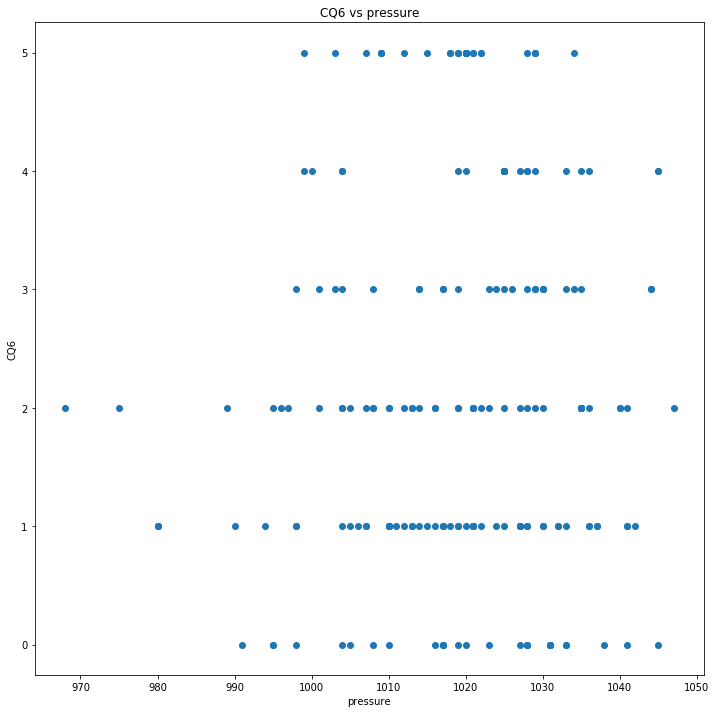

CQ6 pressure 0.05937358108102981
STARTING  humidity CQ6


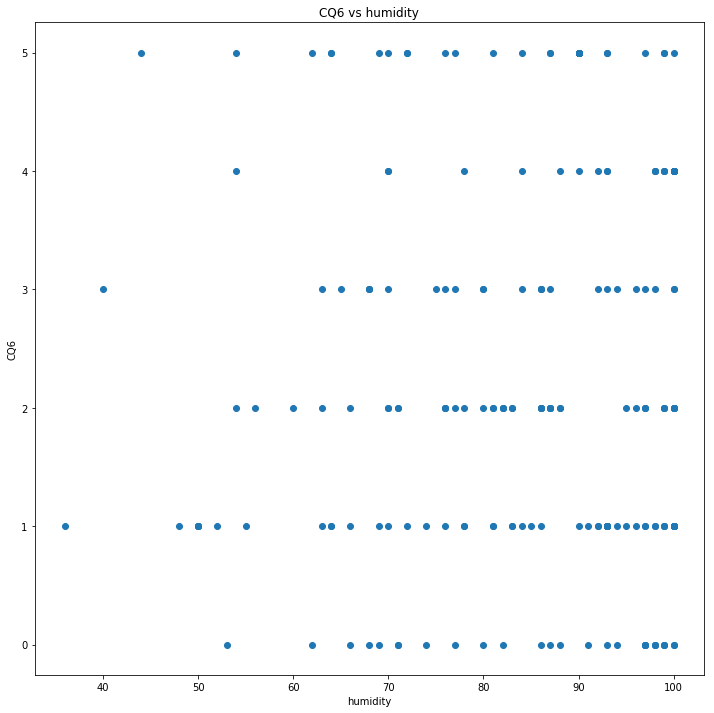

CQ6 humidity 0.026406695865171984
STARTING  wind_speed CQ6


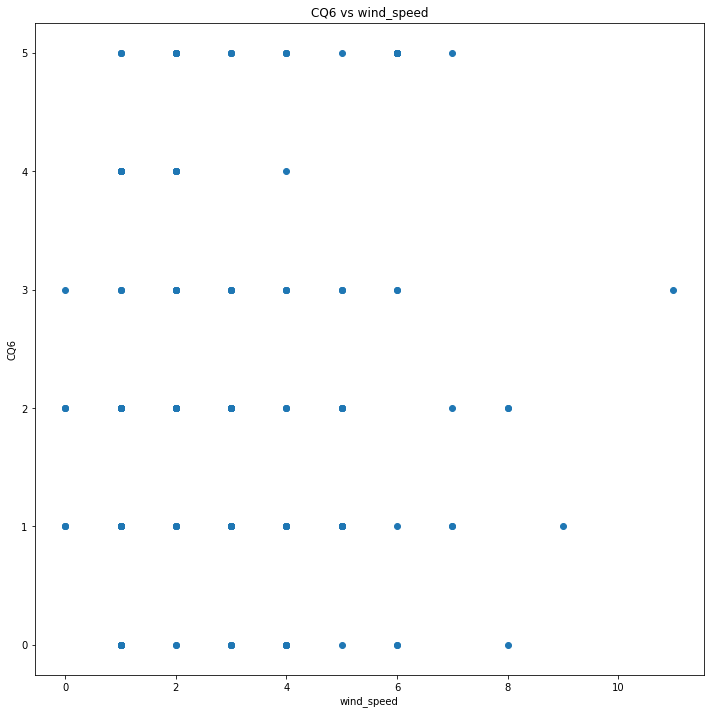

CQ6 wind_speed 0.10758553697031968
STARTING  wind_deg CQ6


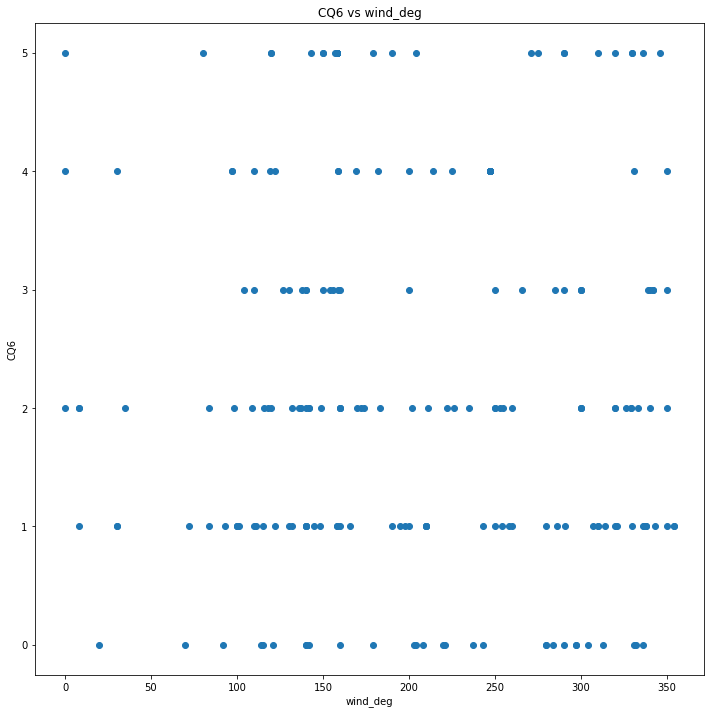

CQ6 wind_deg -0.04564533623395025
STARTING  rain_1h CQ6


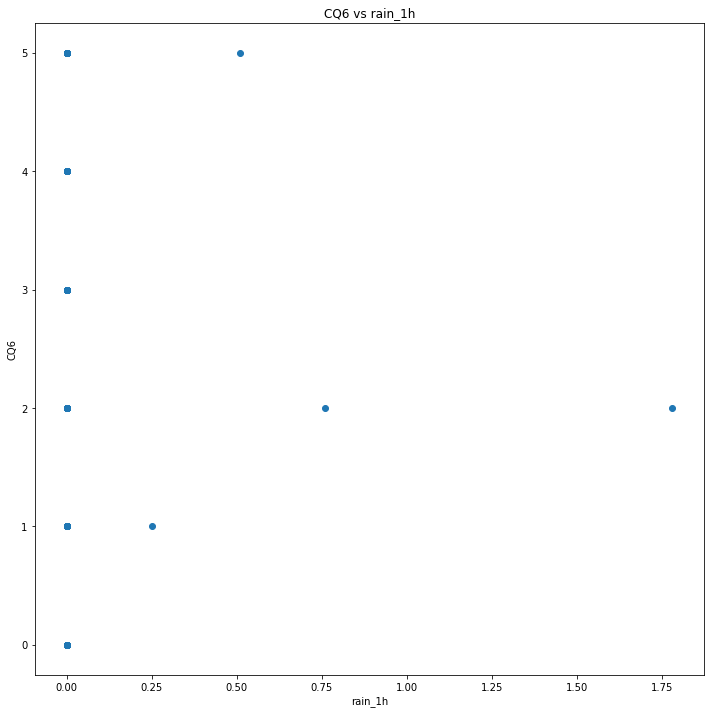

CQ6 rain_1h 0.006766598760674411
STARTING  rain_3h CQ6


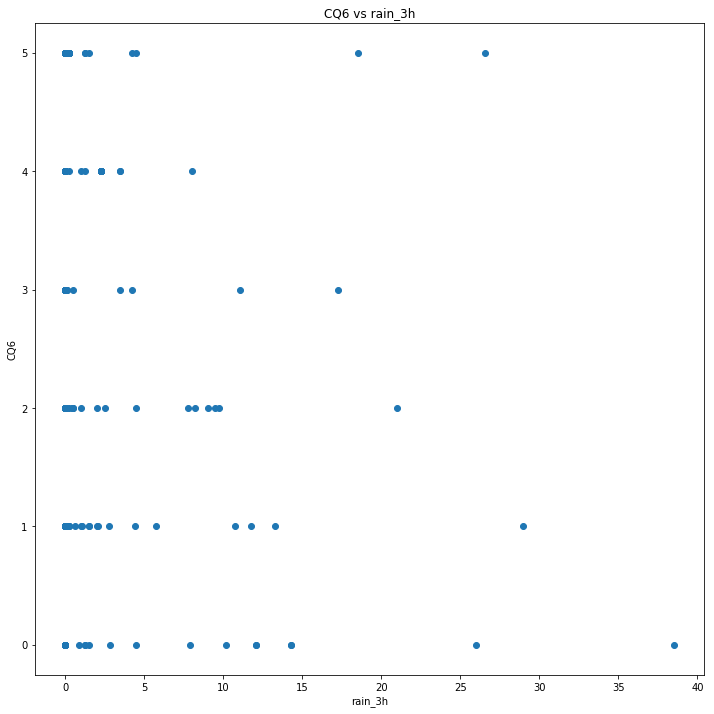

CQ6 rain_3h -0.11534302681839072
STARTING  rain_24h CQ6


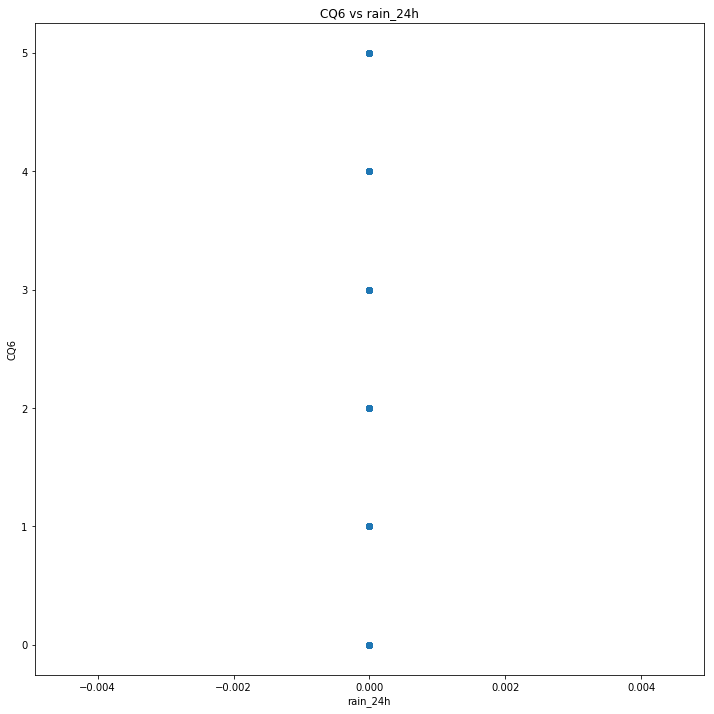

CQ6 rain_24h nan
STARTING  rain_today CQ6


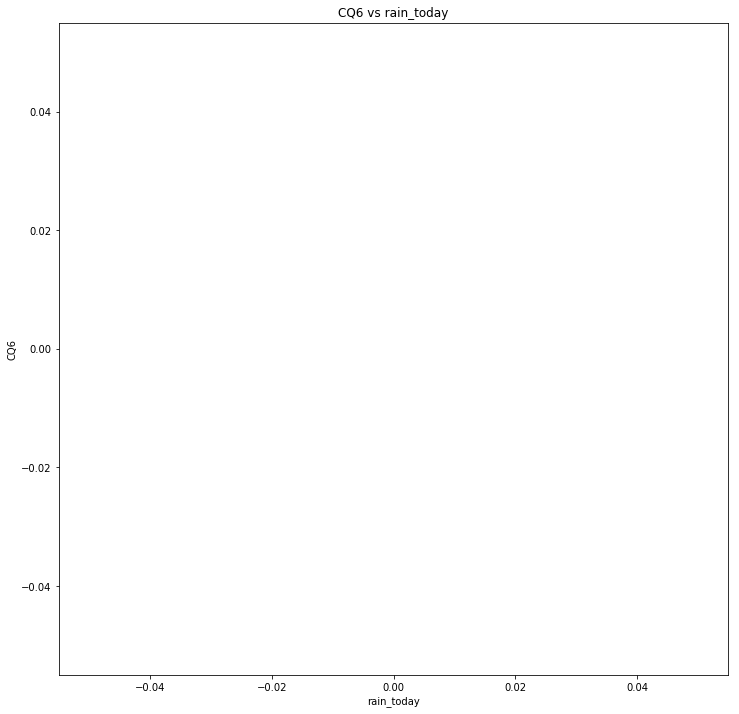

CQ6 rain_today nan
STARTING  snow_1h CQ6


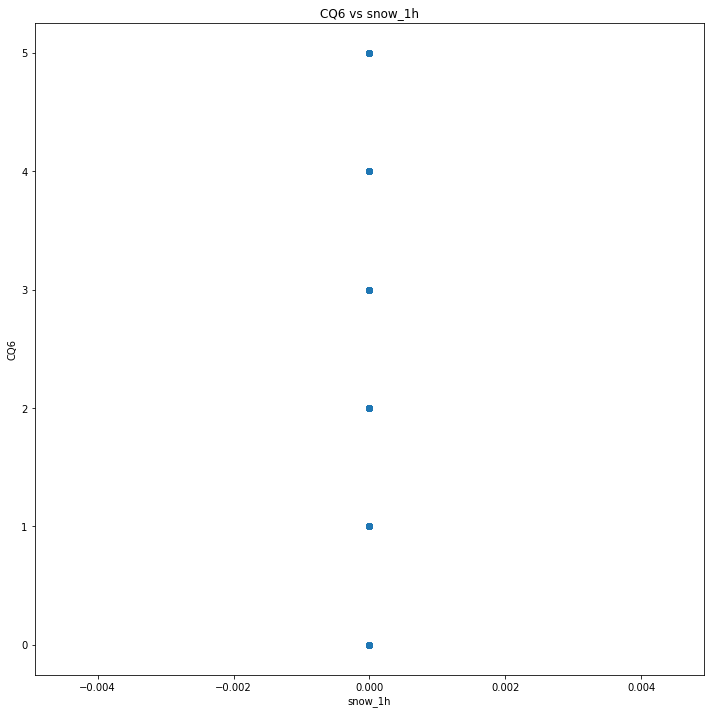

CQ6 snow_1h nan
STARTING  snow_3h CQ6


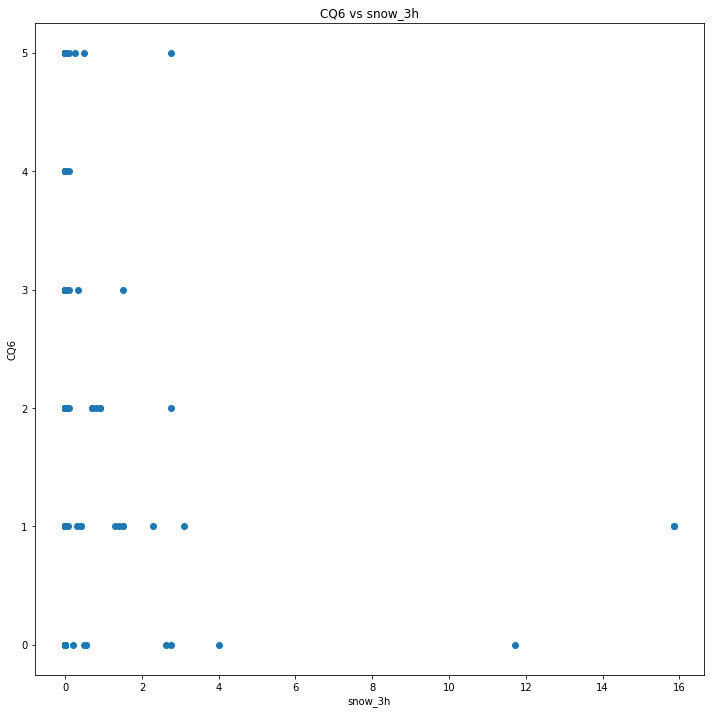

CQ6 snow_3h -0.15714363619458446
STARTING  snow_24h CQ6


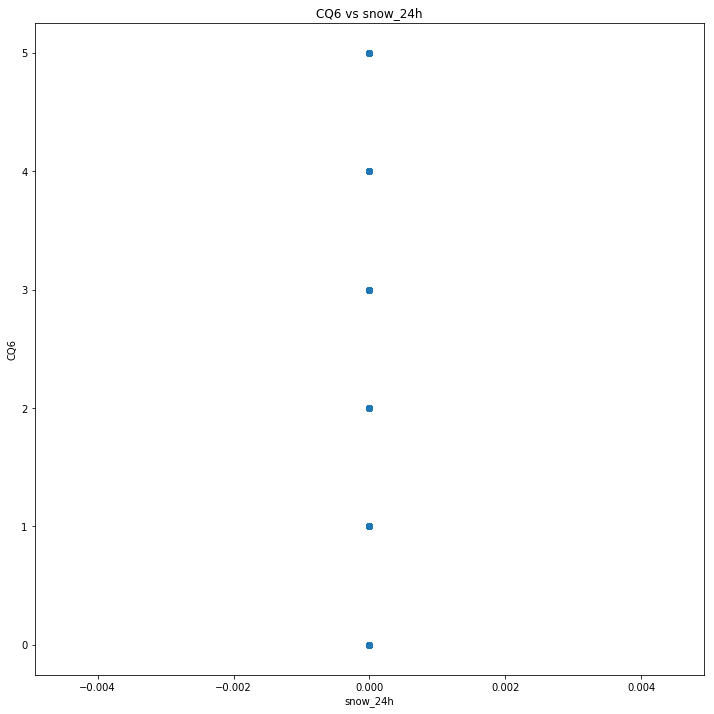

CQ6 snow_24h nan
STARTING  snow_today CQ6


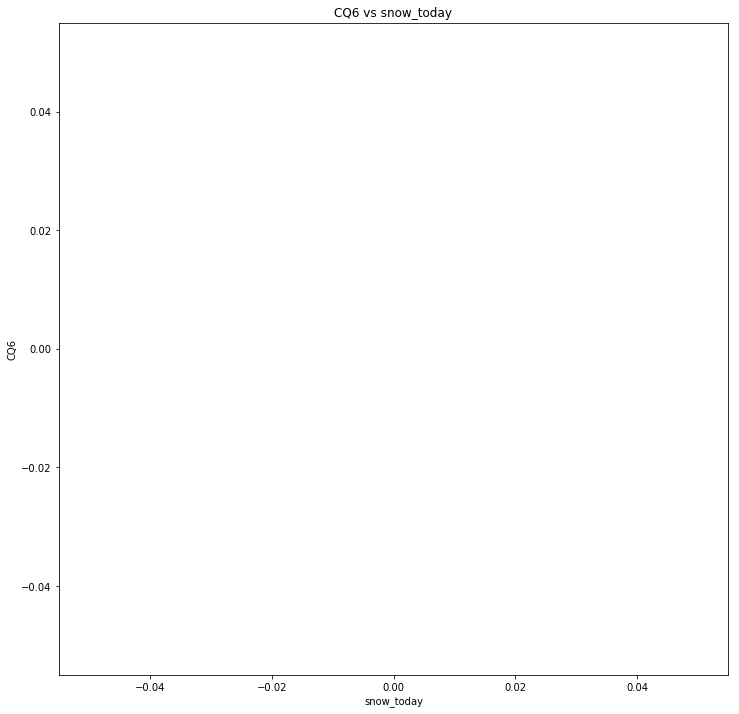

CQ6 snow_today nan
STARTING  clouds_all CQ6


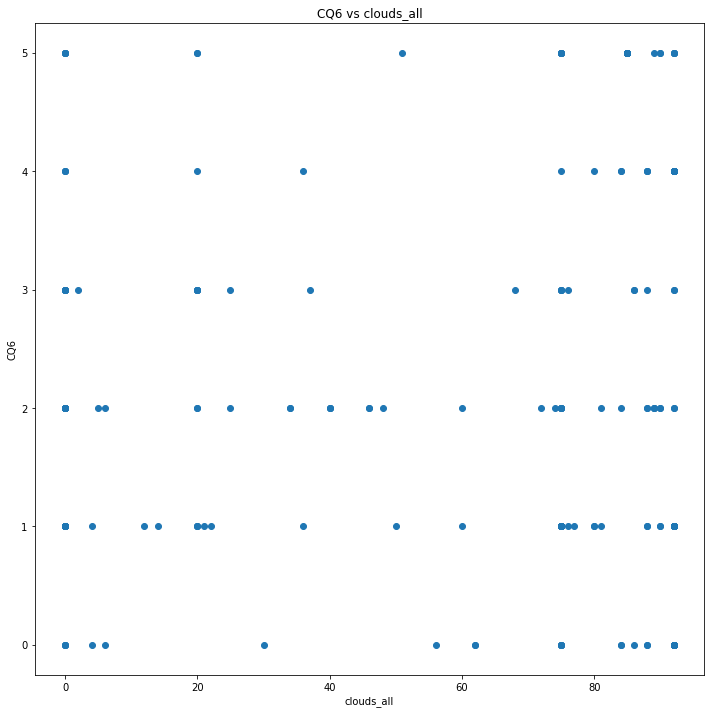

CQ6 clouds_all 0.10165083285269198
STARTING  temp CQ7


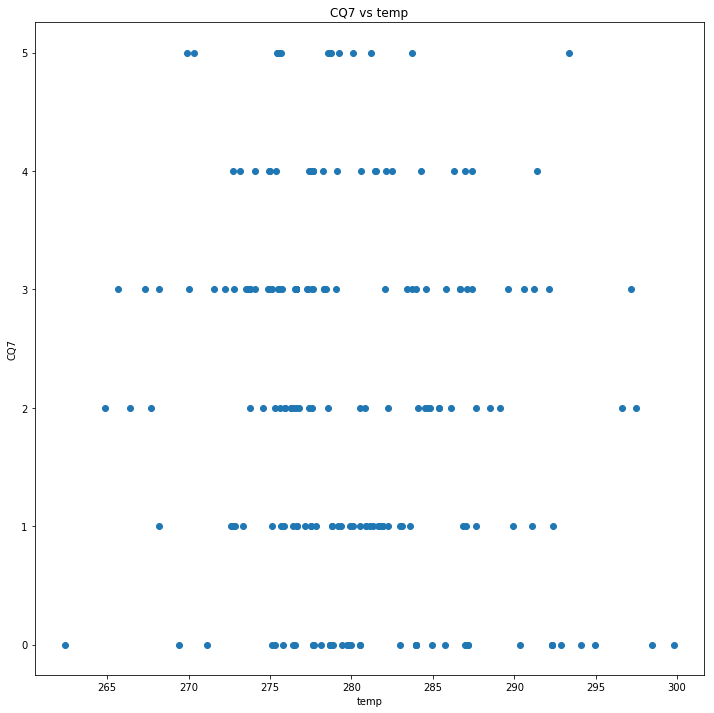

CQ7 temp -0.22037286500757447
STARTING  pressure CQ7


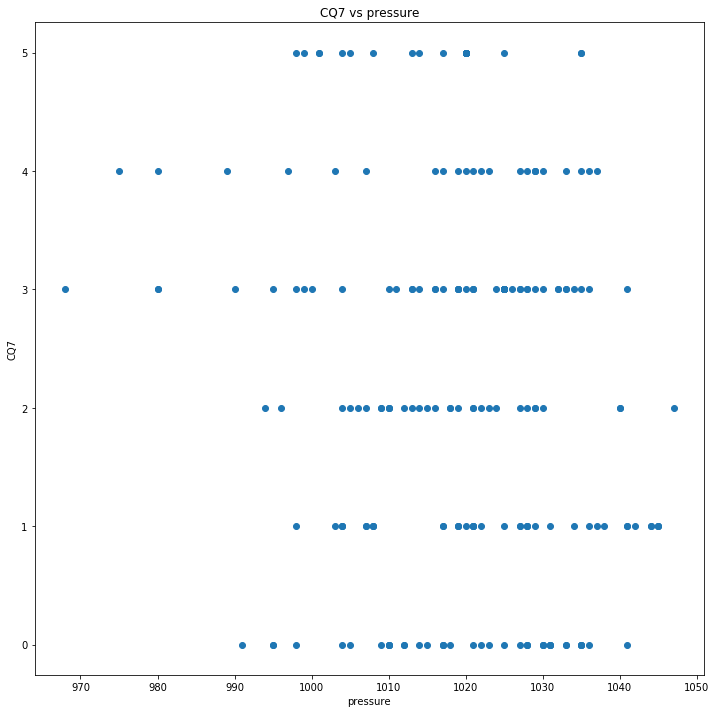

CQ7 pressure -0.14090378020164343
STARTING  humidity CQ7


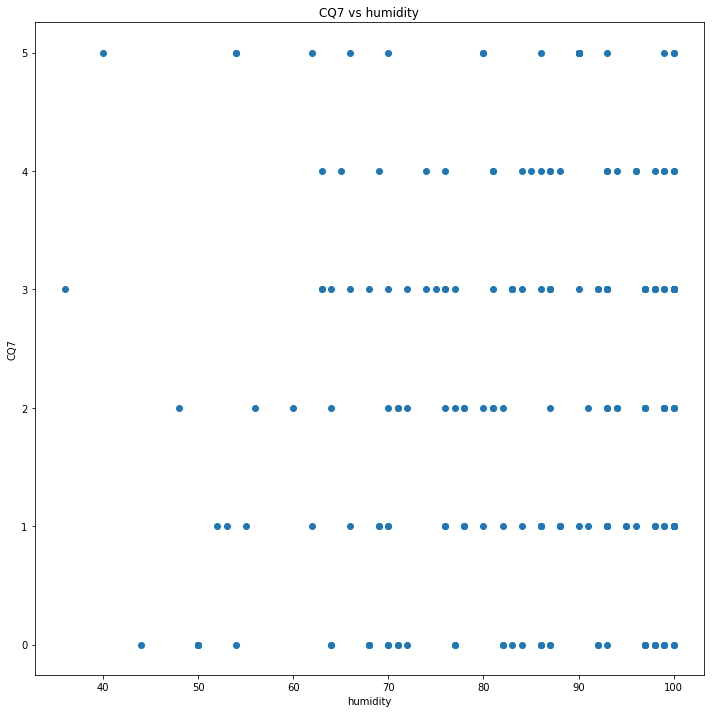

CQ7 humidity 0.09921179079585422
STARTING  wind_speed CQ7


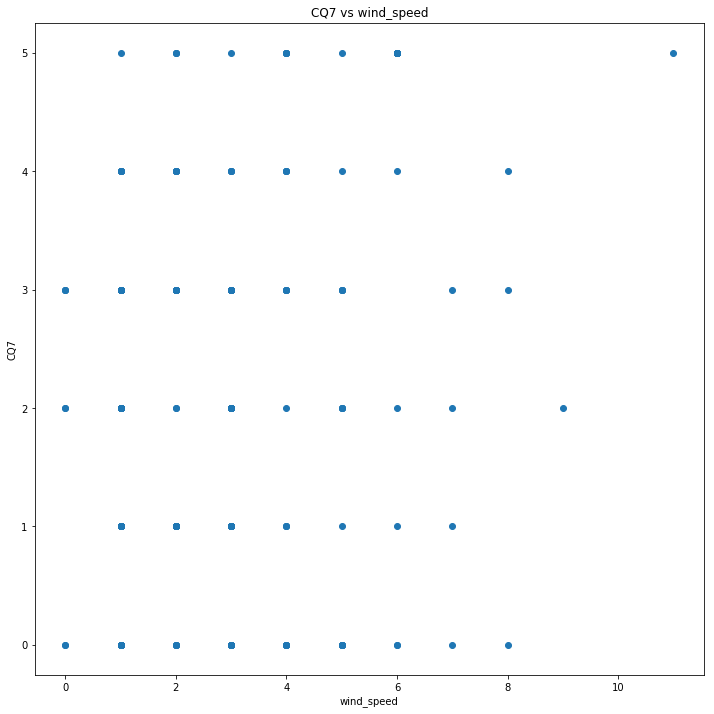

CQ7 wind_speed 0.20936794459011387
STARTING  wind_deg CQ7


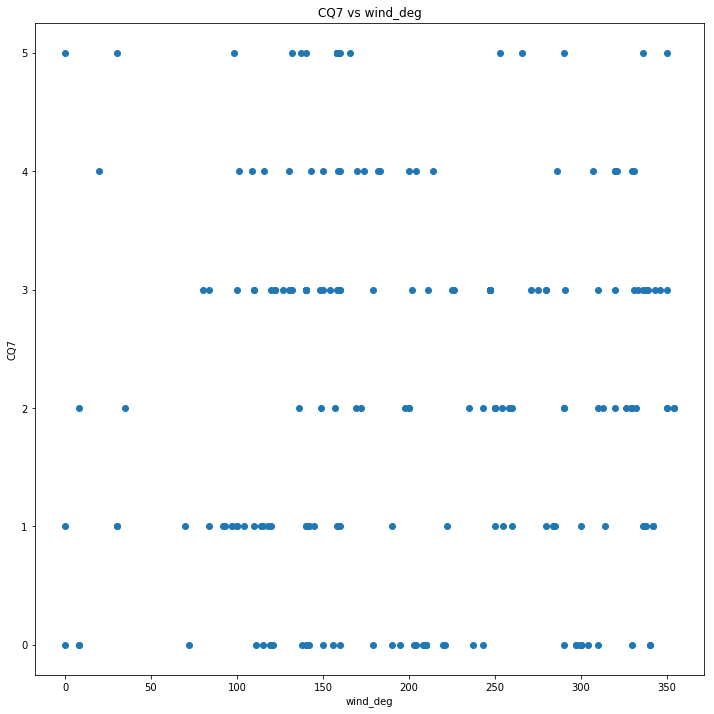

CQ7 wind_deg -0.0292186933875291
STARTING  rain_1h CQ7


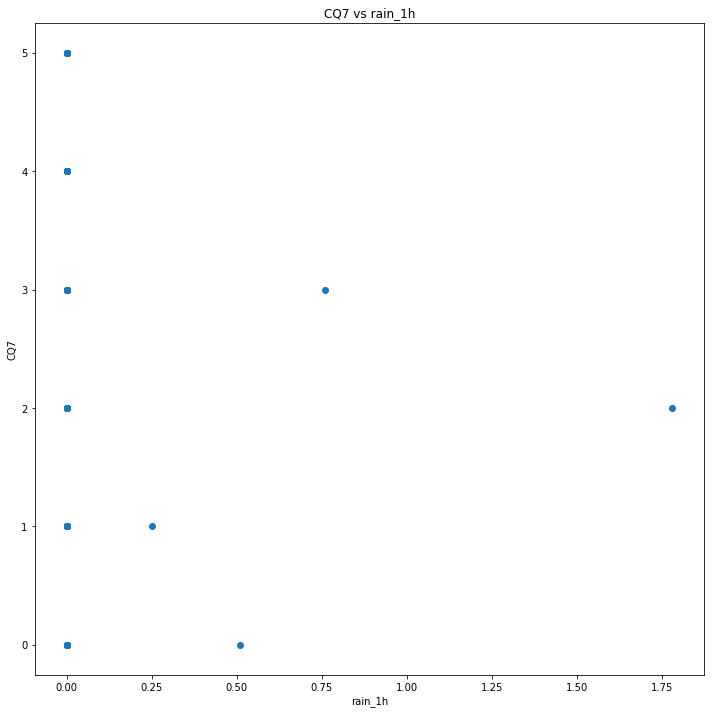

CQ7 rain_1h -0.026591465759344225
STARTING  rain_3h CQ7


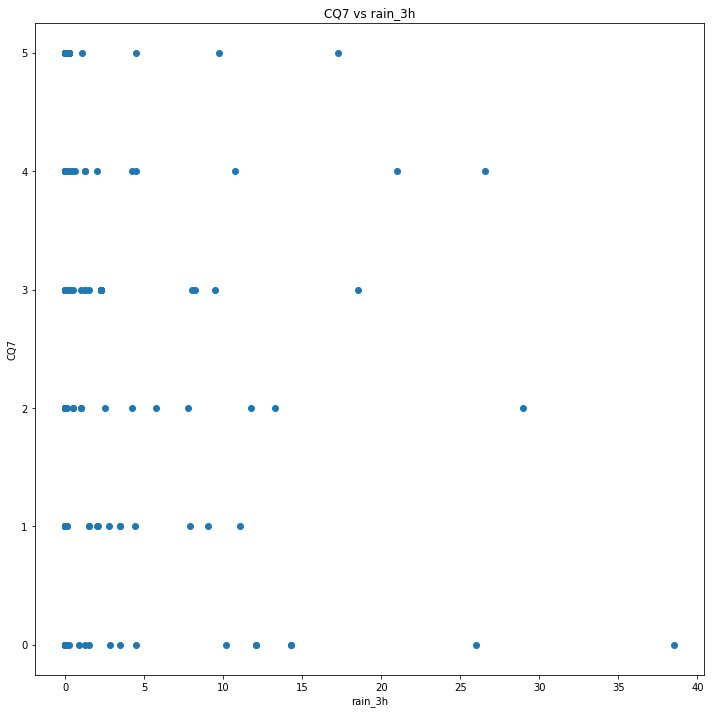

CQ7 rain_3h -0.06133590944580697
STARTING  rain_24h CQ7


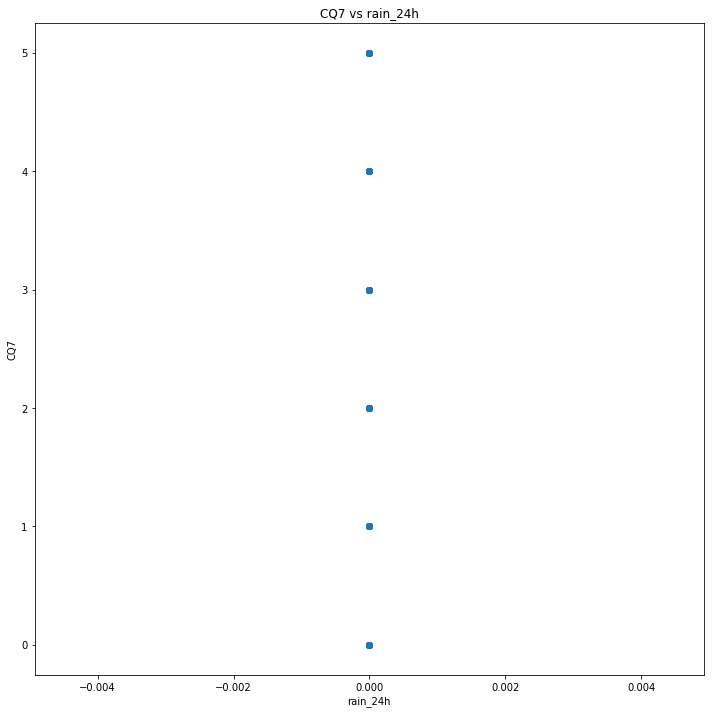

CQ7 rain_24h nan
STARTING  rain_today CQ7


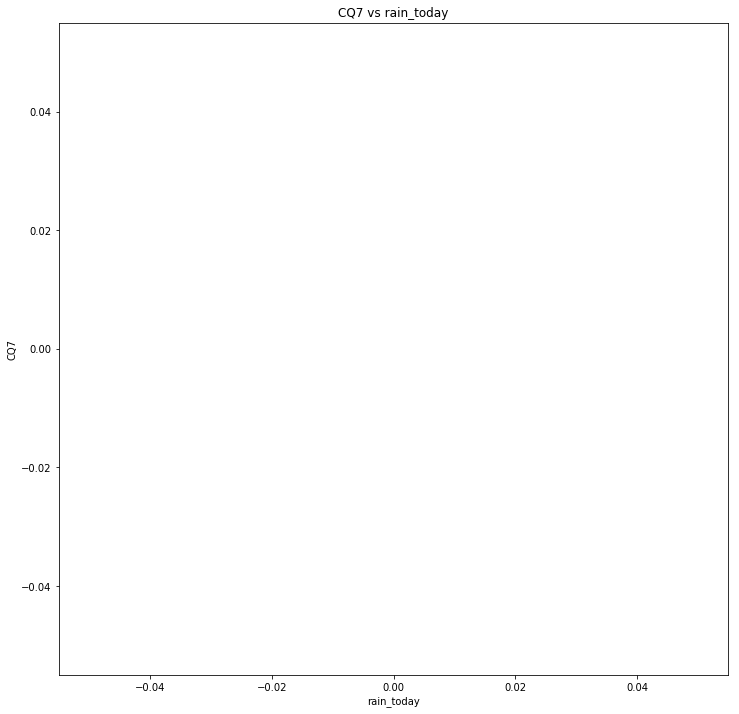

CQ7 rain_today nan
STARTING  snow_1h CQ7


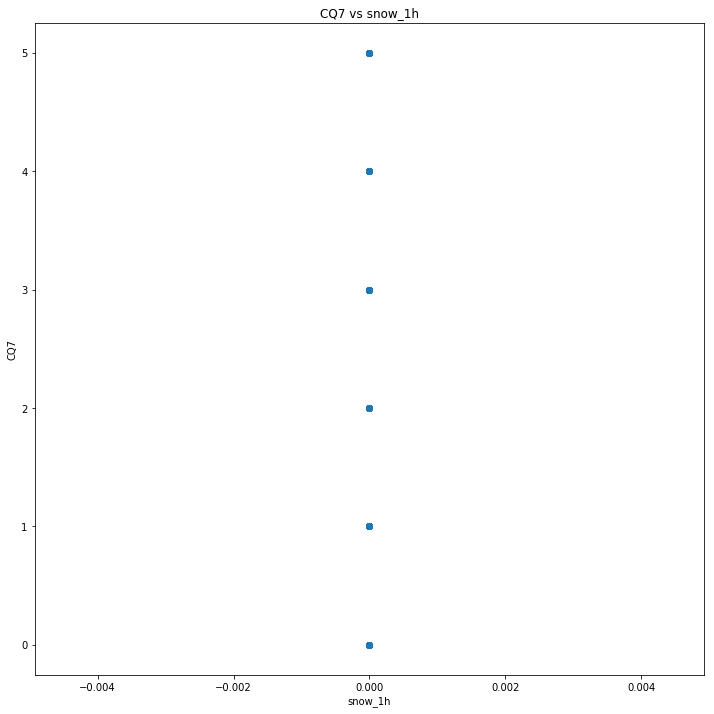

CQ7 snow_1h nan
STARTING  snow_3h CQ7


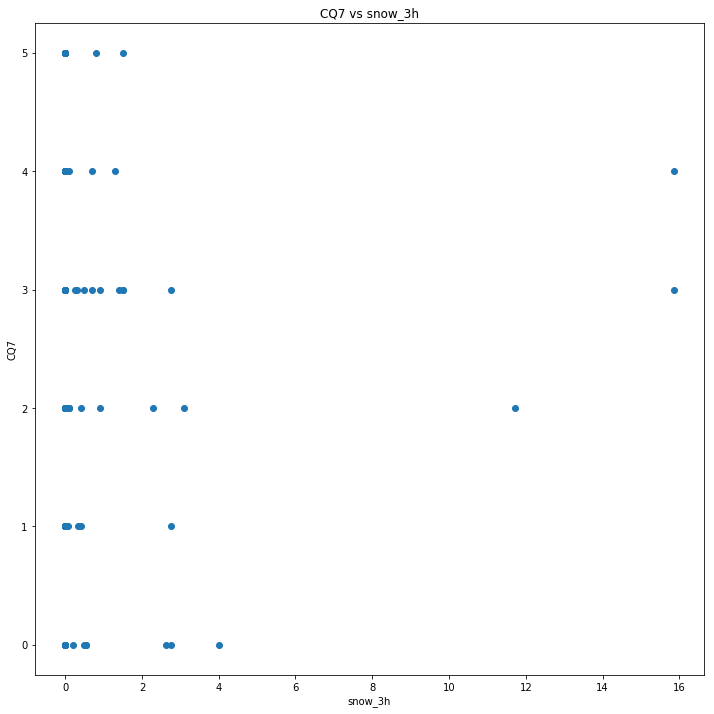

CQ7 snow_3h 0.03840136228678536
STARTING  snow_24h CQ7


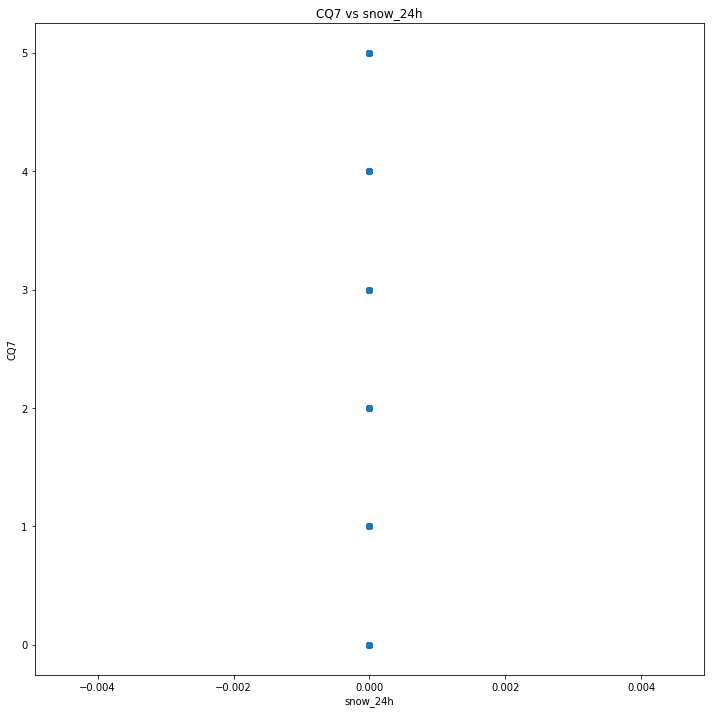

CQ7 snow_24h nan
STARTING  snow_today CQ7


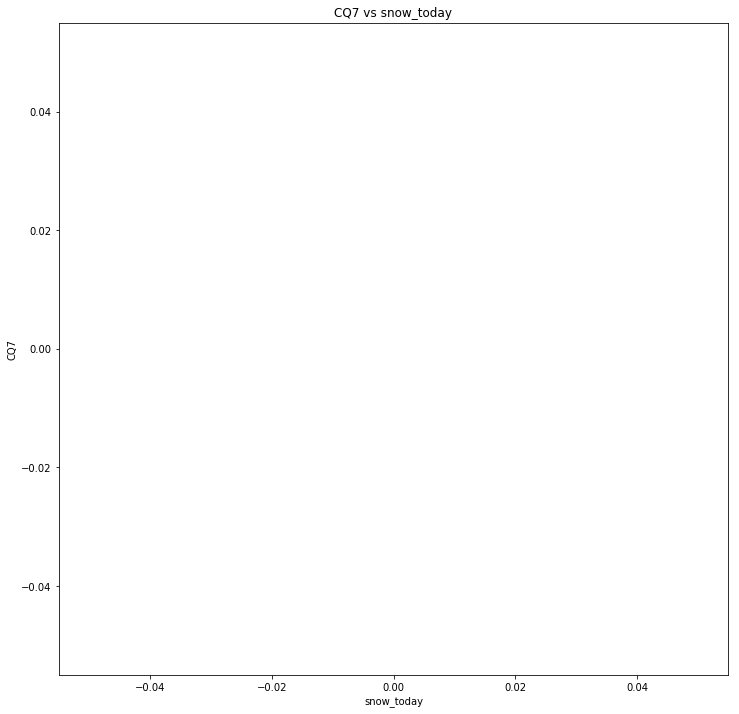

CQ7 snow_today nan
STARTING  clouds_all CQ7


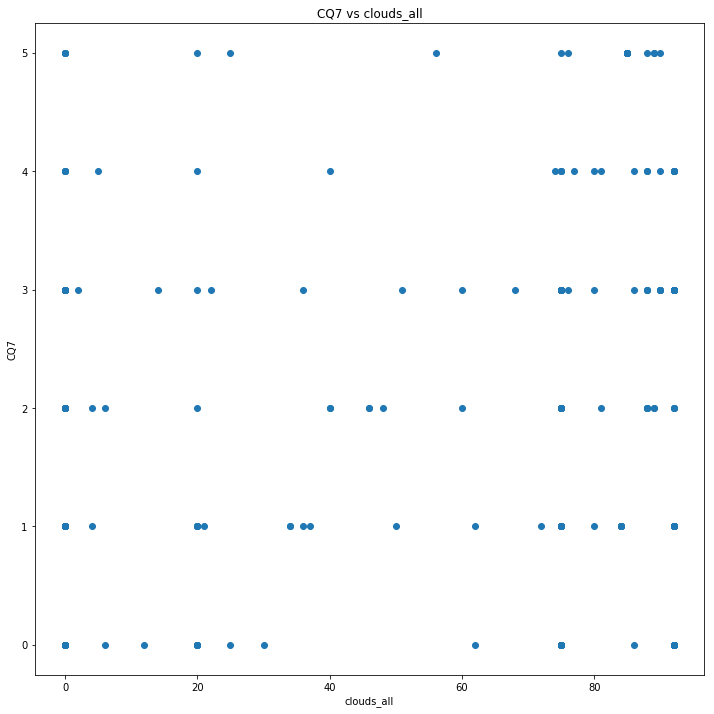

CQ7 clouds_all 0.1670090341743888
STARTING  temp CQ8


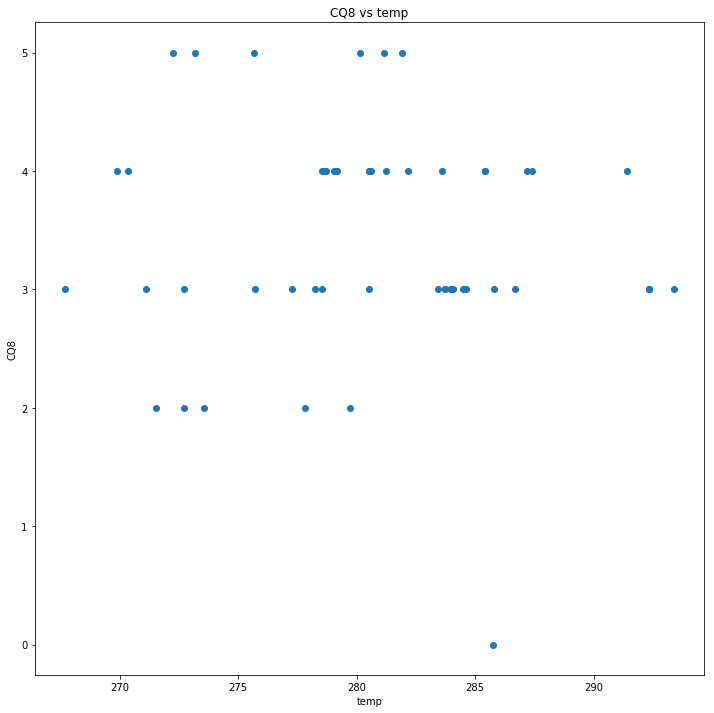

CQ8 temp -0.08682380809951942
STARTING  pressure CQ8


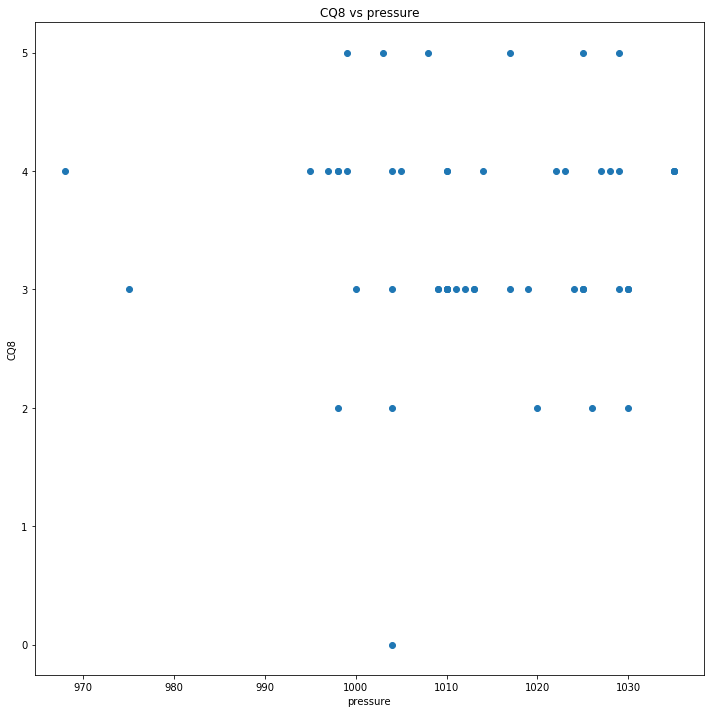

CQ8 pressure 0.00642147560577479
STARTING  humidity CQ8


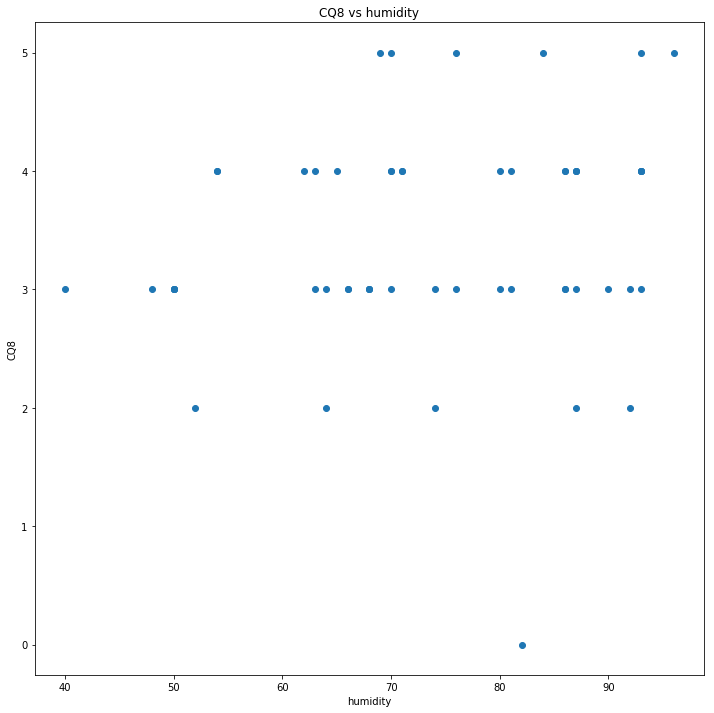

CQ8 humidity 0.17097729706176076
STARTING  wind_speed CQ8


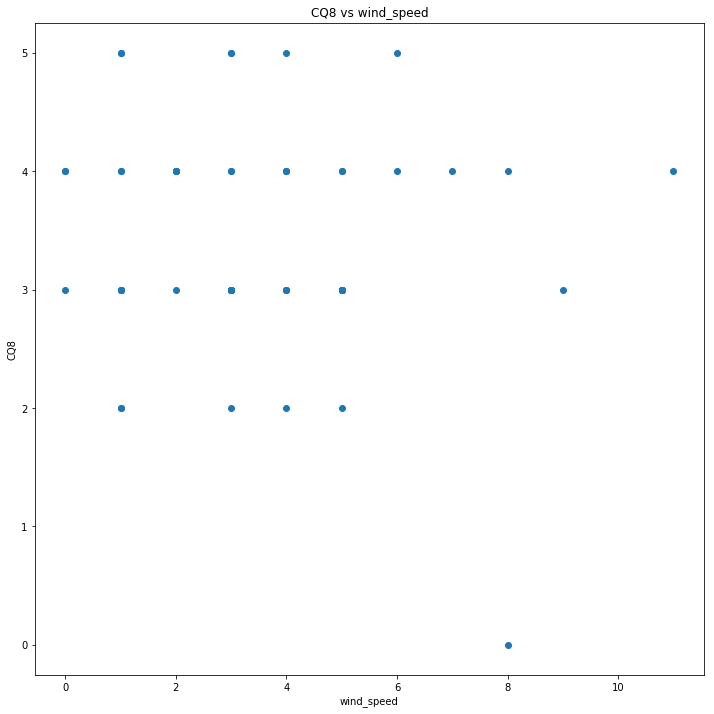

CQ8 wind_speed -0.10811579045192099
STARTING  wind_deg CQ8


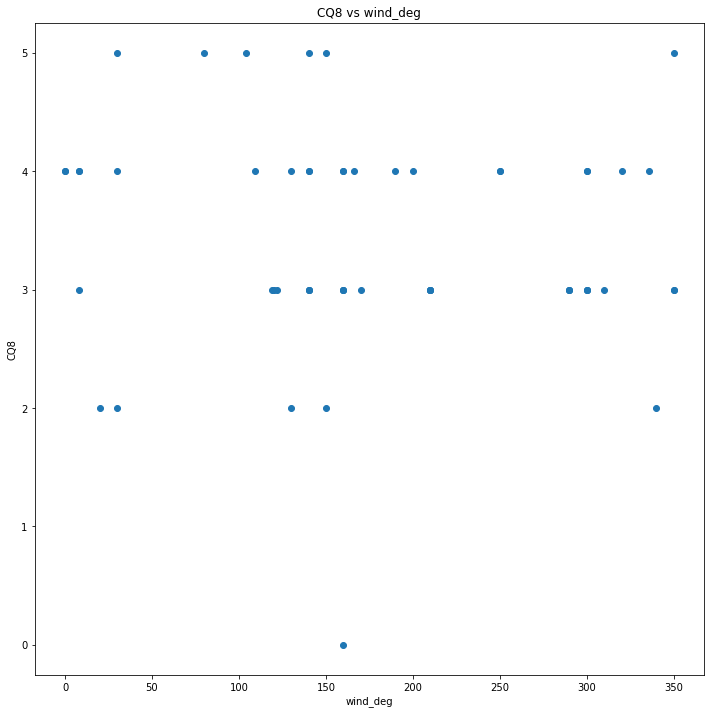

CQ8 wind_deg -0.09499915955377491
STARTING  rain_1h CQ8


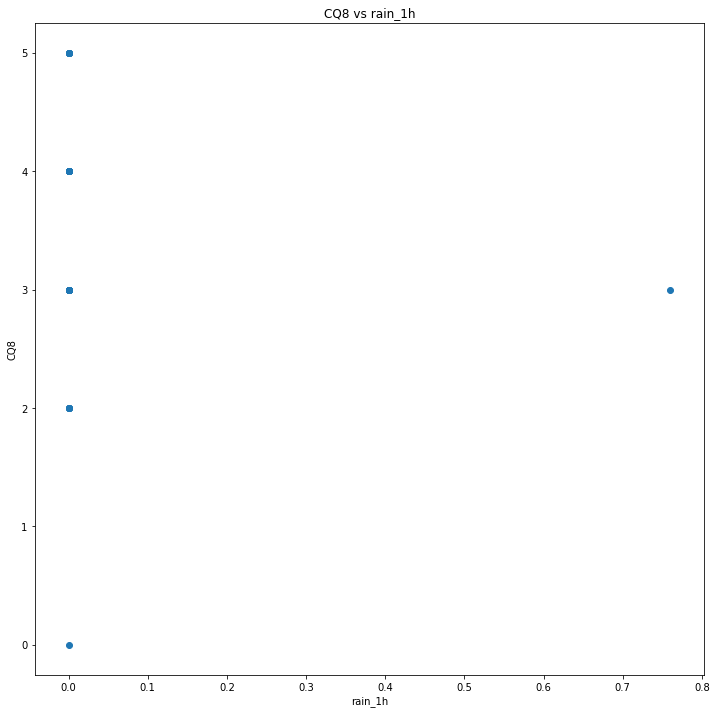

CQ8 rain_1h -0.06260538203344516
STARTING  rain_3h CQ8


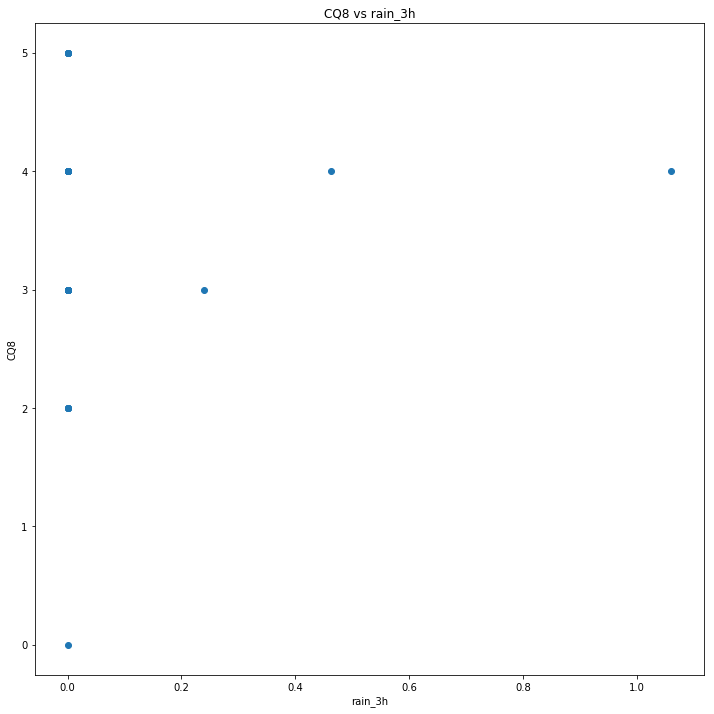

CQ8 rain_3h 0.0959530616155838
STARTING  rain_24h CQ8


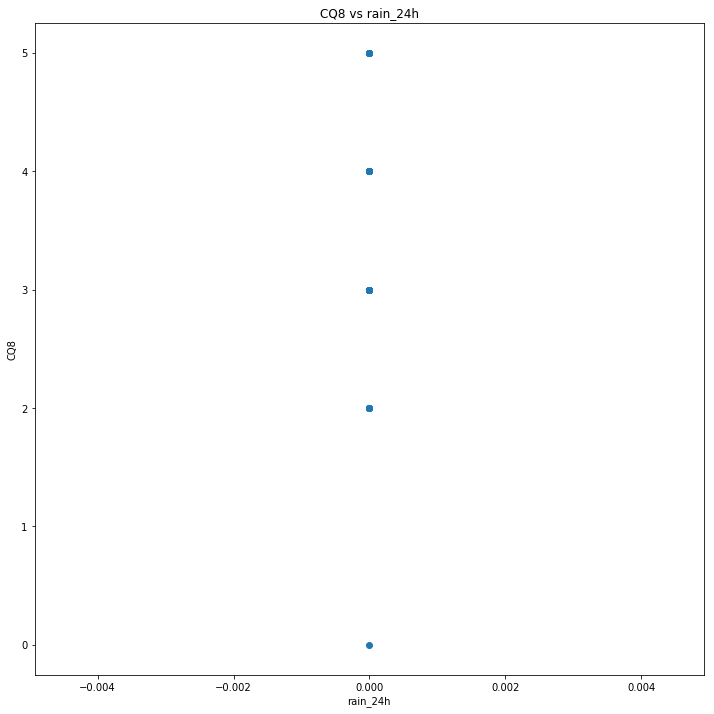

CQ8 rain_24h nan
STARTING  rain_today CQ8


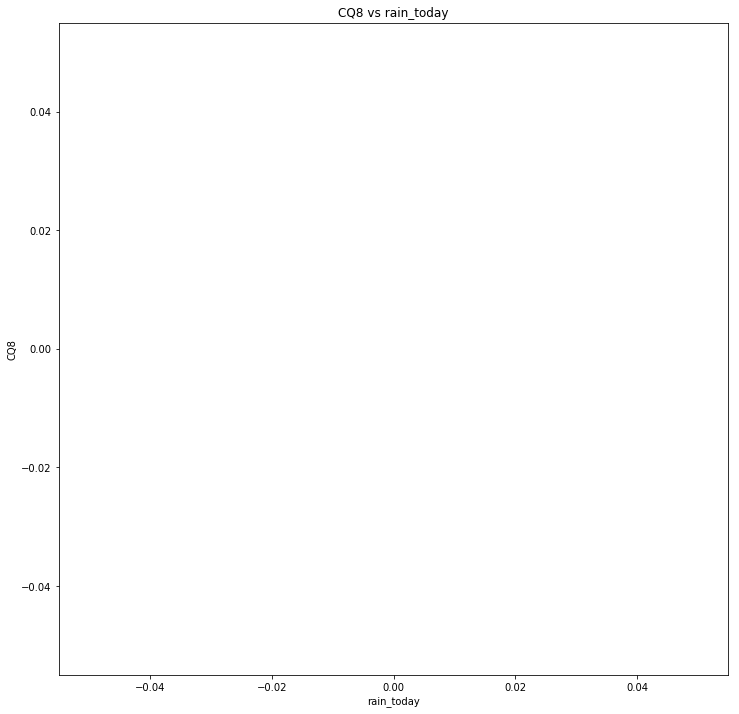

CQ8 rain_today nan
STARTING  snow_1h CQ8


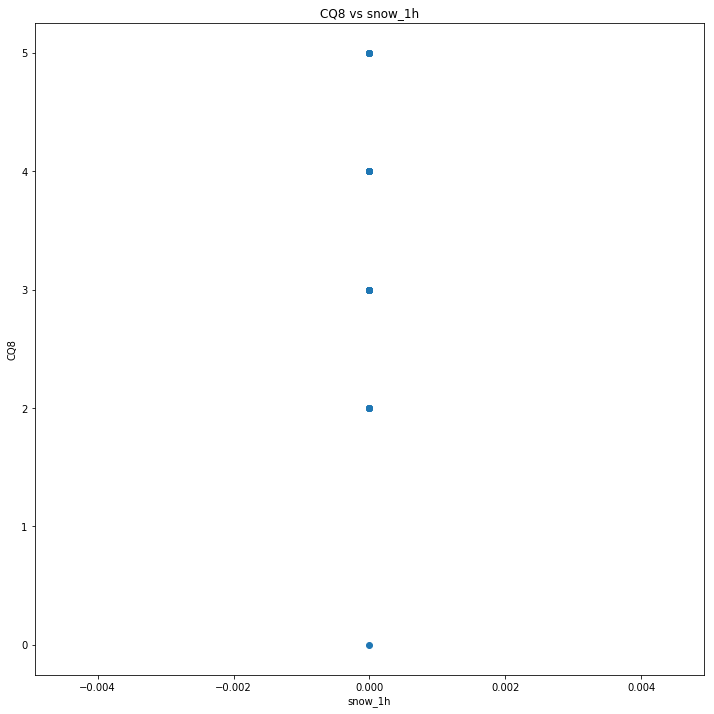

CQ8 snow_1h nan
STARTING  snow_3h CQ8


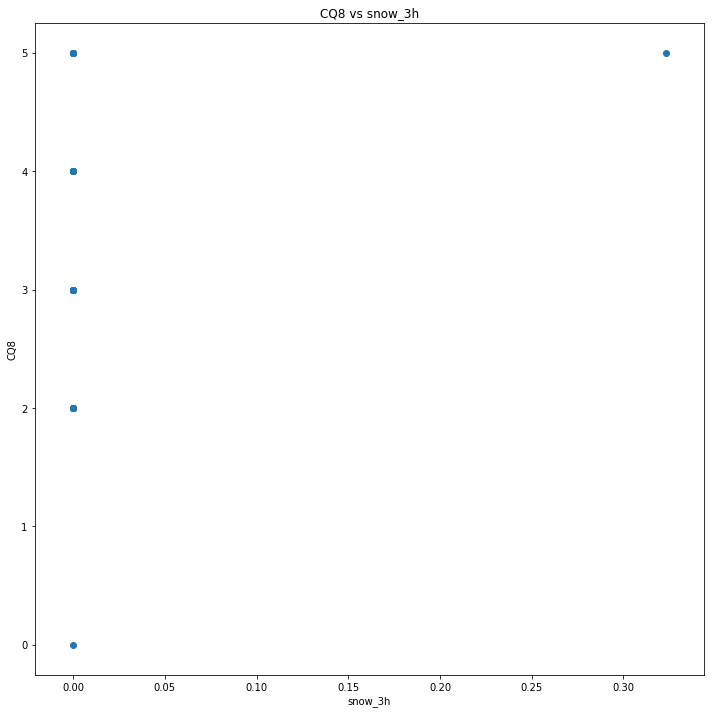

CQ8 snow_3h 0.22955306745596543
STARTING  snow_24h CQ8


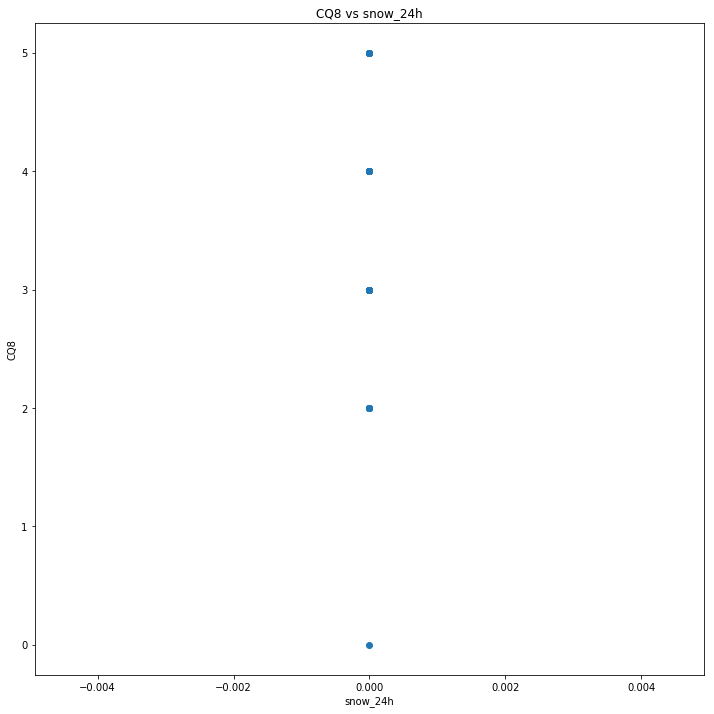

CQ8 snow_24h nan
STARTING  snow_today CQ8


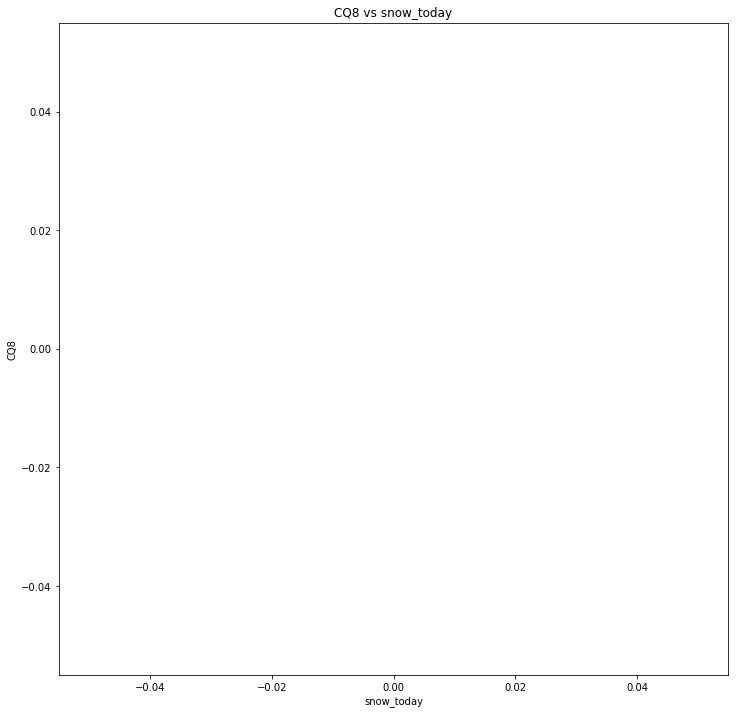

CQ8 snow_today nan
STARTING  clouds_all CQ8


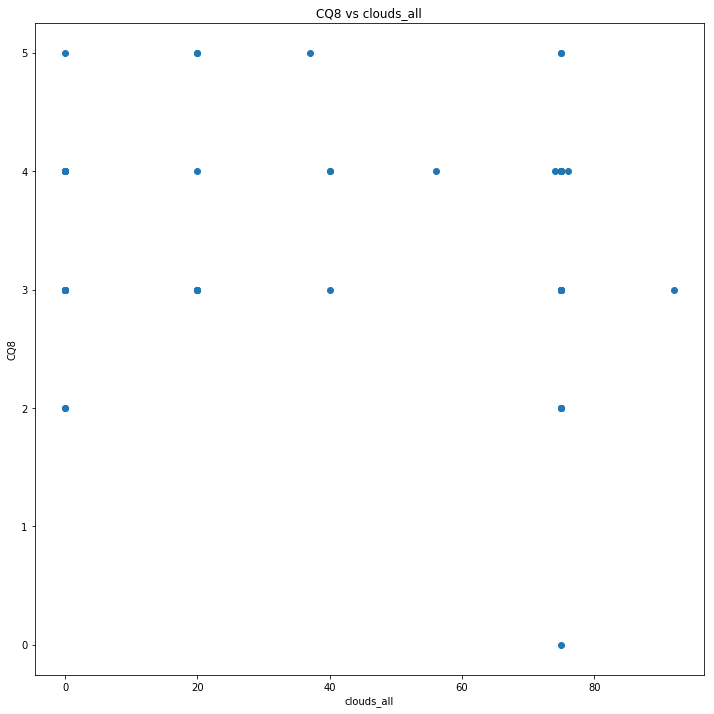

CQ8 clouds_all -0.10921106643805273
STARTING  temp question_Triage


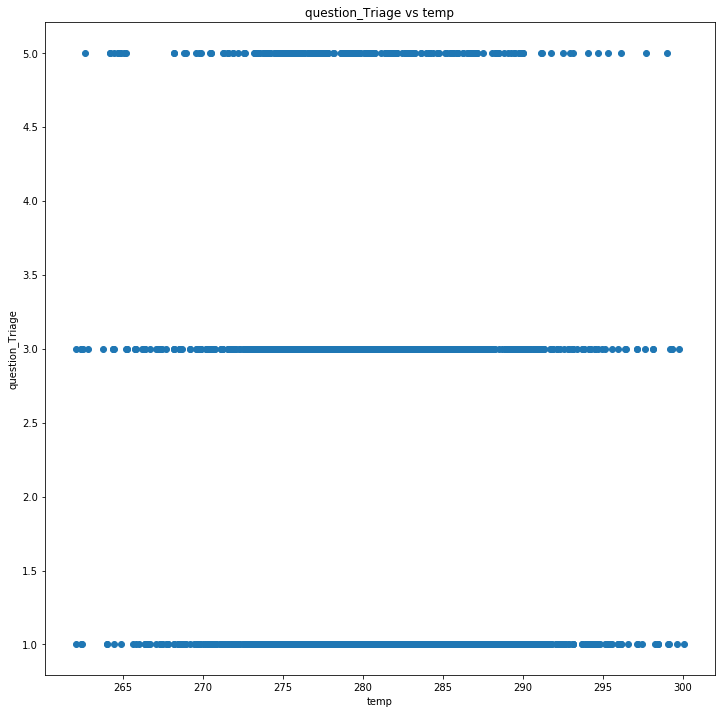

question_Triage temp -0.1079541534693405
STARTING  pressure question_Triage


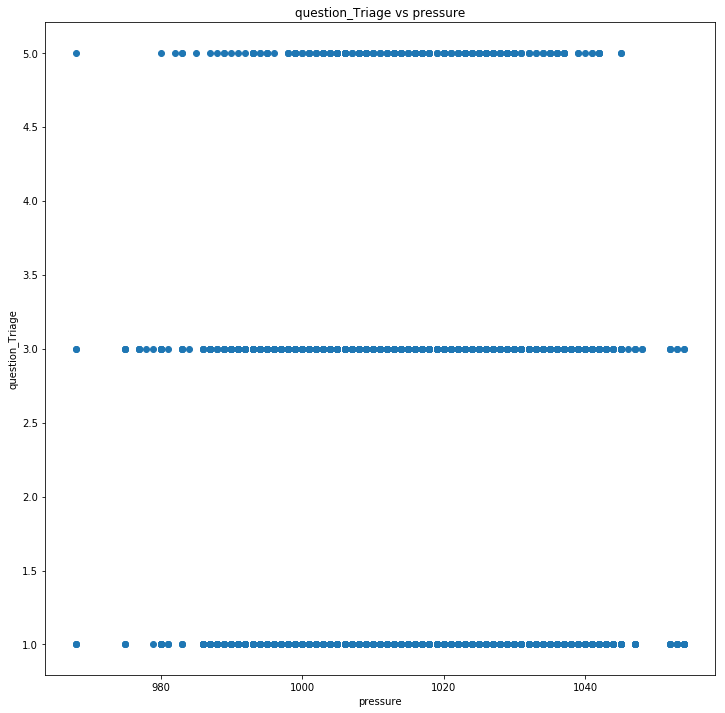

question_Triage pressure -0.03852261547252848
STARTING  humidity question_Triage


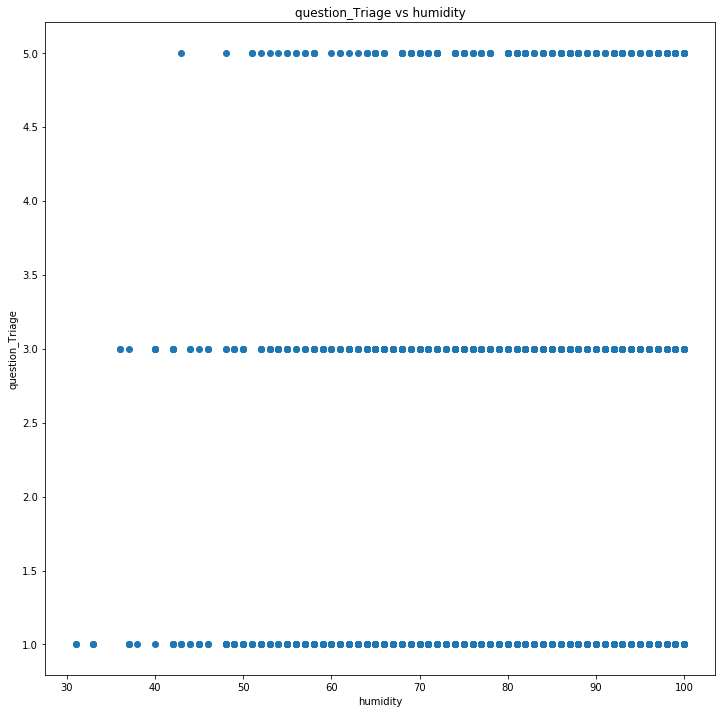

question_Triage humidity 0.02424300007969062
STARTING  wind_speed question_Triage


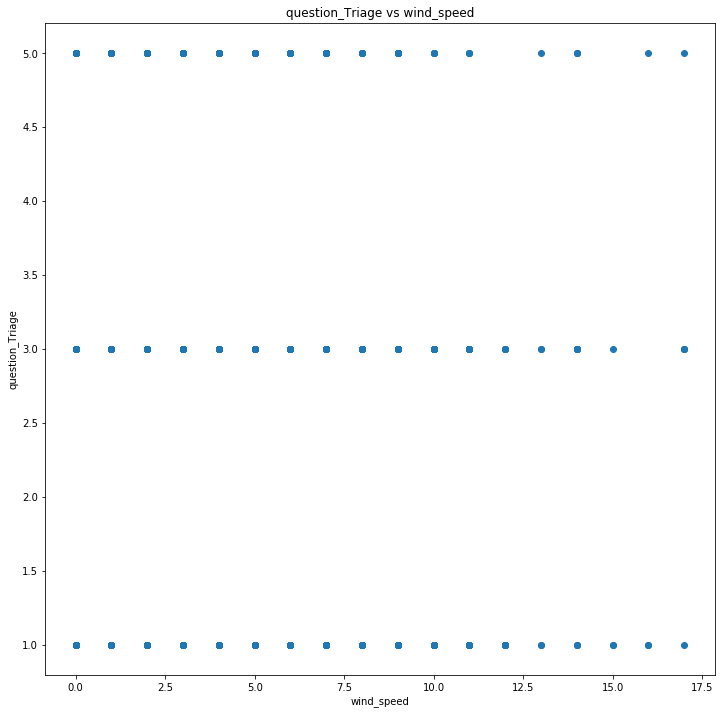

question_Triage wind_speed 0.06522230451967323
STARTING  wind_deg question_Triage


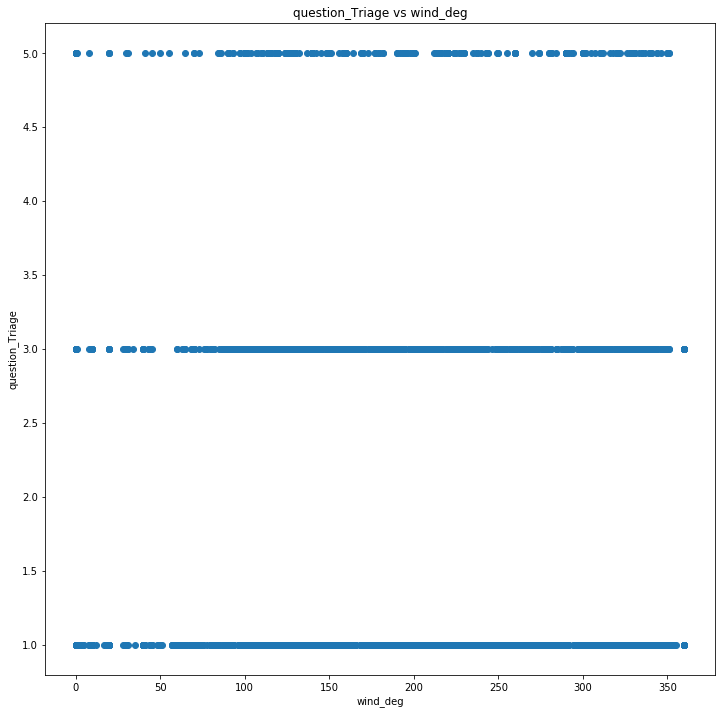

question_Triage wind_deg -0.010493202014193445
STARTING  rain_1h question_Triage


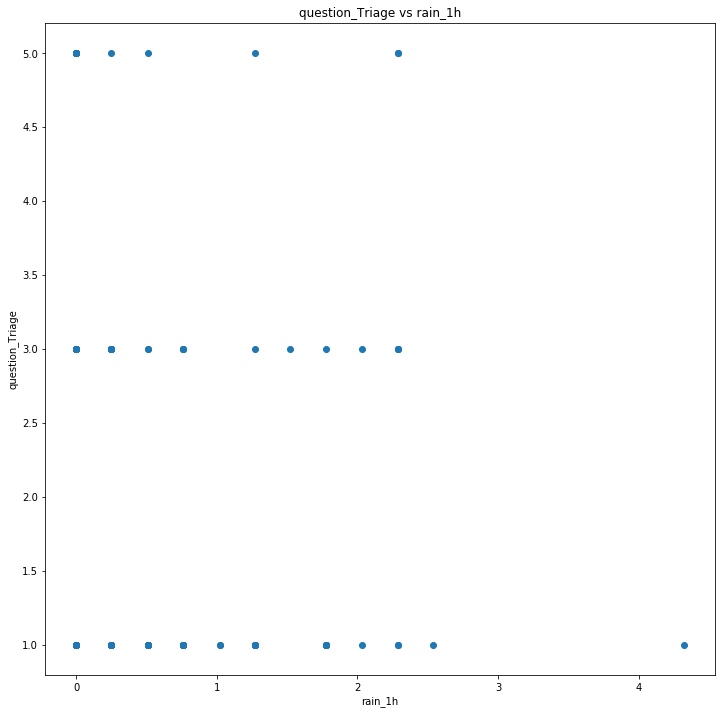

question_Triage rain_1h -0.010957496199219777
STARTING  rain_3h question_Triage


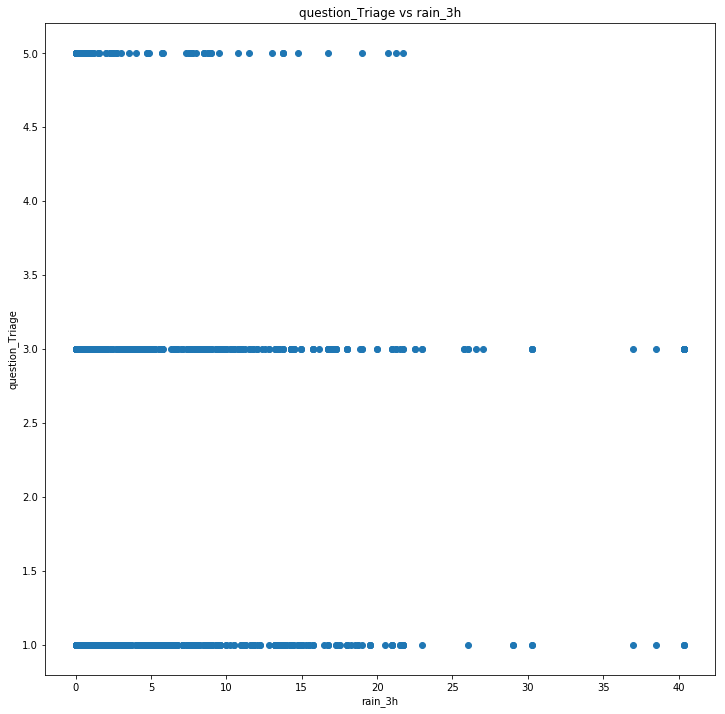

question_Triage rain_3h 0.030245763427515435
STARTING  rain_24h question_Triage


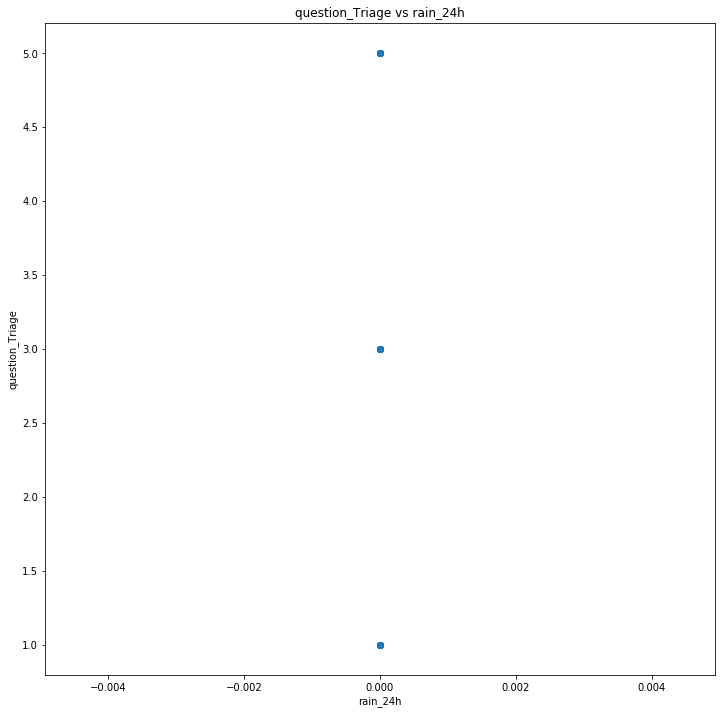

question_Triage rain_24h nan
STARTING  rain_today question_Triage


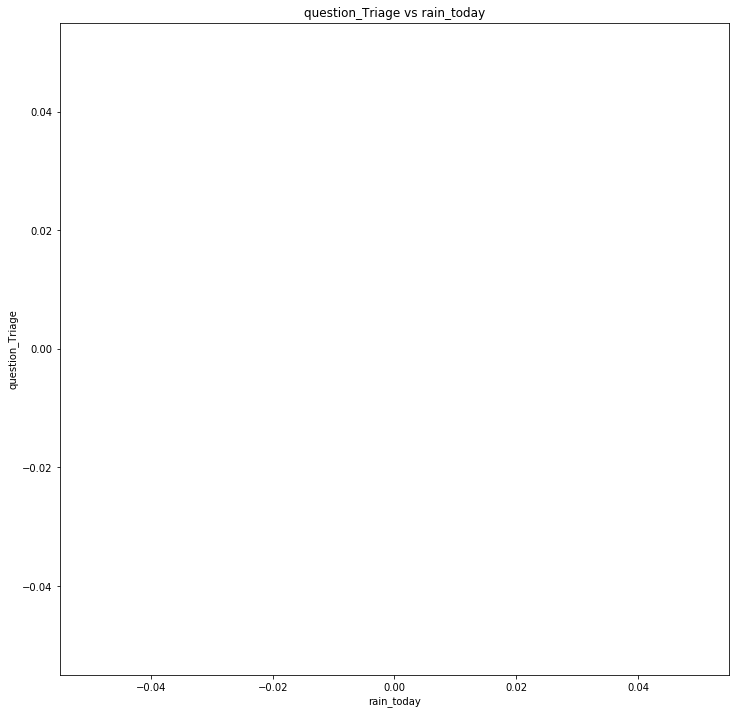

question_Triage rain_today nan
STARTING  snow_1h question_Triage


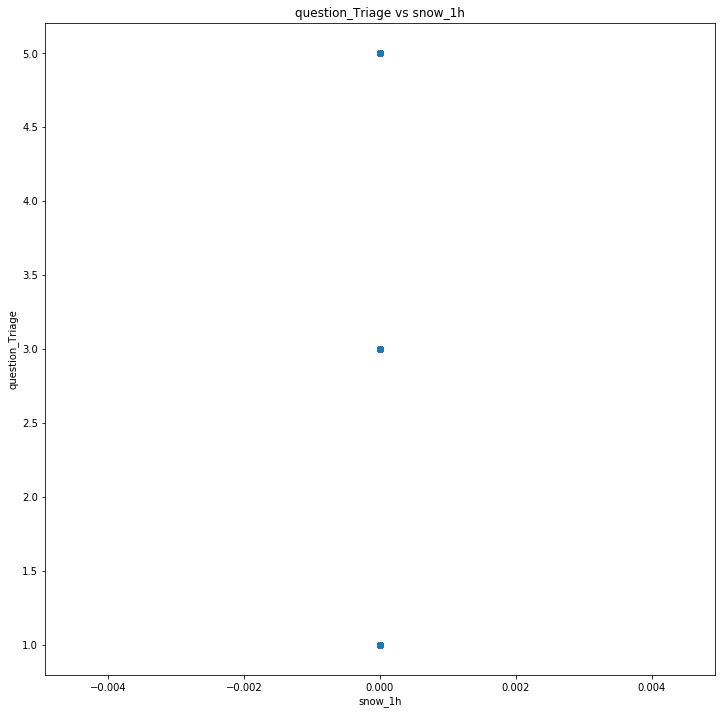

question_Triage snow_1h nan
STARTING  snow_3h question_Triage


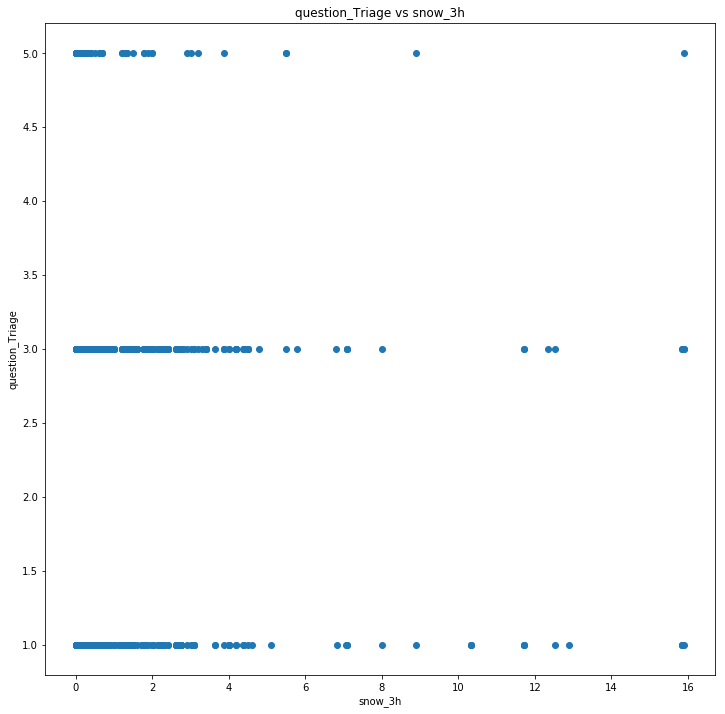

question_Triage snow_3h 0.03291584422711015
STARTING  snow_24h question_Triage


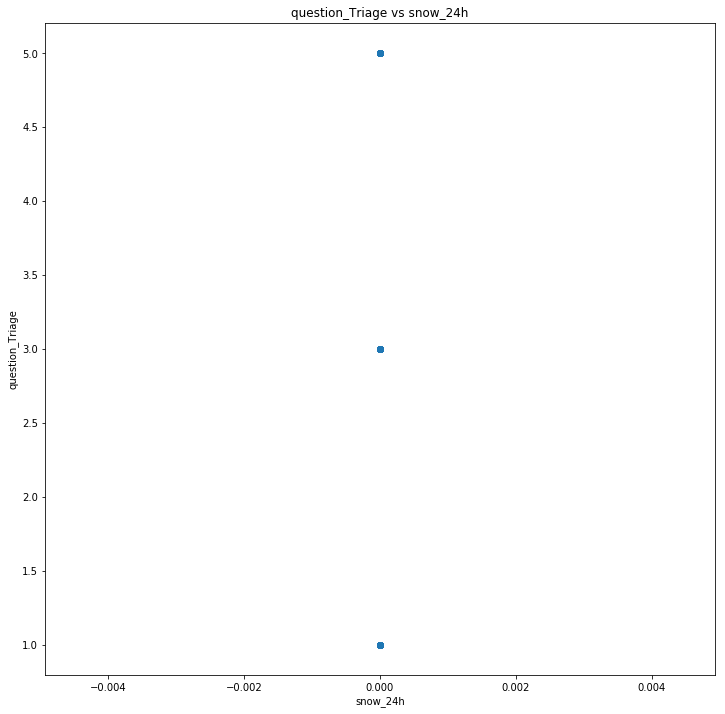

question_Triage snow_24h nan
STARTING  snow_today question_Triage


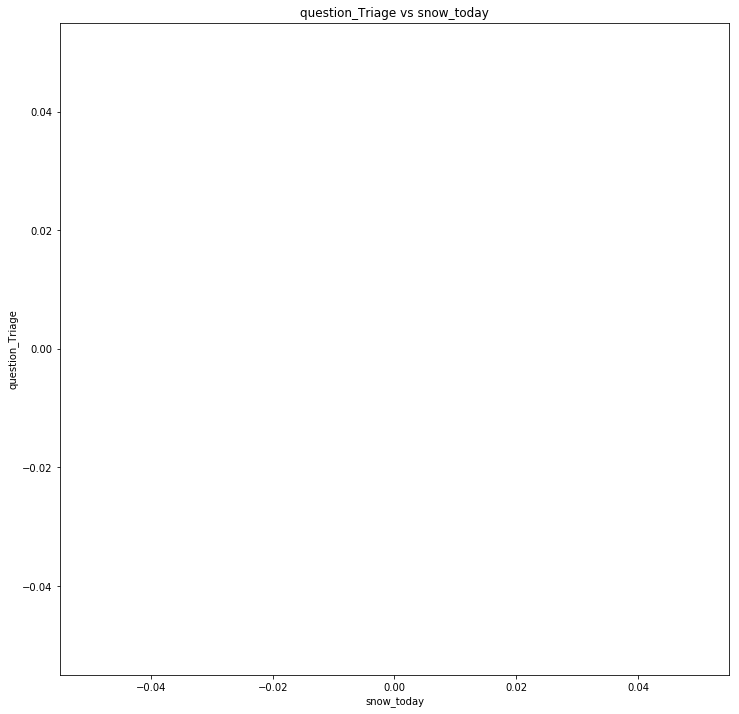

question_Triage snow_today nan
STARTING  clouds_all question_Triage


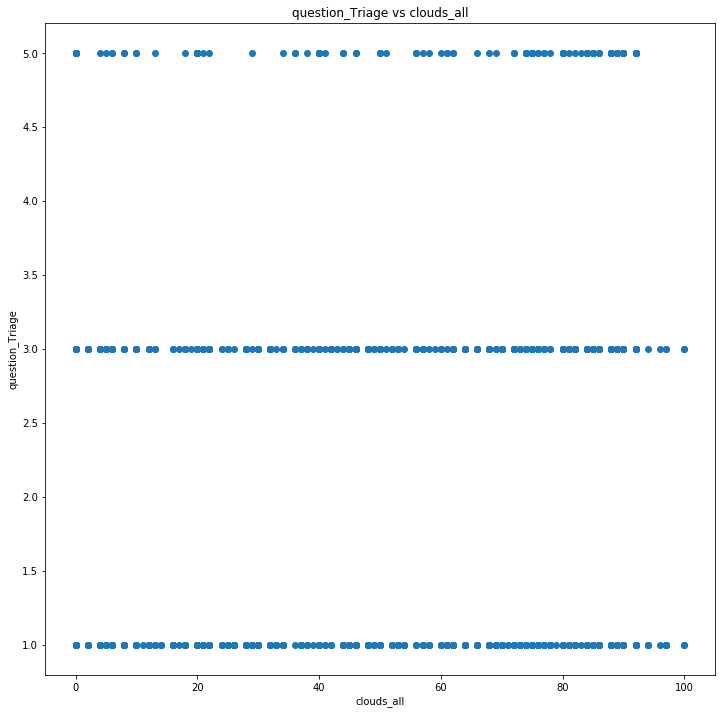

question_Triage clouds_all 0.051767294963197014
STARTING  temp pulse_Triage


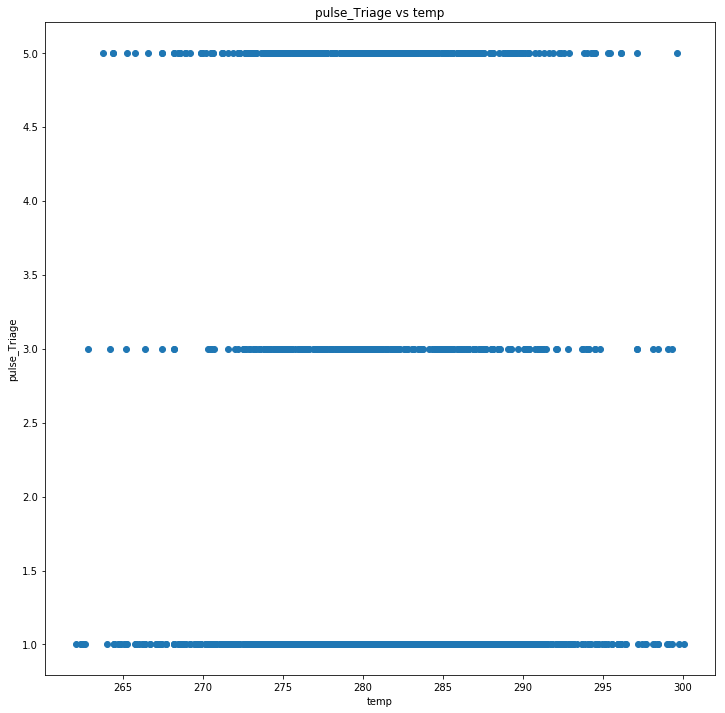

pulse_Triage temp 0.023503024165194415
STARTING  pressure pulse_Triage


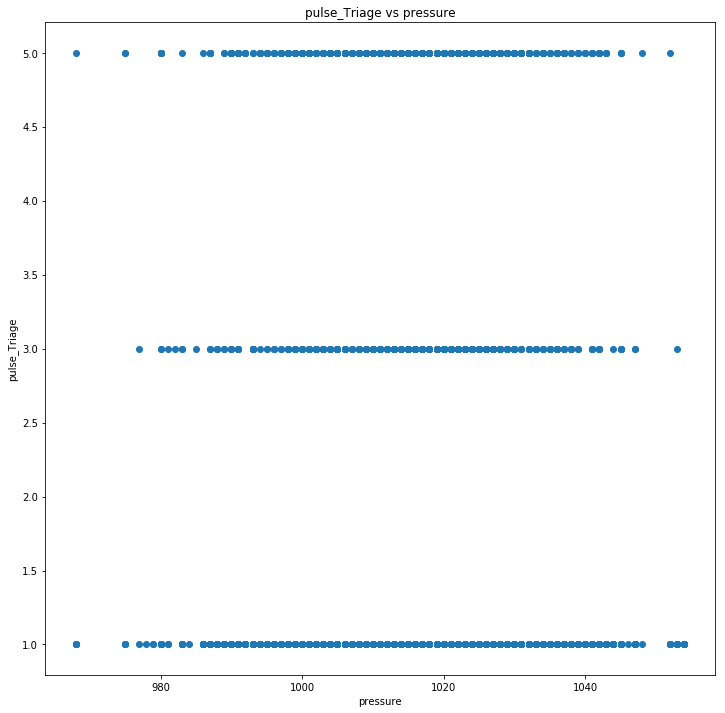

pulse_Triage pressure -0.04844527229006596
STARTING  humidity pulse_Triage


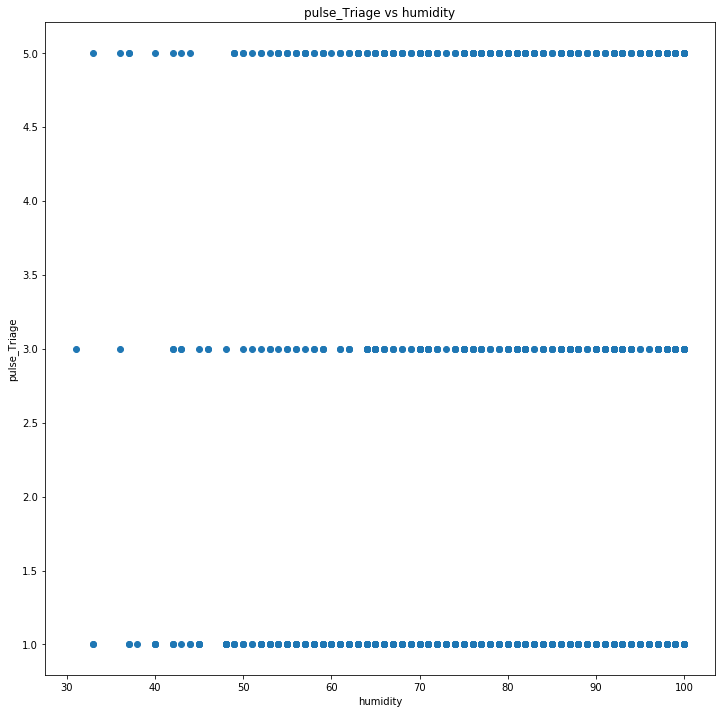

pulse_Triage humidity -0.0500800910040865
STARTING  wind_speed pulse_Triage


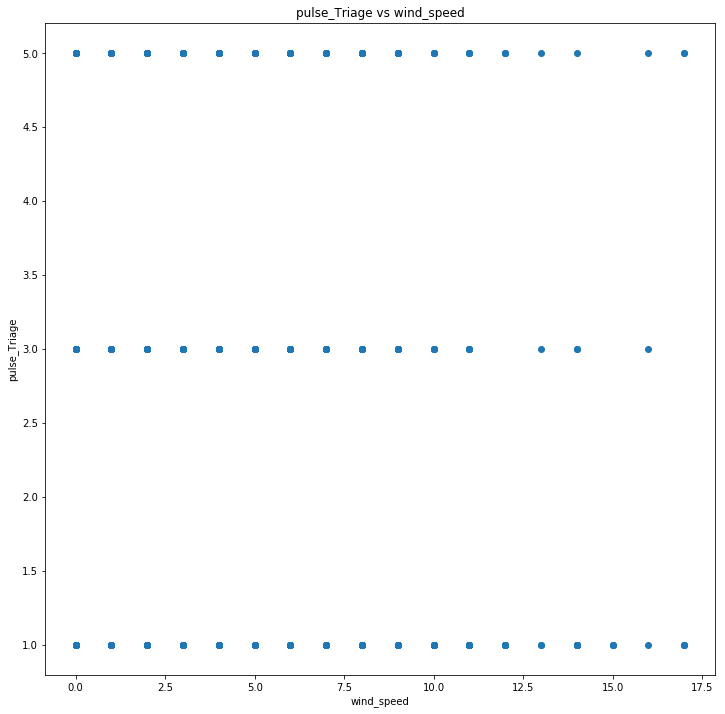

pulse_Triage wind_speed 0.07551452559085553
STARTING  wind_deg pulse_Triage


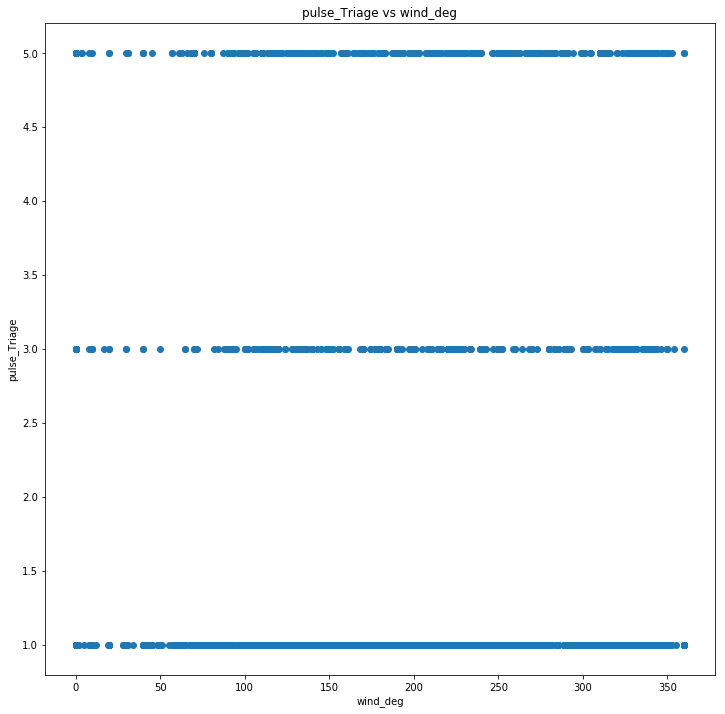

pulse_Triage wind_deg 0.008055401028421715
STARTING  rain_1h pulse_Triage


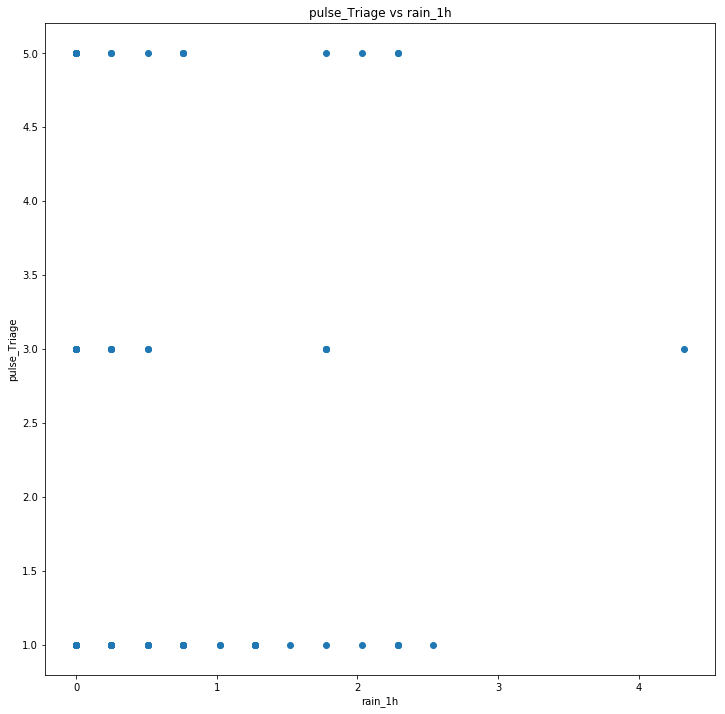

pulse_Triage rain_1h 0.020544487411527968
STARTING  rain_3h pulse_Triage


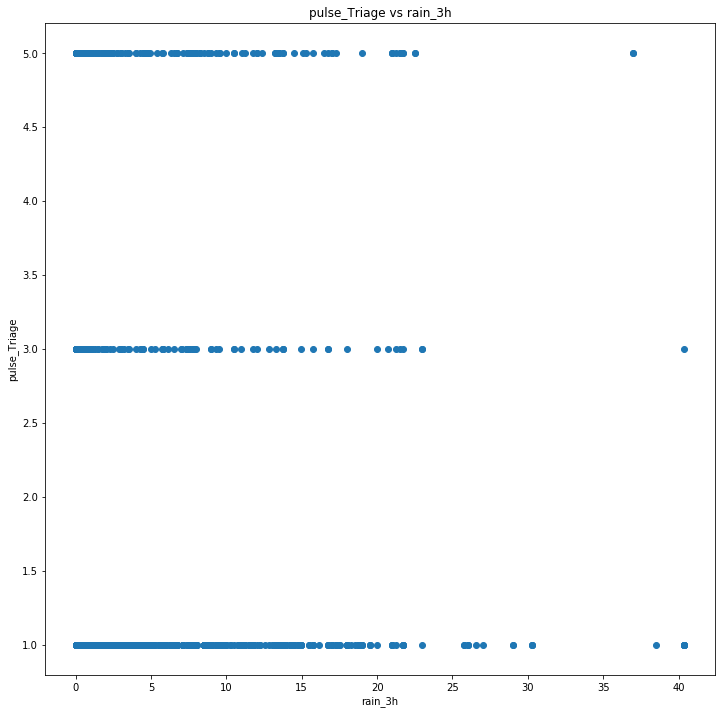

pulse_Triage rain_3h 0.007224982626080728
STARTING  rain_24h pulse_Triage


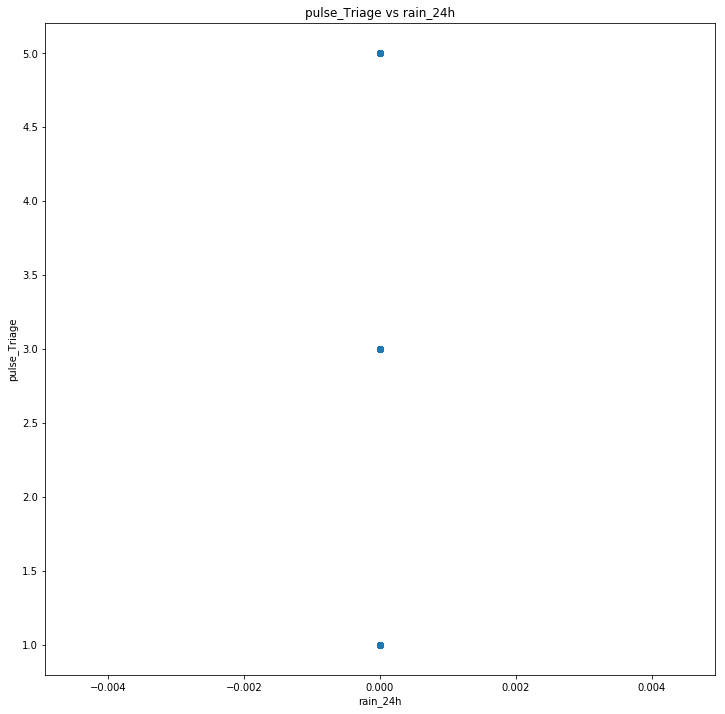

pulse_Triage rain_24h nan
STARTING  rain_today pulse_Triage


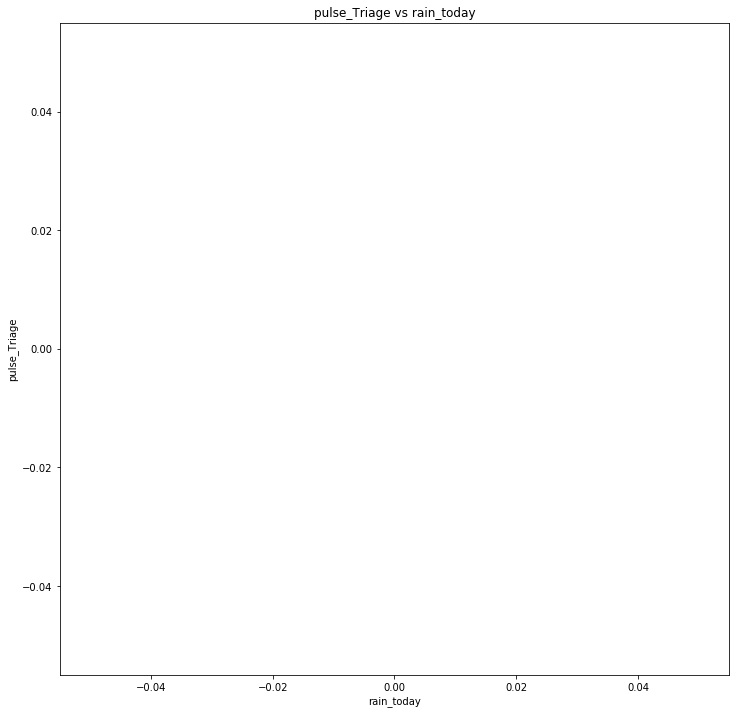

pulse_Triage rain_today nan
STARTING  snow_1h pulse_Triage


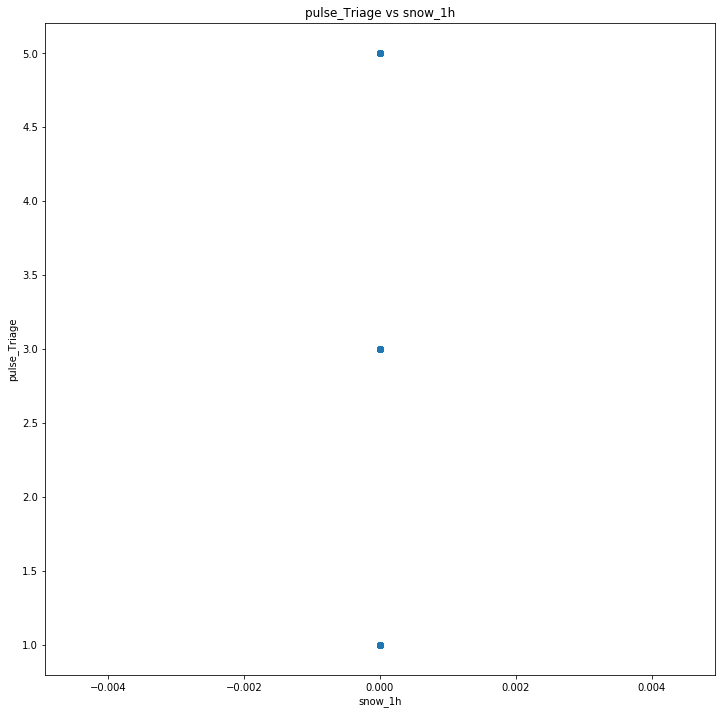

pulse_Triage snow_1h nan
STARTING  snow_3h pulse_Triage


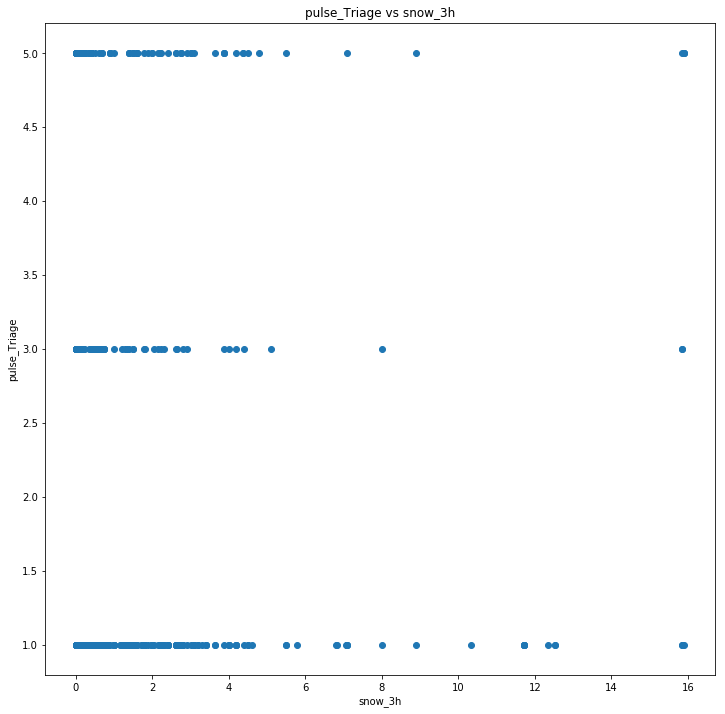

pulse_Triage snow_3h 0.030961850519909573
STARTING  snow_24h pulse_Triage


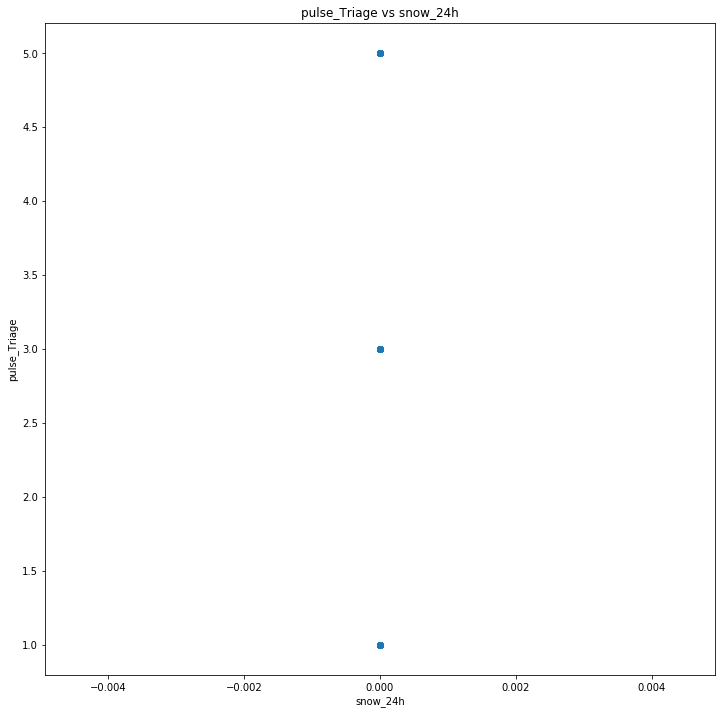

pulse_Triage snow_24h nan
STARTING  snow_today pulse_Triage


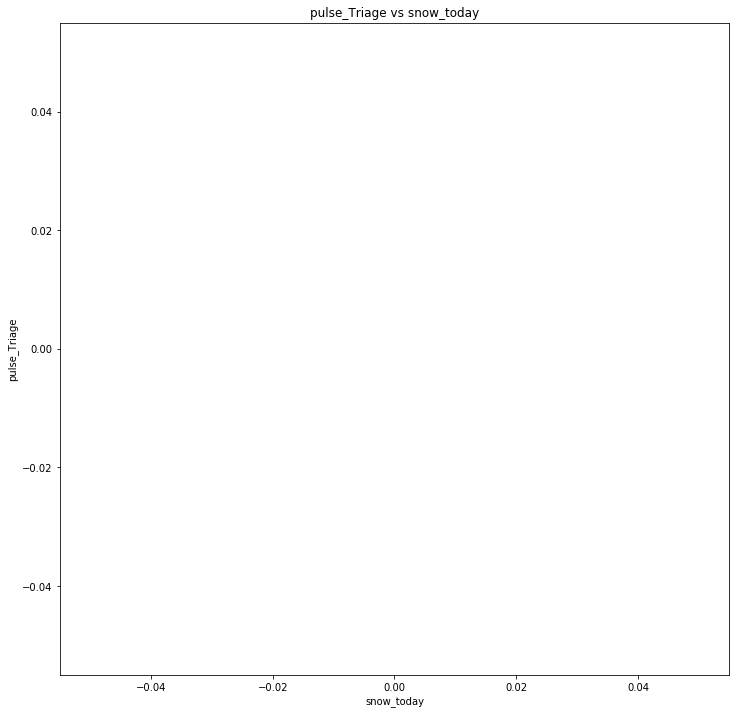

pulse_Triage snow_today nan
STARTING  clouds_all pulse_Triage


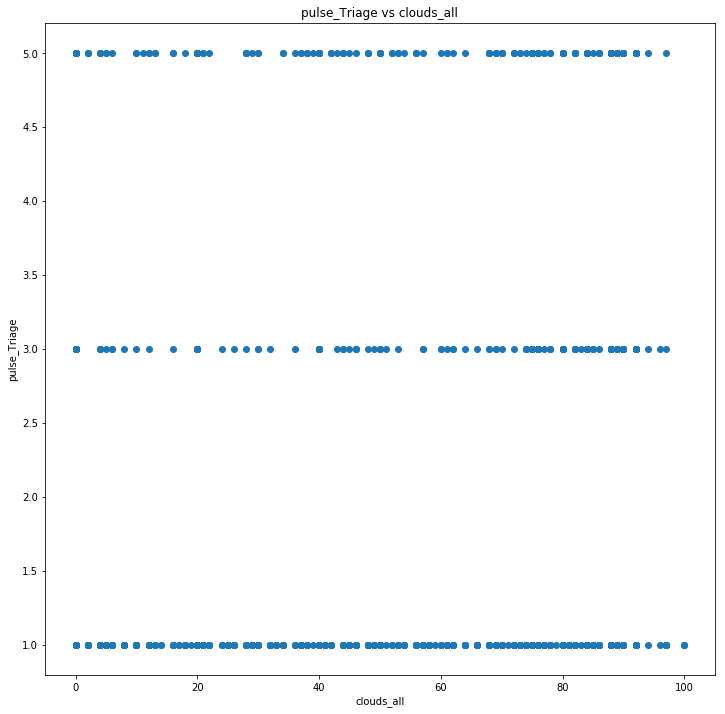

pulse_Triage clouds_all 0.02944682505381495
STARTING  temp spo2_Triage


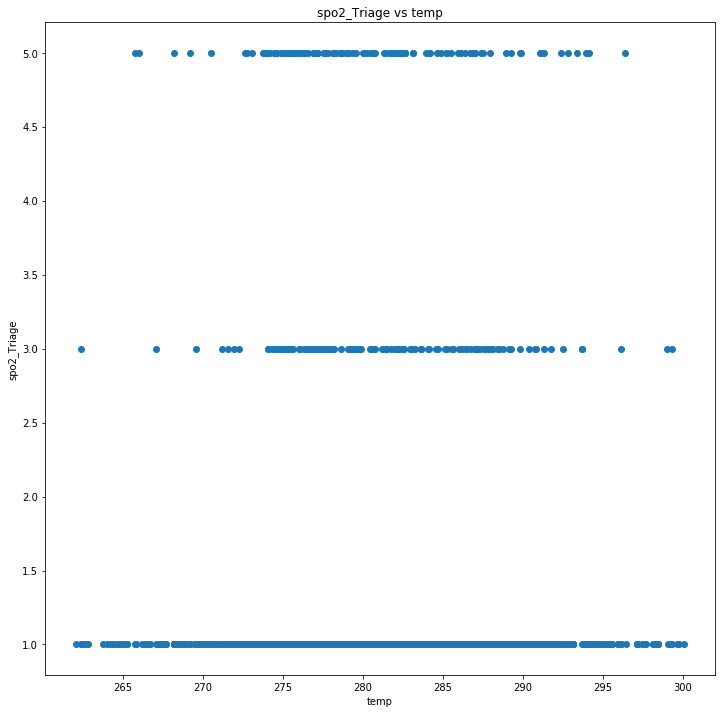

spo2_Triage temp 0.019408328358316677
STARTING  pressure spo2_Triage


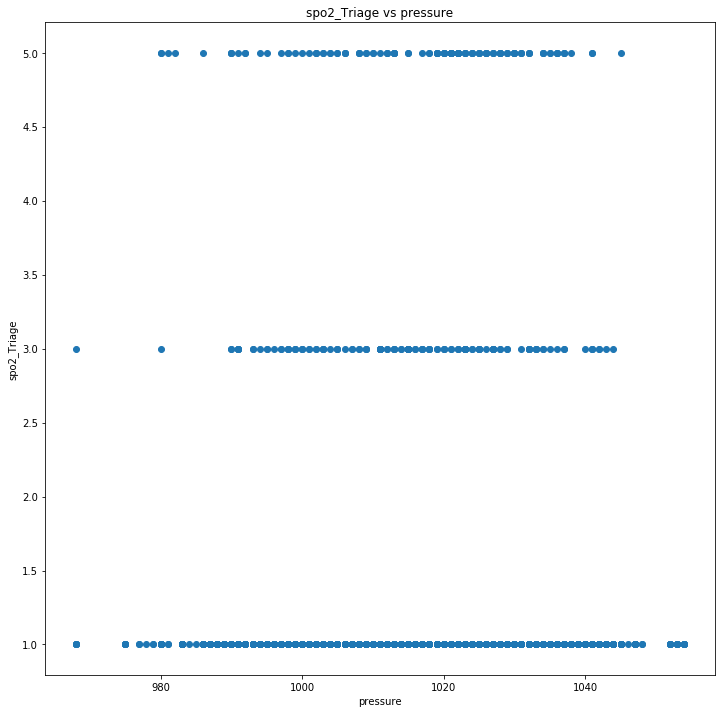

spo2_Triage pressure -0.0047528805348419755
STARTING  humidity spo2_Triage


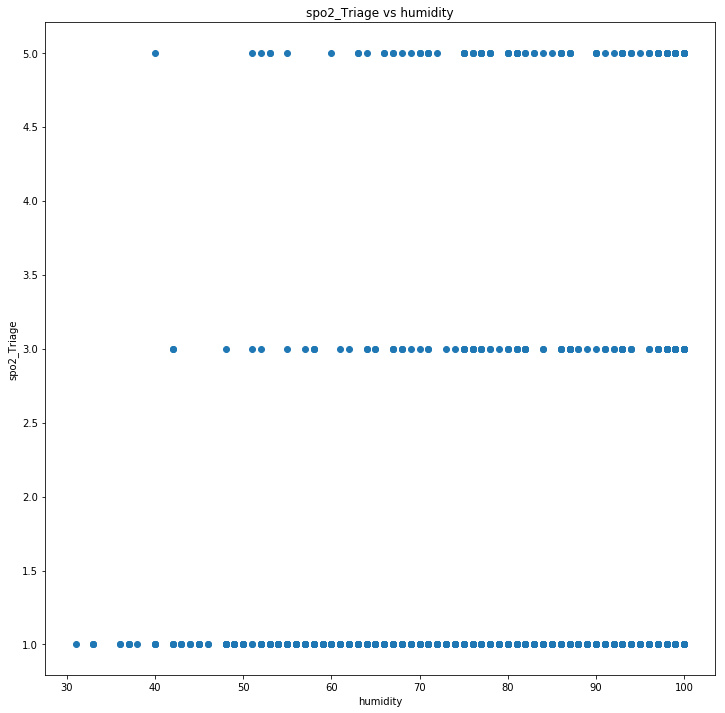

spo2_Triage humidity 0.0076329381146292485
STARTING  wind_speed spo2_Triage


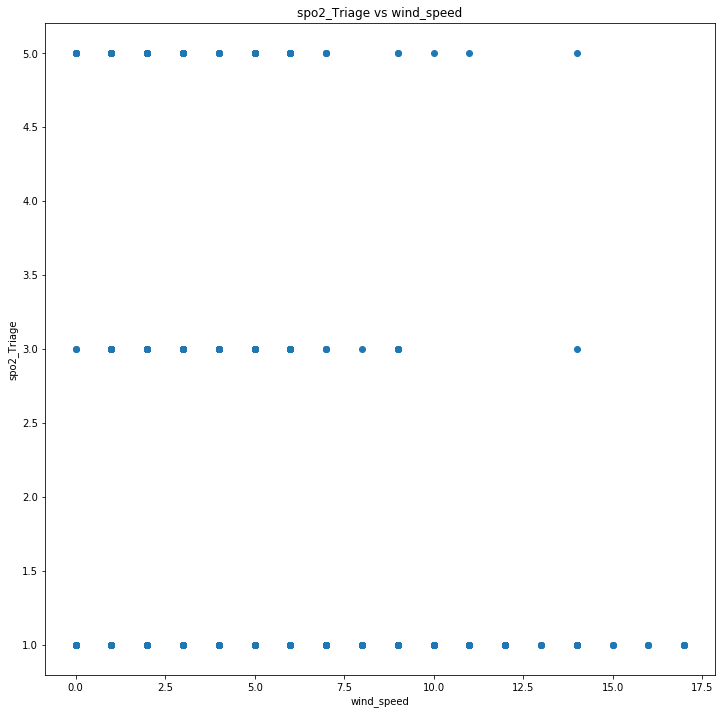

spo2_Triage wind_speed -0.01728614522914657
STARTING  wind_deg spo2_Triage


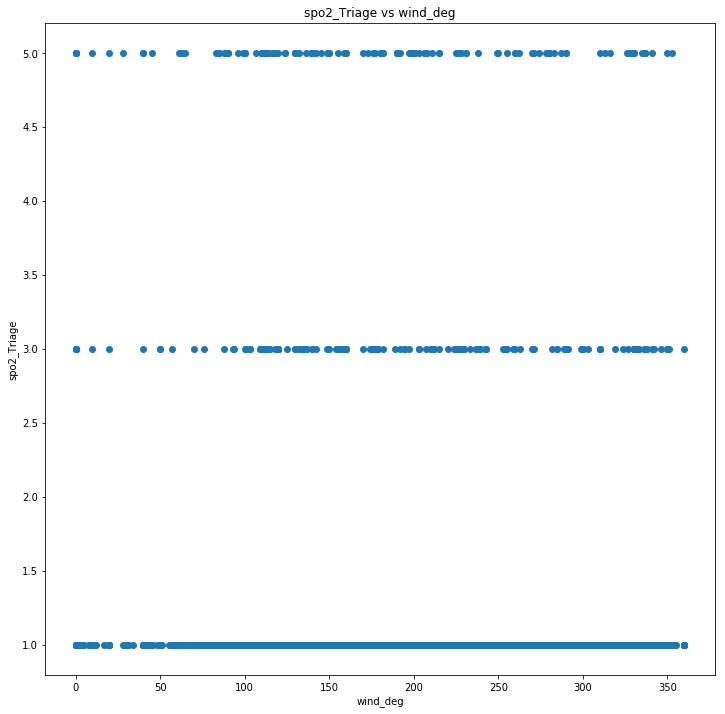

spo2_Triage wind_deg -0.03430320538051419
STARTING  rain_1h spo2_Triage


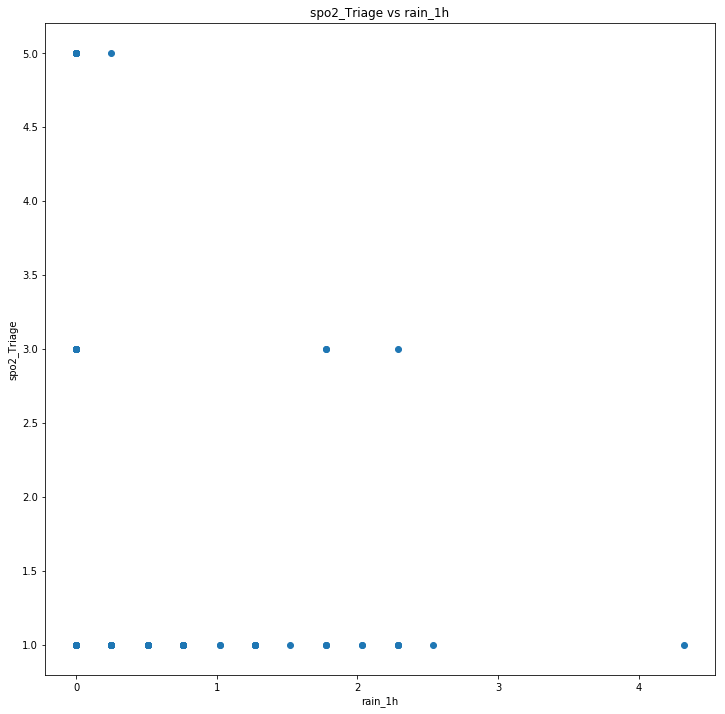

spo2_Triage rain_1h -0.006320858774262153
STARTING  rain_3h spo2_Triage


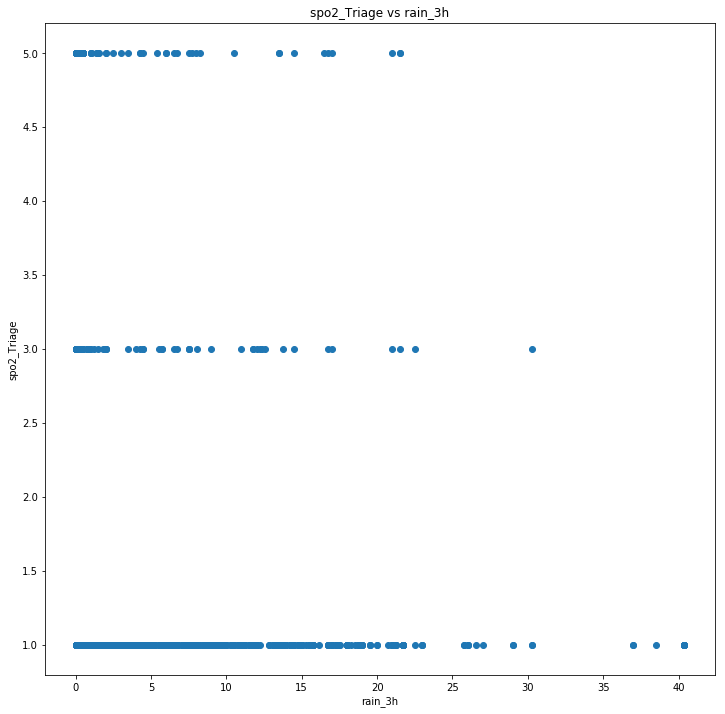

spo2_Triage rain_3h 0.01431109707477363
STARTING  rain_24h spo2_Triage


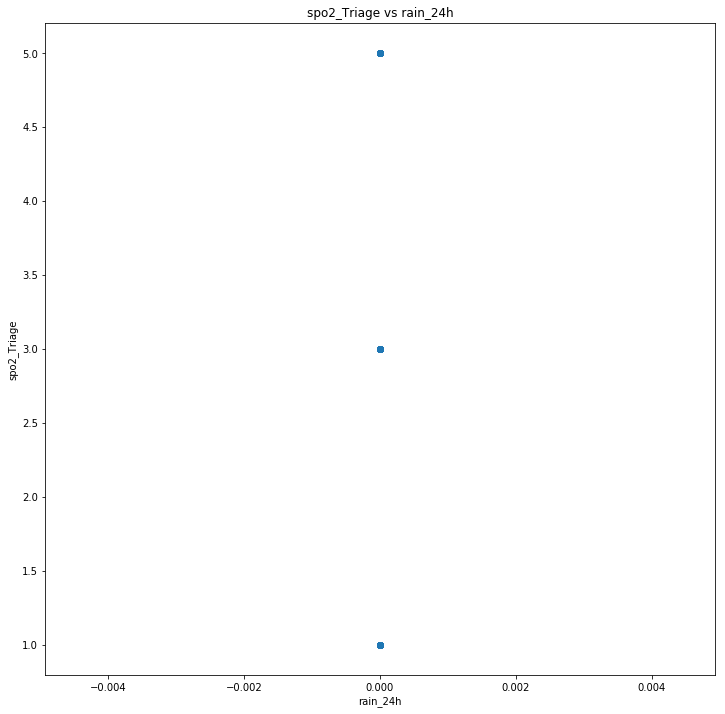

spo2_Triage rain_24h nan
STARTING  rain_today spo2_Triage


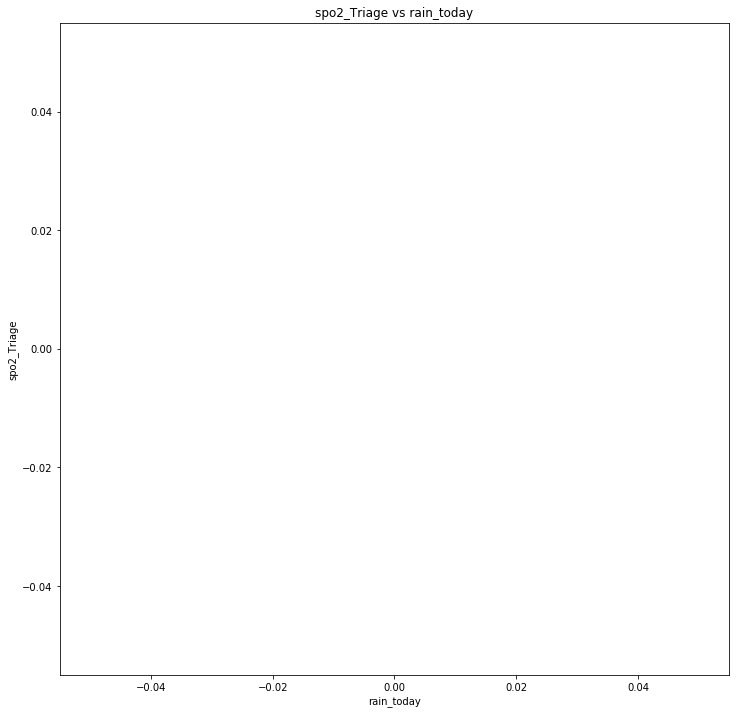

spo2_Triage rain_today nan
STARTING  snow_1h spo2_Triage


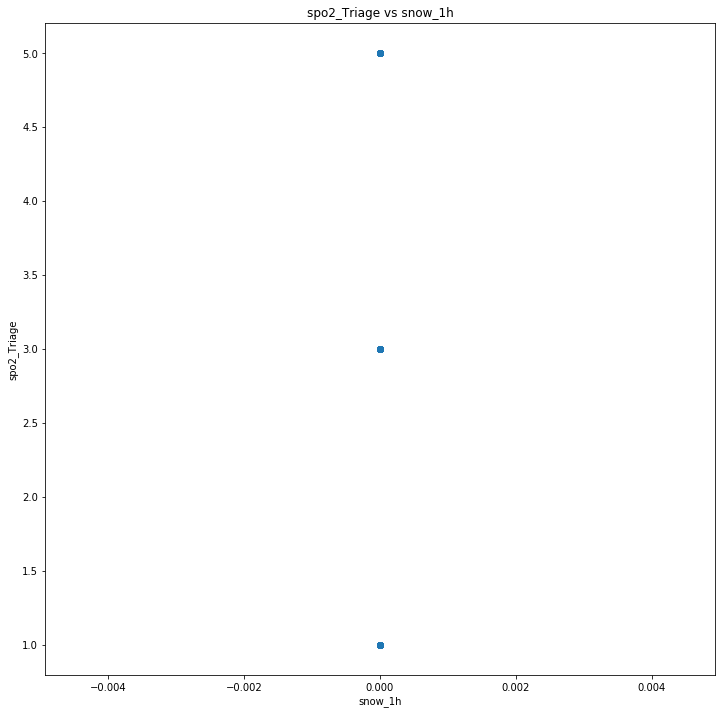

spo2_Triage snow_1h nan
STARTING  snow_3h spo2_Triage


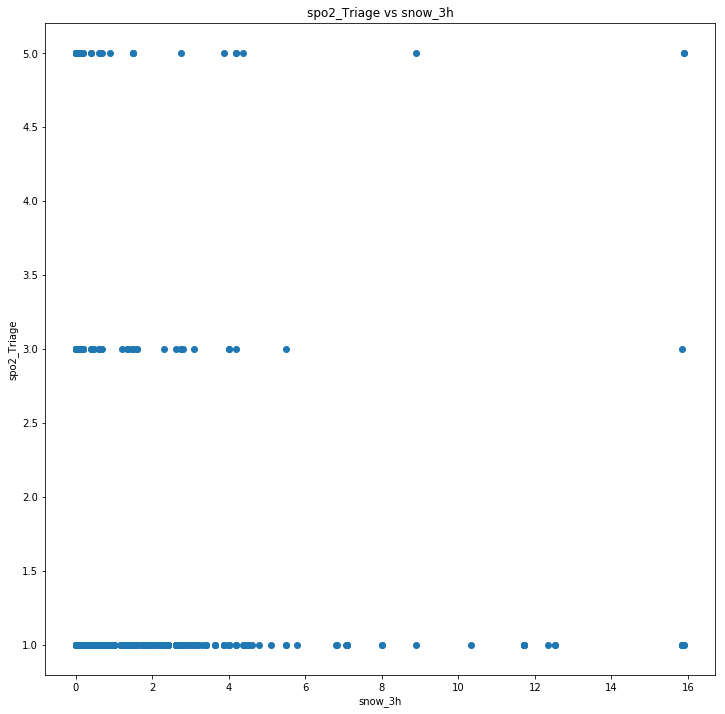

spo2_Triage snow_3h 0.04572230375891795
STARTING  snow_24h spo2_Triage


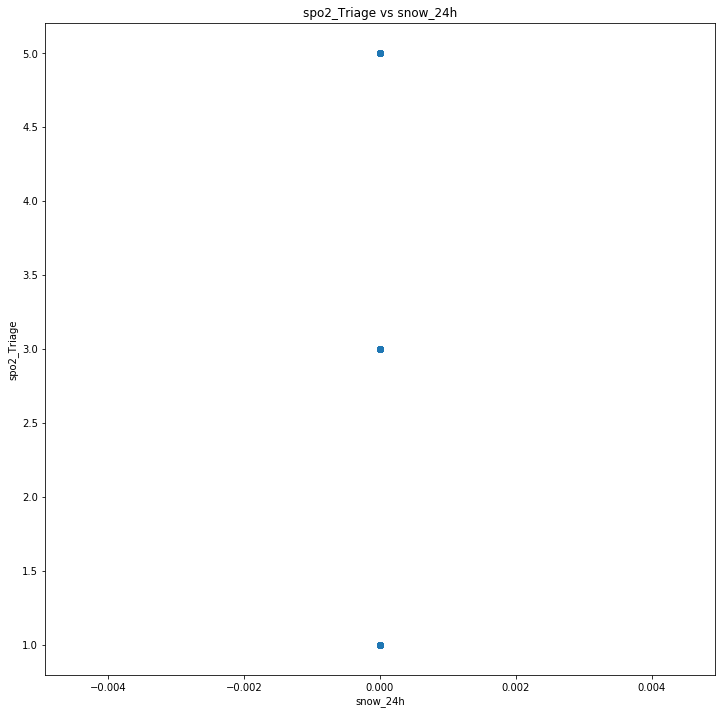

spo2_Triage snow_24h nan
STARTING  snow_today spo2_Triage


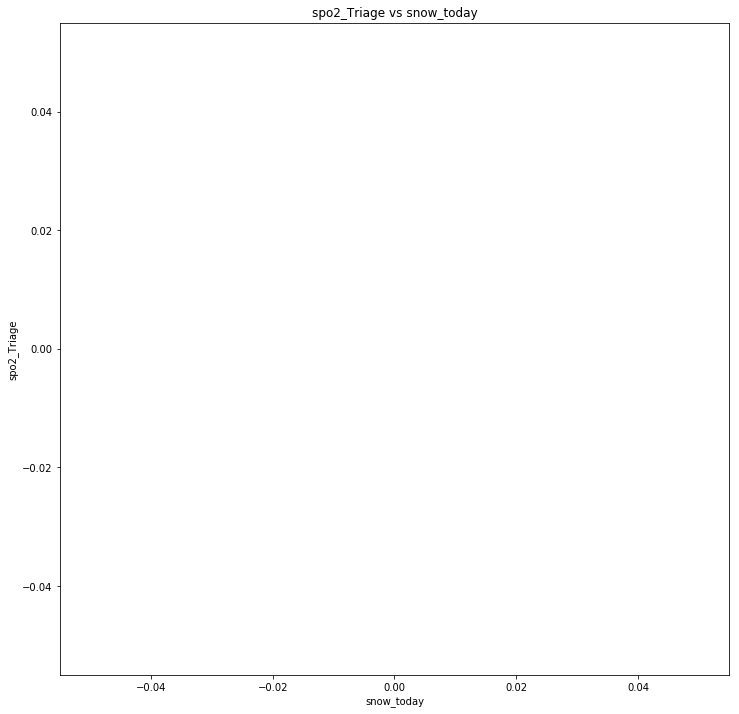

spo2_Triage snow_today nan
STARTING  clouds_all spo2_Triage


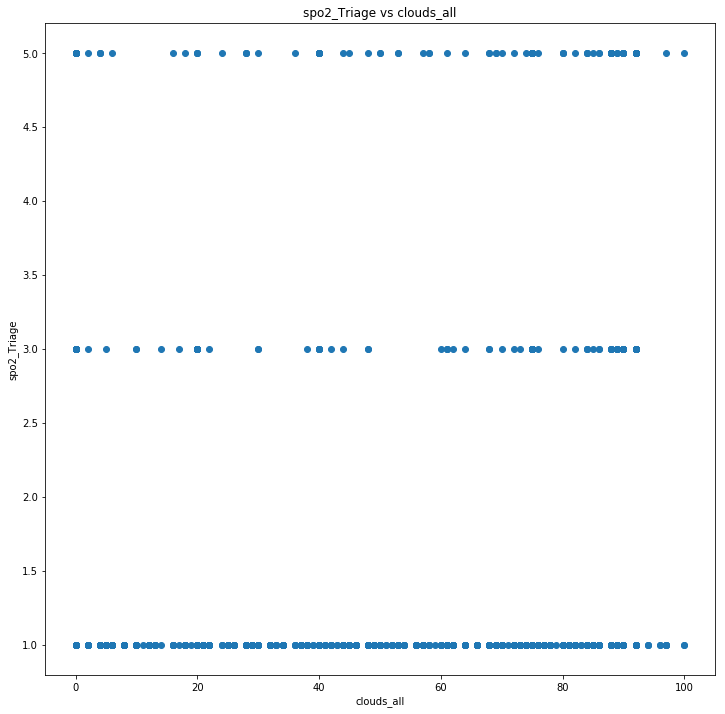

spo2_Triage clouds_all 0.011667493596681571
STARTING  temp manual_Triage


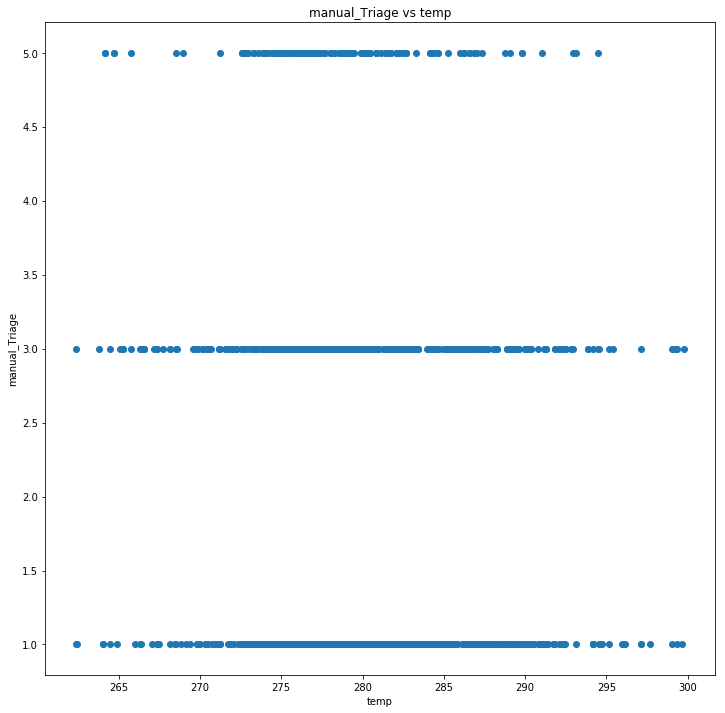

manual_Triage temp -0.12860922057557597
STARTING  pressure manual_Triage


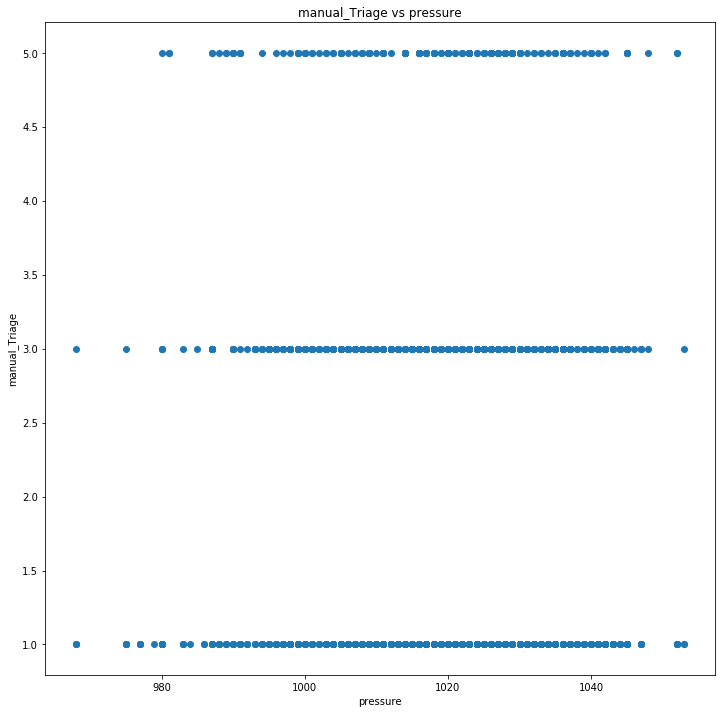

manual_Triage pressure -0.02903625833531968
STARTING  humidity manual_Triage


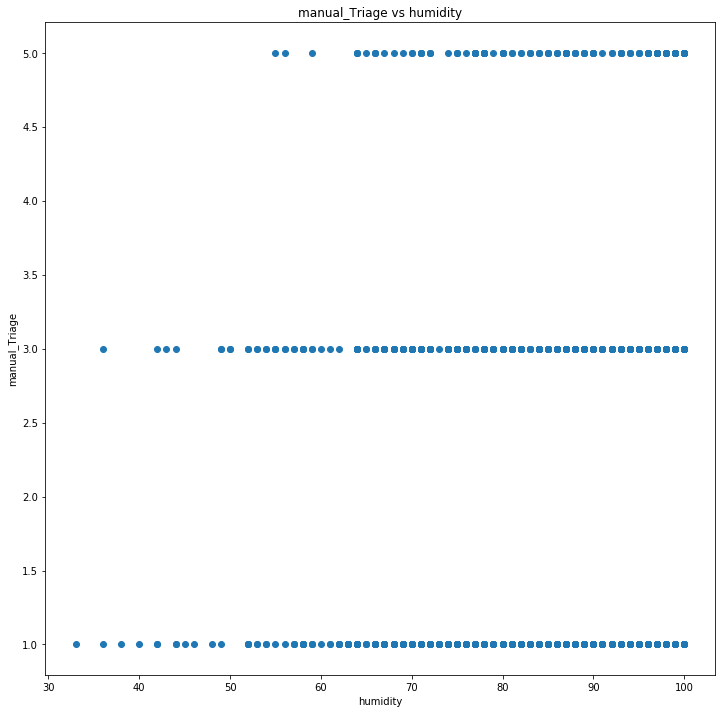

manual_Triage humidity 0.054559803563273265
STARTING  wind_speed manual_Triage


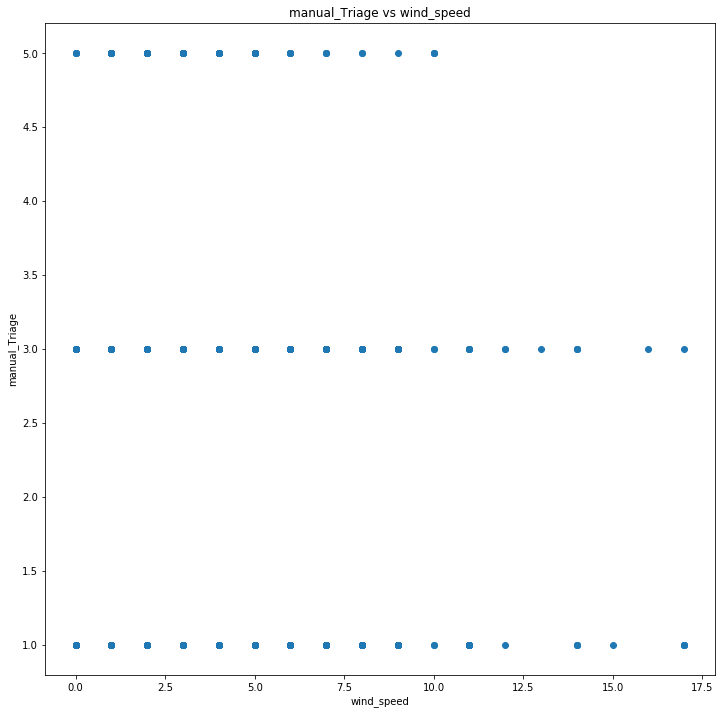

manual_Triage wind_speed -0.011649069466025647
STARTING  wind_deg manual_Triage


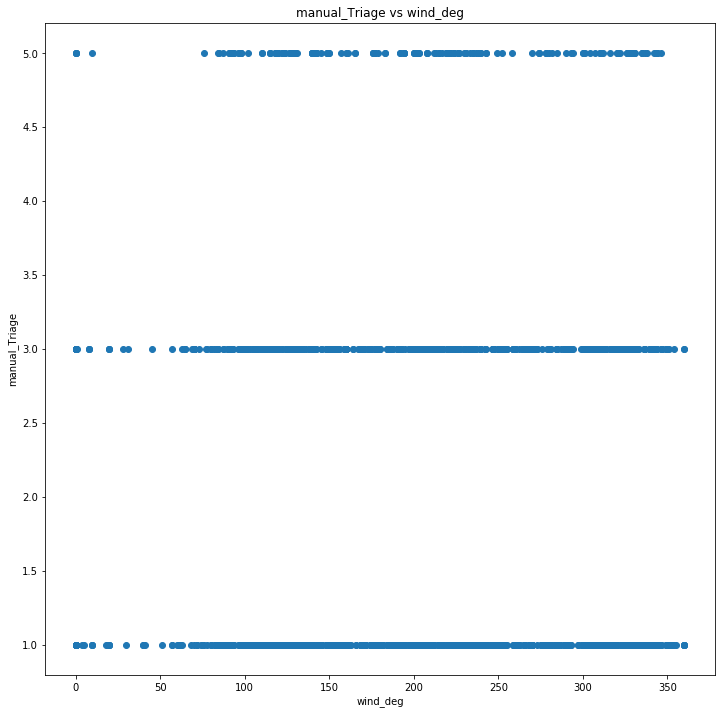

manual_Triage wind_deg 0.03358450526369076
STARTING  rain_1h manual_Triage


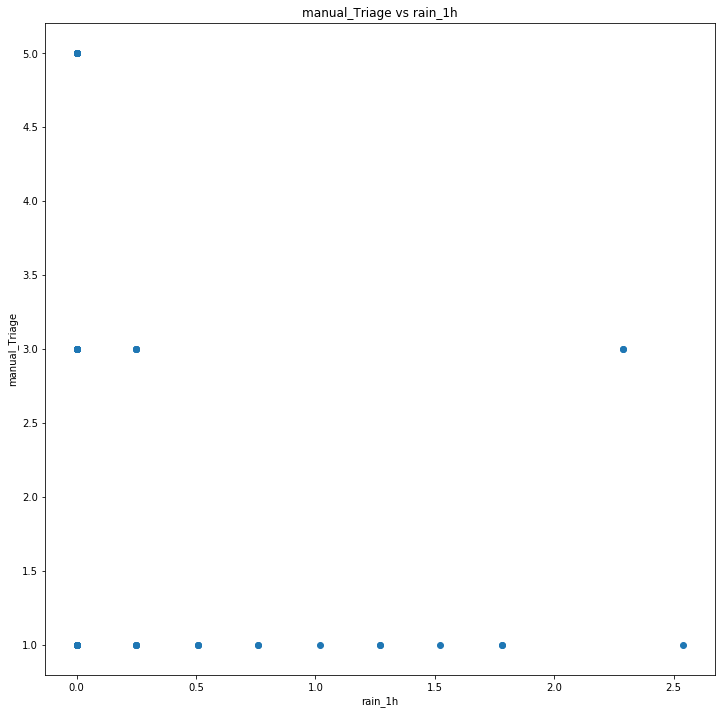

manual_Triage rain_1h -0.039986209820326725
STARTING  rain_3h manual_Triage


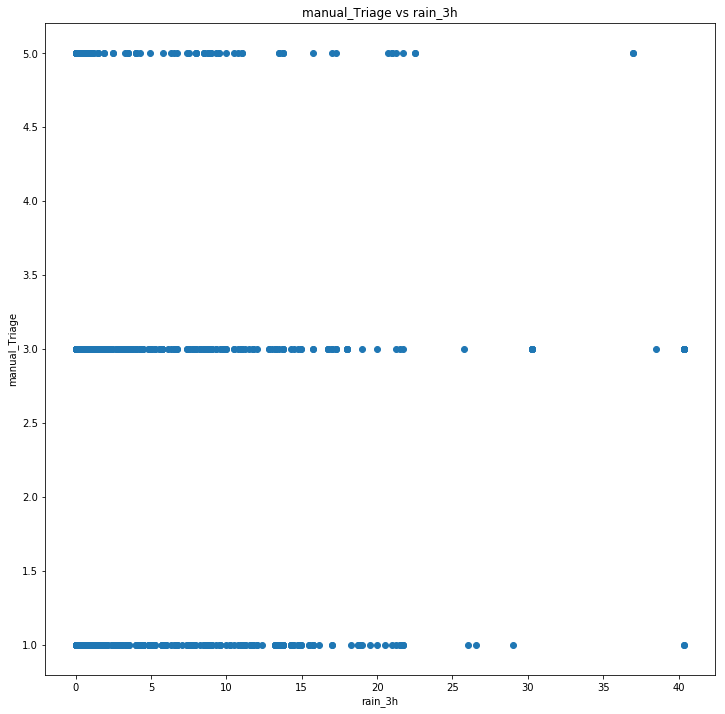

manual_Triage rain_3h 0.08439216949948337
STARTING  rain_24h manual_Triage


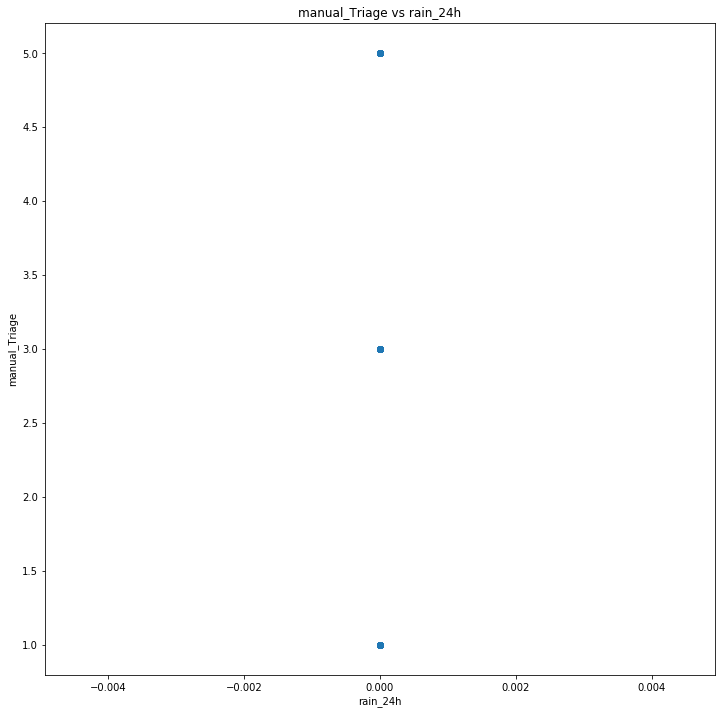

manual_Triage rain_24h nan
STARTING  rain_today manual_Triage


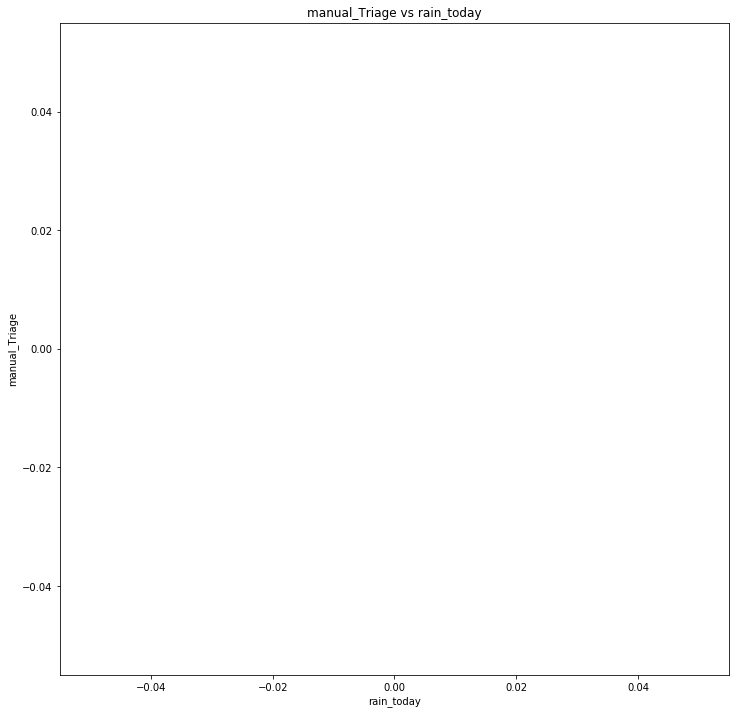

manual_Triage rain_today nan
STARTING  snow_1h manual_Triage


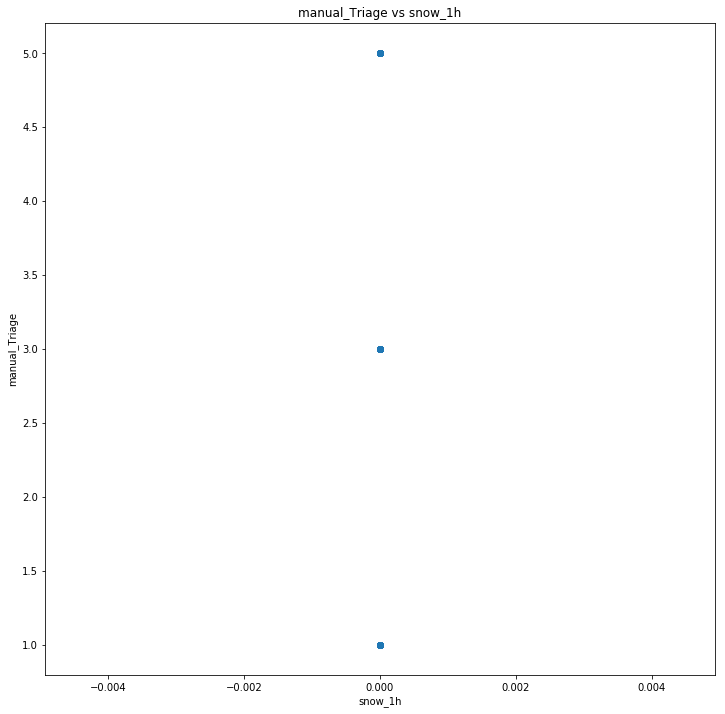

manual_Triage snow_1h nan
STARTING  snow_3h manual_Triage


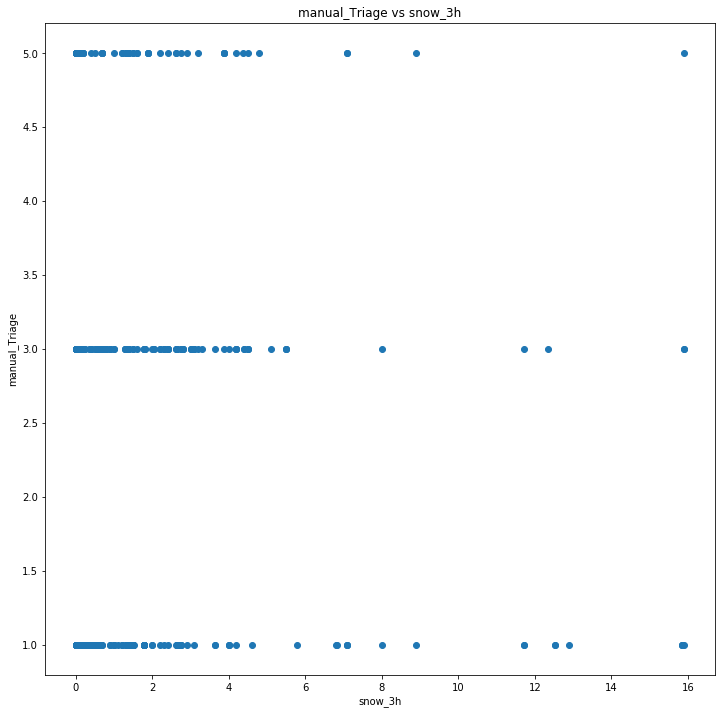

manual_Triage snow_3h 0.05697545181167475
STARTING  snow_24h manual_Triage


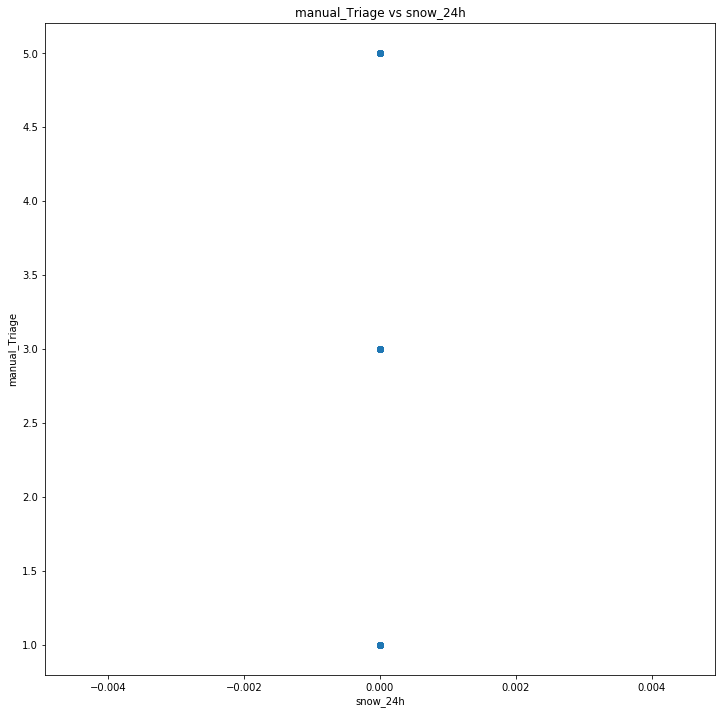

manual_Triage snow_24h nan
STARTING  snow_today manual_Triage


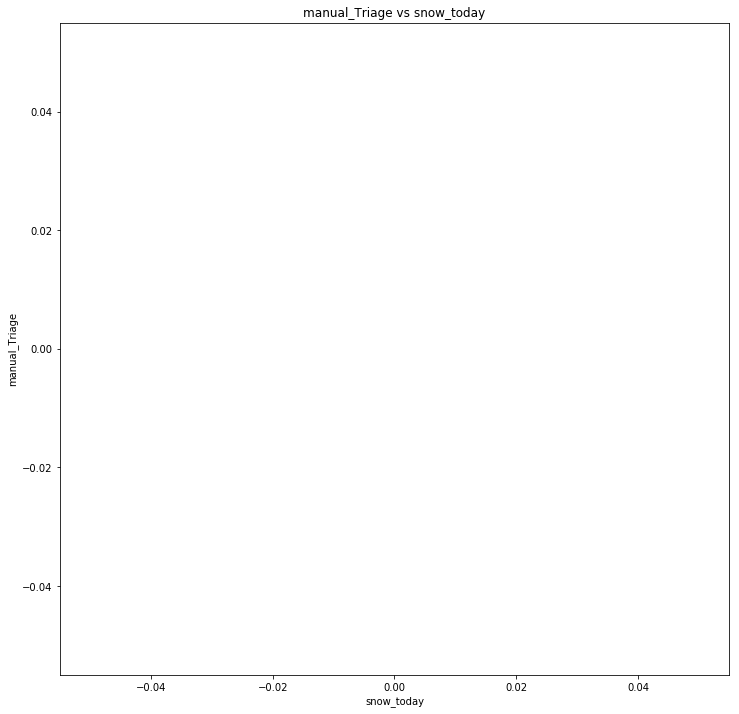

manual_Triage snow_today nan
STARTING  clouds_all manual_Triage


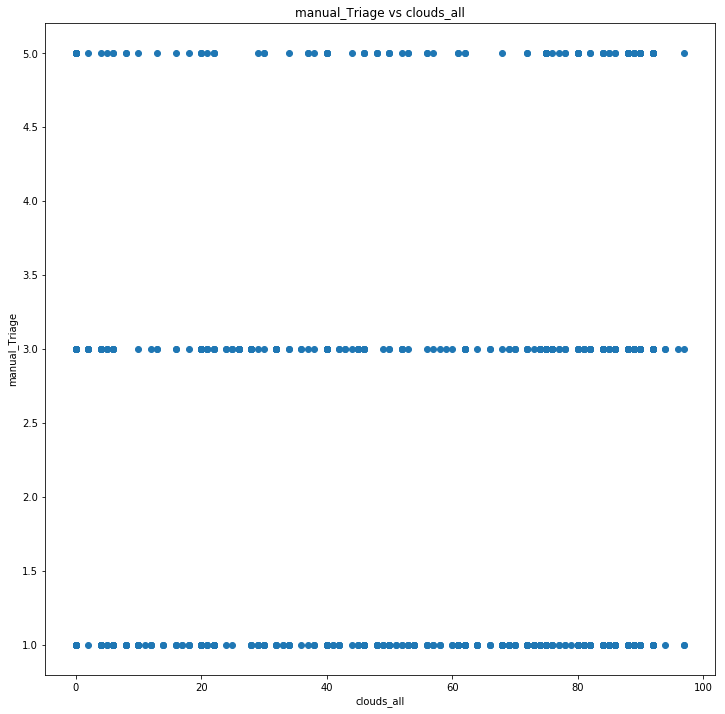

manual_Triage clouds_all 0.05420346441935197
STARTING  temp SpO2ReferenceValue


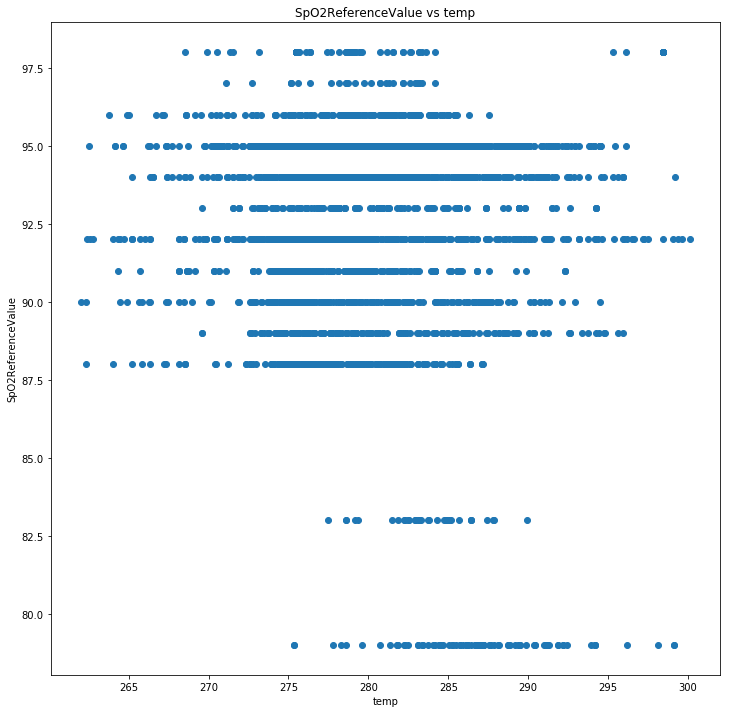

SpO2ReferenceValue temp -0.07959666666523103
STARTING  pressure SpO2ReferenceValue


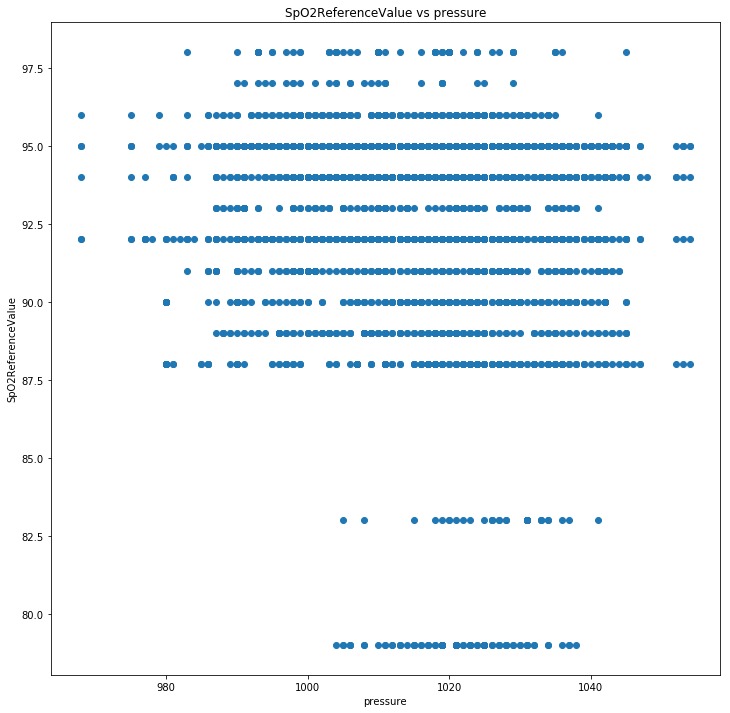

SpO2ReferenceValue pressure -0.09214581264046587
STARTING  humidity SpO2ReferenceValue


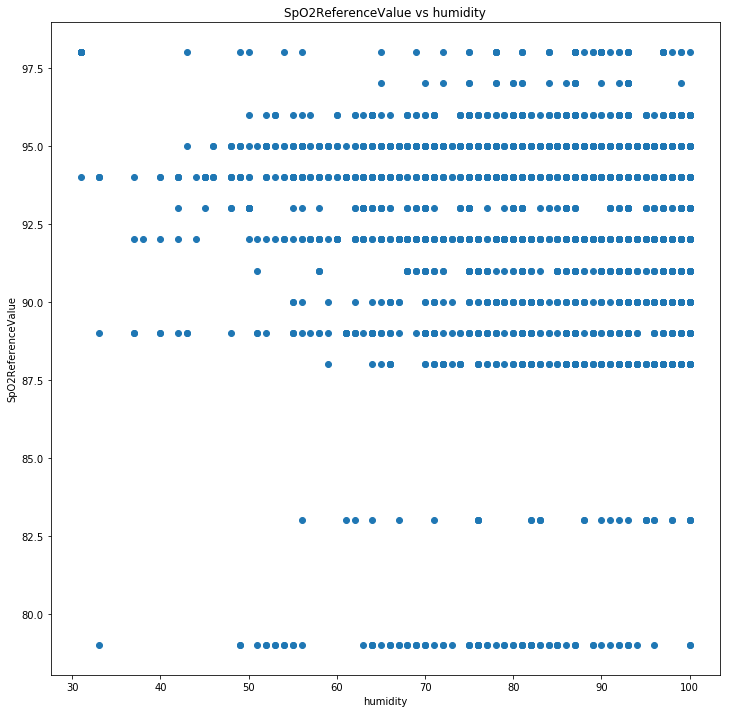

SpO2ReferenceValue humidity 0.017206256816583516
STARTING  wind_speed SpO2ReferenceValue


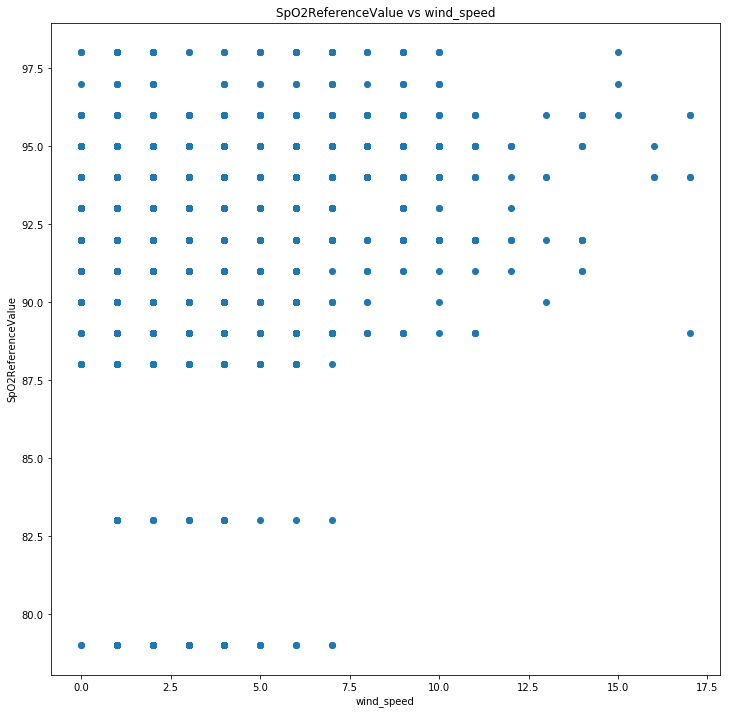

SpO2ReferenceValue wind_speed 0.11982650337393051
STARTING  wind_deg SpO2ReferenceValue


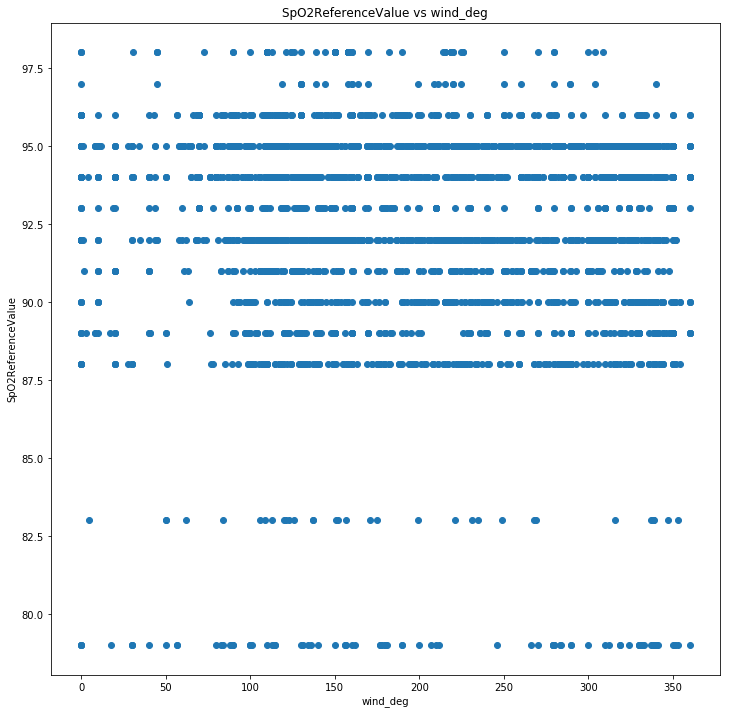

SpO2ReferenceValue wind_deg -0.05120082084858335
STARTING  rain_1h SpO2ReferenceValue


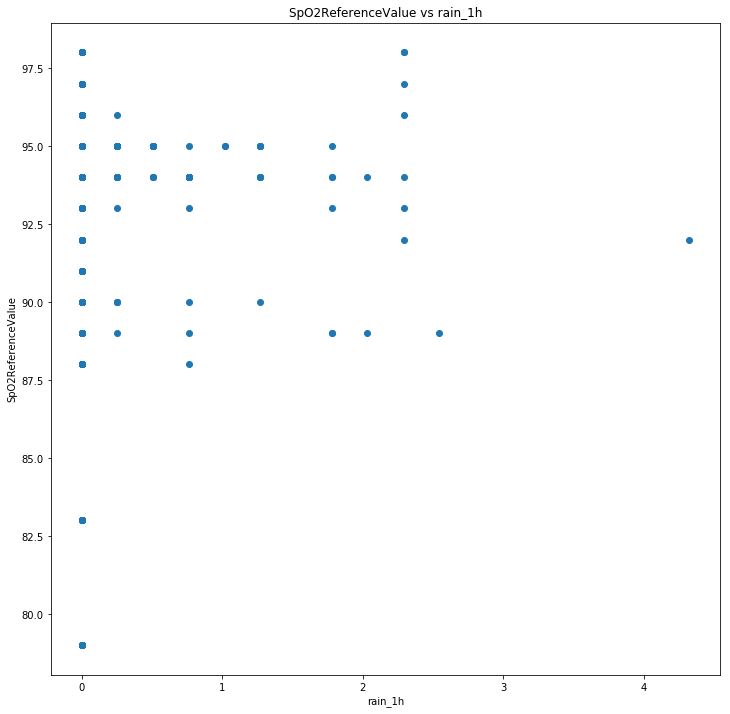

SpO2ReferenceValue rain_1h 0.03201247475800888
STARTING  rain_3h SpO2ReferenceValue


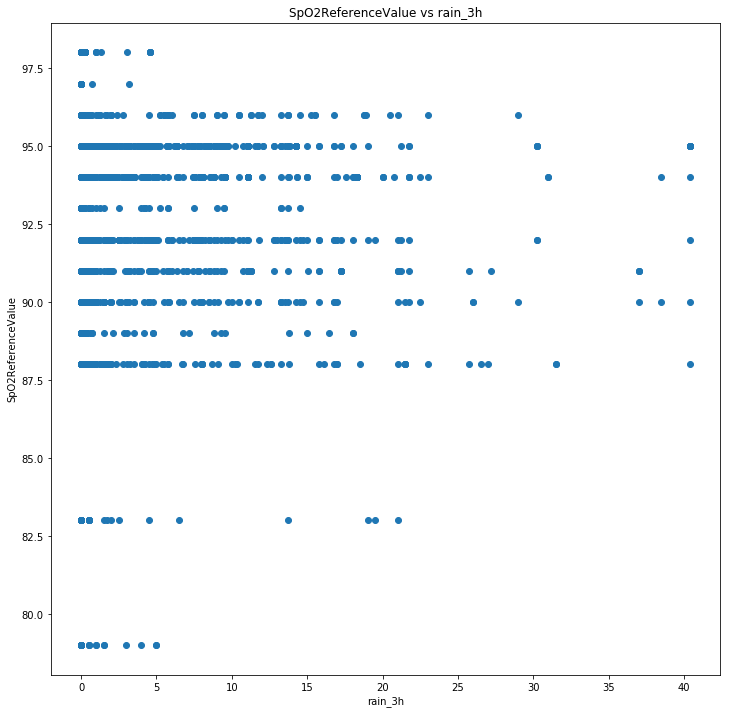

SpO2ReferenceValue rain_3h -0.00953097782296538
STARTING  rain_24h SpO2ReferenceValue


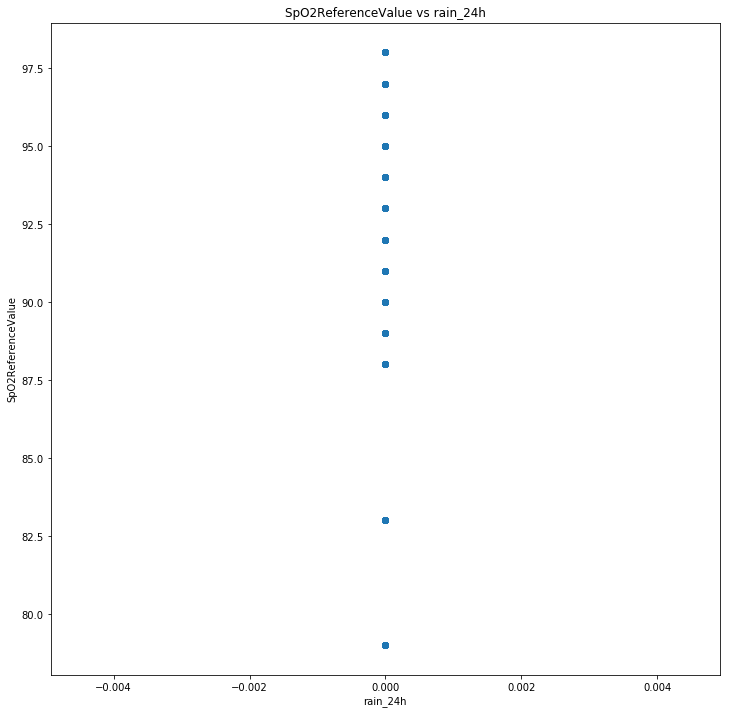

SpO2ReferenceValue rain_24h nan
STARTING  rain_today SpO2ReferenceValue


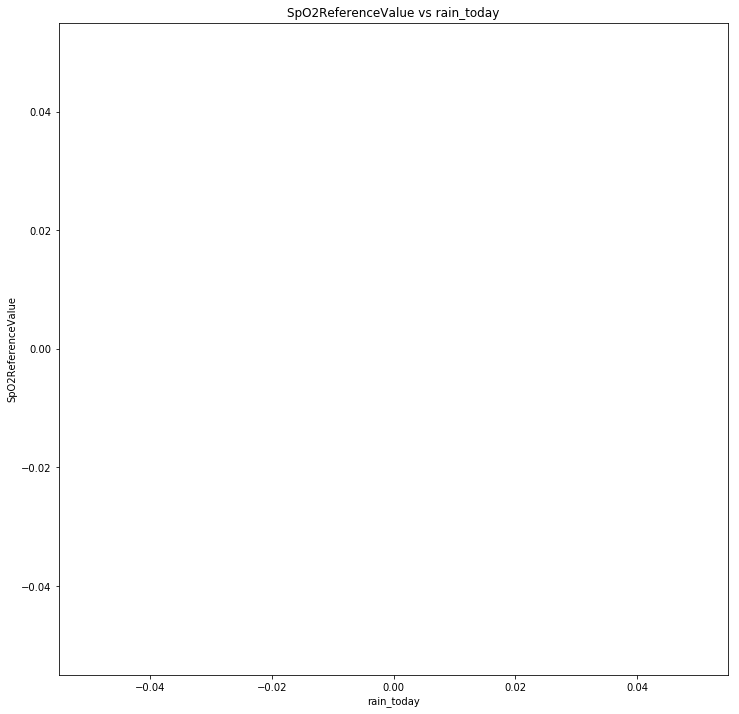

SpO2ReferenceValue rain_today nan
STARTING  snow_1h SpO2ReferenceValue


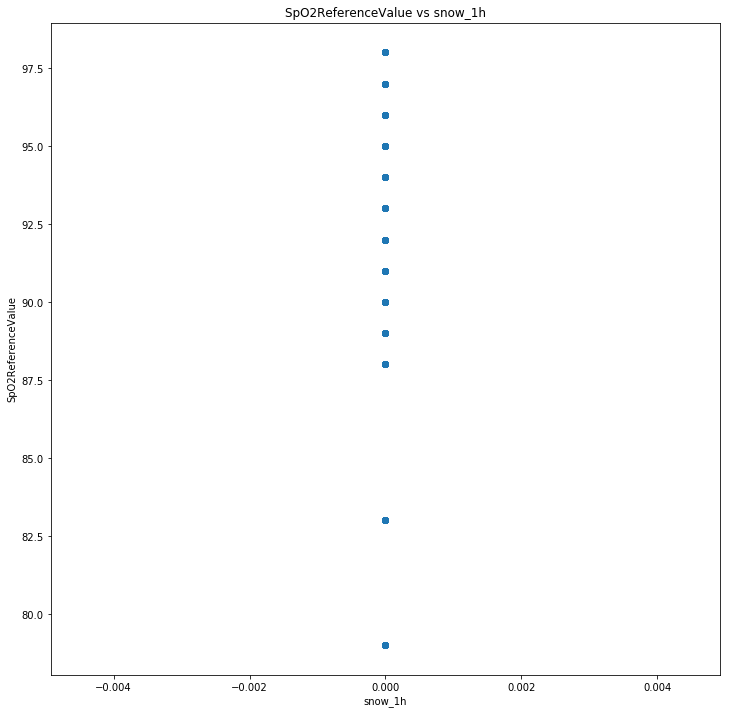

SpO2ReferenceValue snow_1h nan
STARTING  snow_3h SpO2ReferenceValue


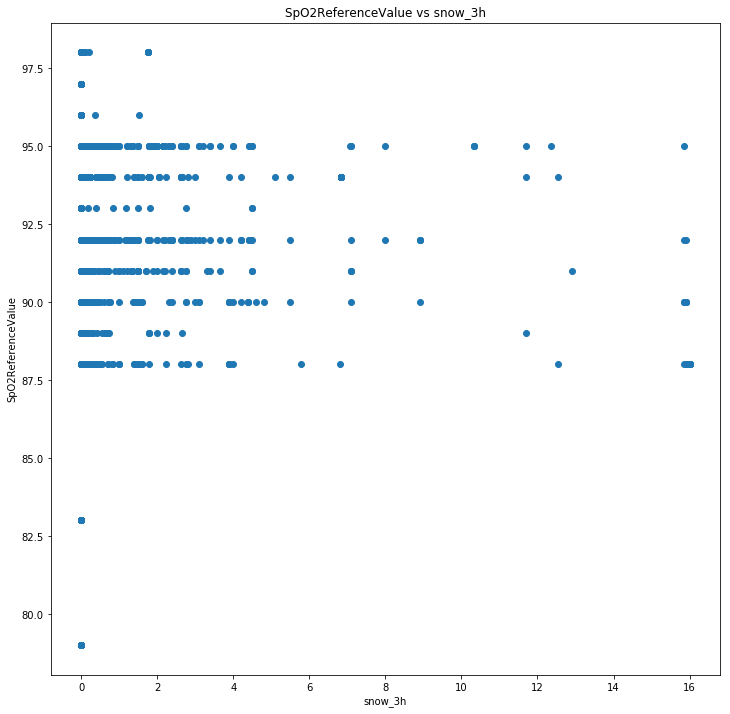

SpO2ReferenceValue snow_3h -0.0672051799651458
STARTING  snow_24h SpO2ReferenceValue


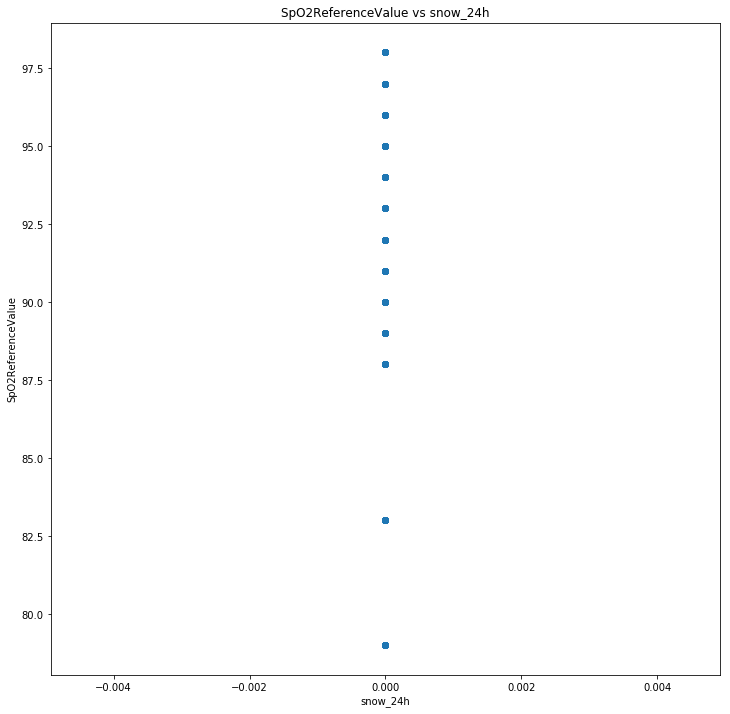

SpO2ReferenceValue snow_24h nan
STARTING  snow_today SpO2ReferenceValue


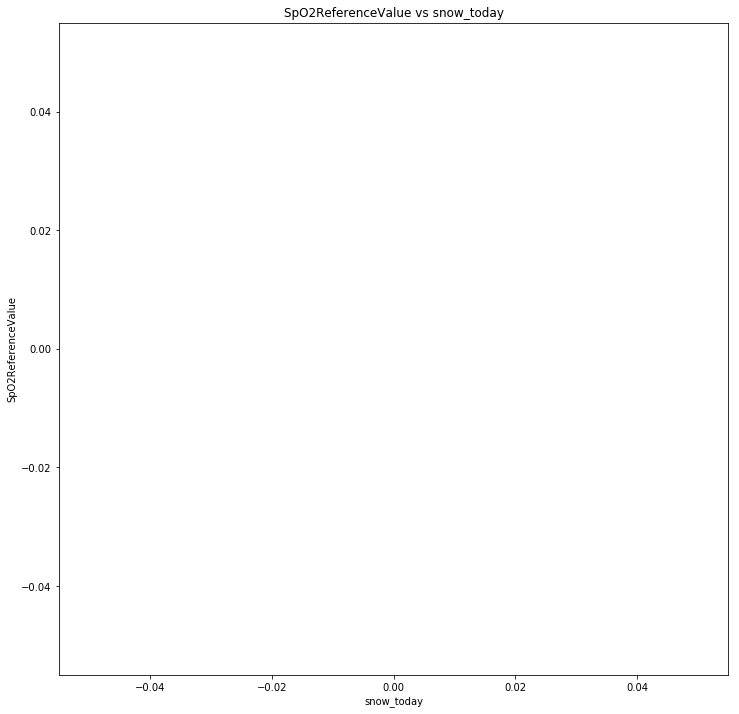

SpO2ReferenceValue snow_today nan
STARTING  clouds_all SpO2ReferenceValue


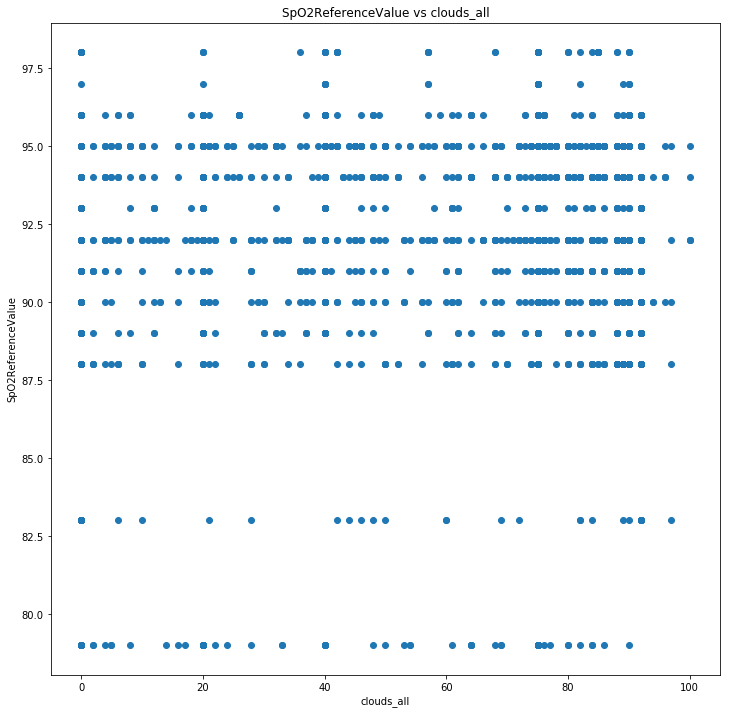

SpO2ReferenceValue clouds_all 0.04758200737495322
STARTING  temp PulseReferenceValue


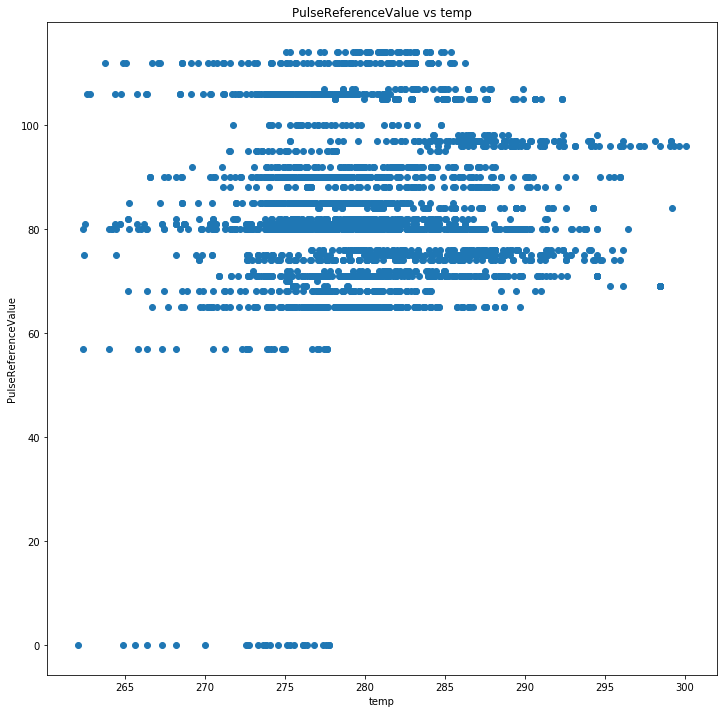

PulseReferenceValue temp 0.057441918172886866
STARTING  pressure PulseReferenceValue


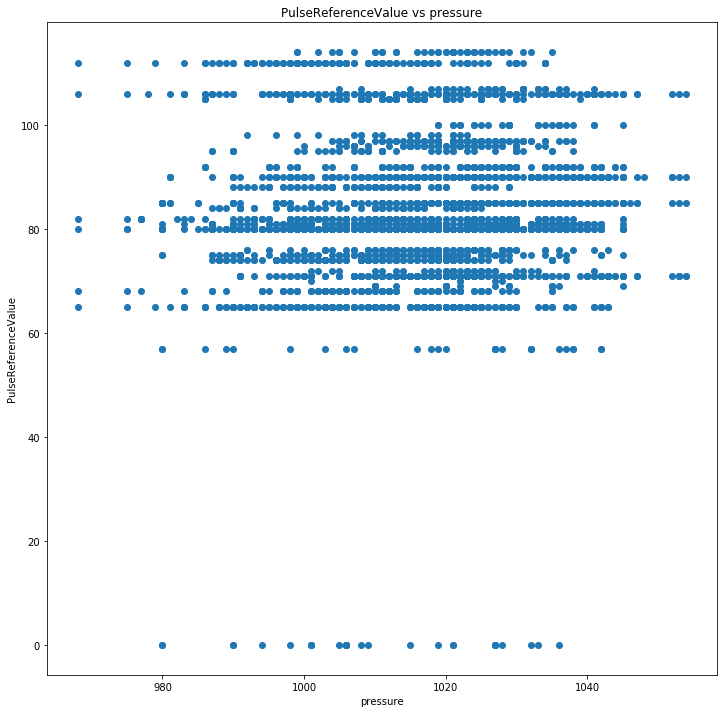

PulseReferenceValue pressure 0.06647723676422589
STARTING  humidity PulseReferenceValue


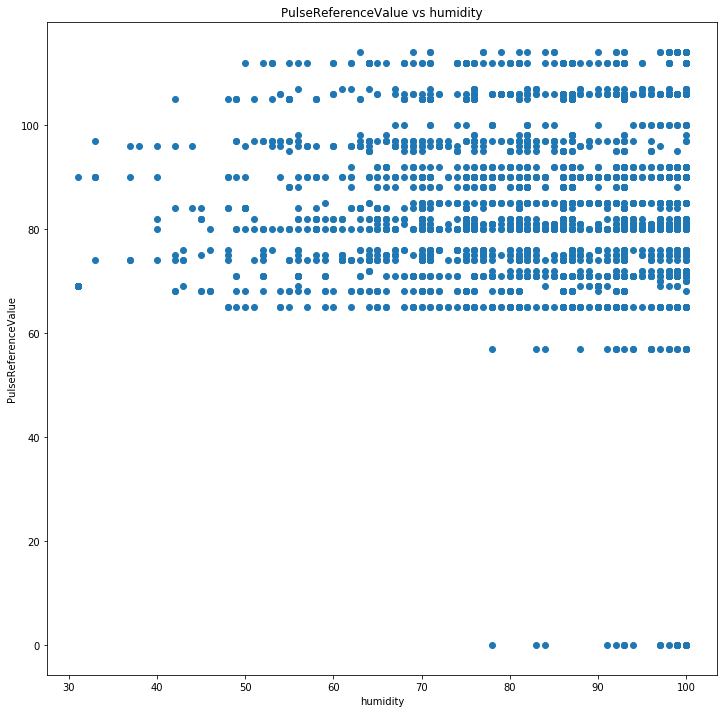

PulseReferenceValue humidity -0.05630415004940923
STARTING  wind_speed PulseReferenceValue


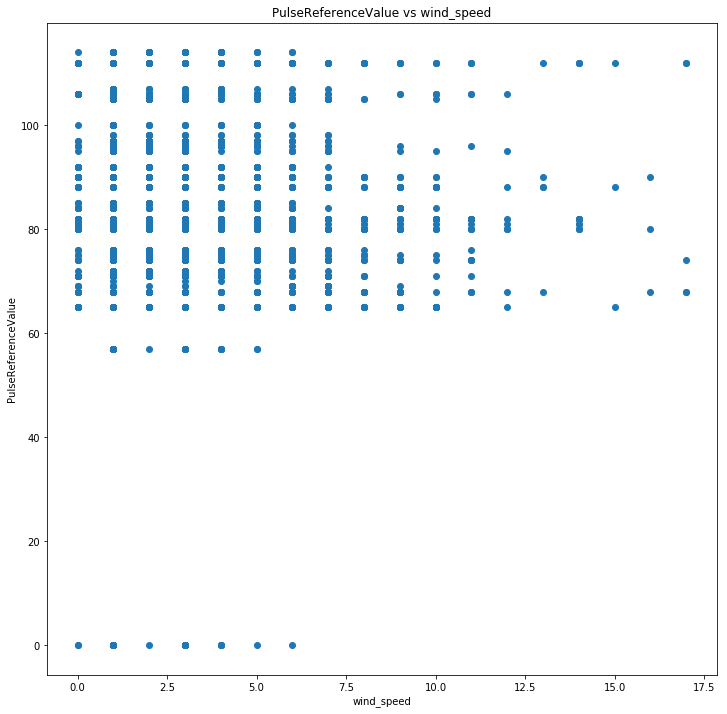

PulseReferenceValue wind_speed -8.244276507957545e-05
STARTING  wind_deg PulseReferenceValue


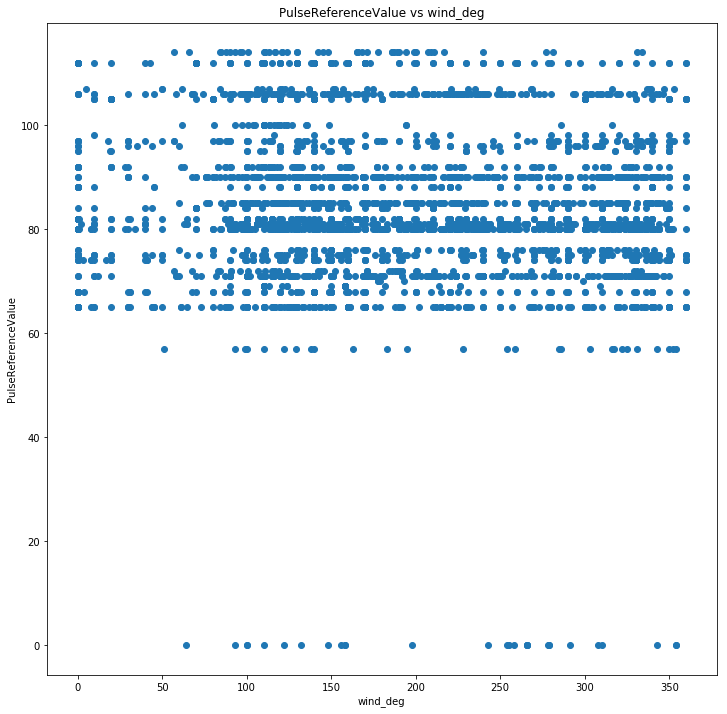

PulseReferenceValue wind_deg -0.07952223205990705
STARTING  rain_1h PulseReferenceValue


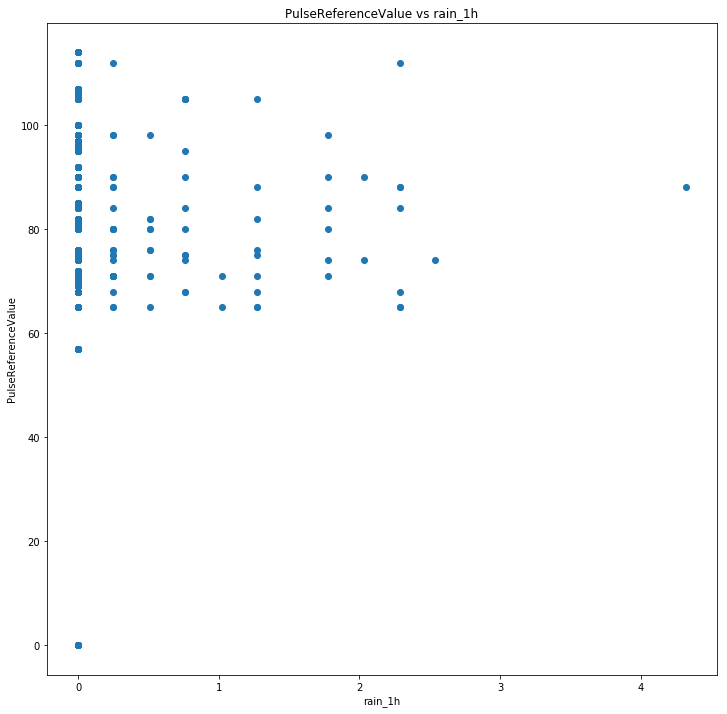

PulseReferenceValue rain_1h -0.017483991101403296
STARTING  rain_3h PulseReferenceValue


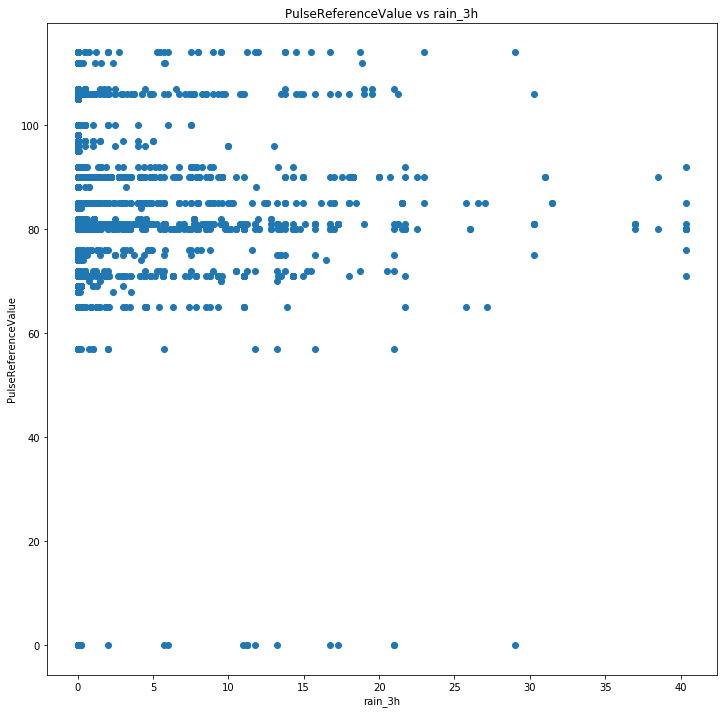

PulseReferenceValue rain_3h -0.030803254831568264
STARTING  rain_24h PulseReferenceValue


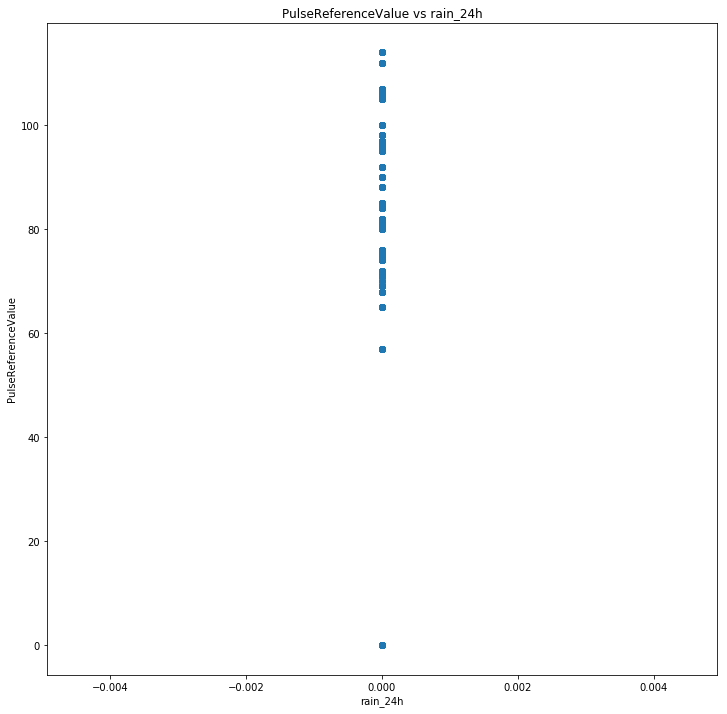

PulseReferenceValue rain_24h nan
STARTING  rain_today PulseReferenceValue


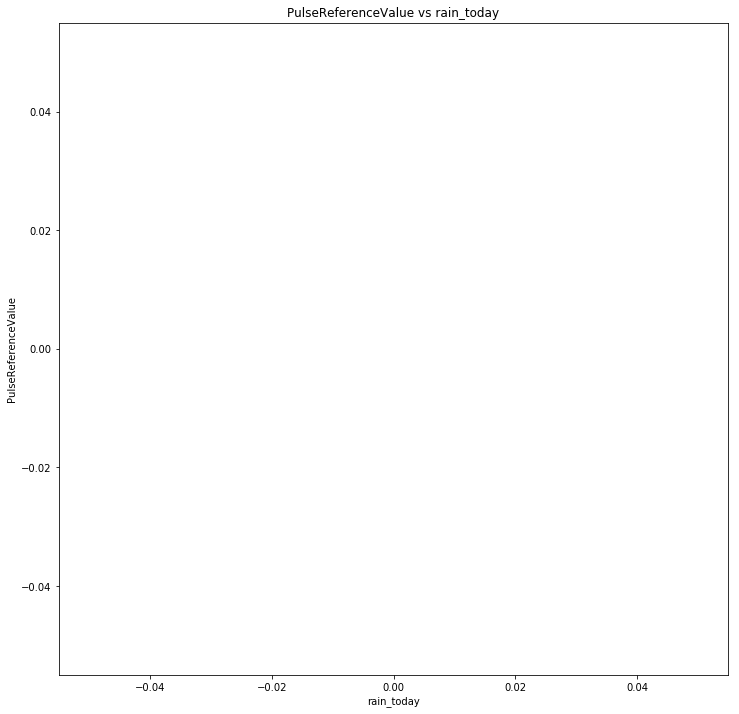

PulseReferenceValue rain_today nan
STARTING  snow_1h PulseReferenceValue


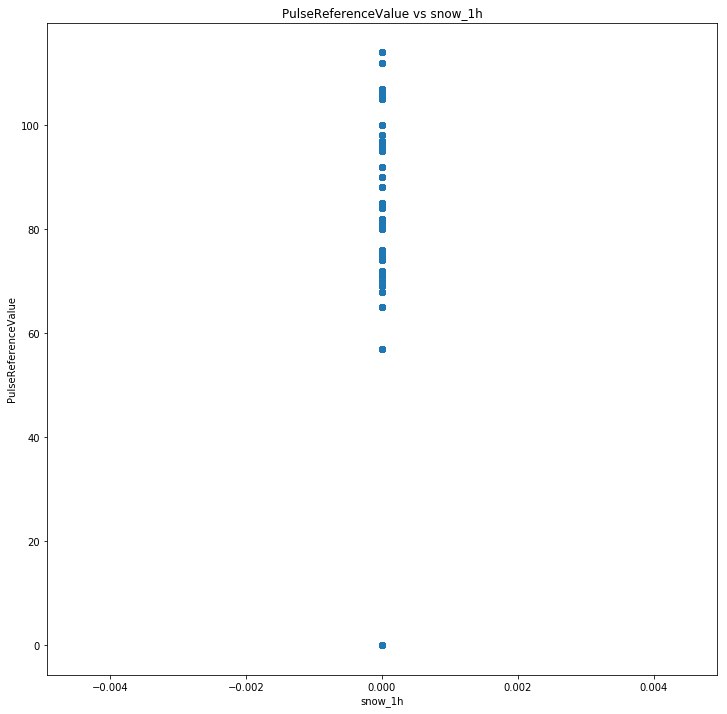

PulseReferenceValue snow_1h nan
STARTING  snow_3h PulseReferenceValue


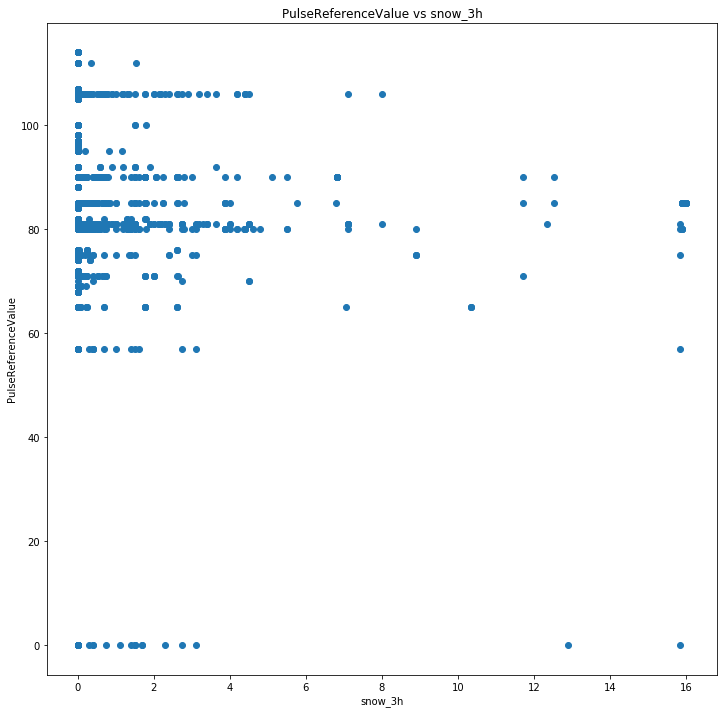

PulseReferenceValue snow_3h -0.048798702126795906
STARTING  snow_24h PulseReferenceValue


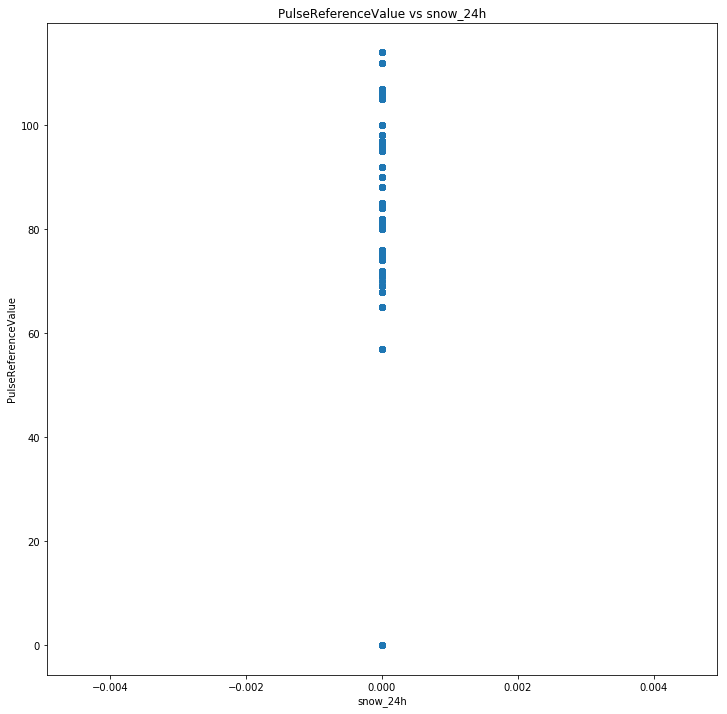

PulseReferenceValue snow_24h nan
STARTING  snow_today PulseReferenceValue


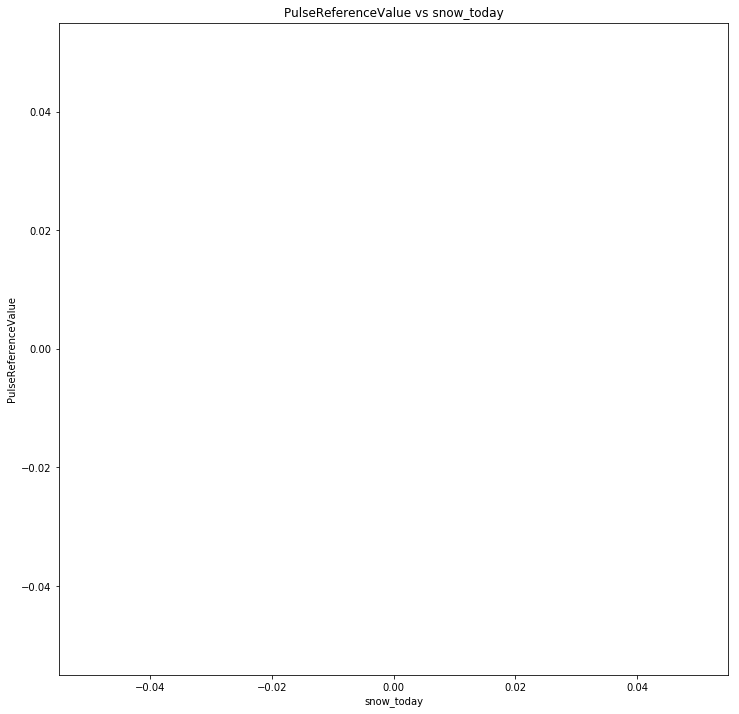

PulseReferenceValue snow_today nan
STARTING  clouds_all PulseReferenceValue


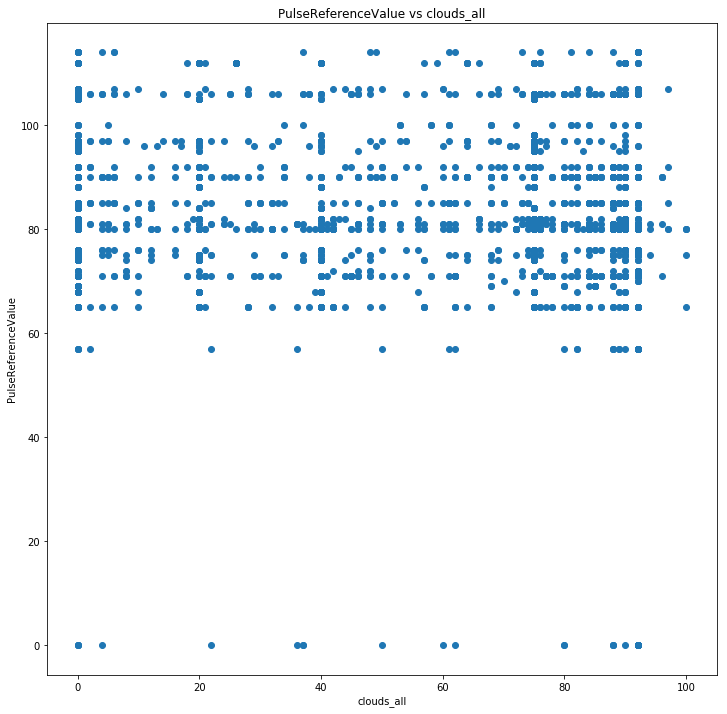

PulseReferenceValue clouds_all -0.00034125436848752113
STARTING  temp SpO2RedLimitVariation


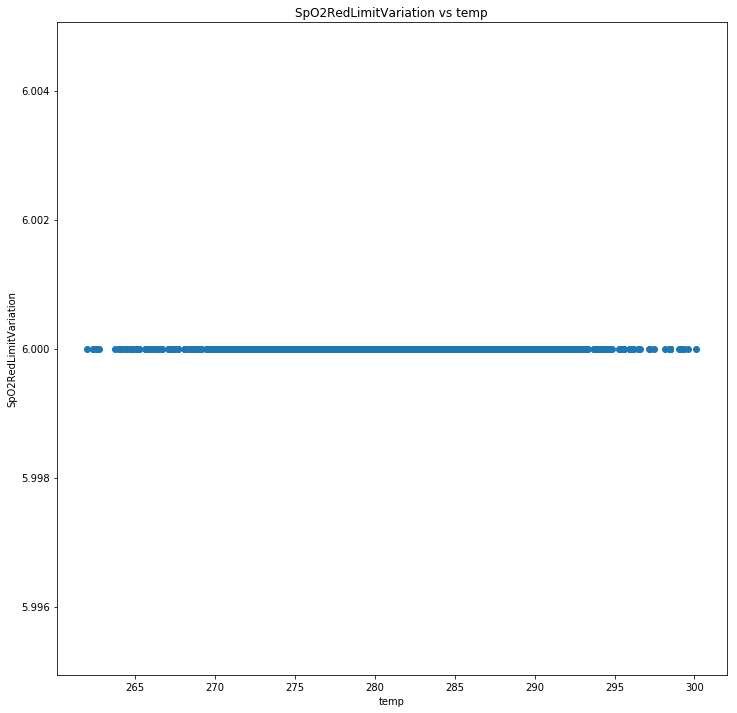

SpO2RedLimitVariation temp nan
STARTING  pressure SpO2RedLimitVariation


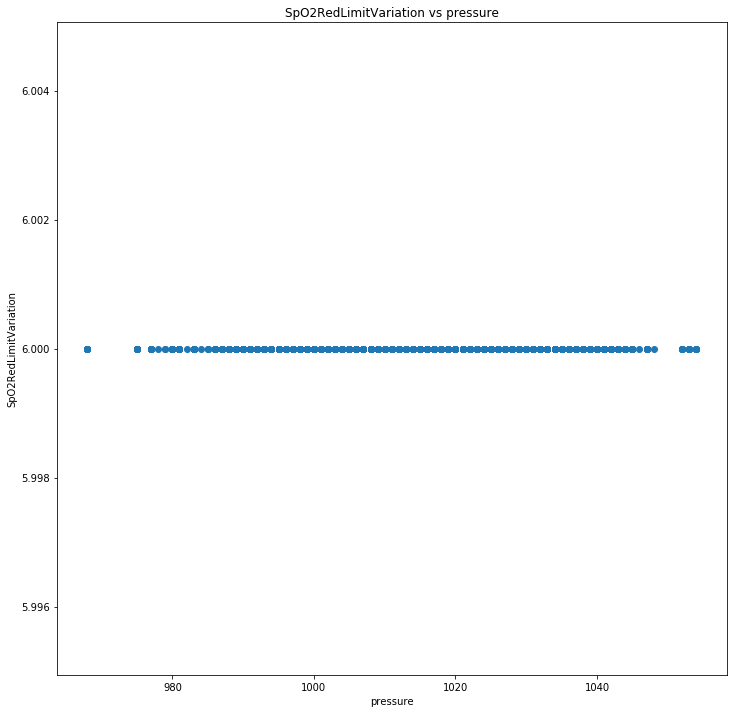

SpO2RedLimitVariation pressure nan
STARTING  humidity SpO2RedLimitVariation


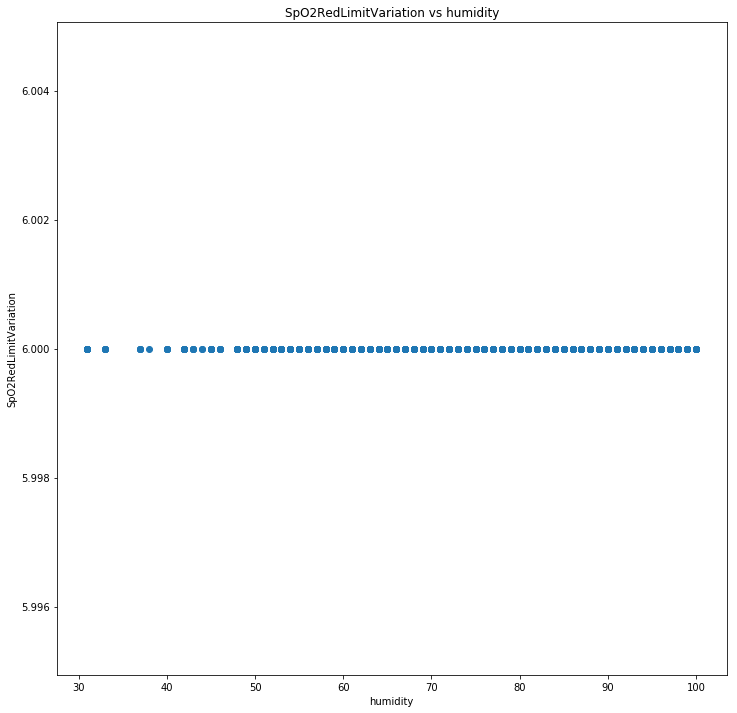

SpO2RedLimitVariation humidity nan
STARTING  wind_speed SpO2RedLimitVariation


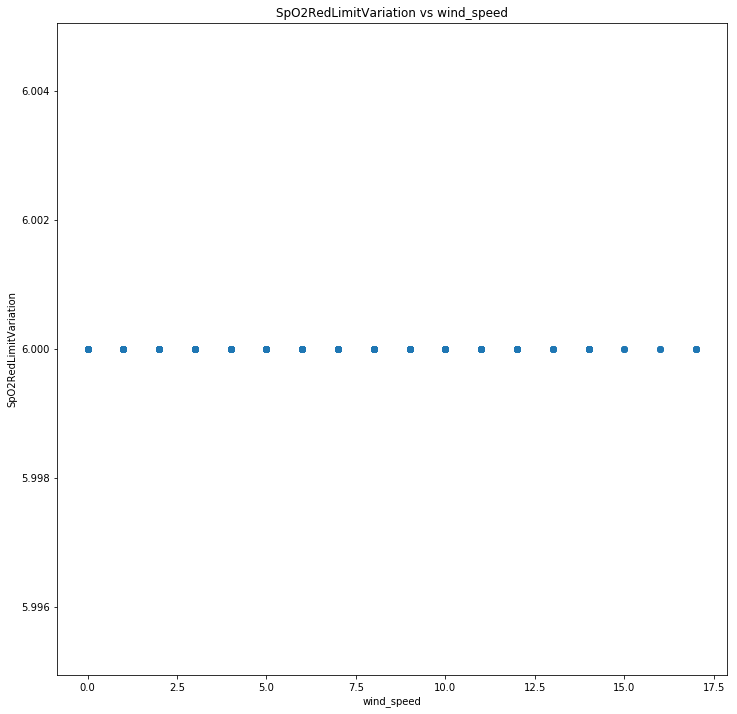

SpO2RedLimitVariation wind_speed nan
STARTING  wind_deg SpO2RedLimitVariation


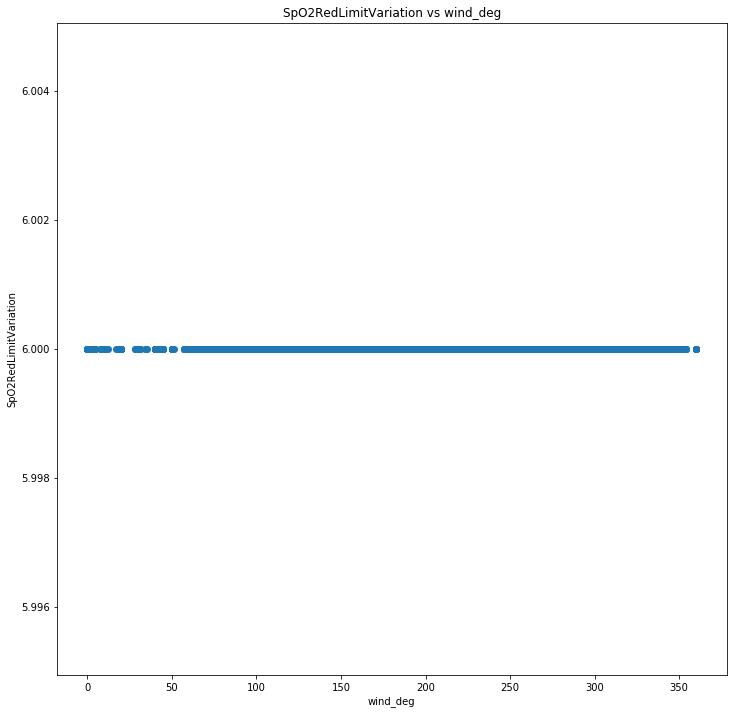

SpO2RedLimitVariation wind_deg nan
STARTING  rain_1h SpO2RedLimitVariation


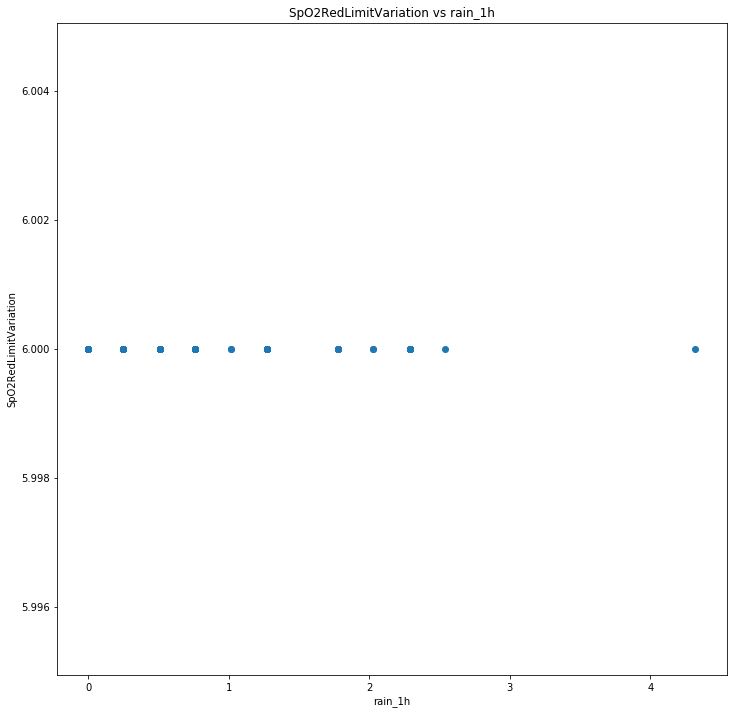

SpO2RedLimitVariation rain_1h nan
STARTING  rain_3h SpO2RedLimitVariation


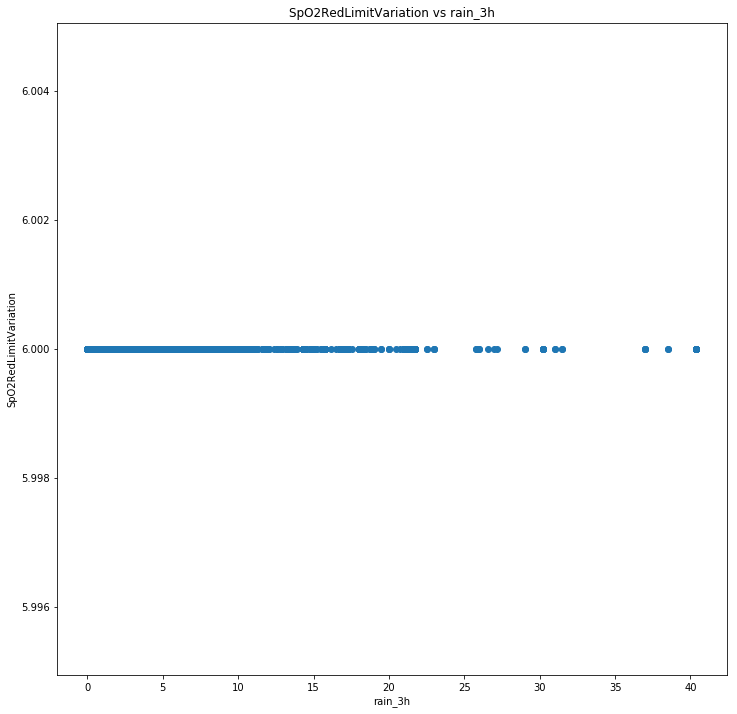

SpO2RedLimitVariation rain_3h nan
STARTING  rain_24h SpO2RedLimitVariation


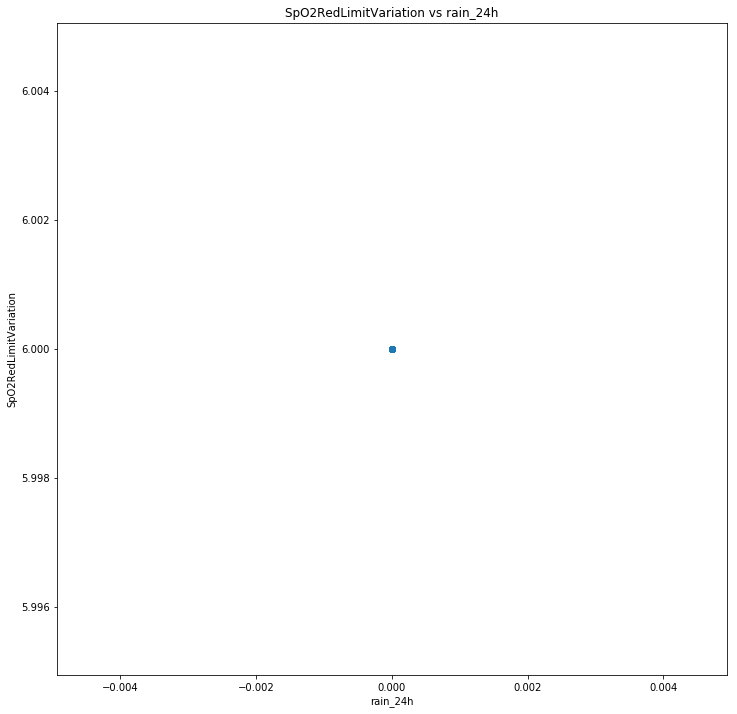

SpO2RedLimitVariation rain_24h nan
STARTING  rain_today SpO2RedLimitVariation


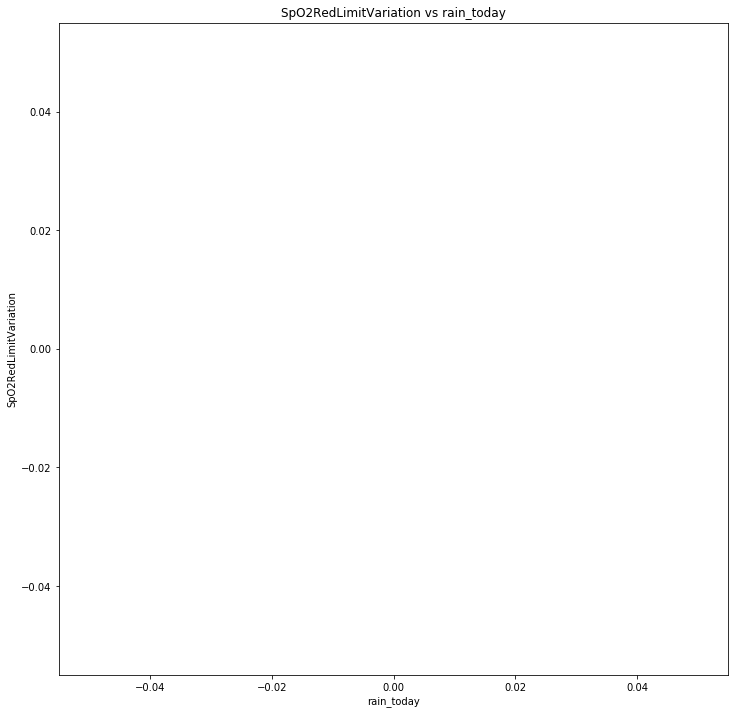

SpO2RedLimitVariation rain_today nan
STARTING  snow_1h SpO2RedLimitVariation


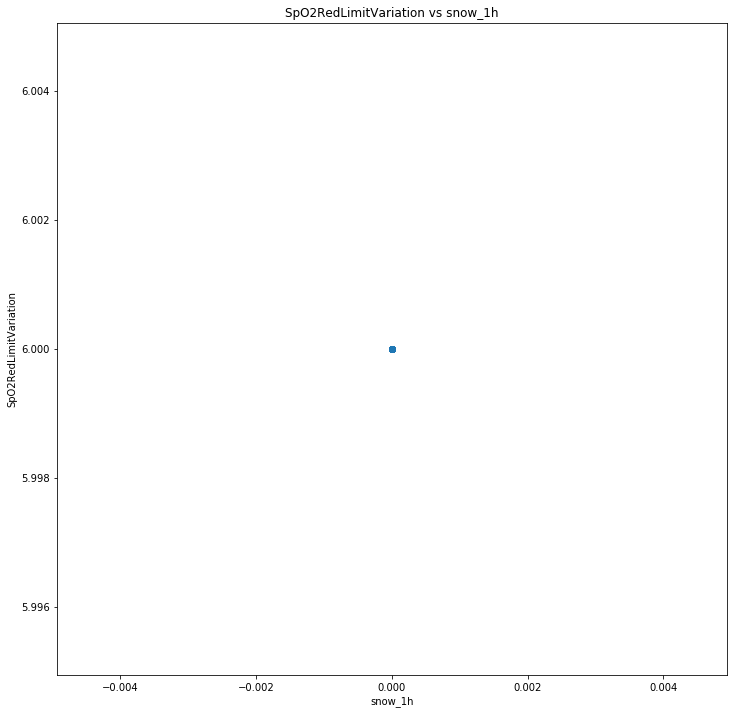

SpO2RedLimitVariation snow_1h nan
STARTING  snow_3h SpO2RedLimitVariation


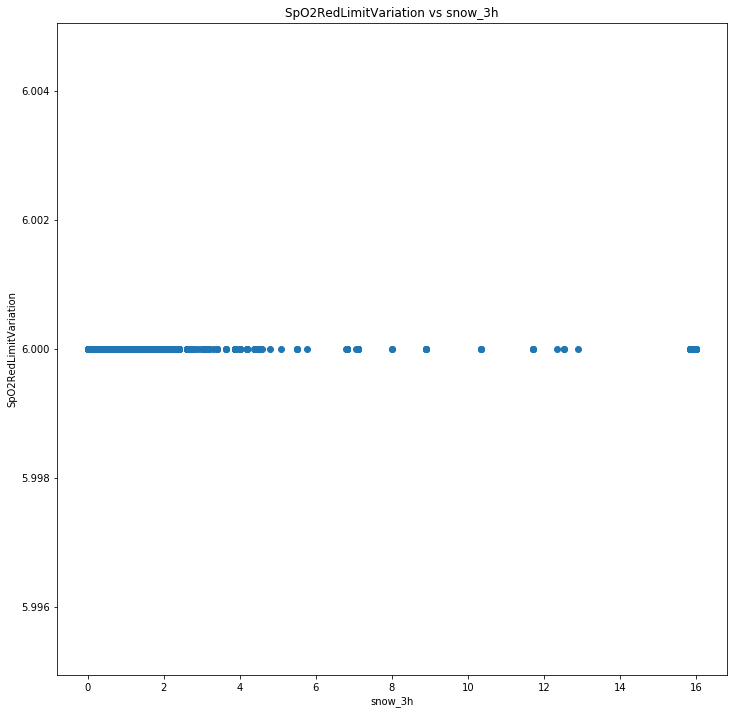

SpO2RedLimitVariation snow_3h nan
STARTING  snow_24h SpO2RedLimitVariation


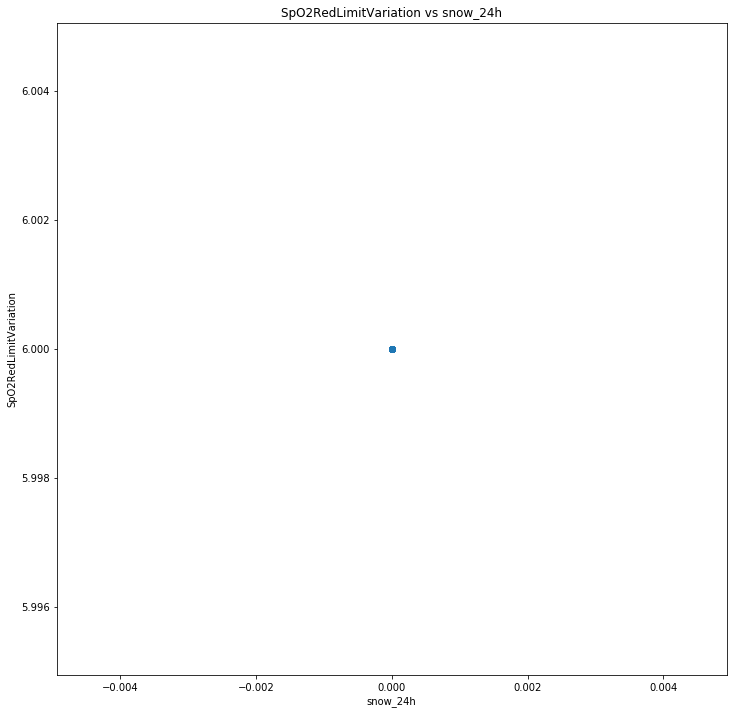

SpO2RedLimitVariation snow_24h nan
STARTING  snow_today SpO2RedLimitVariation


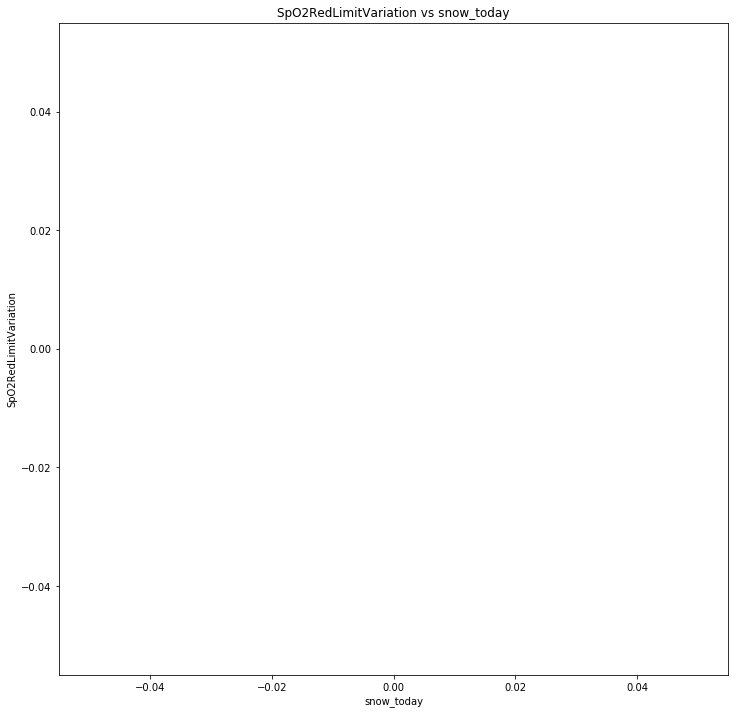

SpO2RedLimitVariation snow_today nan
STARTING  clouds_all SpO2RedLimitVariation


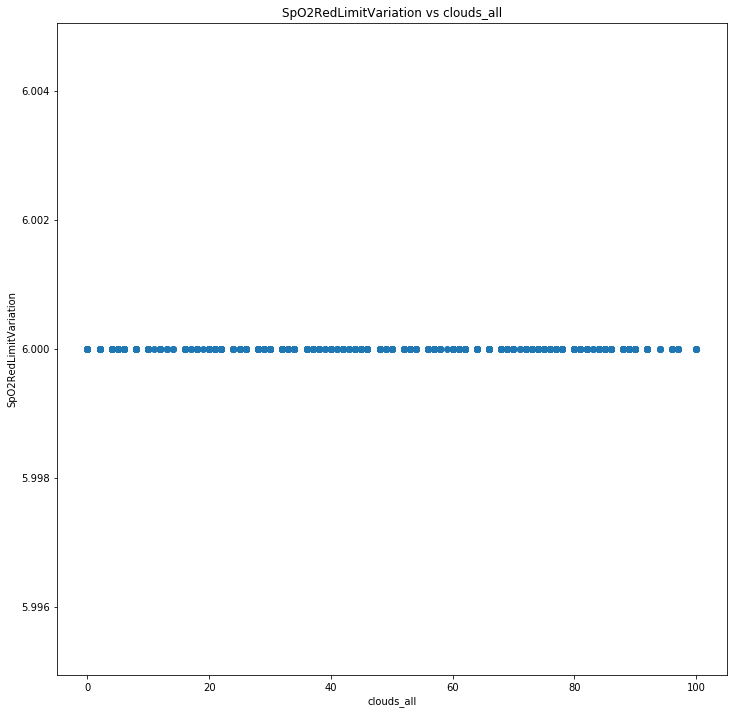

SpO2RedLimitVariation clouds_all nan
STARTING  temp SpO2YellowLimitVariation


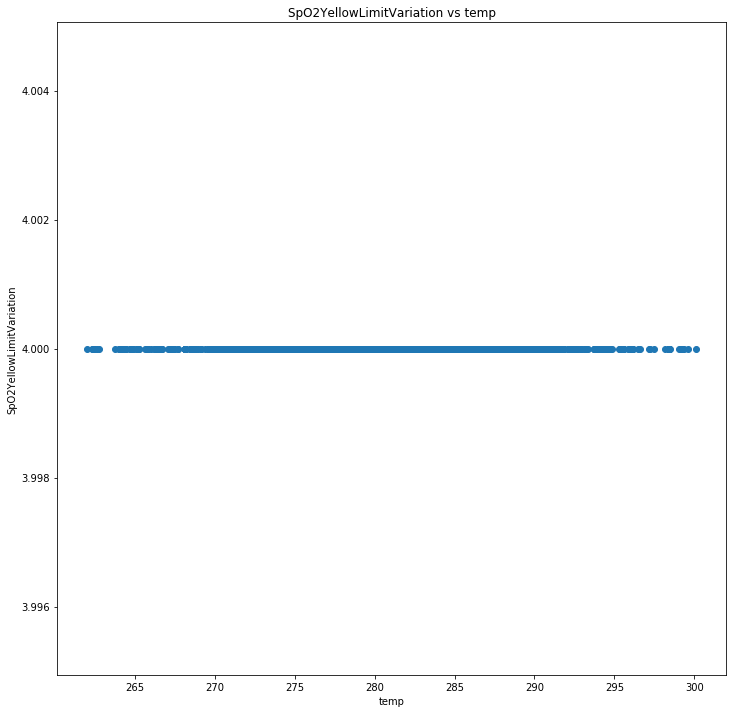

SpO2YellowLimitVariation temp nan
STARTING  pressure SpO2YellowLimitVariation


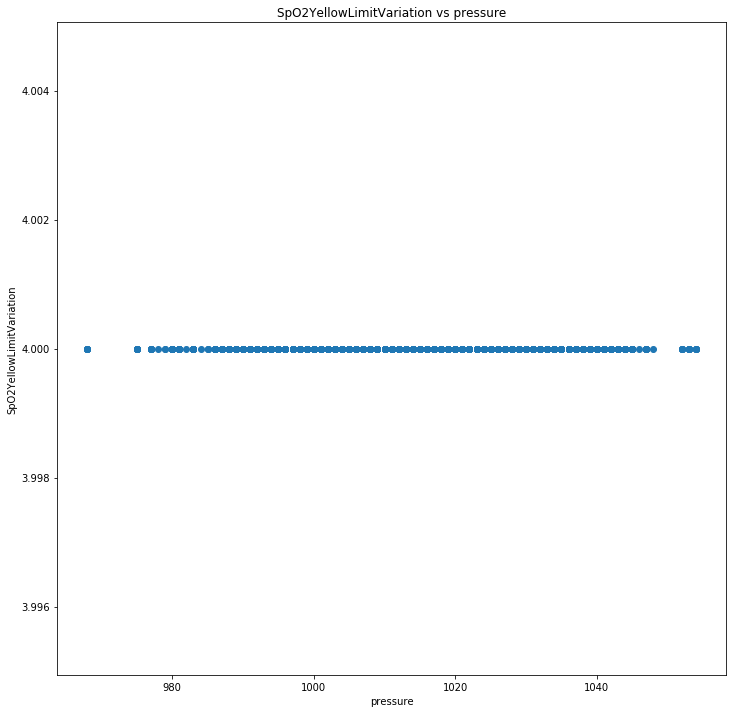

SpO2YellowLimitVariation pressure nan
STARTING  humidity SpO2YellowLimitVariation


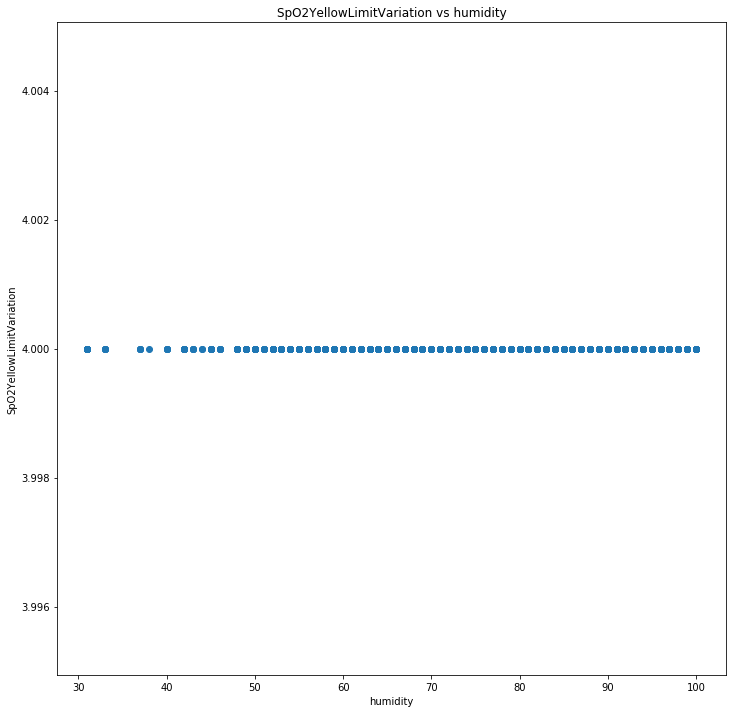

SpO2YellowLimitVariation humidity nan
STARTING  wind_speed SpO2YellowLimitVariation


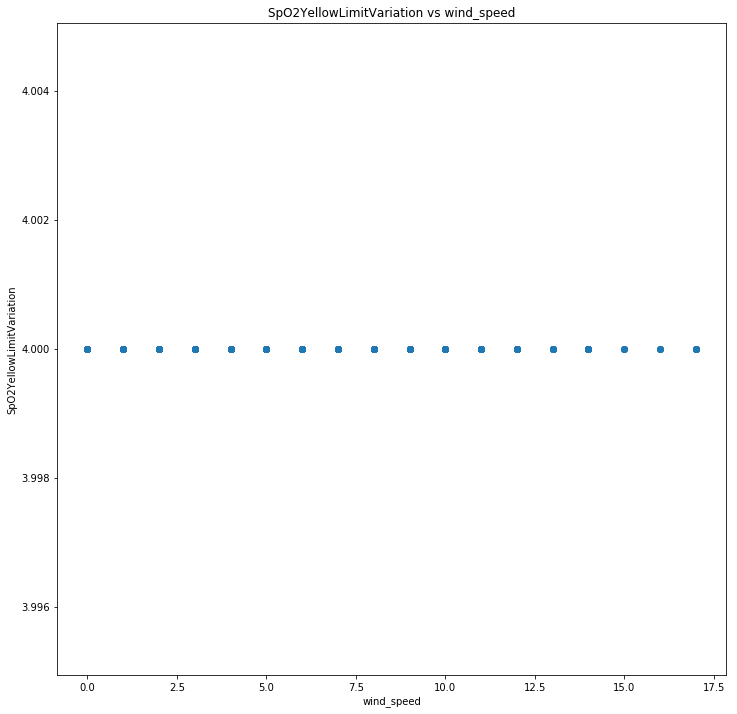

SpO2YellowLimitVariation wind_speed nan
STARTING  wind_deg SpO2YellowLimitVariation


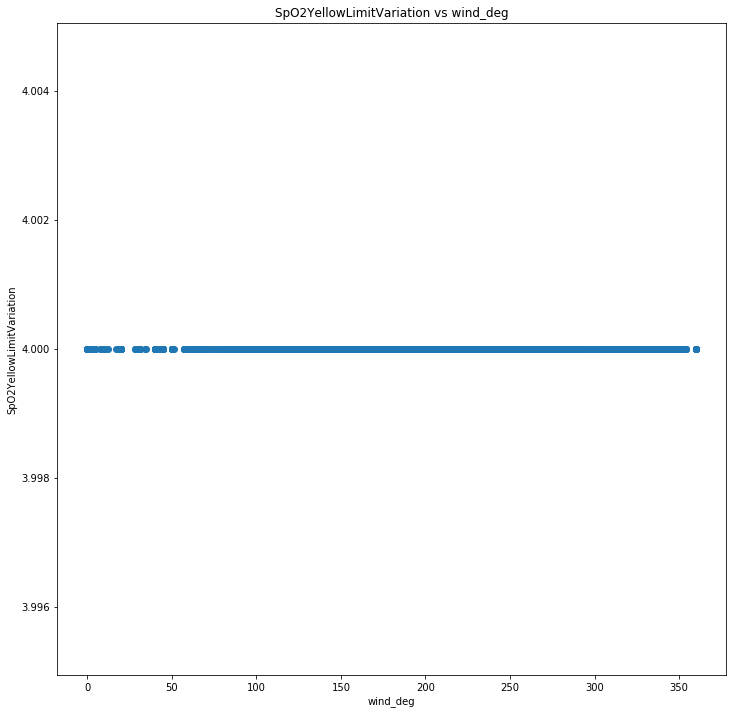

SpO2YellowLimitVariation wind_deg nan
STARTING  rain_1h SpO2YellowLimitVariation


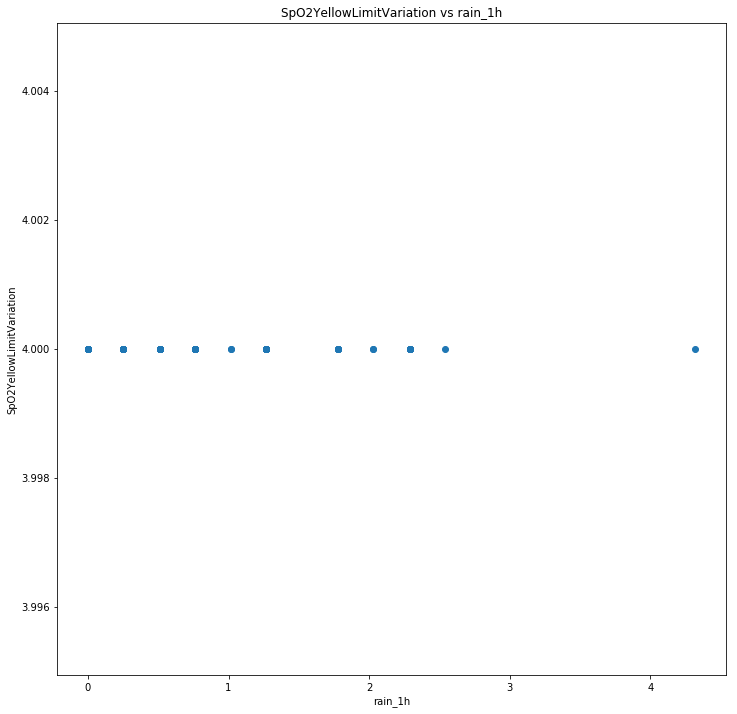

SpO2YellowLimitVariation rain_1h nan
STARTING  rain_3h SpO2YellowLimitVariation


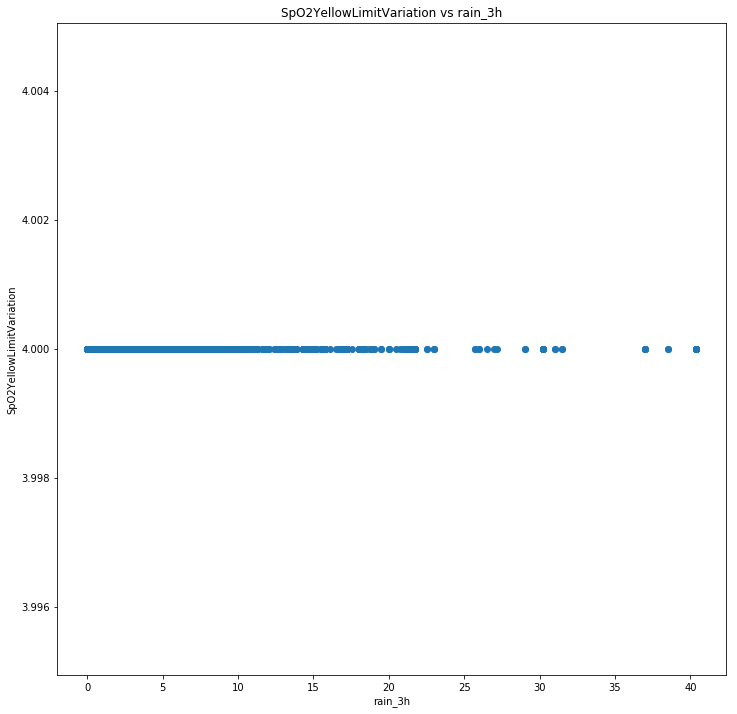

SpO2YellowLimitVariation rain_3h nan
STARTING  rain_24h SpO2YellowLimitVariation


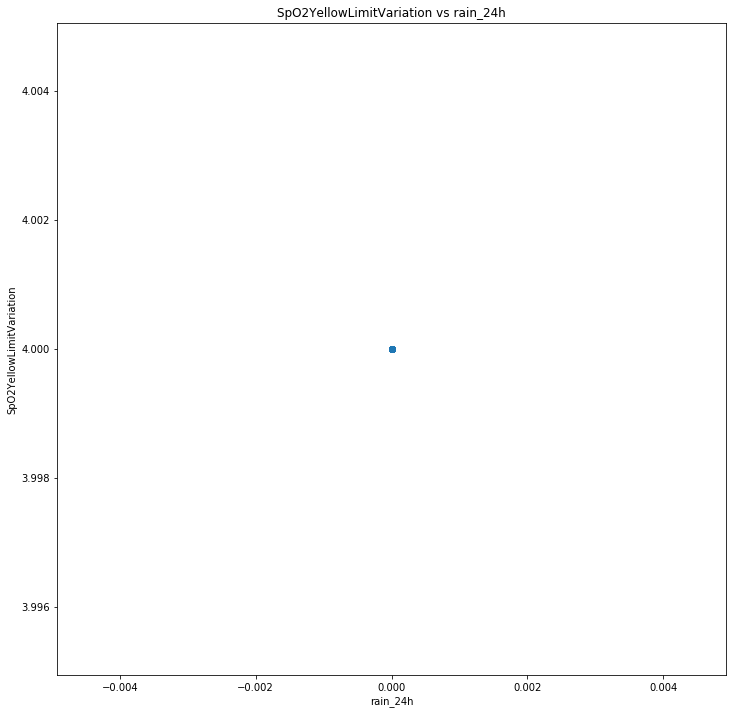

SpO2YellowLimitVariation rain_24h nan
STARTING  rain_today SpO2YellowLimitVariation


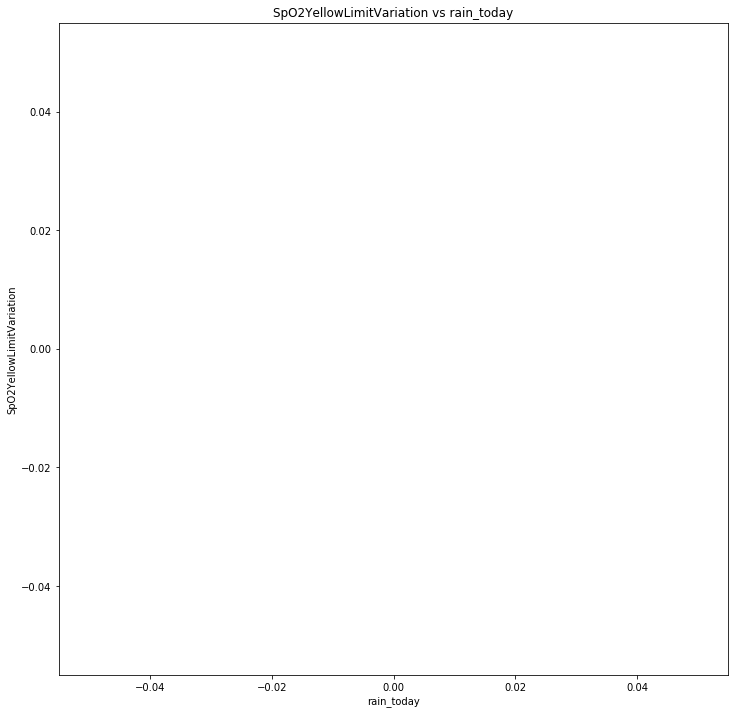

SpO2YellowLimitVariation rain_today nan
STARTING  snow_1h SpO2YellowLimitVariation


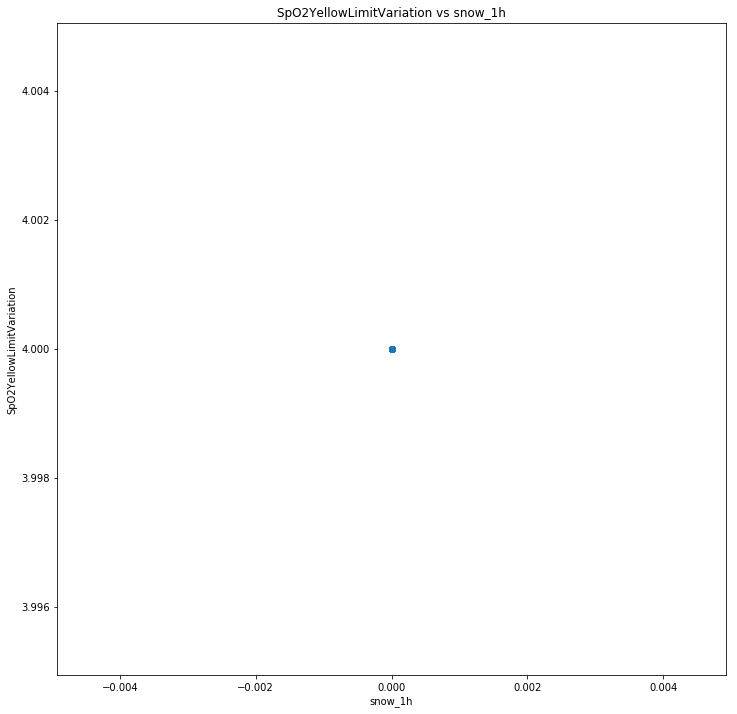

SpO2YellowLimitVariation snow_1h nan
STARTING  snow_3h SpO2YellowLimitVariation


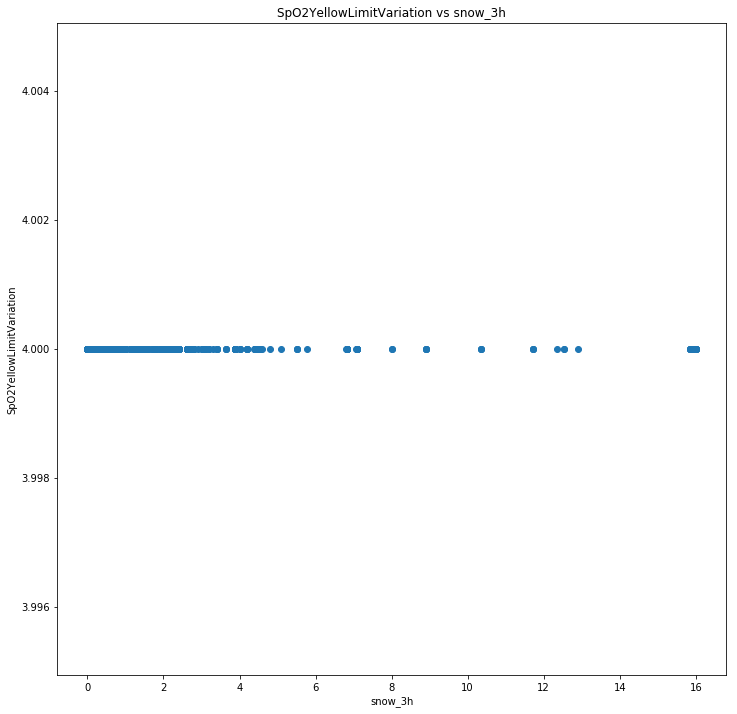

SpO2YellowLimitVariation snow_3h nan
STARTING  snow_24h SpO2YellowLimitVariation


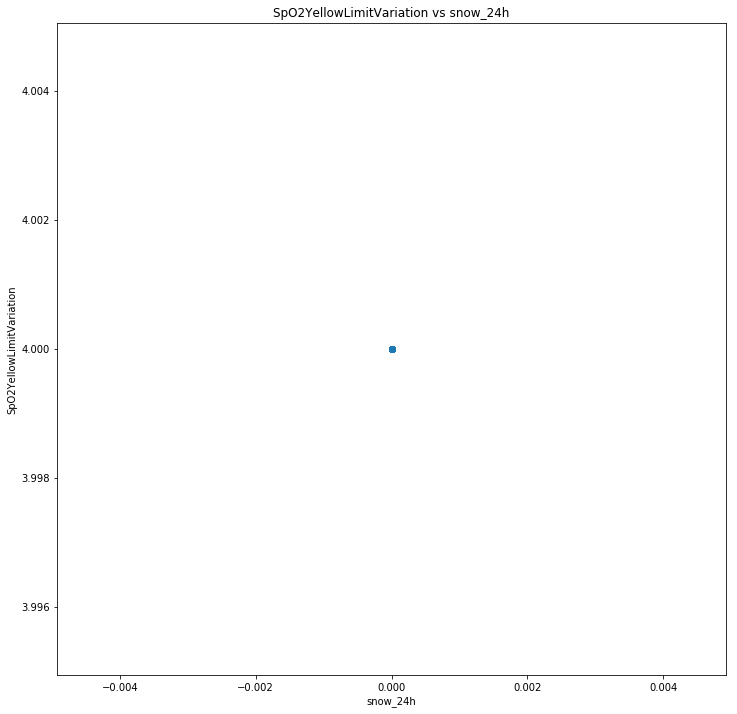

SpO2YellowLimitVariation snow_24h nan
STARTING  snow_today SpO2YellowLimitVariation


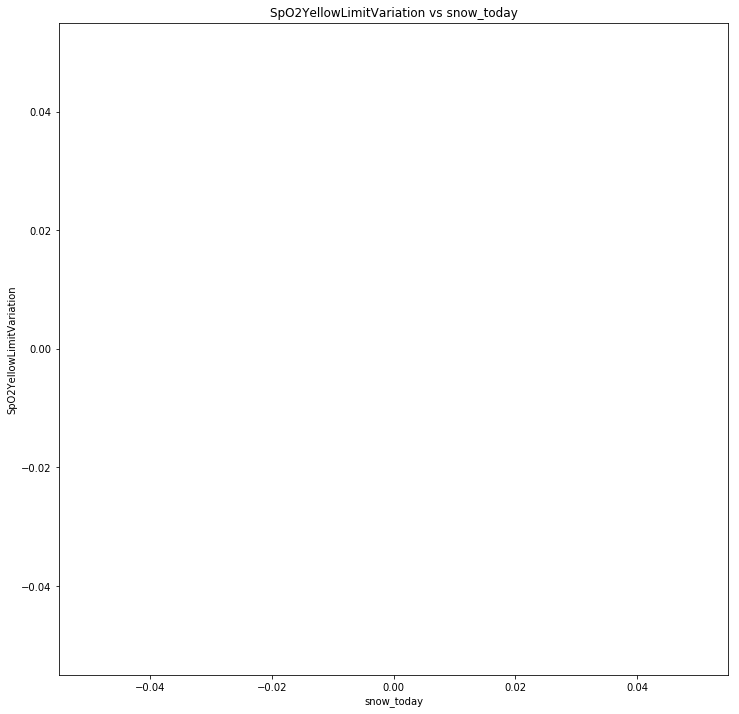

SpO2YellowLimitVariation snow_today nan
STARTING  clouds_all SpO2YellowLimitVariation


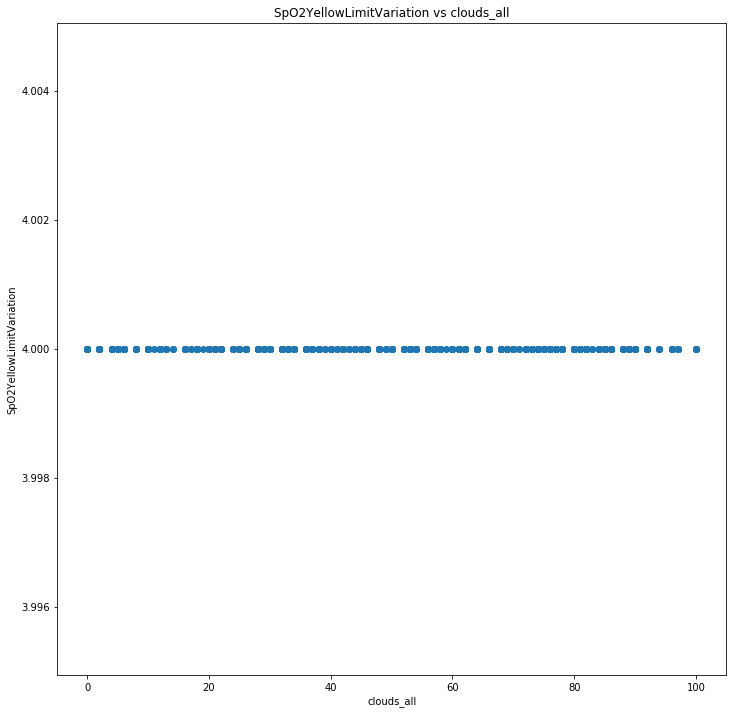

SpO2YellowLimitVariation clouds_all nan
STARTING  temp PulseRedLimitUpper


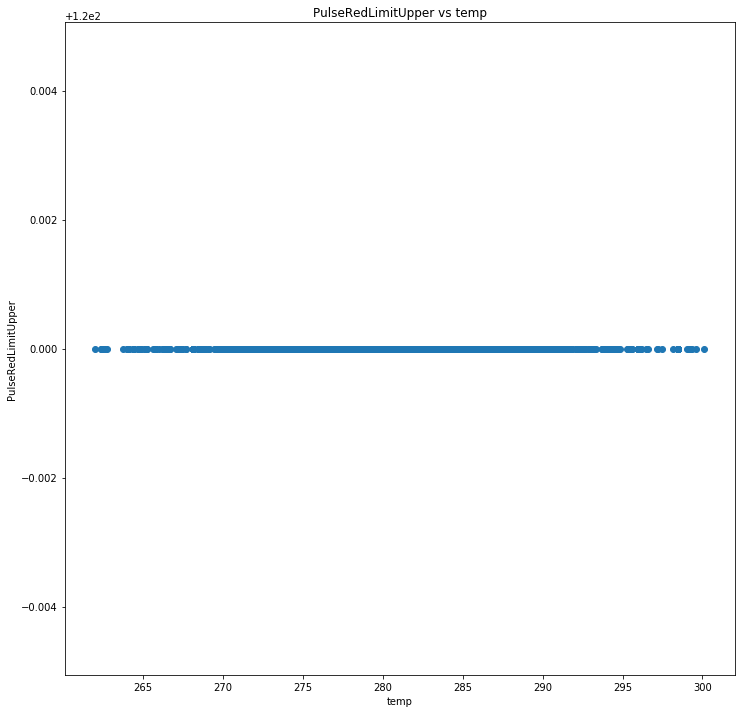

PulseRedLimitUpper temp nan
STARTING  pressure PulseRedLimitUpper


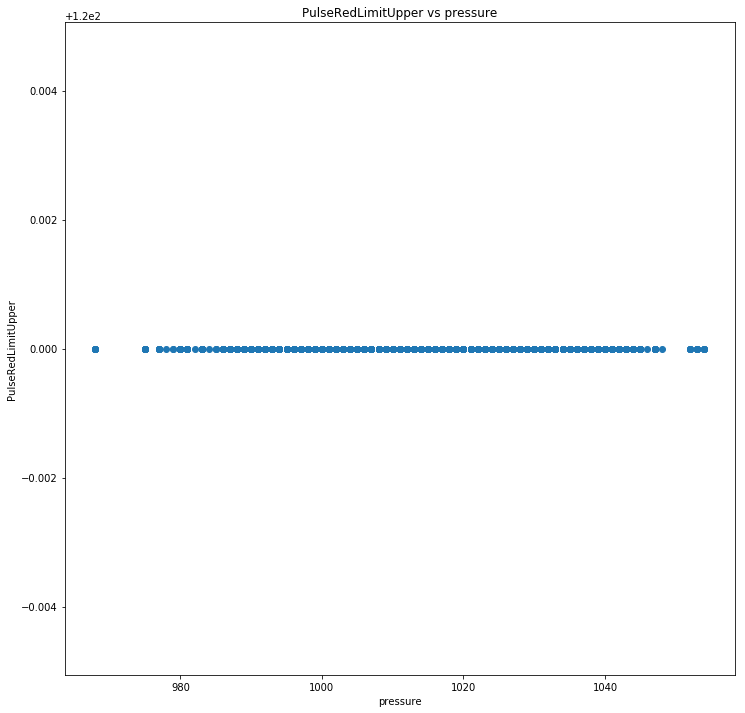

PulseRedLimitUpper pressure nan
STARTING  humidity PulseRedLimitUpper


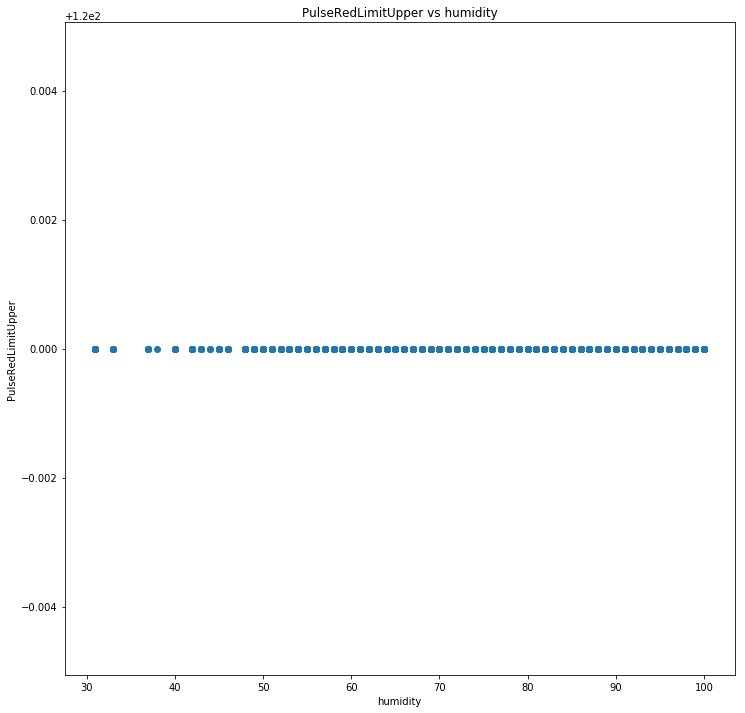

PulseRedLimitUpper humidity nan
STARTING  wind_speed PulseRedLimitUpper


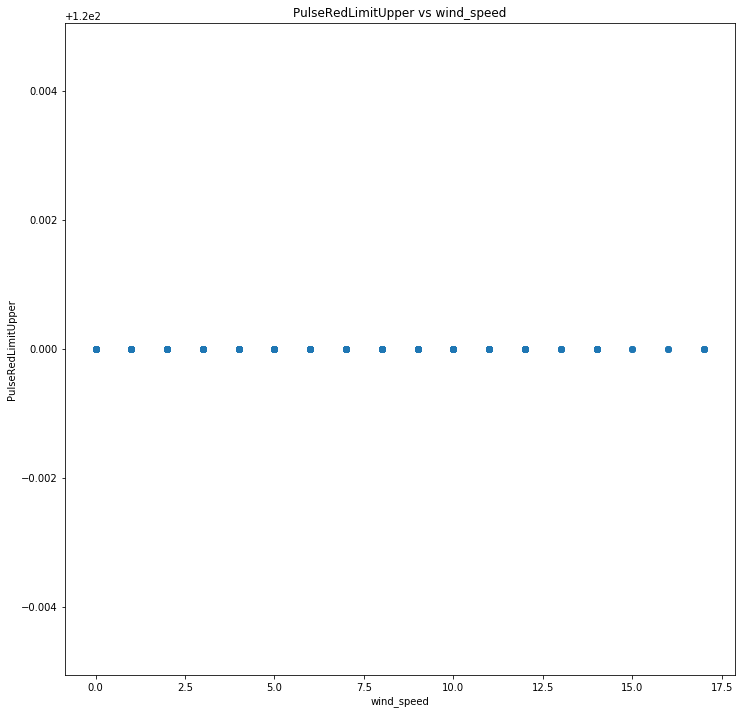

PulseRedLimitUpper wind_speed nan
STARTING  wind_deg PulseRedLimitUpper


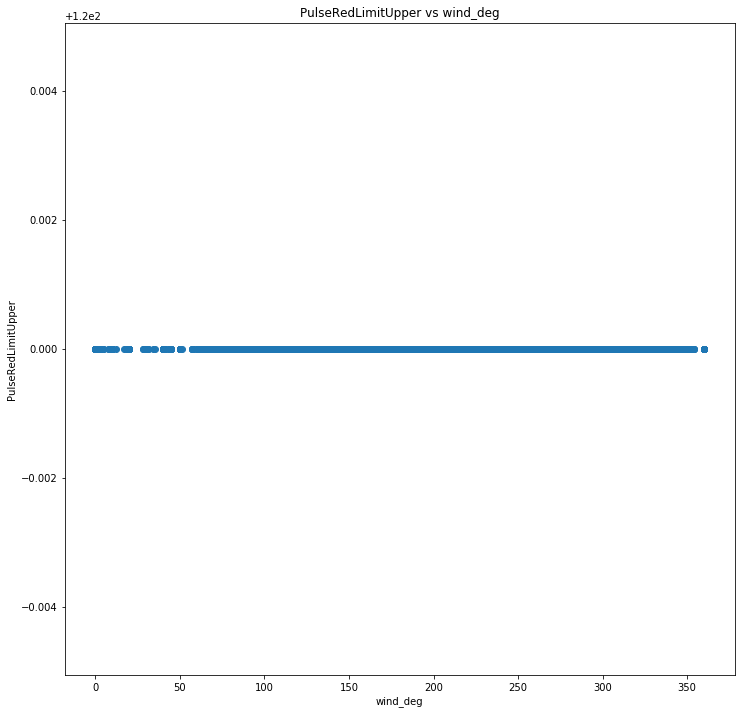

PulseRedLimitUpper wind_deg nan
STARTING  rain_1h PulseRedLimitUpper


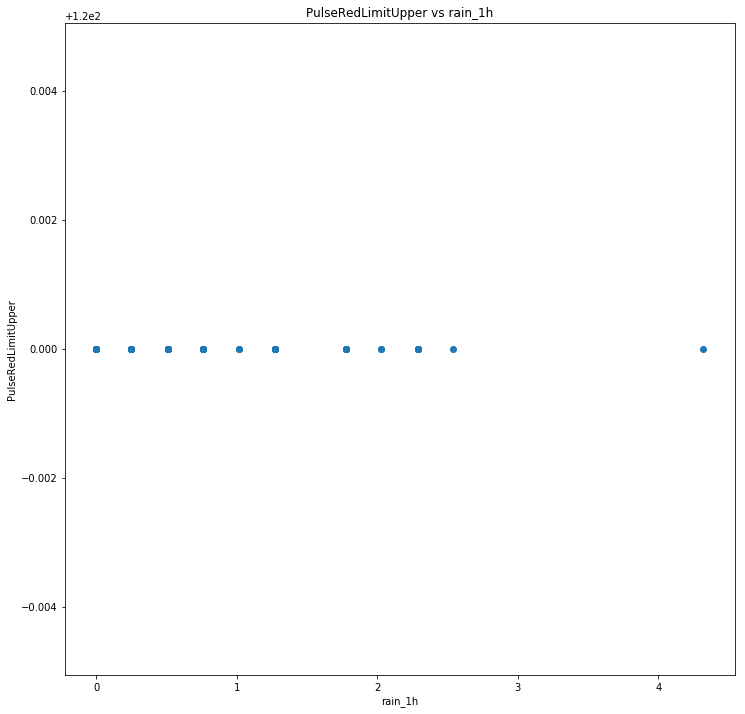

PulseRedLimitUpper rain_1h nan
STARTING  rain_3h PulseRedLimitUpper


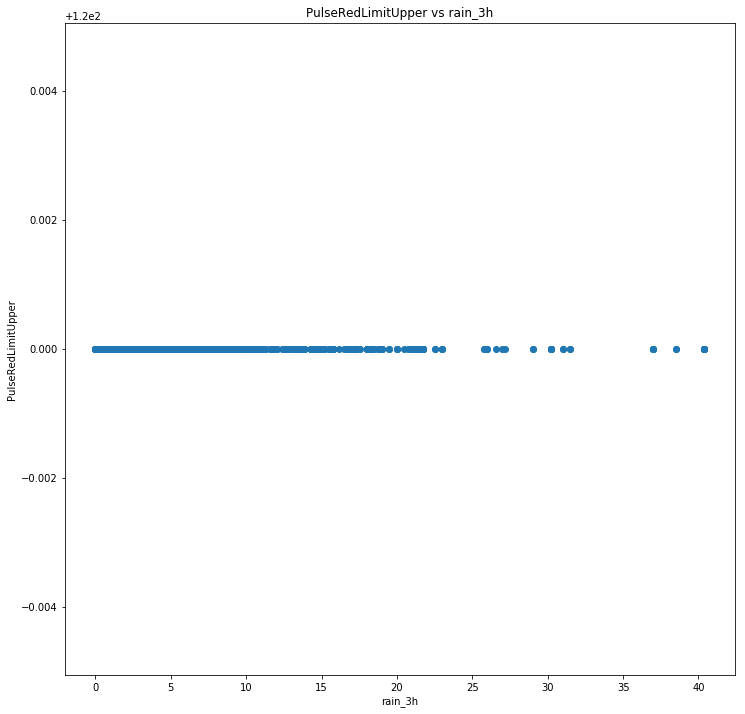

PulseRedLimitUpper rain_3h nan
STARTING  rain_24h PulseRedLimitUpper


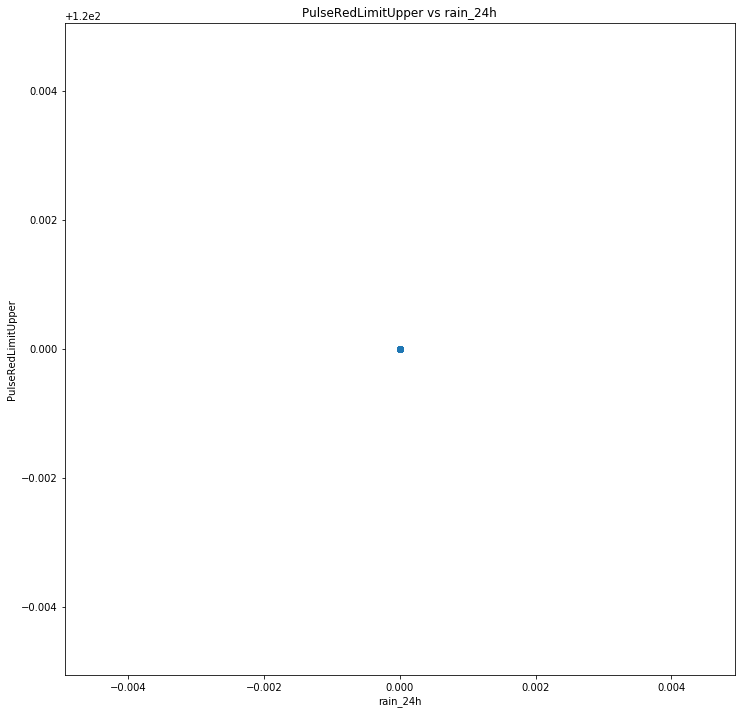

PulseRedLimitUpper rain_24h nan
STARTING  rain_today PulseRedLimitUpper


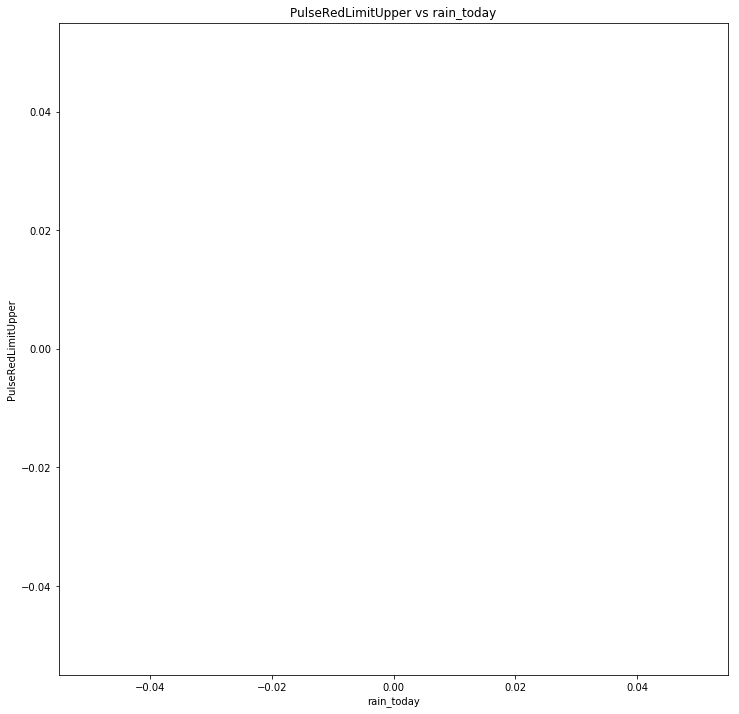

PulseRedLimitUpper rain_today nan
STARTING  snow_1h PulseRedLimitUpper


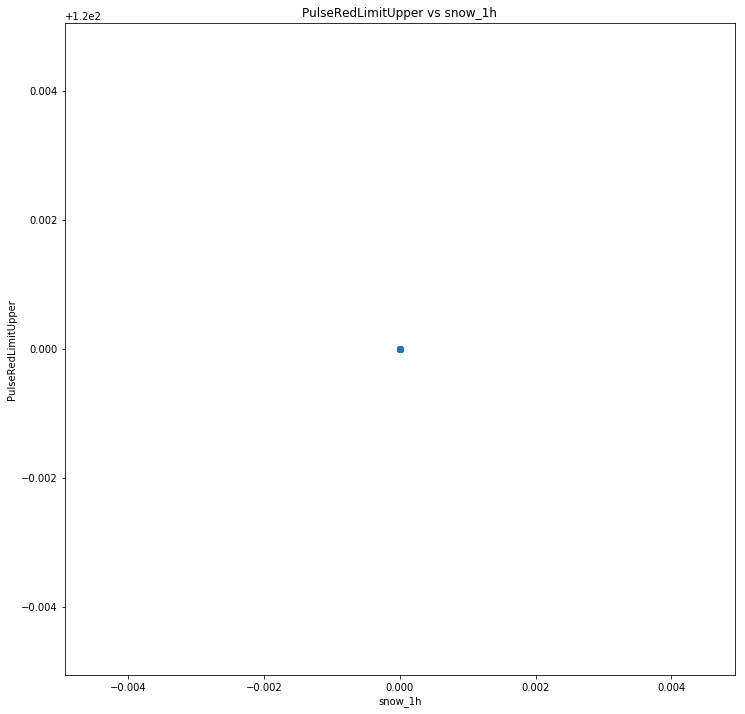

PulseRedLimitUpper snow_1h nan
STARTING  snow_3h PulseRedLimitUpper


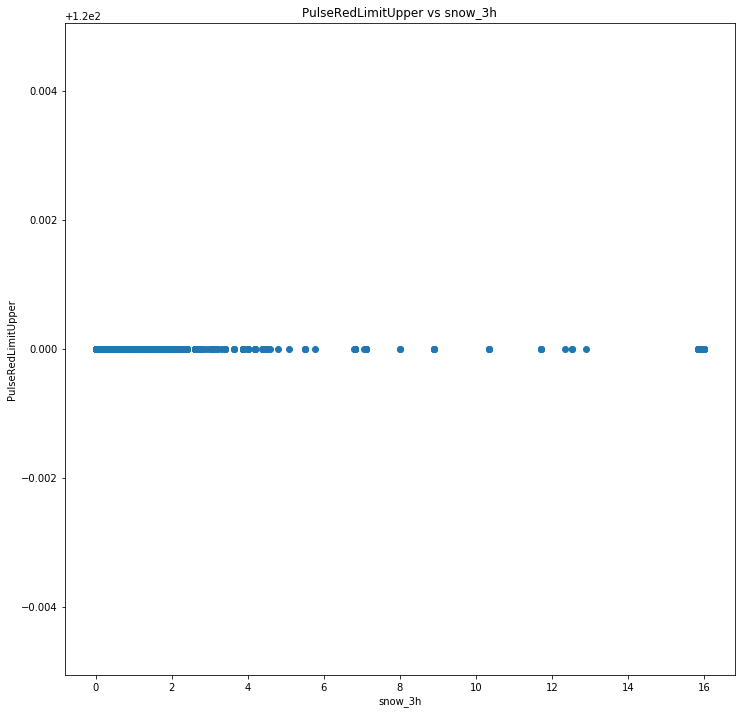

PulseRedLimitUpper snow_3h nan
STARTING  snow_24h PulseRedLimitUpper


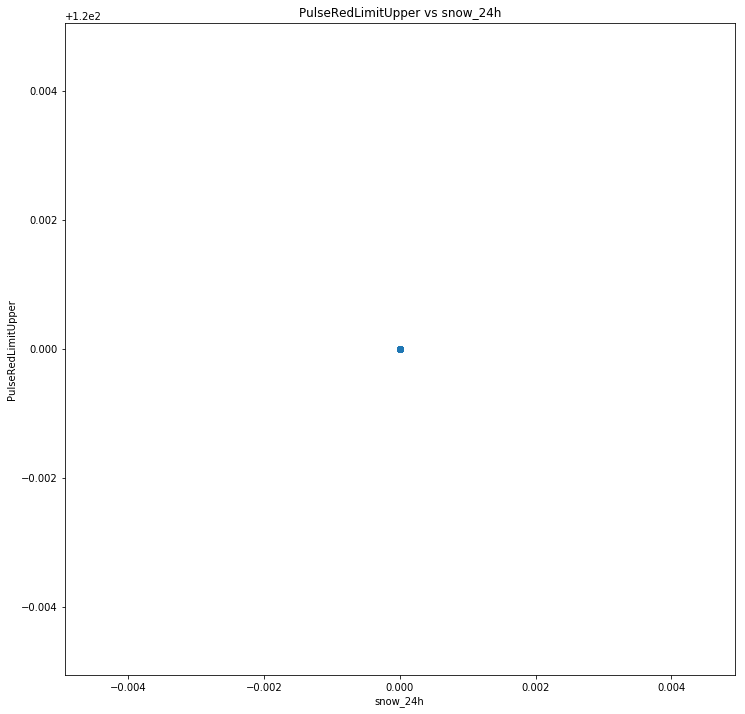

PulseRedLimitUpper snow_24h nan
STARTING  snow_today PulseRedLimitUpper


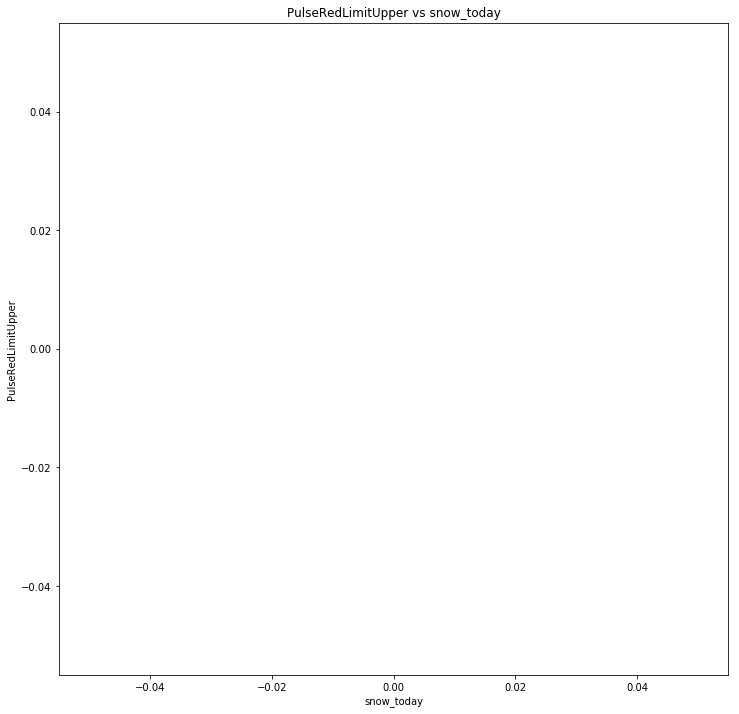

PulseRedLimitUpper snow_today nan
STARTING  clouds_all PulseRedLimitUpper


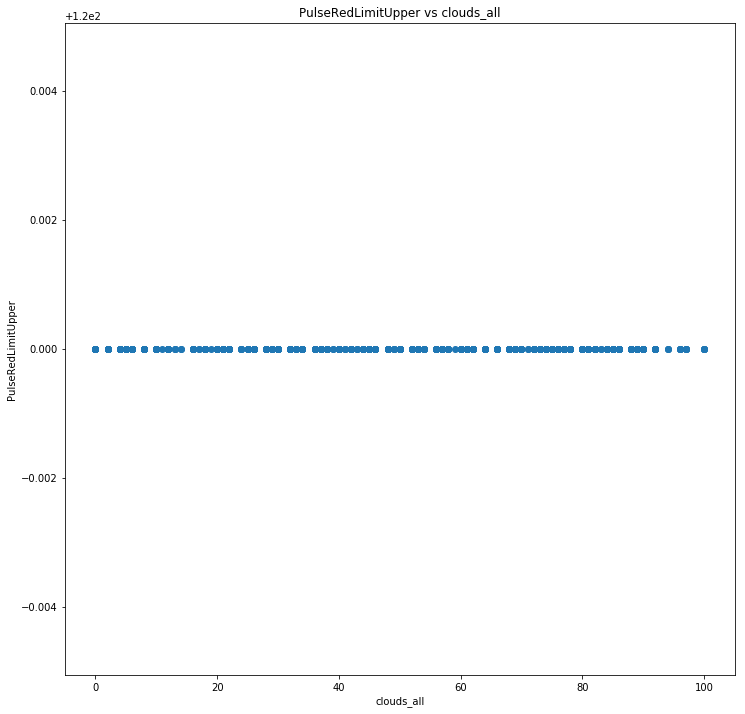

PulseRedLimitUpper clouds_all nan
STARTING  temp PulseRedLimitLower


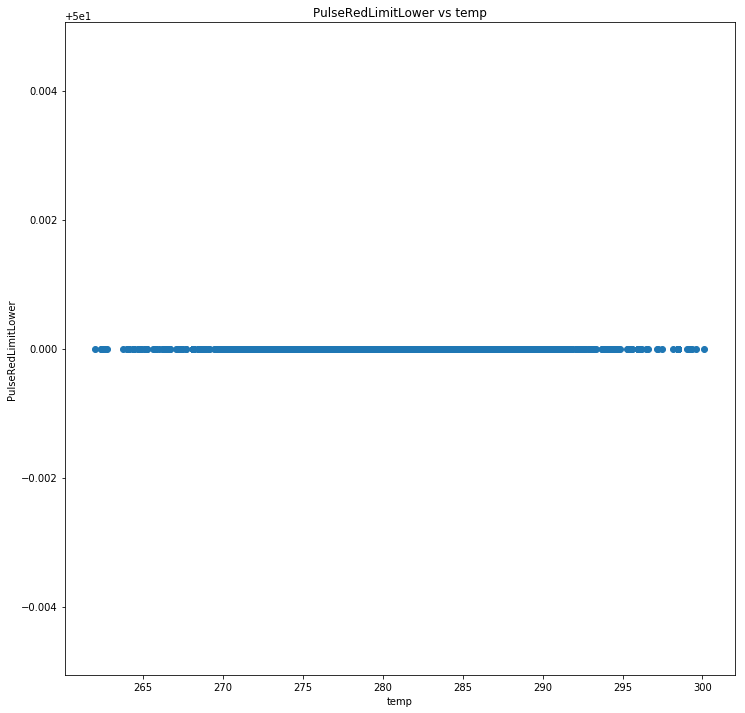

PulseRedLimitLower temp nan
STARTING  pressure PulseRedLimitLower


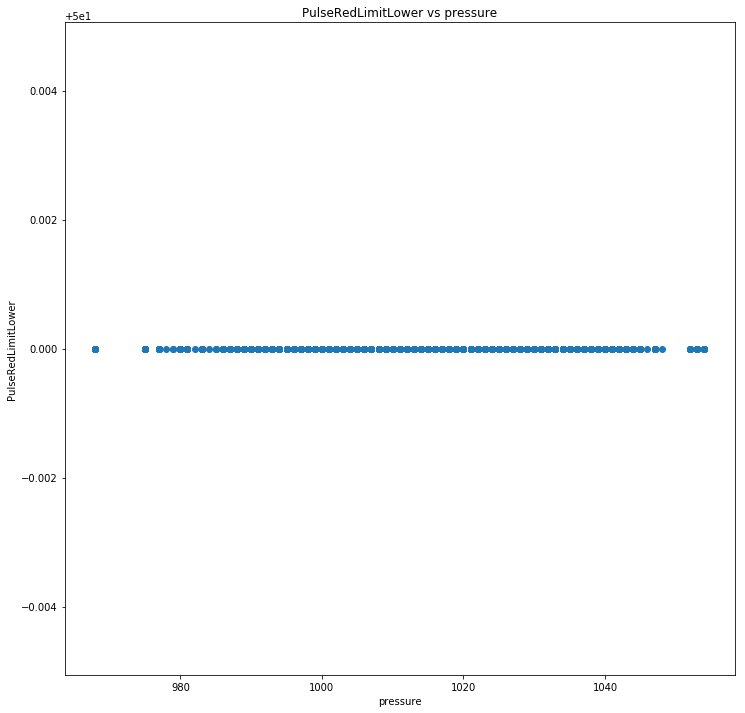

PulseRedLimitLower pressure nan
STARTING  humidity PulseRedLimitLower


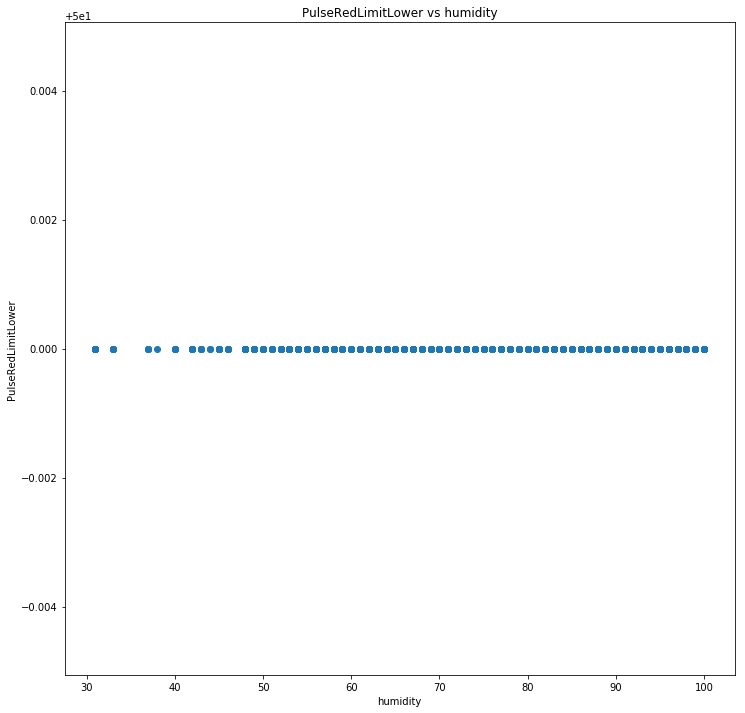

PulseRedLimitLower humidity nan
STARTING  wind_speed PulseRedLimitLower


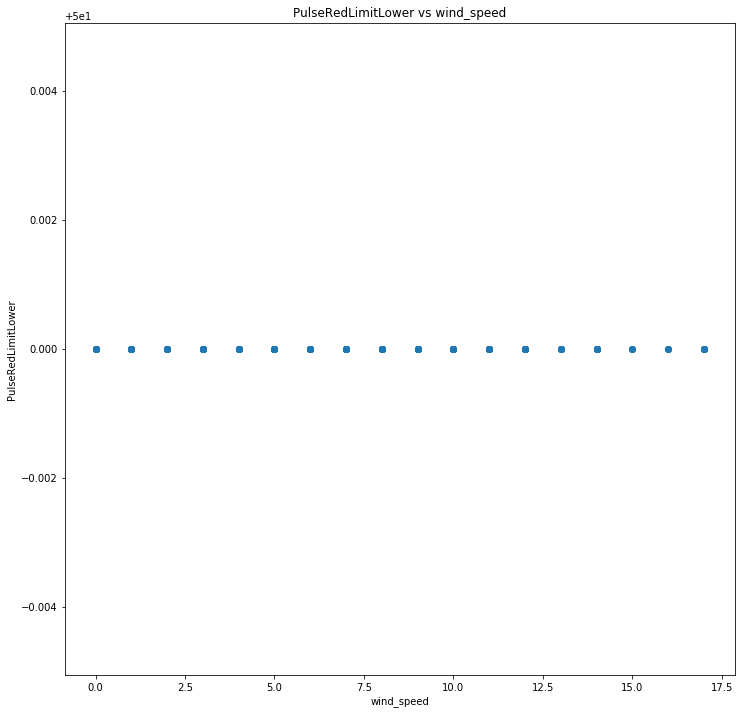

PulseRedLimitLower wind_speed nan
STARTING  wind_deg PulseRedLimitLower


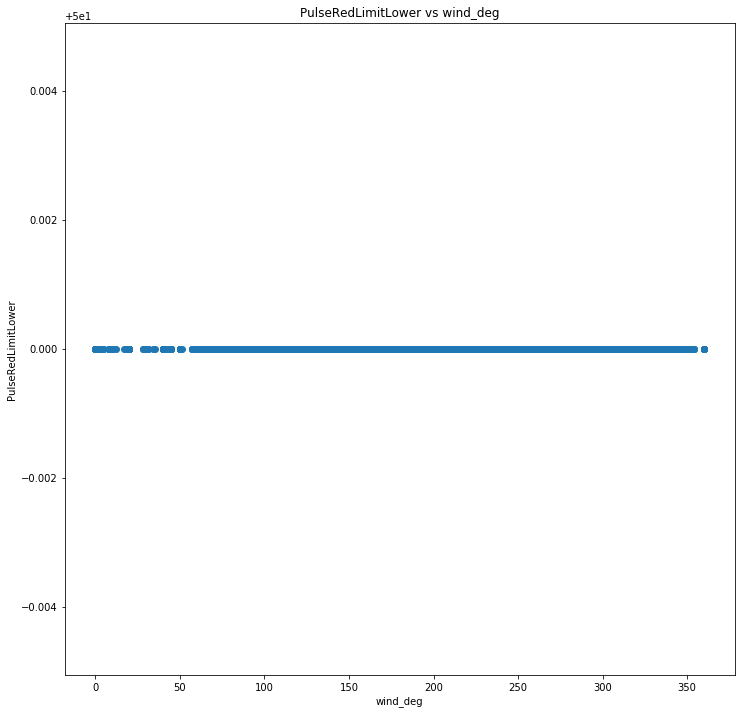

PulseRedLimitLower wind_deg nan
STARTING  rain_1h PulseRedLimitLower


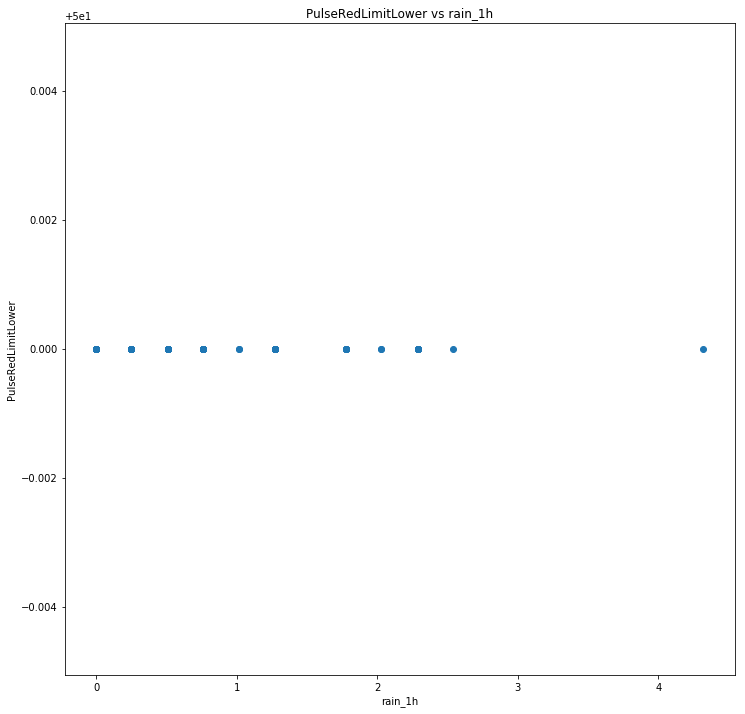

PulseRedLimitLower rain_1h nan
STARTING  rain_3h PulseRedLimitLower


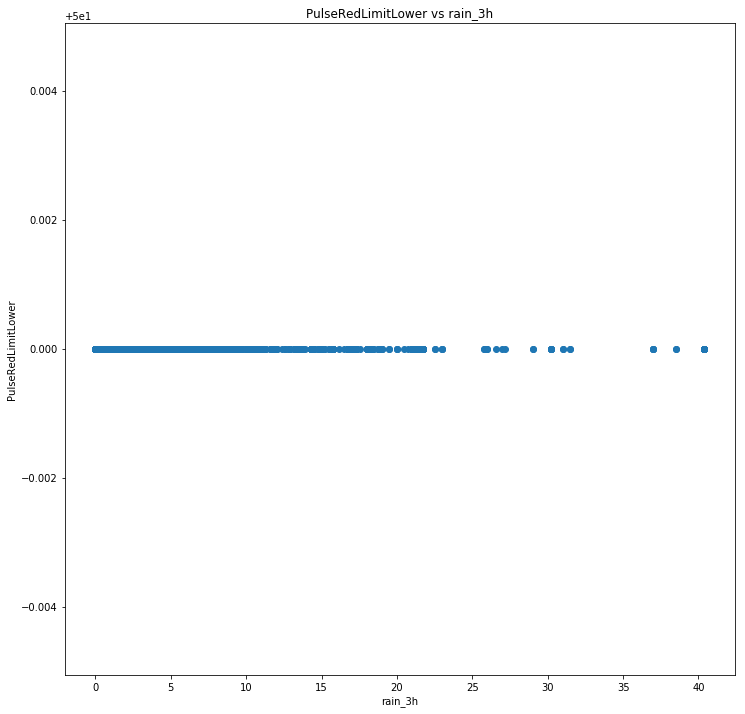

PulseRedLimitLower rain_3h nan
STARTING  rain_24h PulseRedLimitLower


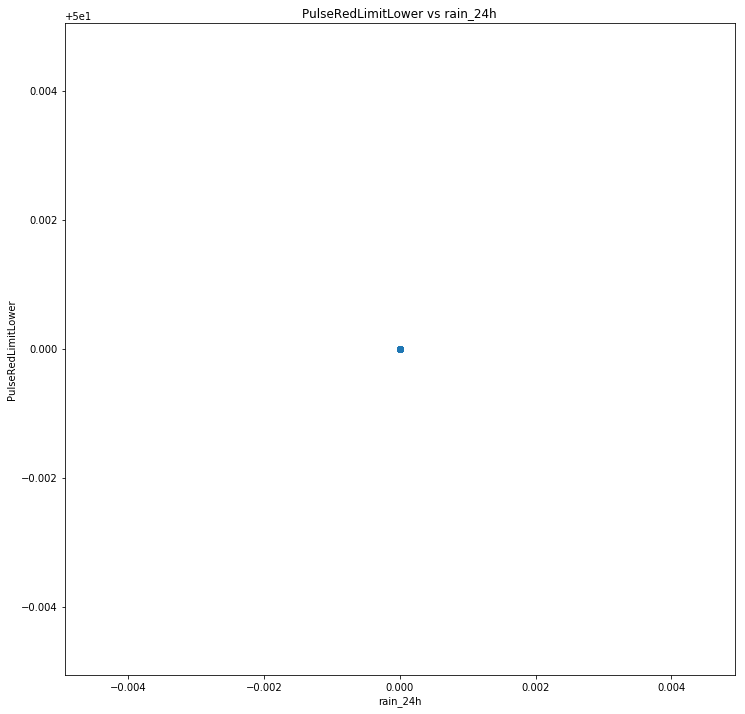

PulseRedLimitLower rain_24h nan
STARTING  rain_today PulseRedLimitLower


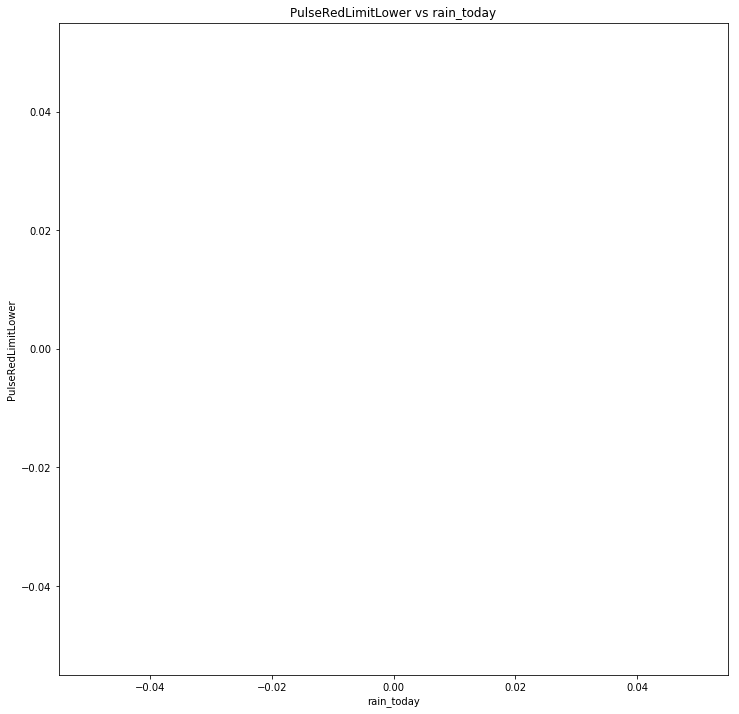

PulseRedLimitLower rain_today nan
STARTING  snow_1h PulseRedLimitLower


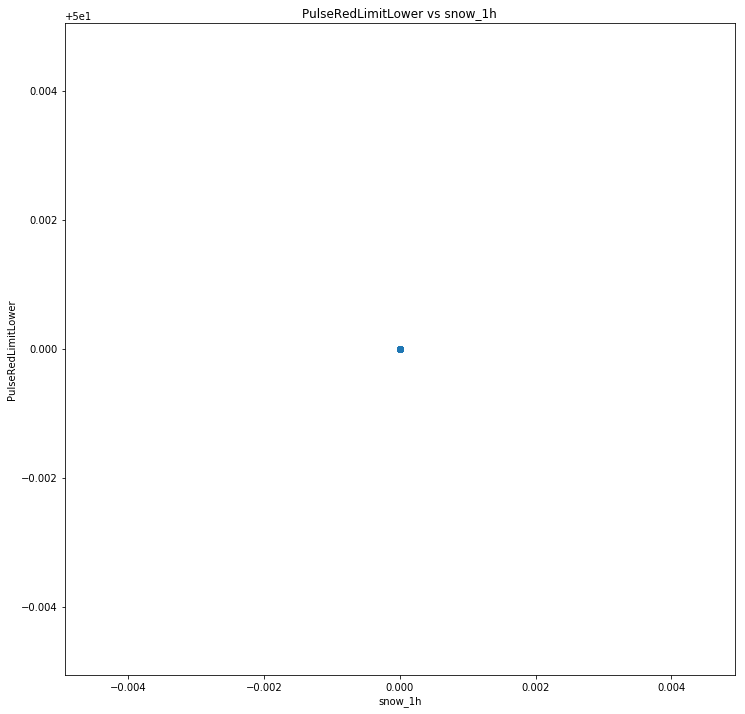

PulseRedLimitLower snow_1h nan
STARTING  snow_3h PulseRedLimitLower


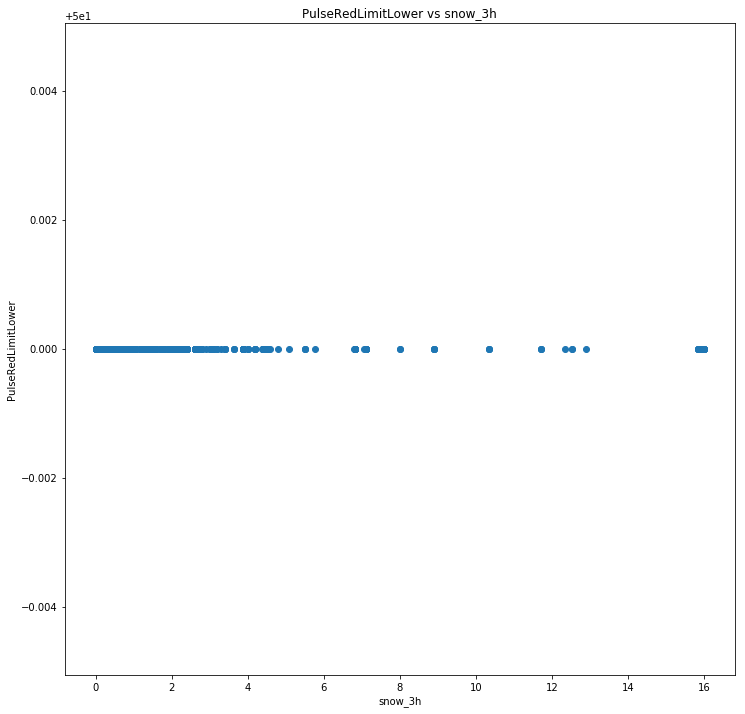

PulseRedLimitLower snow_3h nan
STARTING  snow_24h PulseRedLimitLower


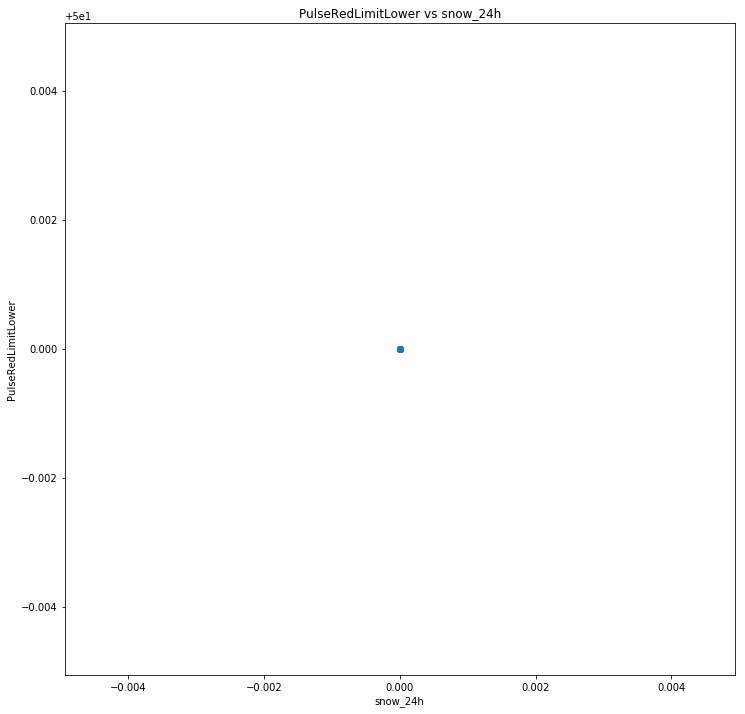

PulseRedLimitLower snow_24h nan
STARTING  snow_today PulseRedLimitLower


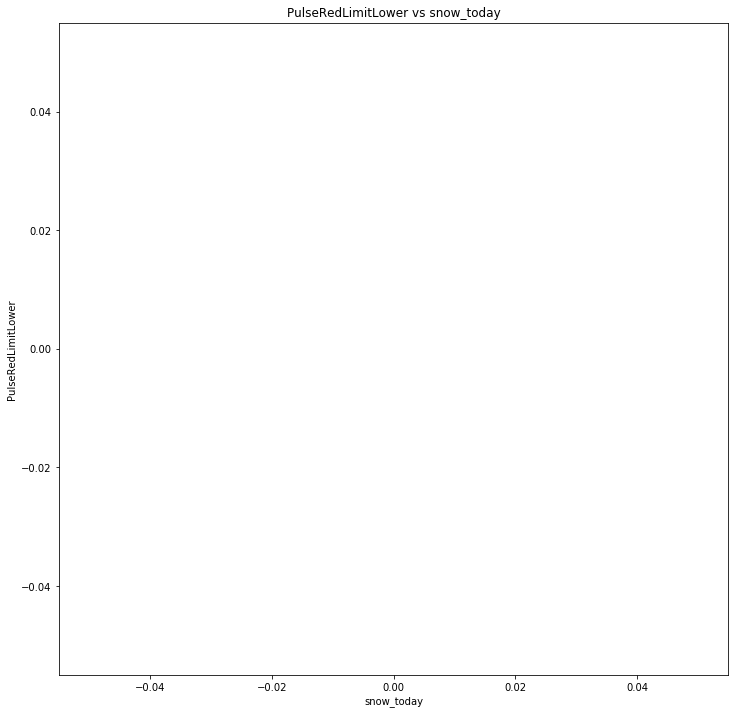

PulseRedLimitLower snow_today nan
STARTING  clouds_all PulseRedLimitLower


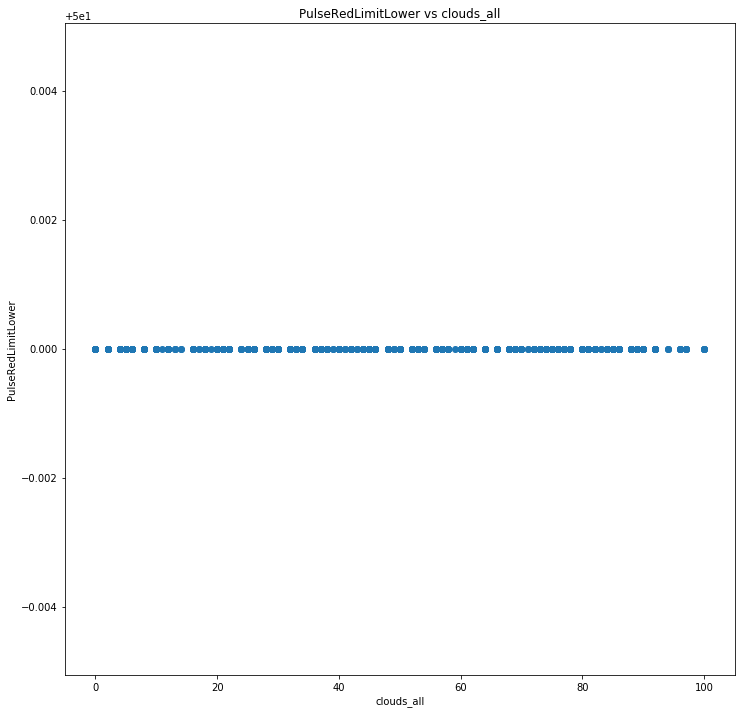

PulseRedLimitLower clouds_all nan
STARTING  temp PulseRedLimitVariation


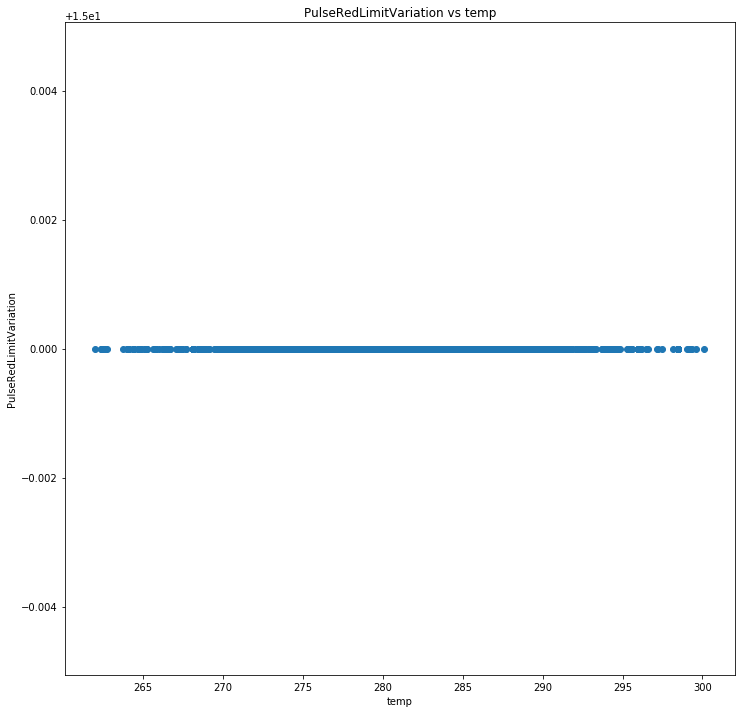

PulseRedLimitVariation temp nan
STARTING  pressure PulseRedLimitVariation


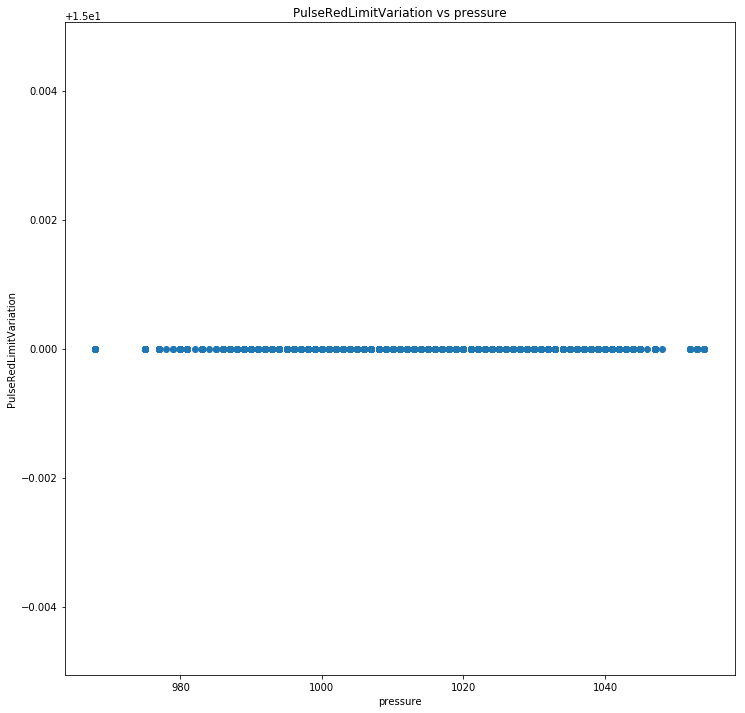

PulseRedLimitVariation pressure nan
STARTING  humidity PulseRedLimitVariation


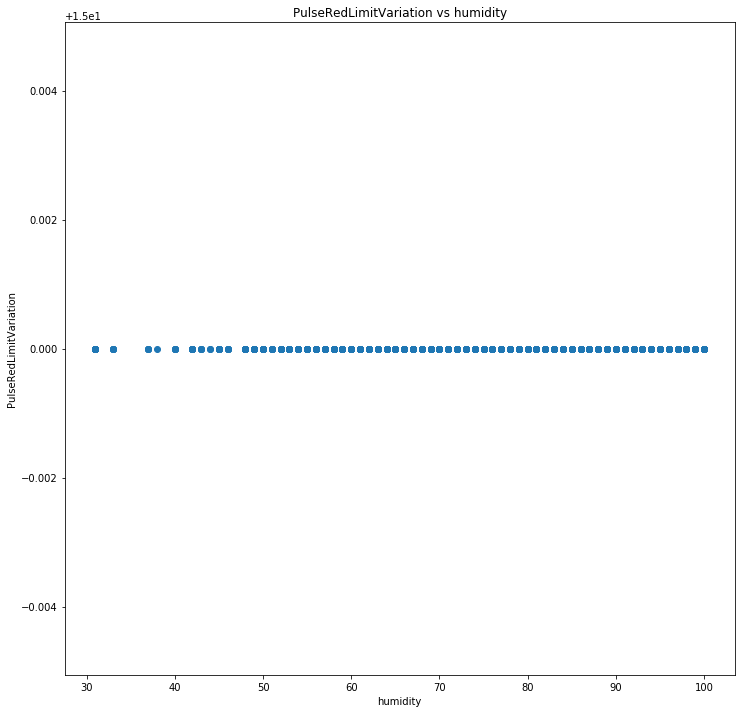

PulseRedLimitVariation humidity nan
STARTING  wind_speed PulseRedLimitVariation


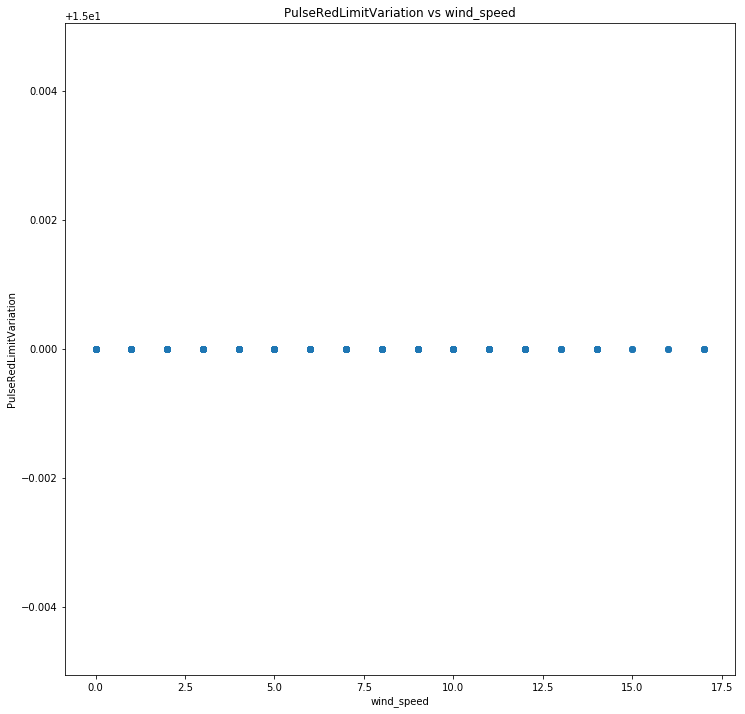

PulseRedLimitVariation wind_speed nan
STARTING  wind_deg PulseRedLimitVariation


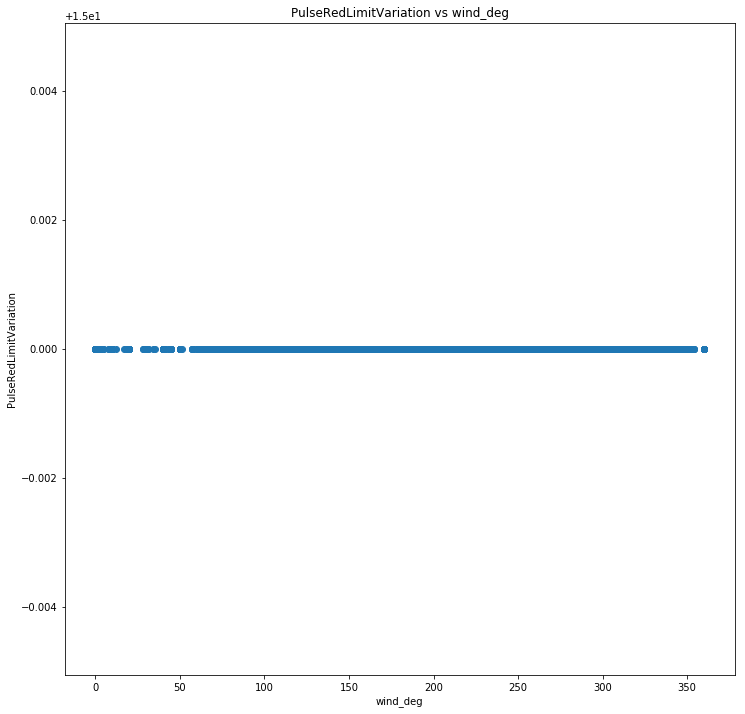

PulseRedLimitVariation wind_deg nan
STARTING  rain_1h PulseRedLimitVariation


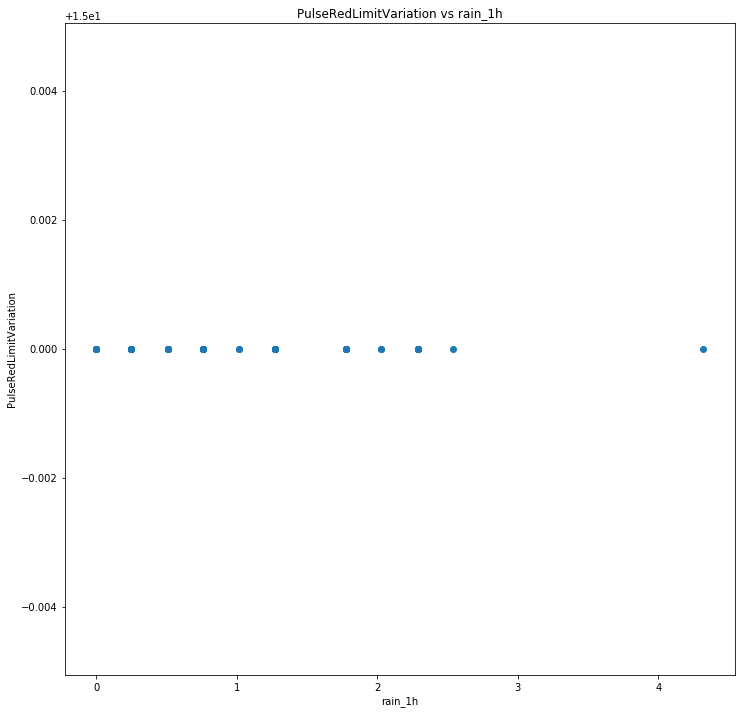

PulseRedLimitVariation rain_1h nan
STARTING  rain_3h PulseRedLimitVariation


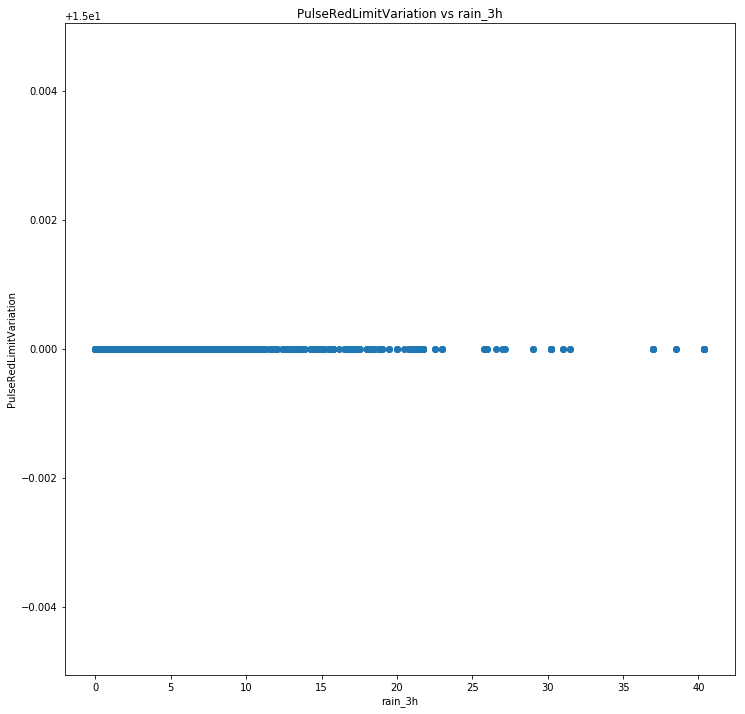

PulseRedLimitVariation rain_3h nan
STARTING  rain_24h PulseRedLimitVariation


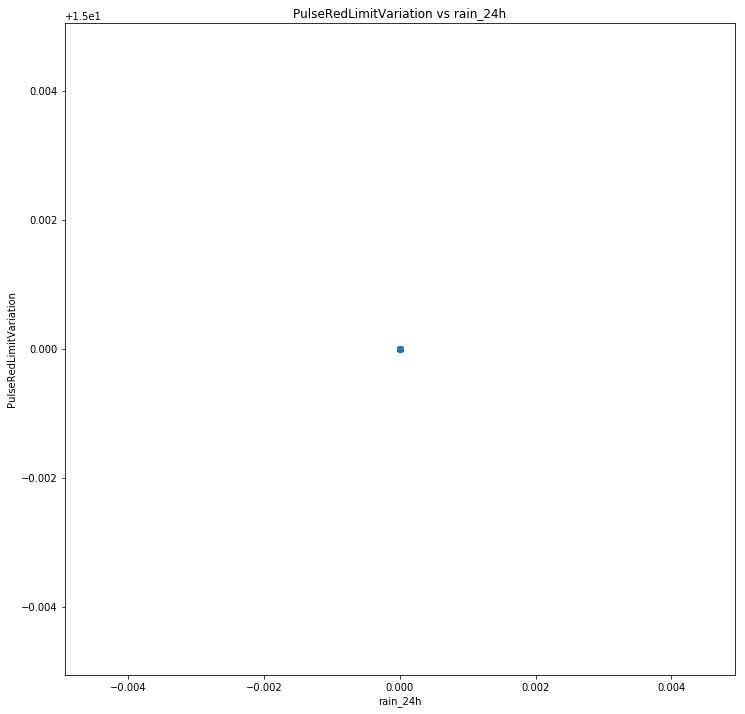

PulseRedLimitVariation rain_24h nan
STARTING  rain_today PulseRedLimitVariation


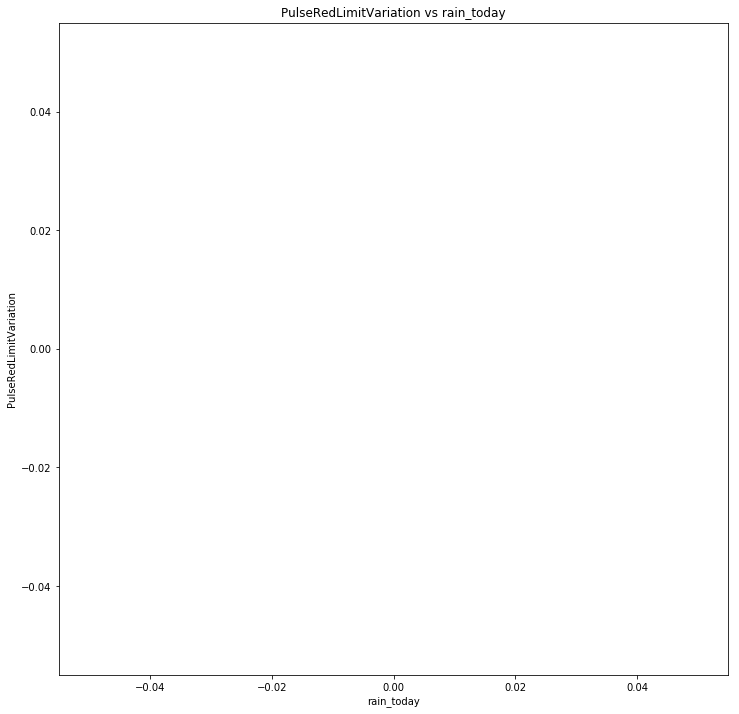

PulseRedLimitVariation rain_today nan
STARTING  snow_1h PulseRedLimitVariation


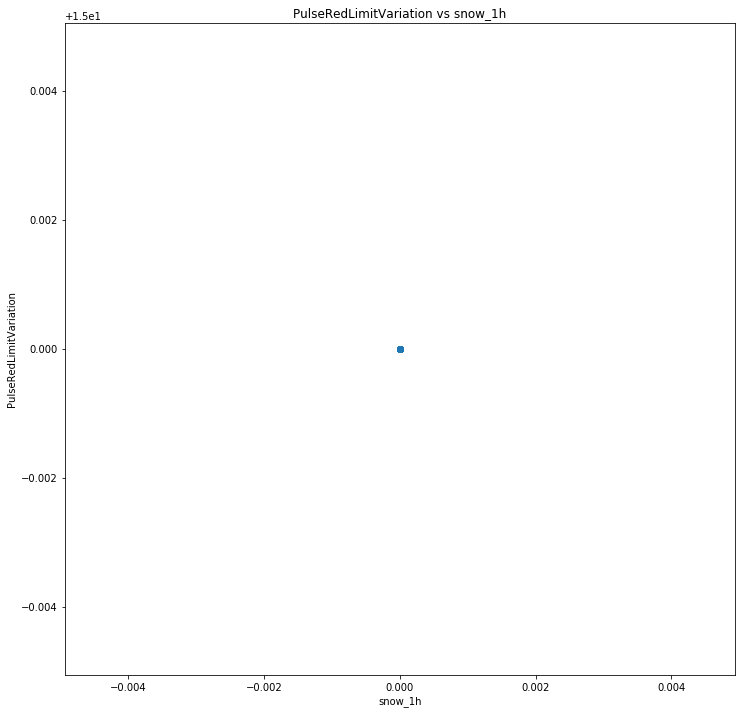

PulseRedLimitVariation snow_1h nan
STARTING  snow_3h PulseRedLimitVariation


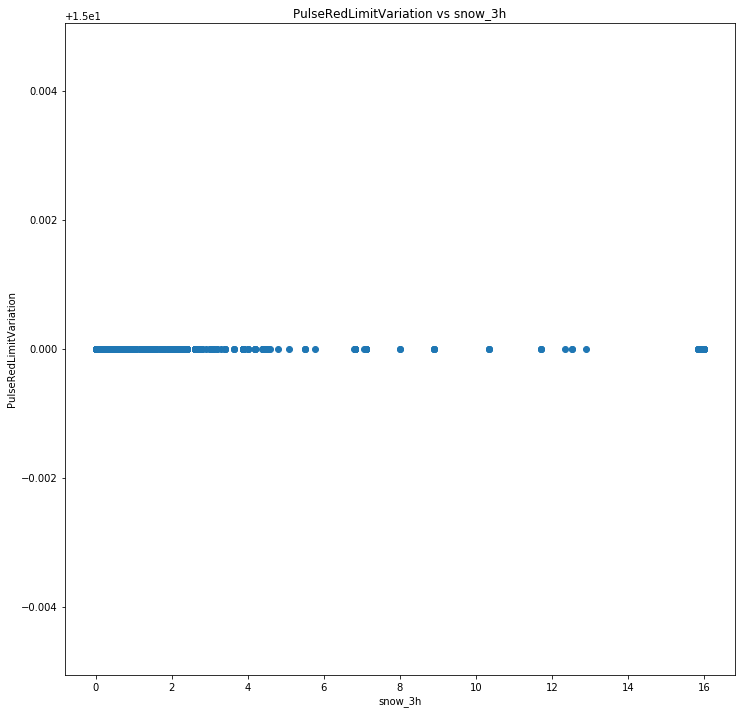

PulseRedLimitVariation snow_3h nan
STARTING  snow_24h PulseRedLimitVariation


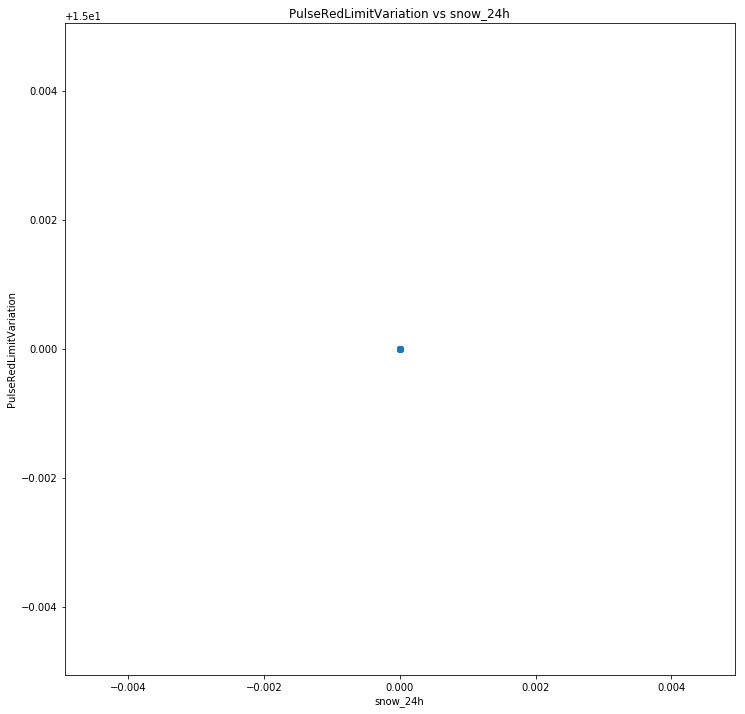

PulseRedLimitVariation snow_24h nan
STARTING  snow_today PulseRedLimitVariation


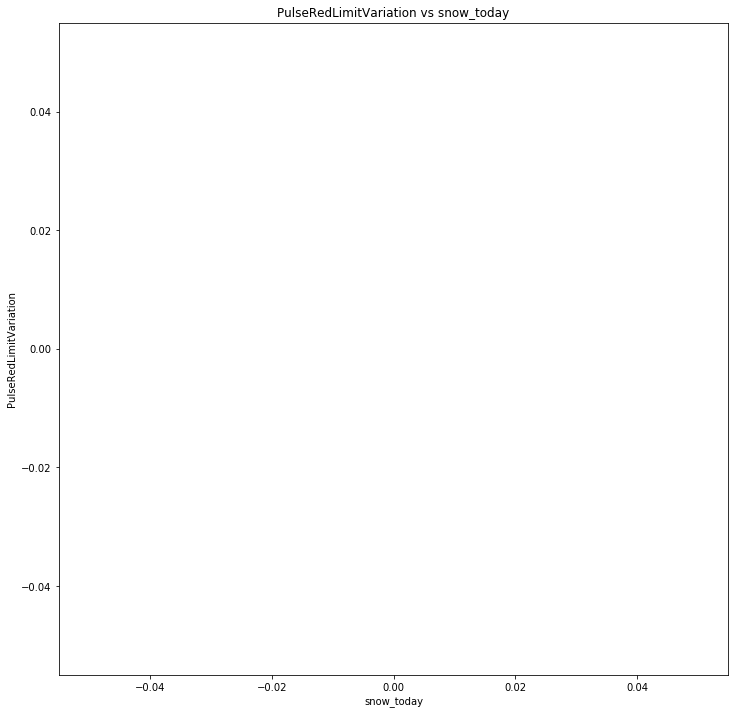

PulseRedLimitVariation snow_today nan
STARTING  clouds_all PulseRedLimitVariation


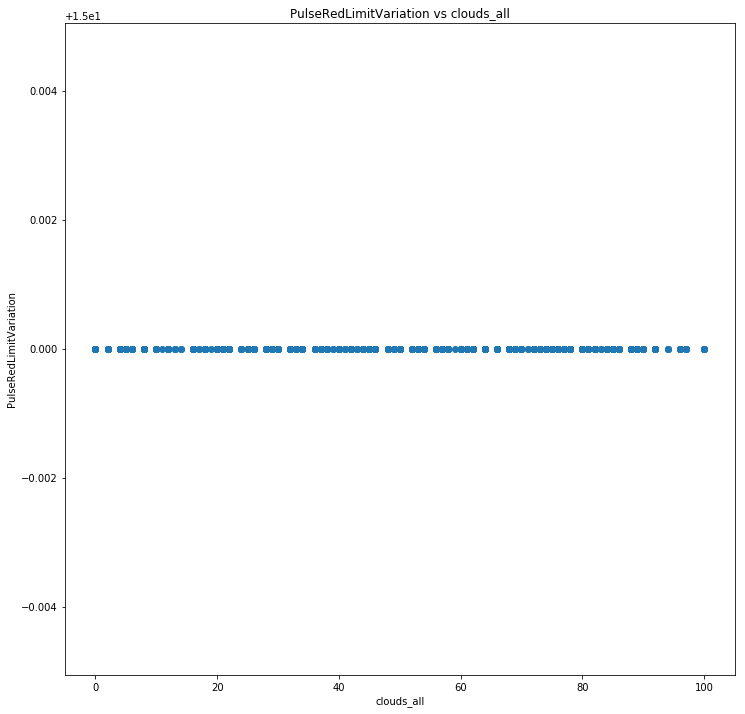

PulseRedLimitVariation clouds_all nan
STARTING  temp PulseYellowLimitVariation


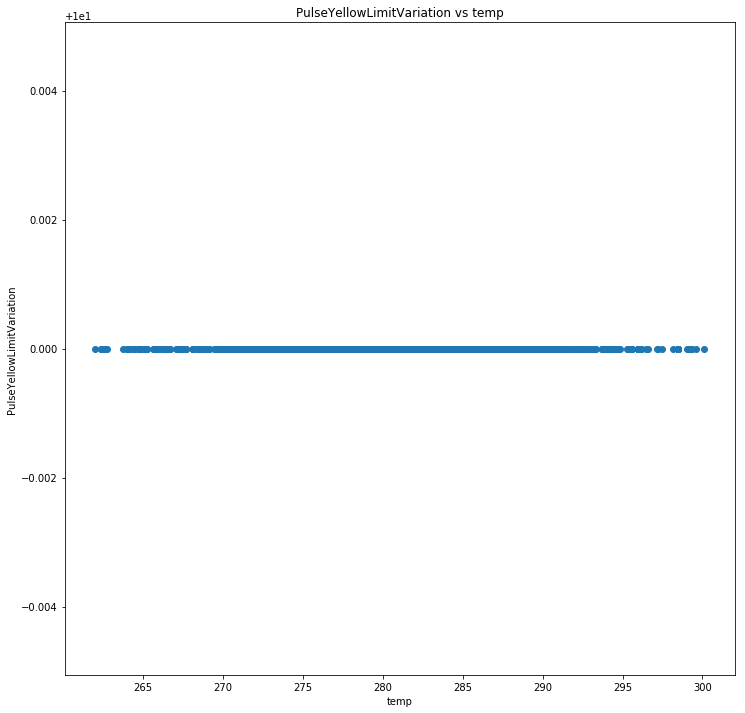

PulseYellowLimitVariation temp nan
STARTING  pressure PulseYellowLimitVariation


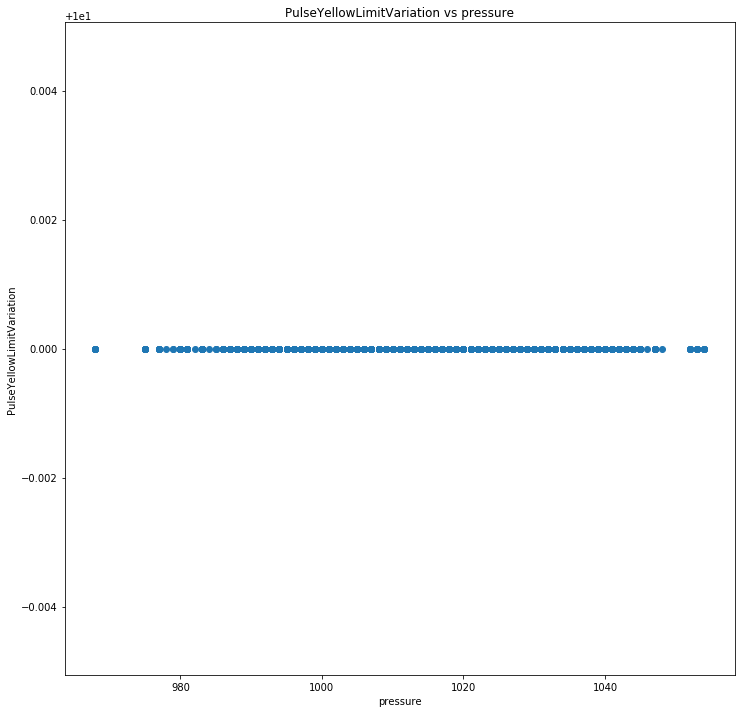

PulseYellowLimitVariation pressure nan
STARTING  humidity PulseYellowLimitVariation


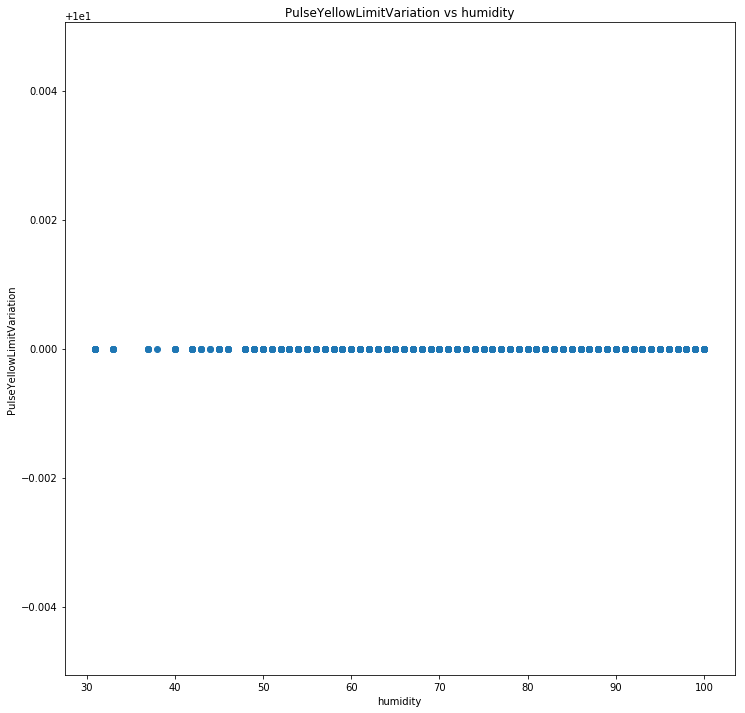

PulseYellowLimitVariation humidity nan
STARTING  wind_speed PulseYellowLimitVariation


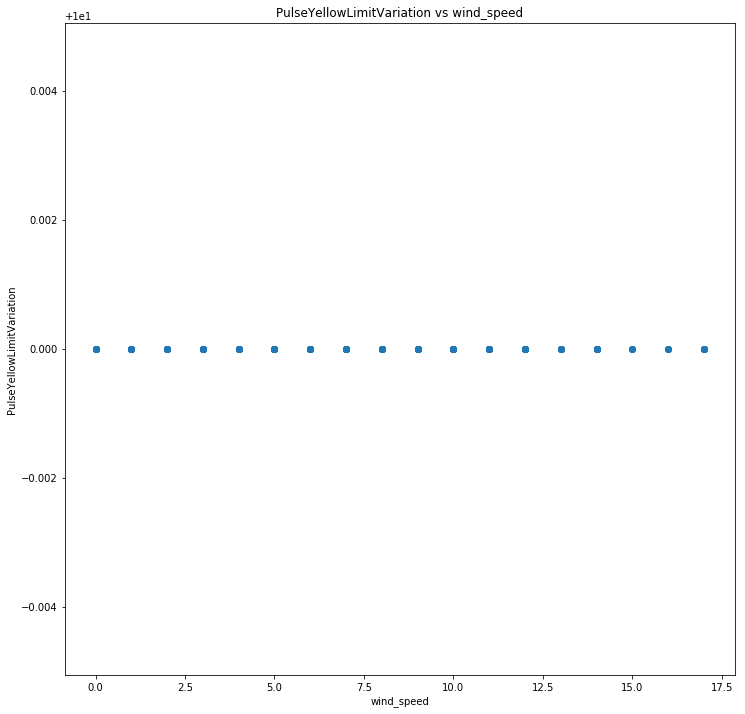

PulseYellowLimitVariation wind_speed nan
STARTING  wind_deg PulseYellowLimitVariation


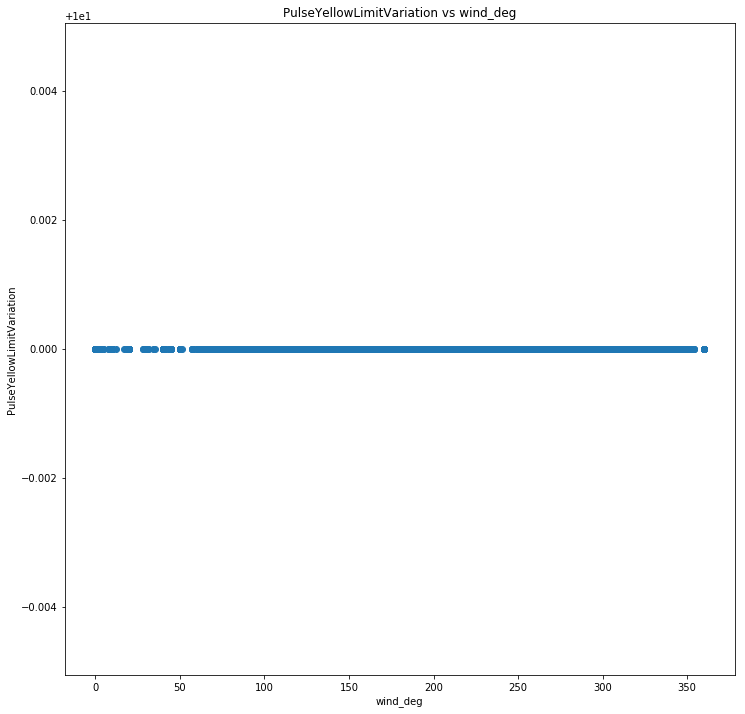

PulseYellowLimitVariation wind_deg nan
STARTING  rain_1h PulseYellowLimitVariation


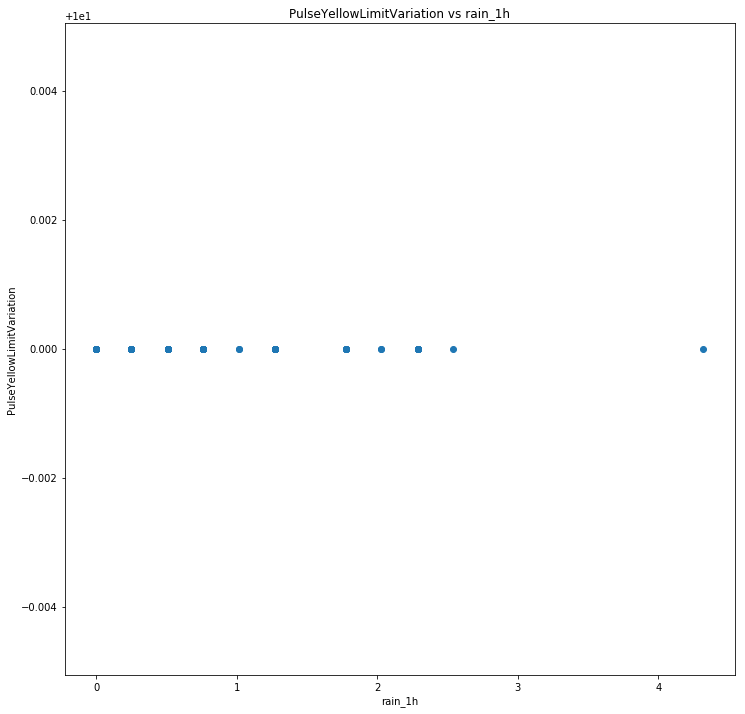

PulseYellowLimitVariation rain_1h nan
STARTING  rain_3h PulseYellowLimitVariation


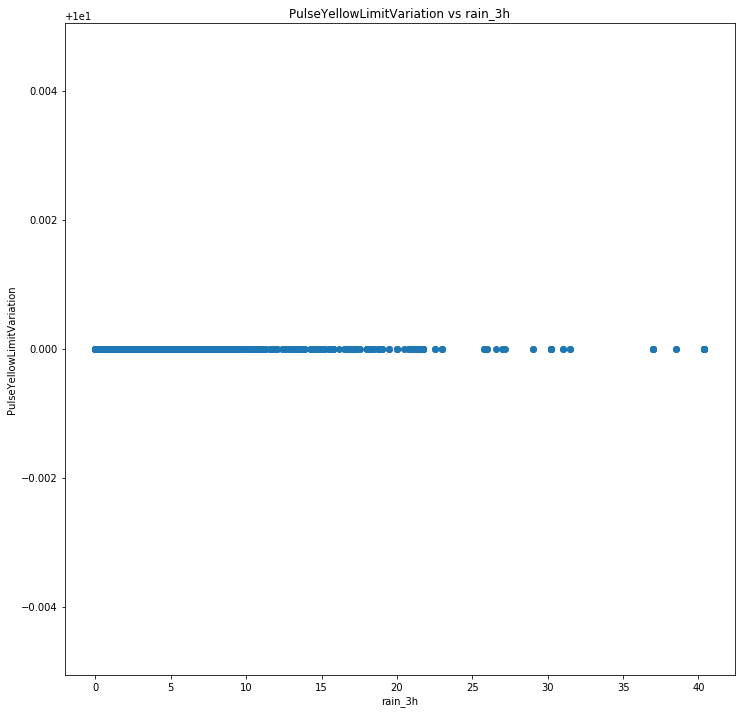

PulseYellowLimitVariation rain_3h nan
STARTING  rain_24h PulseYellowLimitVariation


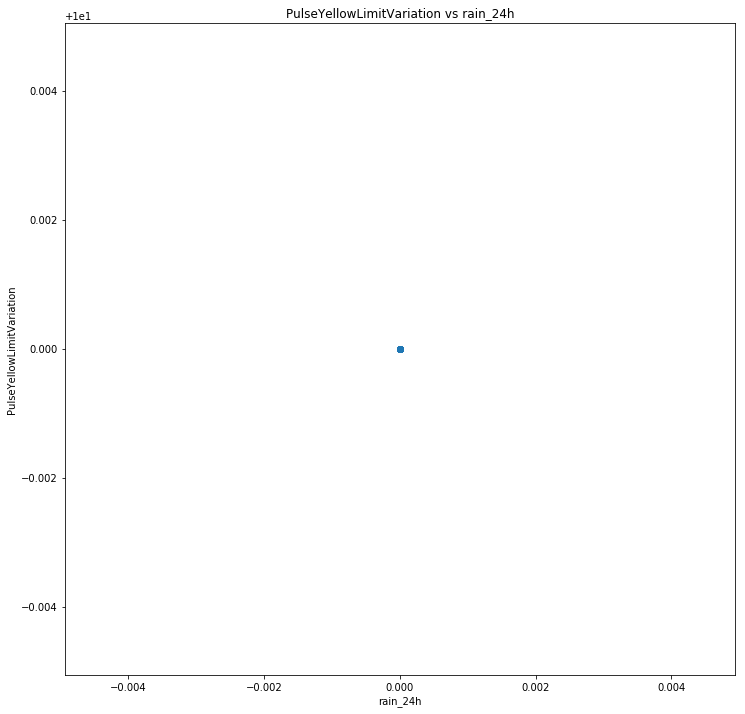

PulseYellowLimitVariation rain_24h nan
STARTING  rain_today PulseYellowLimitVariation


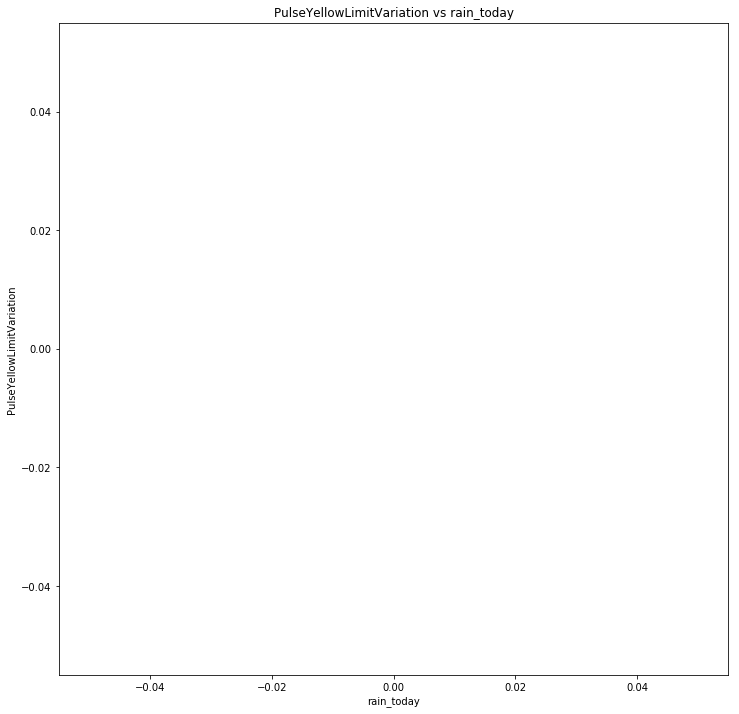

PulseYellowLimitVariation rain_today nan
STARTING  snow_1h PulseYellowLimitVariation


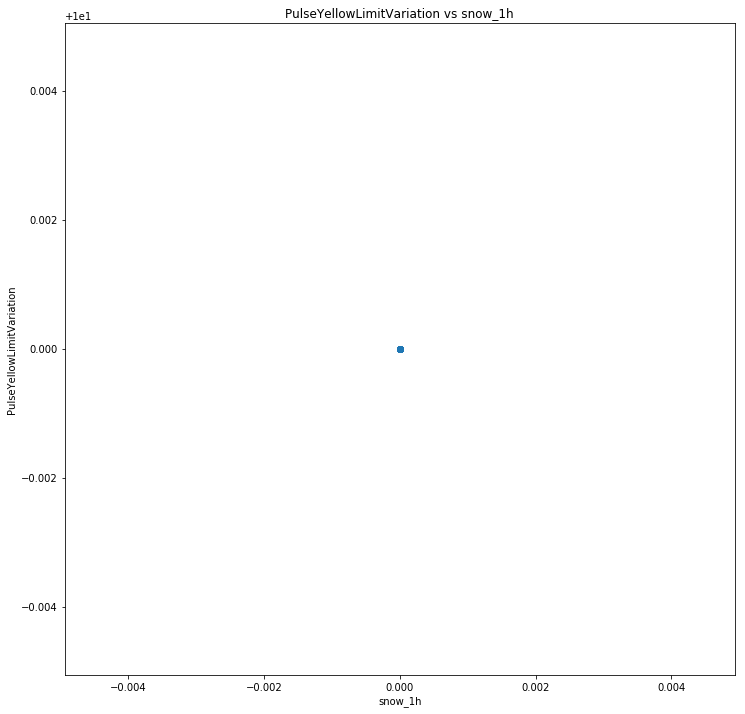

PulseYellowLimitVariation snow_1h nan
STARTING  snow_3h PulseYellowLimitVariation


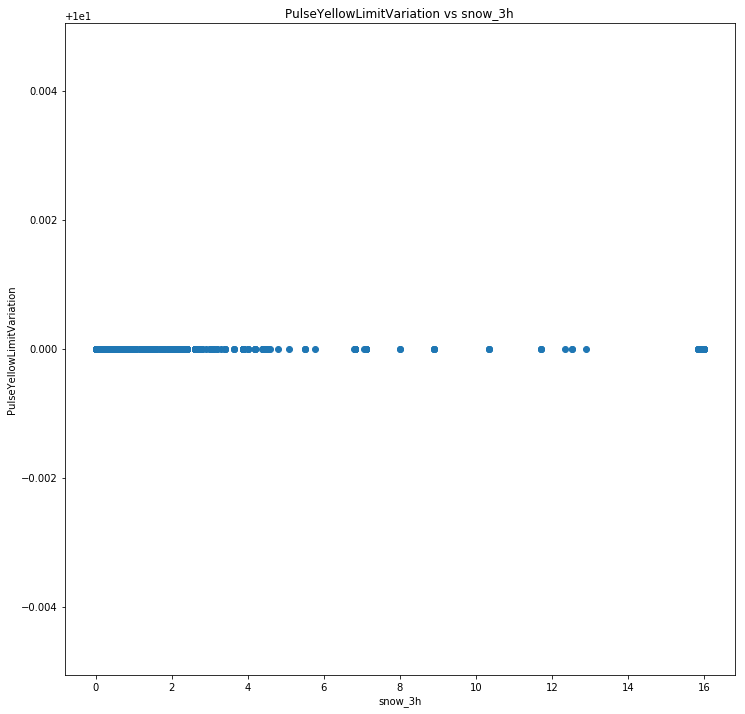

PulseYellowLimitVariation snow_3h nan
STARTING  snow_24h PulseYellowLimitVariation


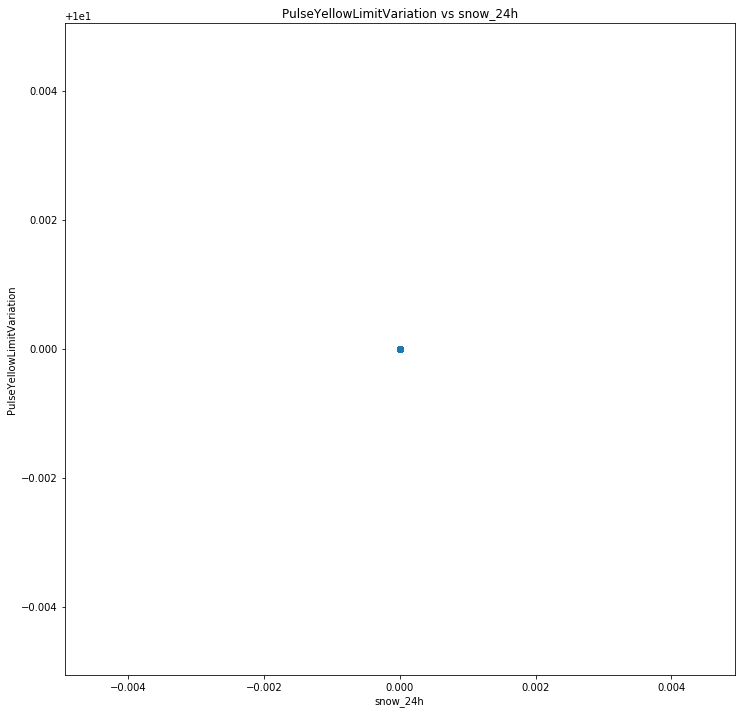

PulseYellowLimitVariation snow_24h nan
STARTING  snow_today PulseYellowLimitVariation


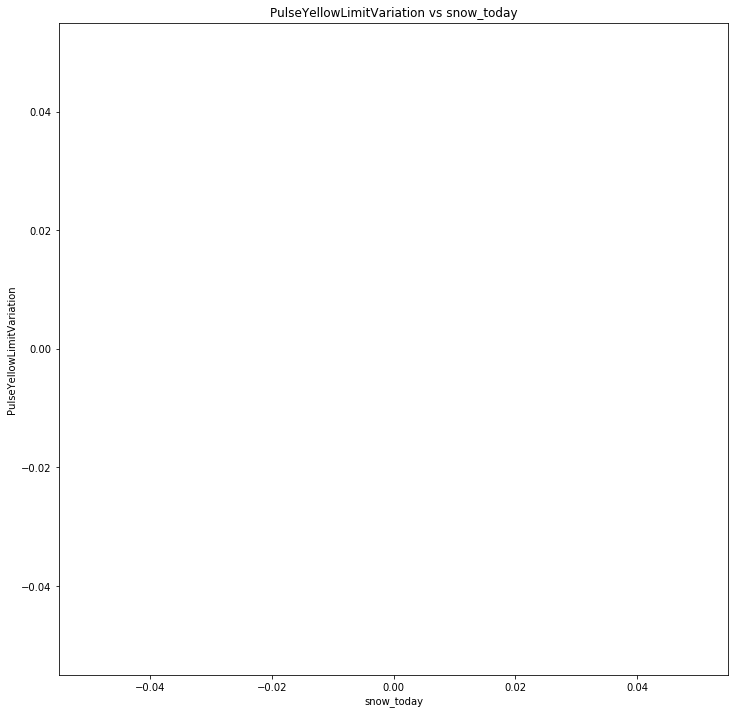

PulseYellowLimitVariation snow_today nan
STARTING  clouds_all PulseYellowLimitVariation


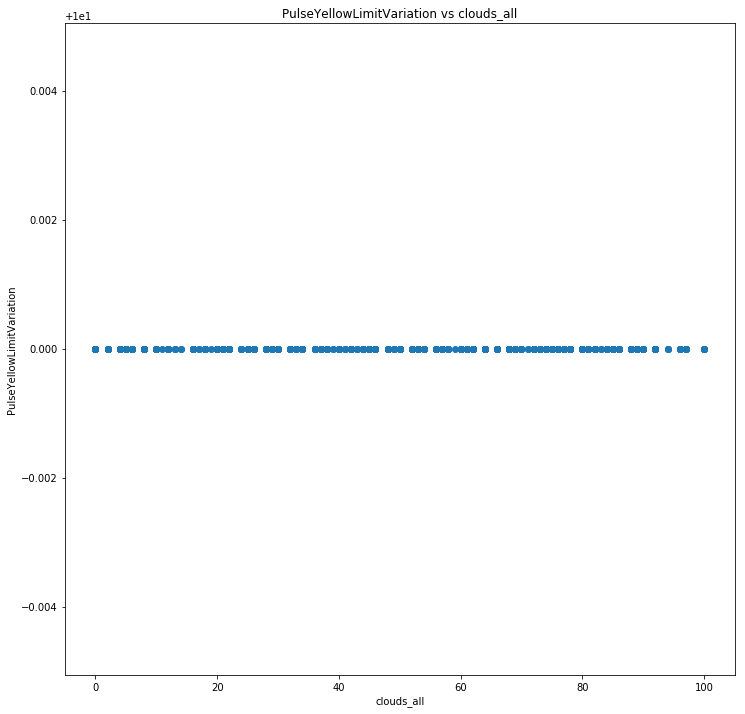

PulseYellowLimitVariation clouds_all nan


In [28]:
xs = list()
ys = list()
ccs = list()
vector_len = list()

for i in interesting_columns_patient:
    for j in interesting_columns_weather:
        print("STARTING ", j, i)
        
        non_nan = [not np.isnan(row[i]) and not np.isnan(row[j]) for index, row in data.iterrows()]

        plt.gcf().set_size_inches(12,12)
        plt.scatter(data[j][non_nan], data[i][non_nan])
        plt.title(i+' vs '+j)
        plt.xlabel(j)
        plt.ylabel(i)
        plt.show()
        
        cc = np.corrcoef(data[j][non_nan], data[i][non_nan])[0][1]
        print(i, j, cc)

        xs.append(j)
        ys.append(i)

        ccs.append(cc)
        vector_len.append(np.sum(non_nan))

In [16]:
order = np.argsort(-np.abs(ccs))
corr_df = pd.DataFrame(columns=["Weather","Health","Correlation","Non-NAN values"])
for i in order:
    corr_df = corr_df.append({
        "Weather": xs[i],
        "Health": ys[i],
        "Correlation": ccs[i],
        "Non-NAN values": vector_len[i]
    }, ignore_index=True)

NameError: name 'ccs' is not defined

In [17]:
corr_df.to_csv("../correlations.csv")

NameError: name 'corr_df' is not defined

In [26]:
y

0       97.0
1       98.0
2       95.0
3       96.0
4       95.0
7       95.0
8       96.0
9       94.0
10      97.0
11      94.0
12      96.0
14      95.0
16      97.0
17      98.0
18      98.0
19      93.0
20      95.0
21      96.0
22      95.0
23      96.0
24      97.0
25      95.0
26      96.0
27      96.0
28      95.0
29      95.0
30      92.0
31      90.0
33      92.0
34      94.0
        ... 
6781    95.0
6783    98.0
6786    97.0
6787    97.0
6788    98.0
6789    99.0
6790    98.0
6791    91.0
6792    91.0
6793    91.0
6794    92.0
6795    90.0
6797    90.0
6798    92.0
6799    92.0
6801    91.0
6802    99.0
6803    92.0
6804    90.0
6805    90.0
6806    90.0
6807    89.0
6809    89.0
6810    90.0
6811    89.0
6812    90.0
6813    90.0
6814    90.0
6815    89.0
6817    91.0
Name: SO2, Length: 3206, dtype: float64

In [29]:
#from sklearn.linear import LinearRegression
import statsmodels.api as sm

ccs_lr = list()
vector_len_lr = list()

p = 0.05
bonf_corr_p = p / (len(interesting_columns_patient)*len(interesting_columns_weather))

print(p, bonf_corr_p)

for i in interesting_columns_patient:
    for j in interesting_columns_weather:
        print("============= STARTING ", j, i, "====================")
        
        non_nan = [not np.isnan(row[i]) and not np.isnan(row[j]) for index, row in data.iterrows()]
        
        x = list(data[j][non_nan])
        y = list(data[i][non_nan])

        if len(x) > 2:
            mod = sm.OLS(y, x)
            res = mod.fit()
            cc = res.conf_int(p)
            cc2 = res.conf_int(bonf_corr_p)
            print("Samples: ", len(x))
            print(cc)
            print(cc2)
        else:
            print("Not enough samples: ",len(x))

0.05 0.00012315270935960593
============= STARTING  temp SO2 ====================
Samples:  3206
[[0.32728888 0.32994328]]
[[0.32601376 0.33121841]]
============= STARTING  pressure SO2 ====================
Samples:  3206
[[0.09017933 0.09089907]]
[[0.08983358 0.09124483]]
============= STARTING  humidity SO2 ====================
Samples:  3206
[[1.0507436  1.06537013]]
[[1.04371726 1.07239648]]
============= STARTING  wind_speed SO2 ====================
Samples:  3206
[[17.244432   18.30079813]]
[[16.73697116 18.80825897]]
============= STARTING  wind_deg SO2 ====================
Samples:  3206
[[0.37627194 0.38925741]]
[[0.37003394 0.39549542]]
============= STARTING  rain_1h SO2 ====================
Samples:  3206
[[37.7368876  72.06222164]]
[[21.24756401 88.55154523]]
============= STARTING  rain_3h SO2 ====================
Samples:  3206
[[5.68855522 6.78295813]]
[[5.16282214 7.30869121]]
============= STARTING  rain_24h SO2 ====================
Samples:  3206
[[0. 0.]]
[[0. 0.]]


Samples:  3578
[[0.42043559 0.44406237]]
[[0.40908773 0.45541024]]
============= STARTING  wind_deg Q4 ====================
Samples:  3578
[[0.00891469 0.00922917]]
[[0.00876364 0.00938022]]
============= STARTING  rain_1h Q4 ====================
Samples:  3578
[[0.89359045 1.69654384]]
[[0.5079346  2.08219969]]
============= STARTING  rain_3h Q4 ====================
Samples:  3578
[[0.13802764 0.16309232]]
[[0.12598916 0.1751308 ]]
============= STARTING  rain_24h Q4 ====================
Samples:  3578
[[0. 0.]]
[[0. 0.]]
============= STARTING  rain_today Q4 ====================
Not enough samples:  0
============= STARTING  snow_1h Q4 ====================
Samples:  3578
[[0. 0.]]
[[0. 0.]]
============= STARTING  snow_3h Q4 ====================
Samples:  3578
[[0.30082336 0.40977626]]
[[0.24849363 0.46210598]]
============= STARTING  snow_24h Q4 ====================
Samples:  3578
[[0. 0.]]
[[0. 0.]]
============= STARTING  snow_today Q4 ====================
Not enough samples:  0
=

Samples:  215
[[0. 0.]]
[[0. 0.]]
============= STARTING  rain_today CQ2 ====================
Not enough samples:  0
============= STARTING  snow_1h CQ2 ====================
Samples:  215
[[0. 0.]]
[[0. 0.]]
============= STARTING  snow_3h CQ2 ====================
Samples:  215
[[0.06524146 0.43303676]]
[[-0.11579531  0.61407353]]
============= STARTING  snow_24h CQ2 ====================
Samples:  215
[[0. 0.]]
[[0. 0.]]
============= STARTING  snow_today CQ2 ====================
Not enough samples:  0
============= STARTING  clouds_all CQ2 ====================
Samples:  215
[[0.02583896 0.03233594]]
[[0.022641   0.03553389]]
============= STARTING  temp CQ3 ====================
Samples:  215
[[0.00778066 0.00907047]]
[[0.00714579 0.00970534]]
============= STARTING  pressure CQ3 ====================
Samples:  215
[[0.00213583 0.00248994]]
[[0.00196152 0.00266425]]
============= STARTING  humidity CQ3 ====================
Samples:  215
[[0.02520859 0.0295123 ]]
[[0.02309021 0.03163068]

Samples:  215
[[0. 0.]]
[[0. 0.]]
============= STARTING  snow_today CQ7 ====================
Not enough samples:  0
============= STARTING  clouds_all CQ7 ====================
Samples:  215
[[0.0263255  0.03393907]]
[[0.02257793 0.03768663]]
============= STARTING  temp CQ8 ====================
Samples:  56
[[0.01129964 0.0130932 ]]
[[0.01034699 0.01404585]]
============= STARTING  pressure CQ8 ====================
Samples:  56
[[0.00313466 0.00362713]]
[[0.00287308 0.0038887 ]]
============= STARTING  humidity CQ8 ====================
Samples:  56
[[0.04123608 0.04867154]]
[[0.03728672 0.0526209 ]]
============= STARTING  wind_speed CQ8 ====================
Samples:  56
[[0.53724741 0.82191489]]
[[0.3860458  0.97311651]]
============= STARTING  wind_deg CQ8 ====================
Samples:  56
[[0.01159138 0.01690323]]
[[0.00876999 0.01972462]]
============= STARTING  rain_1h CQ8 ====================
Samples:  56
[[-5.43967602 13.33441286]]
[[-15.41156553  23.30630237]]
============= ST

Samples:  1714
[[0.30323297 0.44575027]]
[[0.2346663  0.51431694]]
============= STARTING  snow_24h manual_Triage ====================
Samples:  1714
[[0. 0.]]
[[0. 0.]]
============= STARTING  snow_today manual_Triage ====================
Not enough samples:  0
============= STARTING  clouds_all manual_Triage ====================
Samples:  1714
[[0.02651694 0.02877951]]
[[0.0254284  0.02986806]]
============= STARTING  temp SpO2ReferenceValue ====================
Samples:  3663
[[0.33005478 0.33097849]]
[[0.32961113 0.33142213]]
============= STARTING  pressure SpO2ReferenceValue ====================
Samples:  3663
[[0.0909746  0.09121288]]
[[0.09086016 0.09132732]]
============= STARTING  humidity SpO2ReferenceValue ====================
Samples:  3663
[[1.05769915 1.06924454]]
[[1.05215413 1.07478956]]
============= STARTING  wind_speed SpO2ReferenceValue ====================
Samples:  3663
[[17.30352041 18.25392726]]
[[16.84705966 18.71038801]]
============= STARTING  wind_deg SpO2R

Samples:  3663
[[0.49206336 0.50769628]]
[[0.48455519 0.51520445]]
============= STARTING  rain_1h PulseRedLimitUpper ====================
Samples:  3663
[[52.82284115 95.97543856]]
[[ 32.09754079 116.70073892]]
============= STARTING  rain_3h PulseRedLimitUpper ====================
Samples:  3663
[[7.28910261 8.58164501]]
[[6.66832123 9.20242639]]
============= STARTING  rain_24h PulseRedLimitUpper ====================
Samples:  3663
[[0. 0.]]
[[0. 0.]]
============= STARTING  rain_today PulseRedLimitUpper ====================
Not enough samples:  0
============= STARTING  snow_1h PulseRedLimitUpper ====================
Samples:  3663
[[0. 0.]]
[[0. 0.]]
============= STARTING  snow_3h PulseRedLimitUpper ====================
Samples:  3663
[[13.80764881 18.47580587]]
[[11.56562949 20.71782519]]
============= STARTING  snow_24h PulseRedLimitUpper ====================
Samples:  3663
[[0. 0.]]
[[0. 0.]]
============= STARTING  snow_today PulseRedLimitUpper ====================
Not enough

In [114]:
output_exists = np.where(~np.isnan(data["manual_Triage"]))[0]

all_X = data.iloc[output_exists,:][interesting_columns_weather]
all_Y = data.iloc[output_exists,:]["manual_Triage"]

In [115]:
all_X=all_X.fillna(0)

In [118]:
#all_Y

In [150]:
from sklearn import tree
from sklearn import ensemble
from sklearn import linear_model
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold

all_models = {
    "DT-default": tree.DecisionTreeClassifier(), # TODO Let's start like that. We will configure later.
    "RF-10Est": ensemble.RandomForestClassifier(n_estimators=10, random_state=0),
    "RF-100Est": ensemble.RandomForestClassifier(n_estimators=100, random_state=0),
    "GBT-def": ensemble.GradientBoostingClassifier(random_state=0),
    "LR-def" : linear_model.LogisticRegression(solver='liblinear', multi_class='ovr'),
}

for m in all_models:
    kfold_split = KFold(n_splits=10, random_state=0, shuffle=True)
    all_splits = kfold_split.split(all_X)
    
    model = all_models[m]
    
    train_results = list()
    test_results = list()
    for cur_train_index, cur_test_index in all_splits:
        cur_X_train = all_X.iloc[cur_train_index,:]
        cur_X_test = all_X.iloc[cur_test_index,:]
        cur_Y_train = all_Y.iloc[cur_train_index]
        cur_Y_test = all_Y.iloc[cur_test_index]    

        model = model.fit(cur_X_train, cur_Y_train)
        test_res = model.predict(cur_X_test)
        train_res = model.predict(cur_X_train)
        
        train_results.append(accuracy_score(train_res, cur_Y_train))
        test_results.append(accuracy_score(test_res, cur_Y_test))        
        print(confusion_matrix(test_res, cur_Y_test))
    print("============== Model: ", m)
    print("TRAIN: ", np.mean(train_results))
    print("TEST: ", np.mean(test_results))

[[56 33  9]
 [19 32  3]
 [ 7  5  8]]
[[60 39 10]
 [21 24  2]
 [ 5  5  6]]
[[64 27  9]
 [28 21  4]
 [ 7  7  5]]
[[59 37  8]
 [18 26  3]
 [ 8  5  8]]
[[67 23  8]
 [25 25  8]
 [ 9  3  3]]
[[60 22 15]
 [26 33  6]
 [ 5  1  3]]
[[61 30  8]
 [30 29  2]
 [ 9  2  0]]
[[55 32  8]
 [26 34  8]
 [ 3  2  3]]
[[54 25  6]
 [35 23  5]
 [11  7  5]]
[[61 32 11]
 [21 25  5]
 [ 5  7  4]]
============== Model:  DT-default
TRAIN:  0.8870085226532443
TEST:  0.5332483340133279
[[63 36  7]
 [11 32  6]
 [ 8  2  7]]
[[61 37 10]
 [20 26  1]
 [ 5  5  7]]
[[64 24 10]
 [32 27  3]
 [ 3  4  5]]
[[61 33  8]
 [20 34  3]
 [ 4  1  8]]
[[62 19  9]
 [34 30  7]
 [ 5  2  3]]
[[63 25 14]
 [25 30  7]
 [ 3  1  3]]
[[67 37  5]
 [26 23  5]
 [ 7  1  0]]
[[56 33 11]
 [26 33  4]
 [ 2  2  4]]
[[64 26  8]
 [28 22  5]
 [ 8  7  3]]
[[60 34 12]
 [22 24  3]
 [ 5  6  5]]
============== Model:  RF-10Est
TRAIN:  0.8730711812604179
TEST:  0.5524581803345573
[[63 40  8]
 [12 28  6]
 [ 7  2  6]]
[[63 42 12]
 [20 24  1]
 [ 3  2  5]]
[[70 24  6]
 [

In [125]:
?ensemble.RandomForestClassifier

In [147]:
cur_Y_train

1       3.0
2       3.0
3       3.0
4       1.0
7       1.0
8       1.0
9       1.0
10      3.0
12      1.0
13      1.0
14      1.0
17      1.0
18      1.0
19      3.0
21      5.0
22      3.0
23      1.0
24      1.0
25      1.0
26      1.0
28      1.0
29      1.0
33      1.0
34      1.0
37      1.0
39      1.0
42      1.0
43      3.0
44      5.0
48      3.0
       ... 
6725    3.0
6726    1.0
6727    1.0
6731    1.0
6732    1.0
6733    1.0
6736    1.0
6737    1.0
6738    1.0
6739    1.0
6740    1.0
6741    1.0
6744    1.0
6747    3.0
6748    3.0
6769    1.0
6789    1.0
6791    1.0
6792    1.0
6793    1.0
6794    1.0
6795    1.0
6805    1.0
6806    1.0
6807    1.0
6810    1.0
6812    1.0
6813    1.0
6814    1.0
6815    1.0
Name: manual_Triage, Length: 1543, dtype: float64

In [146]:
np.sum(cur_Y_train == 1), np.sum(cur_Y_train == 3), np.sum(cur_Y_train == 5)

AttributeError: module 'numpy' has no attribute 'isna'

In [148]:
np.sum(cur_Y_train == 1) / len(cur_Y_train == 3)

0.5366169799092677

In [152]:
all_models = {
    "DT-default": tree.DecisionTreeClassifier(), # TODO Let's start like that. We will configure later.
    "DT-": tree.DecisionTreeClassifier(), # TODO Let's start like that. We will configure later.
    "RF-10Est": ensemble.RandomForestClassifier(n_estimators=10, random_state=0),
    "RF-100Est": ensemble.RandomForestClassifier(n_estimators=100, random_state=0),
    "GBT-def": ensemble.GradientBoostingClassifier(random_state=0),
    "LR-def" : linear_model.LogisticRegression(solver='liblinear', multi_class='ovr'),
}

for m in all_models:
    kfold_split = KFold(n_splits=10, random_state=0, shuffle=True)
    all_splits = kfold_split.split(all_X)
    
    model = all_models[m]
    
    train_results = list()
    test_results = list()
    for cur_train_index, cur_test_index in all_splits:
        cur_X_train = all_X.iloc[cur_train_index,:]
        cur_X_test = all_X.iloc[cur_test_index,:]
        cur_Y_train = all_Y.iloc[cur_train_index]
        cur_Y_test = all_Y.iloc[cur_test_index]    

        model = model.fit(cur_X_train, cur_Y_train>1)
        test_res = model.predict(cur_X_test)
        train_res = model.predict(cur_X_train)
        
        train_results.append(accuracy_score(train_res, cur_Y_train>1))
        test_results.append(accuracy_score(test_res, cur_Y_test>1))        
        #print(confusion_matrix(test_res, cur_Y_test>1))
    print("============== Model: ", m)
    print("TRAIN: ", np.mean(train_results))
    print("TEST: ", np.mean(test_results))

============== Model:  DT-default
TRAIN:  0.9028908849891522
TEST:  0.5939344485244118
============== Model:  RF-10Est
TRAIN:  0.8906389930509148
TEST:  0.6026451788385694
============== Model:  RF-100Est
TRAIN:  0.9028908849891522
TEST:  0.5875118999048008
============== Model:  GBT-def
TRAIN:  0.7446519699441769
TEST:  0.5980008159934721
============== Model:  LR-def
TRAIN:  0.5563980000891017
TEST:  0.5391132870937032


In [153]:
?tree.DecisionTreeClassifier

In [189]:
from sklearn import manifold

excluded_columns = ("wind_deg", )

tsne_model = manifold.TSNE(perplexity=30, random_state=0)
X = (all_X - all_X.mean())/all_X.std()
X = X[[c for c in X.columns if c not in excluded_columns]]
X.fillna(0, inplace=True)

Y = tsne_model.fit_transform(X)

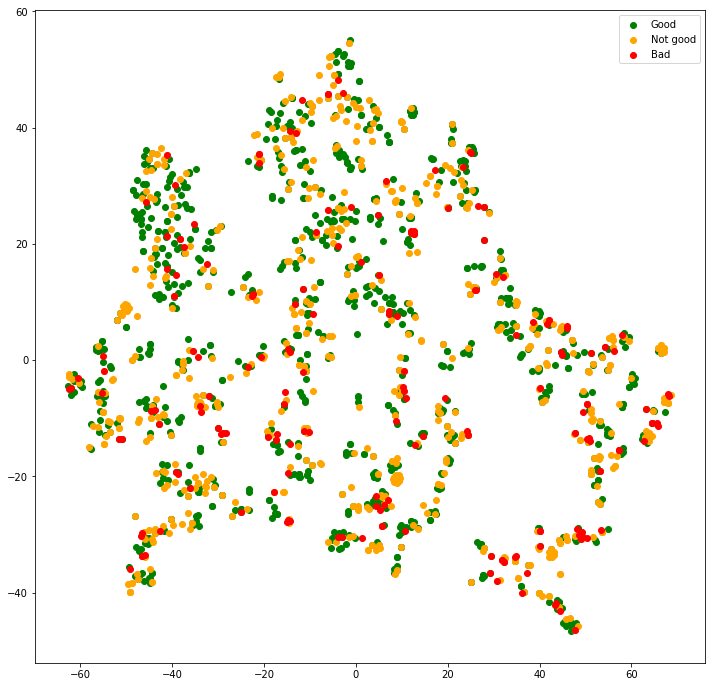

In [190]:
plt.gcf().set_size_inches(12,12)
plt.scatter(Y[all_Y==1,0], Y[all_Y==1,1], c='g')
plt.scatter(Y[all_Y==3,0], Y[all_Y==3,1], c='orange')
plt.scatter(Y[all_Y==5,0], Y[all_Y==5,1], c='r')
plt.legend(['Good','Not good', 'Bad'])
plt.show()

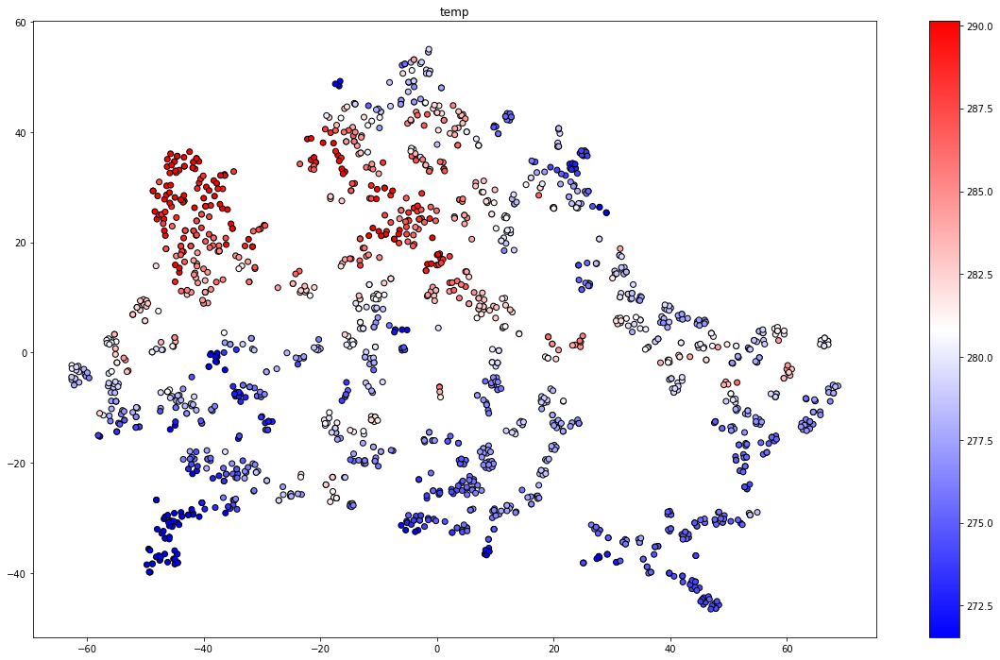

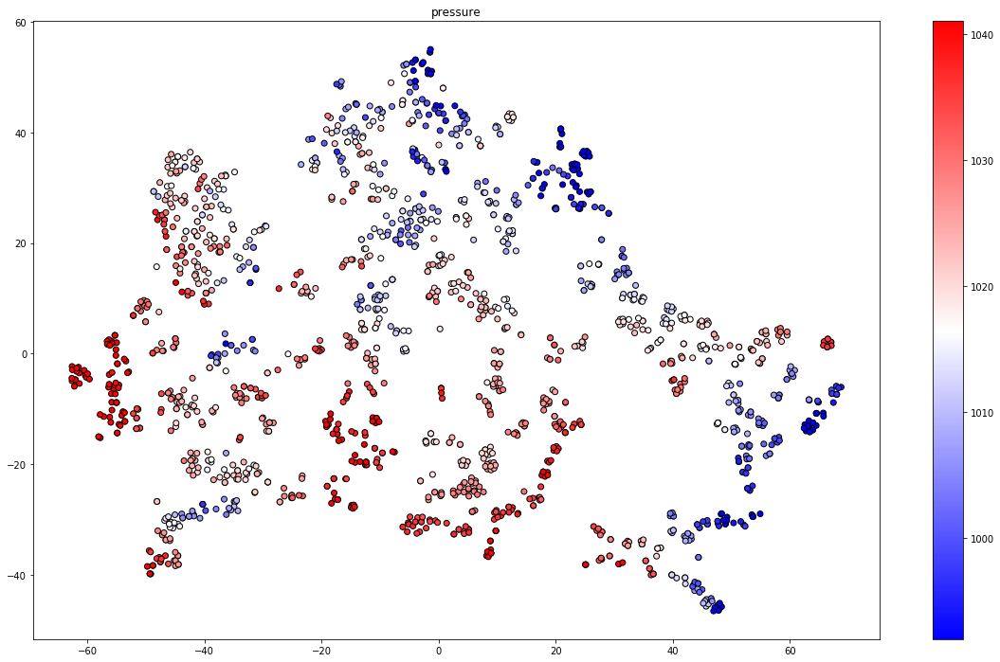

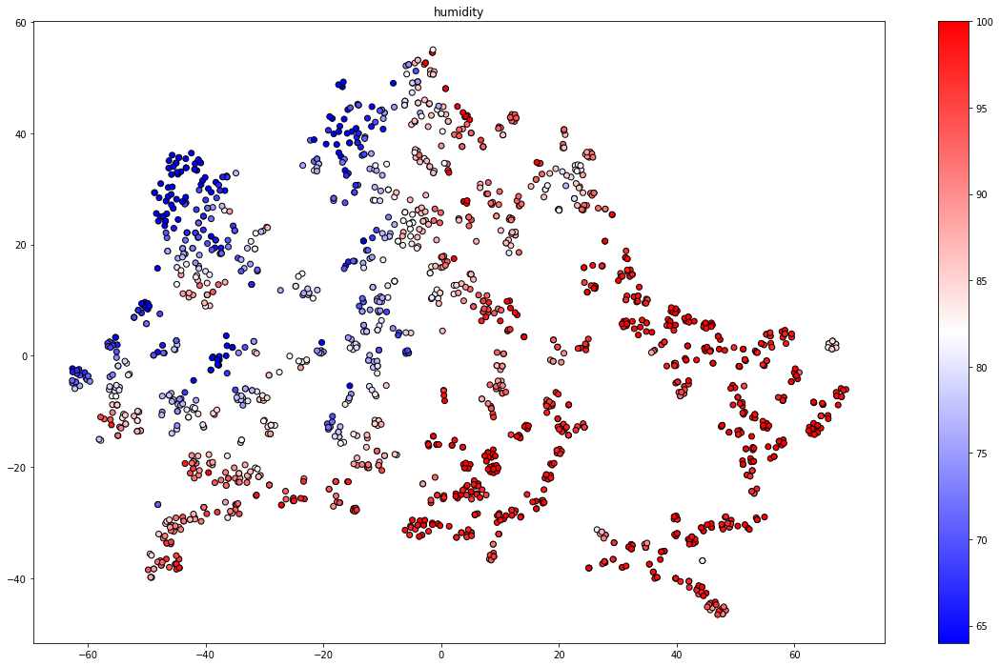

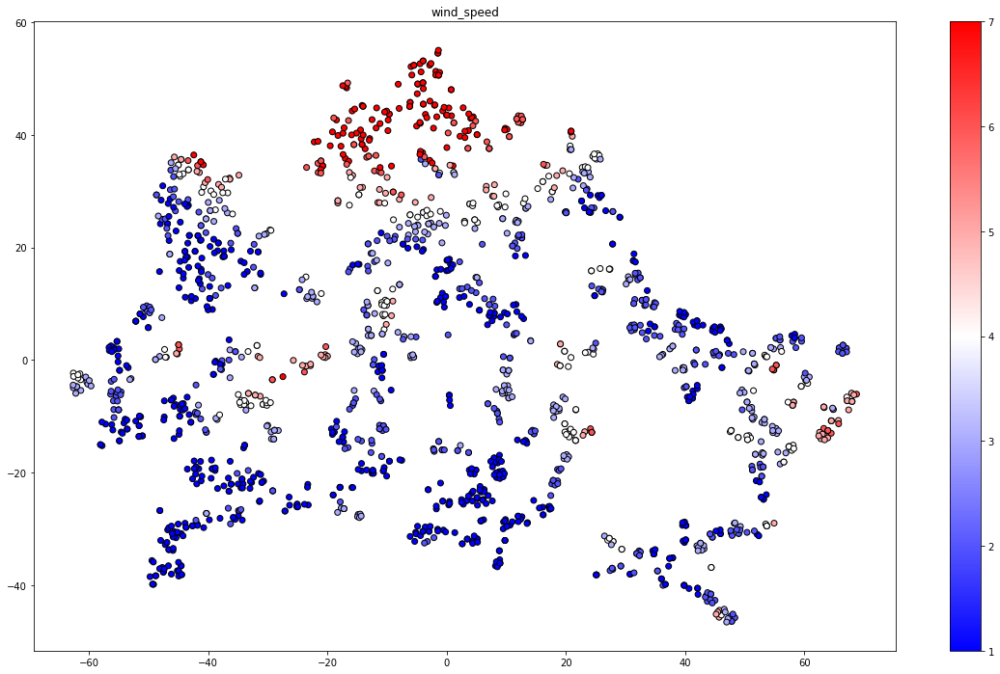

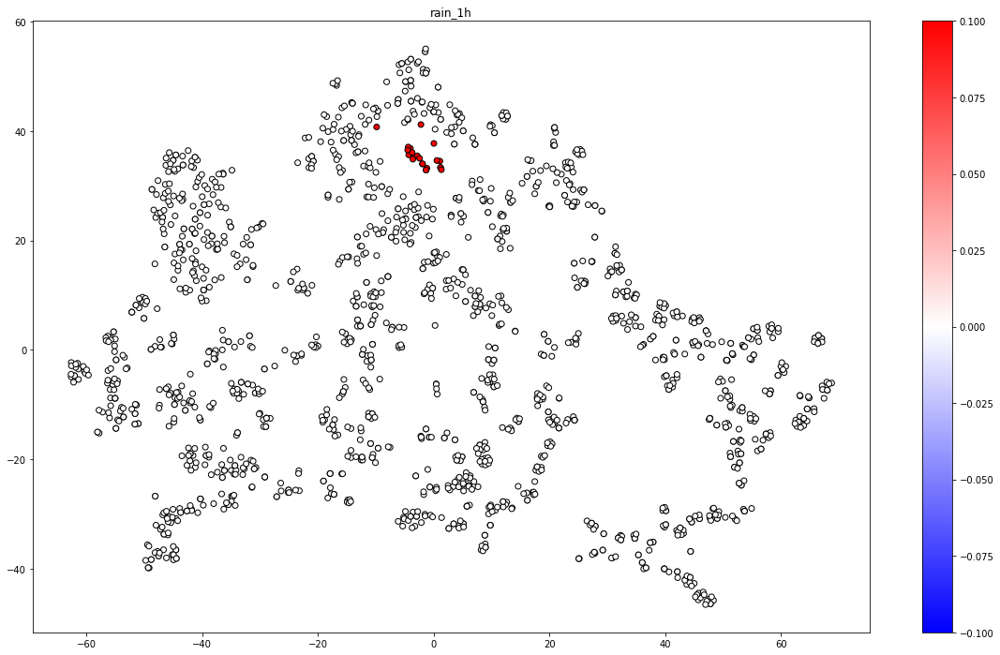

...

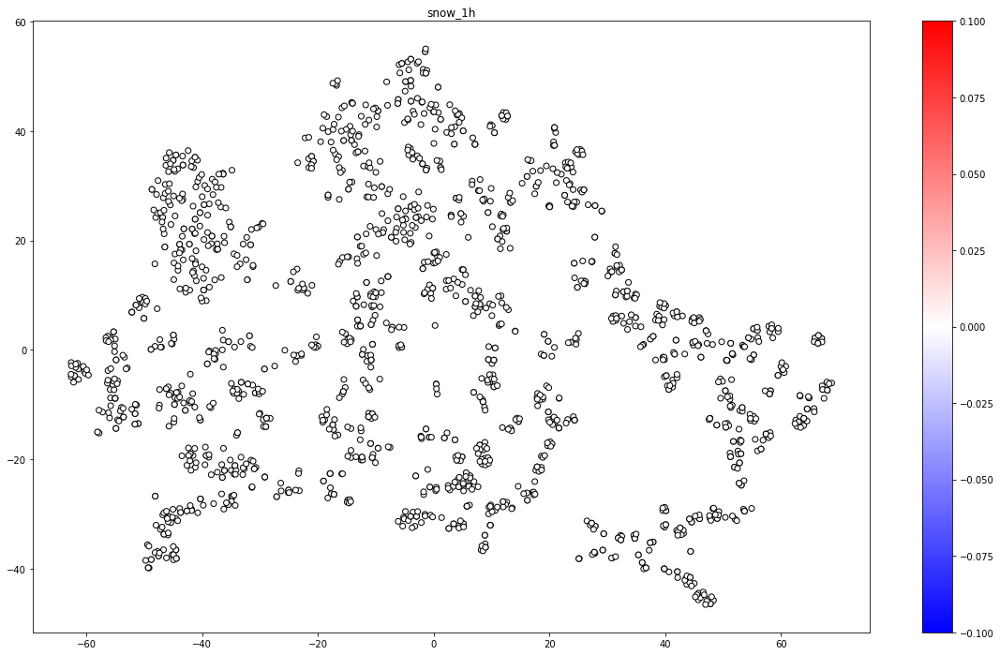

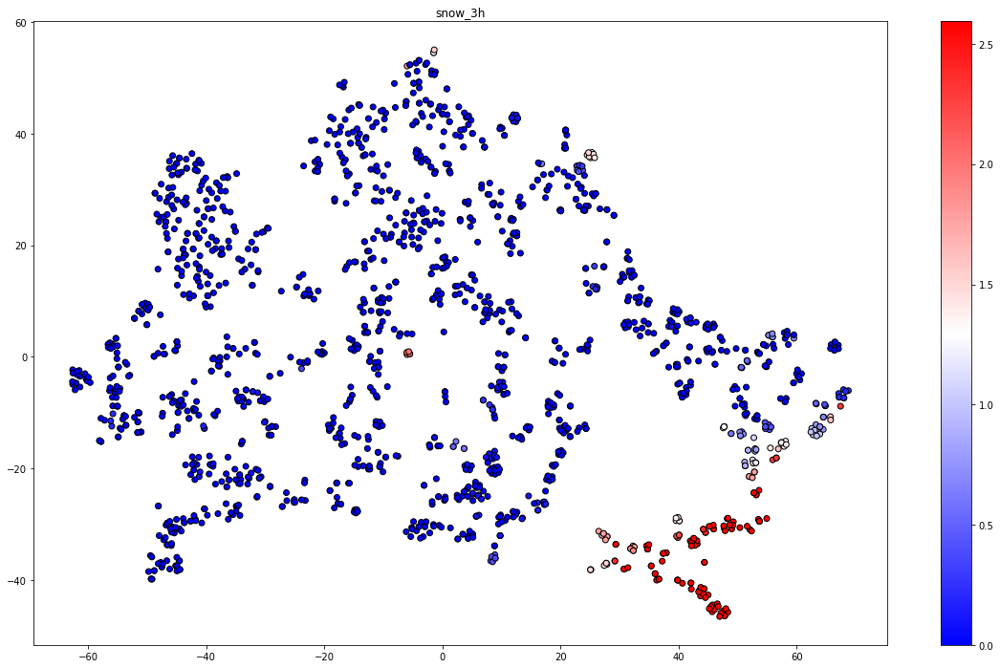

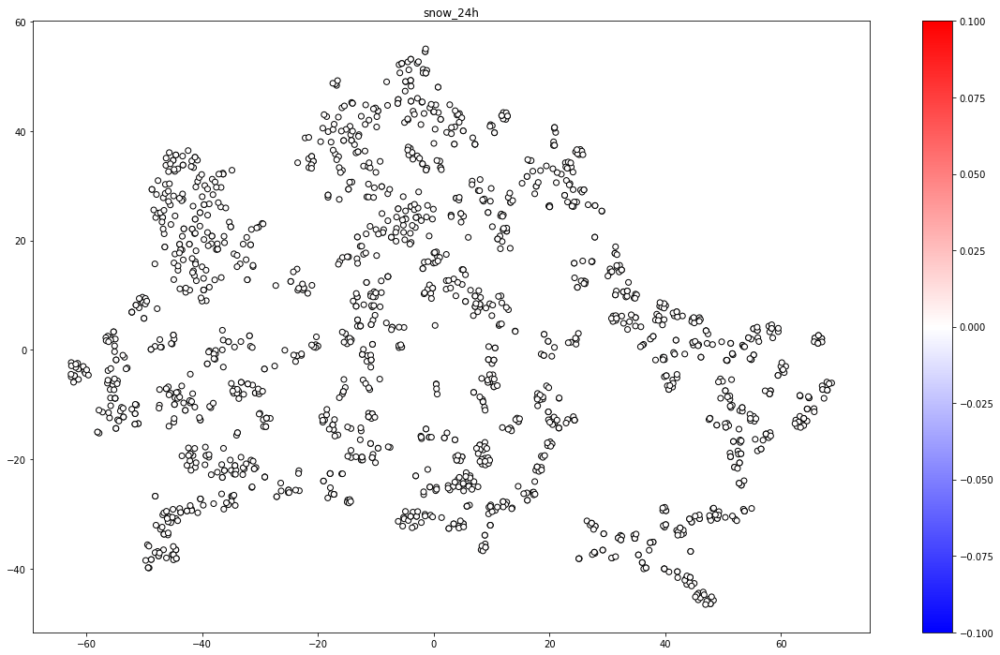

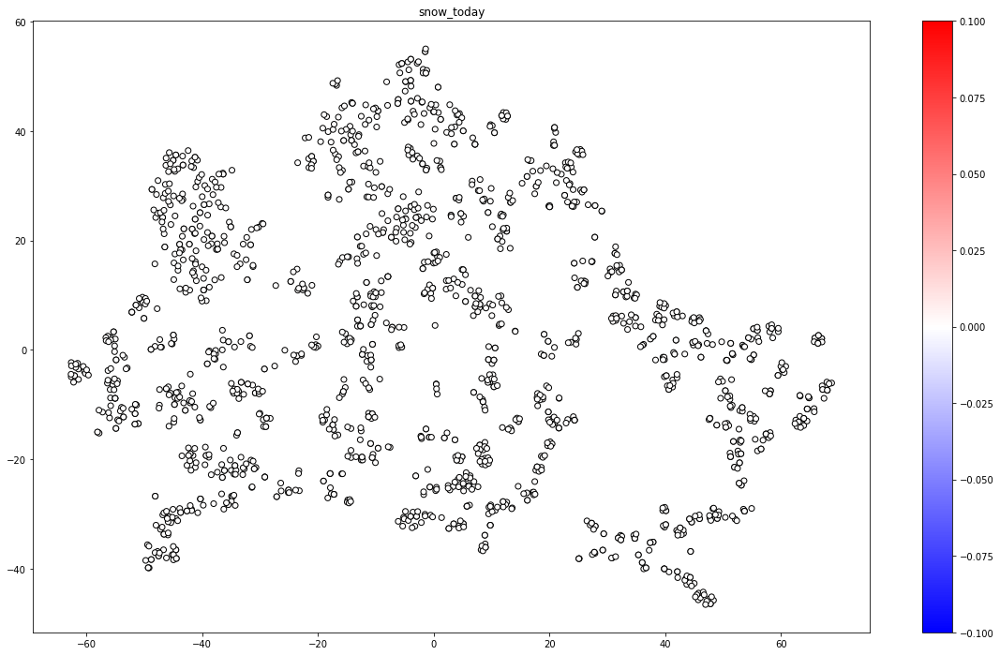

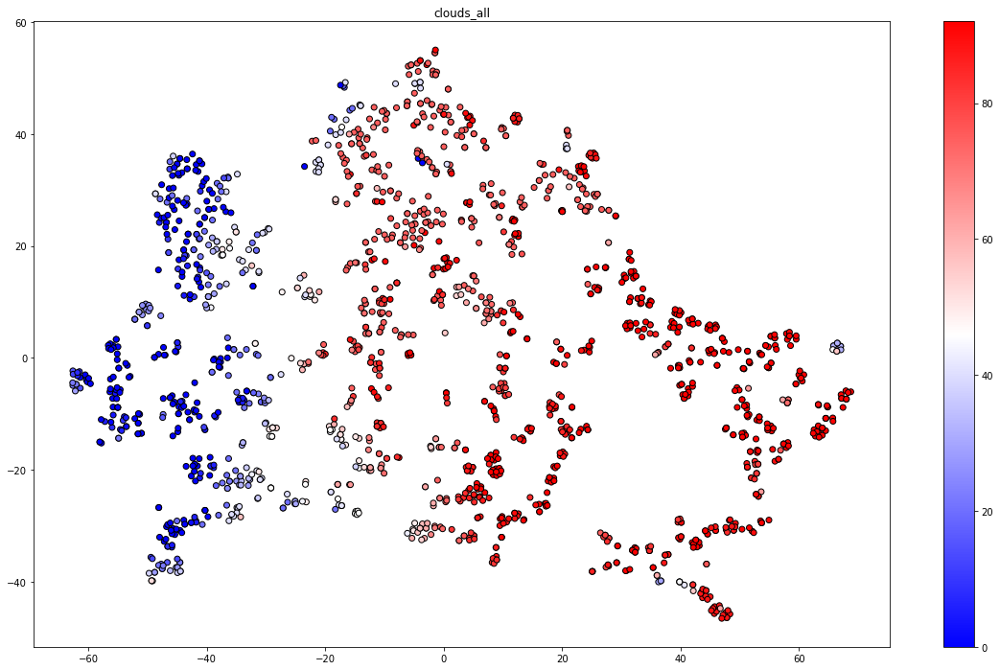

In [191]:
for c in X.columns:
    plt.gcf().set_size_inches(20,12)
    z_min = np.percentile(cur_X_train[c], 5)
    z_max = np.percentile(cur_X_train[c], 95)
    p = plt.scatter(Y[:,0], Y[:,1], c=all_X[c], vmin=z_min, vmax=z_max, cmap='bwr', edgecolor='k')
    plt.colorbar(p)
    plt.title(c)
    plt.show()

In [251]:
from sklearn import manifold

excluded_columns = ("wind_deg", "manual_Triage")

tsne_model = manifold.TSNE(perplexity=30, random_state=0)

X_data = data[interesting_columns_patient + interesting_columns_weather]
Y_data = data["manual_Triage"]

X_all_columns = (X_data - X_data.mean())/X_data.std()
X_all_columns = X_all_columns[[c for c in X_all_columns.columns if c not in excluded_columns]]
X_all_columns.fillna(0, inplace=True)

Y_all_columns = tsne_model.fit_transform(X_all_columns)

In [193]:
plt.gcf().set_size_inches(12,12)
plt.scatter(Y_all_columns[all_Y==1,0], Y_all_columns[all_Y==1,1], c='g')
plt.scatter(Y_all_columns[all_Y==3,0], Y_all_columns[all_Y==3,1], c='orange')
plt.scatter(Y_all_columns[all_Y==5,0], Y_all_columns[all_Y==5,1], c='r')
plt.legend(['Good','Not good', 'Bad'])
plt.show()

IndexError: boolean index did not match indexed array along dimension 0; dimension is 6935 but corresponding boolean dimension is 1714

<Figure size 864x864 with 0 Axes>

In [ ]:
for c in X_all.columns:
    plt.gcf().set_size_inches(20,12)
    z_min = np.percentile(X_all[c], 5)
    z_max = np.percentile(X_all[c], 95)
    p = plt.scatter(Y_all_columns[:,0], Y_all_columns[:,1],
                    c=X_data[c], vmin=z_min, vmax=z_max, cmap='bwr', edgecolor='k')
    plt.colorbar(p)
    plt.title(c)
    plt.show()

In [195]:
#plt.scatter(Y_all_columns[:,0], Y_all_columns[:,1], c='g')

In [196]:
Y_all_columns[all_Y==1,0]

IndexError: boolean index did not match indexed array along dimension 0; dimension is 6935 but corresponding boolean dimension is 1714

In [199]:
Y_all_columns.shape

(6935, 2)

In [208]:
np.sum(np.isnan(Y_data))

4203

In [206]:
X_data.shape

(6935, 43)

In [234]:
#(all_data["question_Triage"]==1)&(all_data["pulse_Triage"]==1)&(all_data["spo2_Triage"]==1)

grouping_columns =  ["question_Triage","pulse_Triage","spo2_Triage","manual_Triage"]

triage_counts = all_data[grouping_columns+['Region']].fillna('NA').groupby(grouping_columns).count()
triage_counts.reset_index(level=[0,1,2,3], inplace=True)
triage_counts

,question_Triage,pulse_Triage,spo2_Triage,manual_Triage,Region
0,1,1,1,1,707
1,1,1,1,3,14
2,1,1,1,5,1
3,1,1,1,NA,1303
4,1,1,3,1,20
5,1,1,3,3,18
6,1,1,3,NA,33
7,1,1,5,1,11
8,1,1,5,3,7
9,1,1,5,5,3


In [220]:
triage_counts.columns.get_level_values(0)

Index(['Region'], dtype='object')

In [235]:
all_Y

1       3.0
2       3.0
3       3.0
4       1.0
7       1.0
8       1.0
9       1.0
10      3.0
12      1.0
13      1.0
14      1.0
16      3.0
17      1.0
18      1.0
19      3.0
21      5.0
22      3.0
23      1.0
24      1.0
25      1.0
26      1.0
28      1.0
29      1.0
30      1.0
33      1.0
34      1.0
37      1.0
39      1.0
41      1.0
42      1.0
       ... 
6727    1.0
6730    1.0
6731    1.0
6732    1.0
6733    1.0
6736    1.0
6737    1.0
6738    1.0
6739    1.0
6740    1.0
6741    1.0
6744    1.0
6747    3.0
6748    3.0
6768    1.0
6769    1.0
6789    1.0
6791    1.0
6792    1.0
6793    1.0
6794    1.0
6795    1.0
6805    1.0
6806    1.0
6807    1.0
6810    1.0
6812    1.0
6813    1.0
6814    1.0
6815    1.0
Name: manual_Triage, Length: 1714, dtype: float64

In [320]:

from sklearn import dummy
all_models = {
    "Dummy" : dummy.DummyClassifier(),
    "DT-default": tree.DecisionTreeClassifier(), # TODO Let's start like that. We will configure later.
    ##"DT-": tree.DecisionTreeClassifier(), # TODO Let's start like that. We will configure later.
    "RF-10Est": ensemble.RandomForestClassifier(n_estimators=10, random_state=0),
    "RF-100Est": ensemble.RandomForestClassifier(n_estimators=100, random_state=0),
    "GBT-def": ensemble.GradientBoostingClassifier(random_state=0),
    "LR-def" : linear_model.LogisticRegression(solver='liblinear', multi_class='ovr'),
}

for cur_triage in ["question_Triage","pulse_Triage","spo2_Triage"]:
    output_exists = np.where(~np.isnan(data[cur_triage]))[0]

    all_X = data.iloc[output_exists,:][interesting_columns_weather]
    all_Y = data.iloc[output_exists,:][[cur_triage]]
    
    all_X.fillna(0,inplace=True)

    for m in all_models:
        kfold_split = KFold(n_splits=10, random_state=0, shuffle=True)
        all_splits = kfold_split.split(all_X)

        model = all_models[m]

        train_results = list()
        test_results = list()
        precision = list()
        recall = list()
        f1 = list()
        tp = list()
        fp = list()
        tn = list()
        fn = list()
        for cur_train_index, cur_test_index in all_splits:
            cur_X_train = all_X.iloc[cur_train_index,:]
            cur_X_test = all_X.iloc[cur_test_index,:]
            cur_Y_train = np.ravel(all_Y.iloc[cur_train_index])
            cur_Y_test = np.ravel(all_Y.iloc[cur_test_index])    

            model = model.fit(cur_X_train, cur_Y_train)
            test_res = model.predict(cur_X_test)
            train_res = model.predict(cur_X_train)

            train_results.append(accuracy_score(train_res, cur_Y_train))
            test_results.append(accuracy_score(test_res, cur_Y_test))
            
            true_positive = np.sum((cur_Y_test > 1) & (test_res > 1))
            true_negative = np.sum((cur_Y_test == 1) & (test_res == 1))
            false_positive = np.sum((cur_Y_test == 1) & (test_res > 1))
            false_negative = np.sum((cur_Y_test > 1) & (test_res == 1))            
            
            tp.append(true_positive)
            tn.append(true_negative)
            fp.append(false_positive)
            fn.append(false_negative)
            
            if true_positive > 0 or false_positive>0:
                cur_precision = true_positive / (true_positive + false_positive)
            else:
                cur_precision = 0
                
            if true_positive > 0 or false_negative>0:
                cur_recall = true_positive / (true_positive + false_negative)
            else:
                cur_recall = 0
            
            if cur_precision > 0 or cur_recall > 0:
                cur_f1 = 2*cur_precision*cur_recall / (cur_precision + cur_recall)
            else:
                cur_f1 = 0
            
            precision.append(cur_precision)
            recall.append(cur_recall)
            f1.append(cur_f1)
            #print(confusion_matrix(test_res, cur_Y_test>1))
        if m == "Dummy":
            dummy_train_results = np.mean(train_results)
            dummy_test_results = np.mean(test_results)        
        print("============== Model: ", m, cur_triage, '=========')
        print("Num training samples: ", len(cur_Y_train))
        print("Num test samples: ", len(cur_Y_test))
        print("TRAIN: ", np.mean(train_results))
        print("TEST: ", np.mean(test_results))
        print("TRAIN (improved over dummy): ", np.mean(train_results)-dummy_train_results)
        print("TEST  (improved over dummy): ", np.mean(test_results)-dummy_test_results)
        print("True positive (avg over K-Fold): ", np.mean(tp))
        print("False positive (avg over K-Fold): ", np.mean(fp))
        print("True negative (avg over K-Fold): ", np.mean(tn))
        print("False negative (avg over K-Fold): ", np.mean(fn))        
        print("Precision: ", np.mean(precision))
        print("Recall: ", np.mean(recall))
        print("F1: ", np.mean(f1))

============== Model:  Dummy question_Triage =========
Num training samples:  3221
Num test samples:  357
TRAIN:  0.45046945414506123
TEST:  0.46450792607545816
TRAIN (improved over dummy):  0.0
TEST  (improved over dummy):  0.0
True positive (avg over K-Fold):  68.3
False positive (avg over K-Fold):  85.9
True negative (avg over K-Fold):  117.5
False negative (avg over K-Fold):  86.1
Precision:  0.4430013472177425
Recall:  0.4438868182371509
F1:  0.442770397352795
============== Model:  DT-default question_Triage =========
Num training samples:  3221
Num test samples:  357
TRAIN:  0.8514998235569756
TEST:  0.5433250395130119
TRAIN (improved over dummy):  0.4010303694119144
TEST  (improved over dummy):  0.07881711343755377
True positive (avg over K-Fold):  67.0
False positive (avg over K-Fold):  60.8
True negative (avg over K-Fold):  142.6
False negative (avg over K-Fold):  87.4
Precision:  0.5244831687716334
Recall:  0.4340438223991465
F1:  0.4742371886784985
============== Model:  RF

============== Model:  LR-def spo2_Triage =========
Num training samples:  2673
Num test samples:  296
TRAIN:  0.9087234341642192
TEST:  0.9087200837200837
TRAIN (improved over dummy):  0.07686862526350202
TEST  (improved over dummy):  0.0825166075166075
True positive (avg over K-Fold):  0.0
False positive (avg over K-Fold):  0.0
True negative (avg over K-Fold):  269.8
False negative (avg over K-Fold):  27.1
Precision:  0.0
Recall:  0.0
F1:  0.0


In [254]:
from sklearn import manifold

excluded_columns = ("wind_deg", )

all_X = data[interesting_columns_weather]

tsne_model = manifold.TSNE(perplexity=30, random_state=0)
X = (all_X - all_X.mean())/all_X.std()
X = X[[c for c in X.columns if c not in excluded_columns]]
X.fillna(0, inplace=True)

Y = tsne_model.fit_transform(X)

In [321]:
def plot_triage(col, Y = Y):
    all_Y = data[col]

    plt.gcf().set_size_inches(12,12)
    plt.scatter(Y[np.isnan(all_Y),0], Y[np.isnan(all_Y),1], c='k', alpha=0.5)
    plt.scatter(Y[all_Y==1,0], Y[all_Y==1,1], c='g', alpha=0.5)
    plt.scatter(Y[all_Y==3,0], Y[all_Y==3,1], c='orange', alpha=0.5)
    plt.scatter(Y[all_Y==5,0], Y[all_Y==5,1], c='r', alpha=0.5)
    plt.legend(['NA','Good','Not good', 'Bad'])
    plt.title(col)
    plt.show()

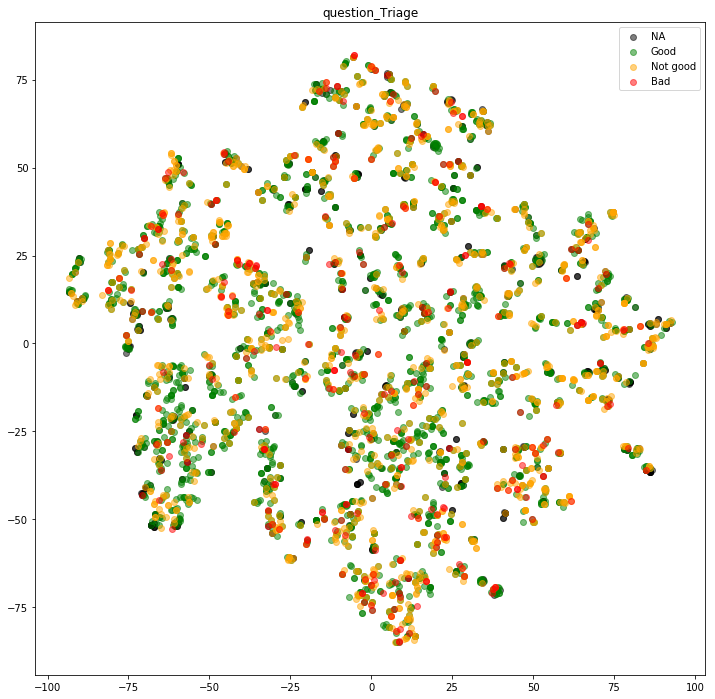

In [322]:
plot_triage("question_Triage")

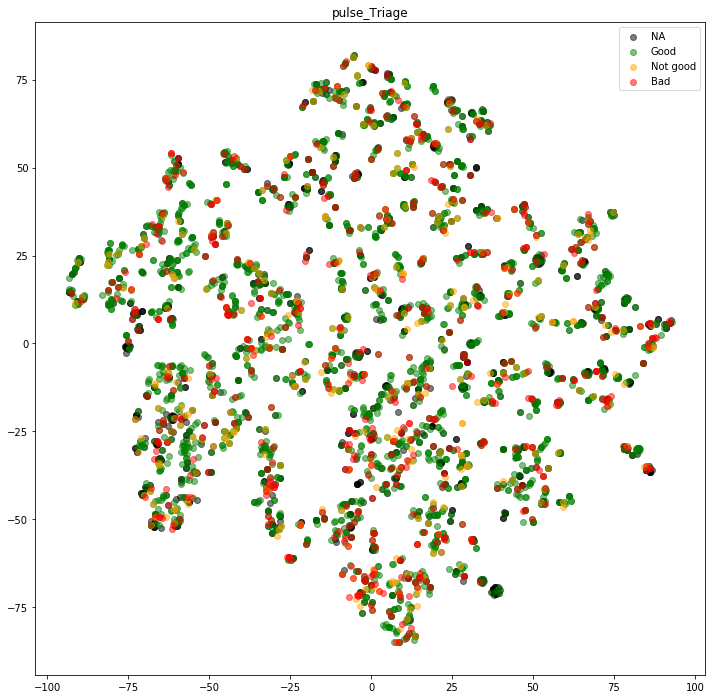

In [323]:
plot_triage("pulse_Triage")

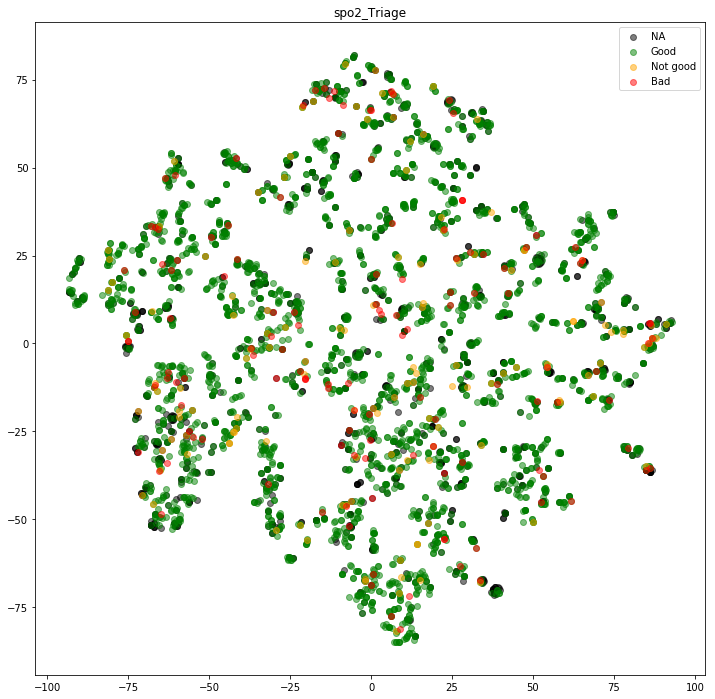

In [324]:
plot_triage("spo2_Triage")

In [267]:
data.shape

(4249, 72)

In [268]:
X.shape

(4249, 13)

In [269]:
Y.shape

(4249, 2)

In [278]:
all_Y = data["question_Triage"]

In [280]:
Y[np.isnan(all_Y),0]

array([ 7.91225891e+01,  7.91225891e+01, -4.94392014e+01,  6.89147110e+01,
       -1.50192223e+01, -1.50123682e+01, -4.55150070e+01, -4.29454269e+01,
       -4.32179260e+01,  1.54861126e+01,  1.54864244e+01, -4.90624380e+00,
       -4.61874151e+00, -4.38118649e+00,  5.26059456e+01,  5.05539551e+01,
       -2.69769592e+01, -7.20391998e+01,  8.53163338e+00,  8.97186756e+00,
       -7.09014587e+01, -7.09014587e+01, -7.05493698e+01, -7.04496231e+01,
       -7.09637146e+01, -7.11035767e+01, -6.99443130e+01, -6.96514359e+01,
       -6.96392746e+01, -6.96392746e+01, -9.34826565e+00, -9.34826565e+00,
       -7.14051008e+00, -7.14051008e+00, -7.14051008e+00, -5.71880035e+01,
       -5.71880035e+01,  3.03446198e+00,  4.39362097e+00,  4.70528269e+00,
        4.39362097e+00,  4.55582523e+00,  4.70096636e+00,  6.20512426e-01,
       -5.68786850e+01, -5.68786850e+01, -2.31974812e+01, -1.83736115e+01,
       -1.83736115e+01,  1.02730942e+01,  9.16664791e+00,  2.23824043e+01,
        1.34815633e+00,  

In [326]:
excluded_columns = ("questions_Triage", "pulse_Triage", "spo2_triage")

all_X_patient = data[interesting_columns_patient]

tsne_model_patient = manifold.TSNE(perplexity=30, random_state=0)
X_patient = (all_X_patient - all_X_patient.mean())/all_X_patient.std()
X_patient = X_patient[[c for c in X_patient.columns if c not in excluded_columns]]
X_patient.fillna(0, inplace=True)

Y_patient = tsne_model.fit_transform(X_patient)

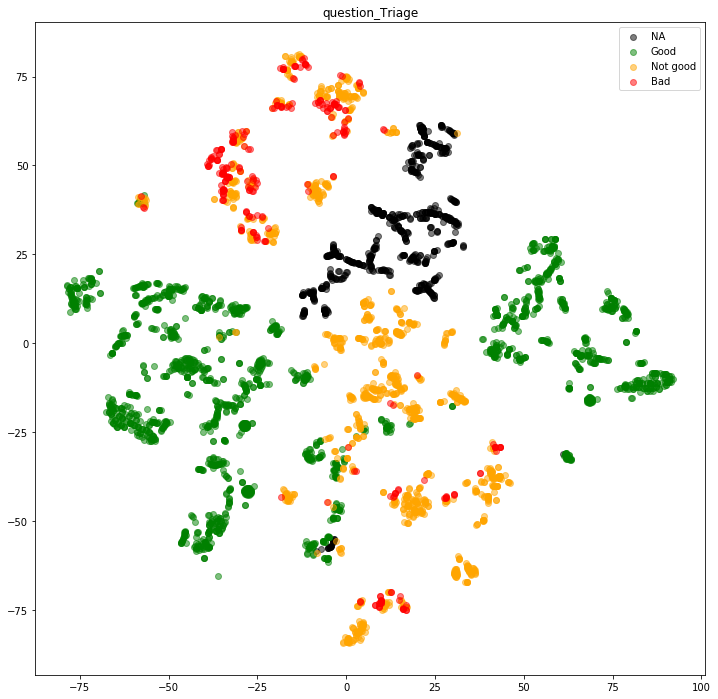

In [327]:
plot_triage("question_Triage", Y=Y_patient)

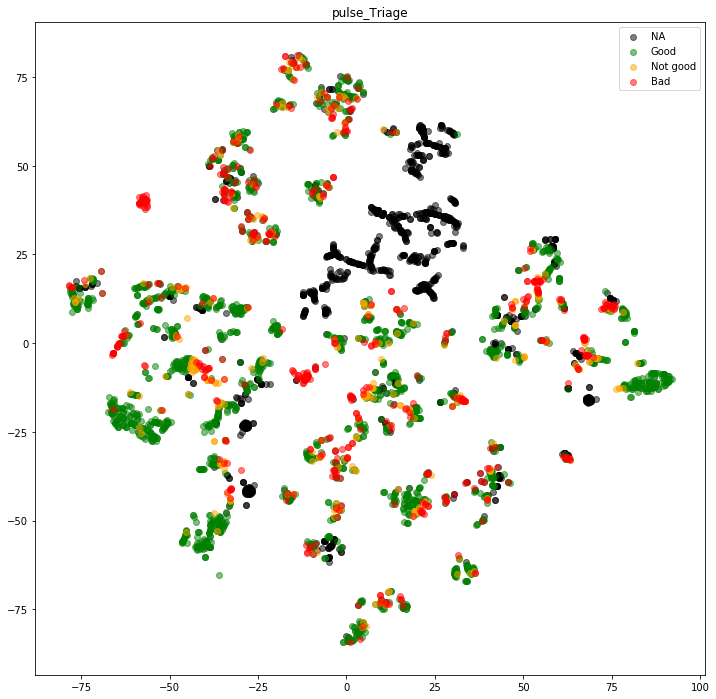

In [328]:
plot_triage("pulse_Triage", Y=Y_patient)

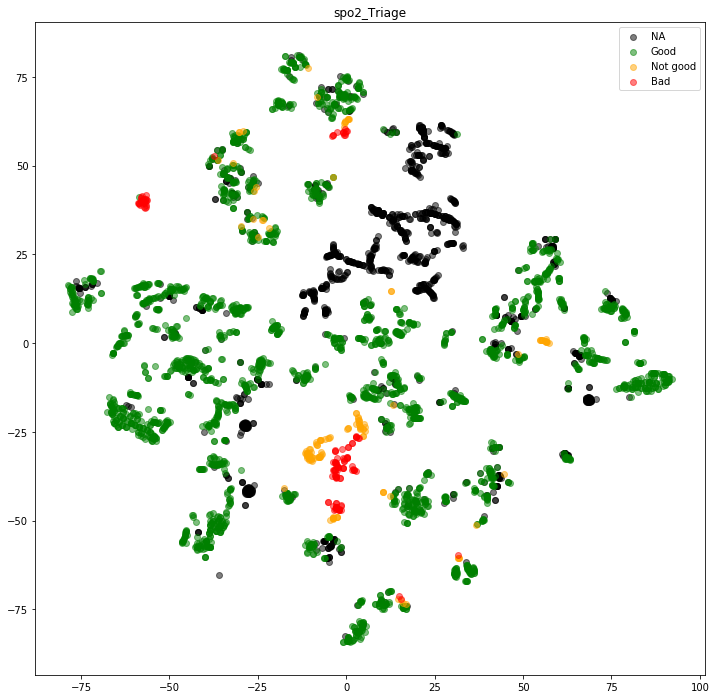

In [329]:
plot_triage("spo2_Triage", Y=Y_patient)

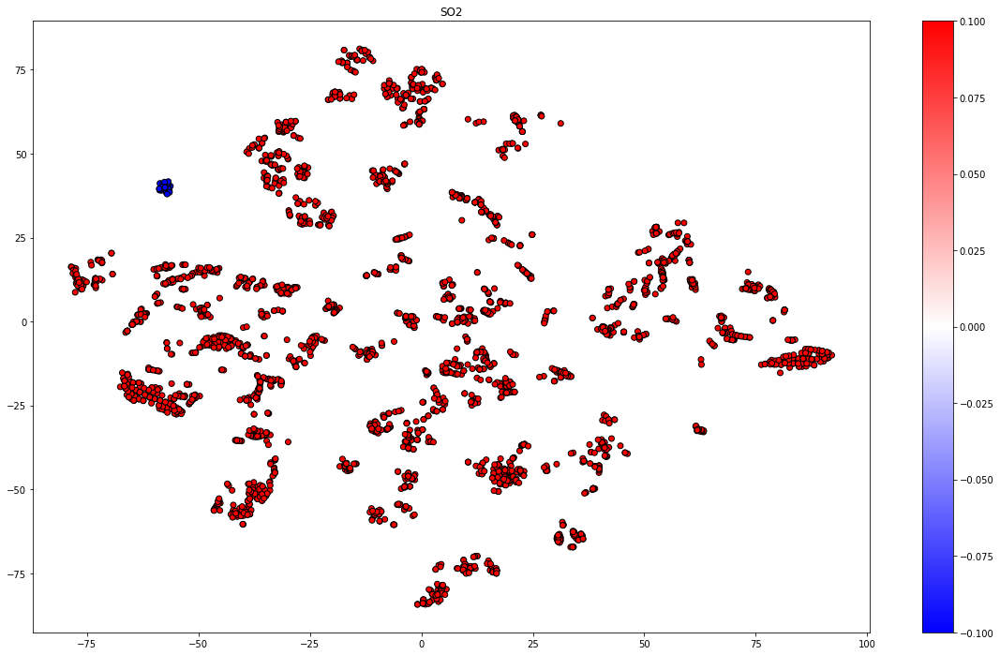

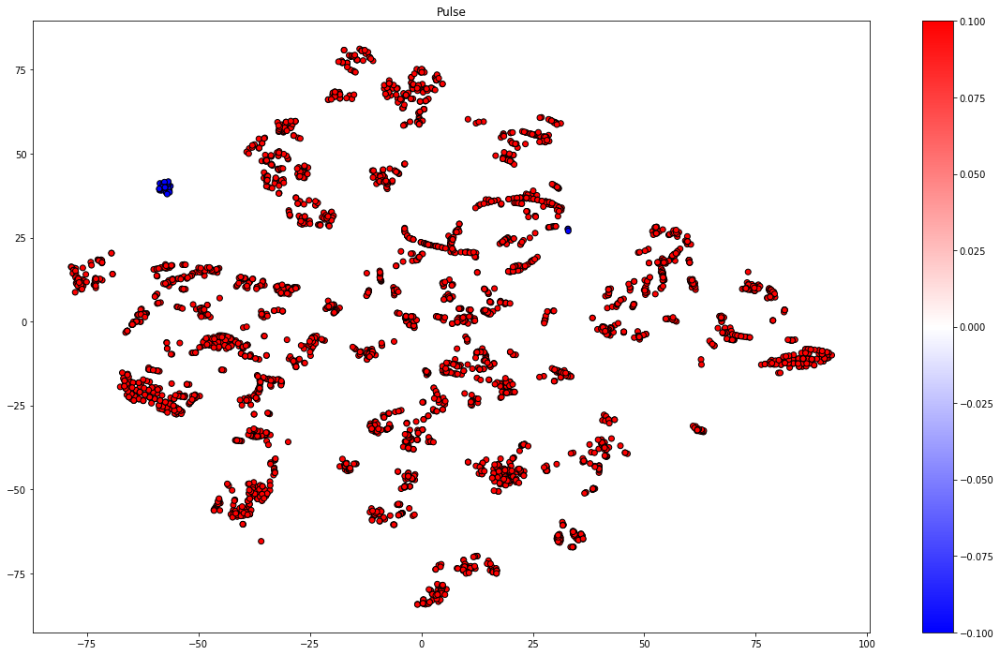

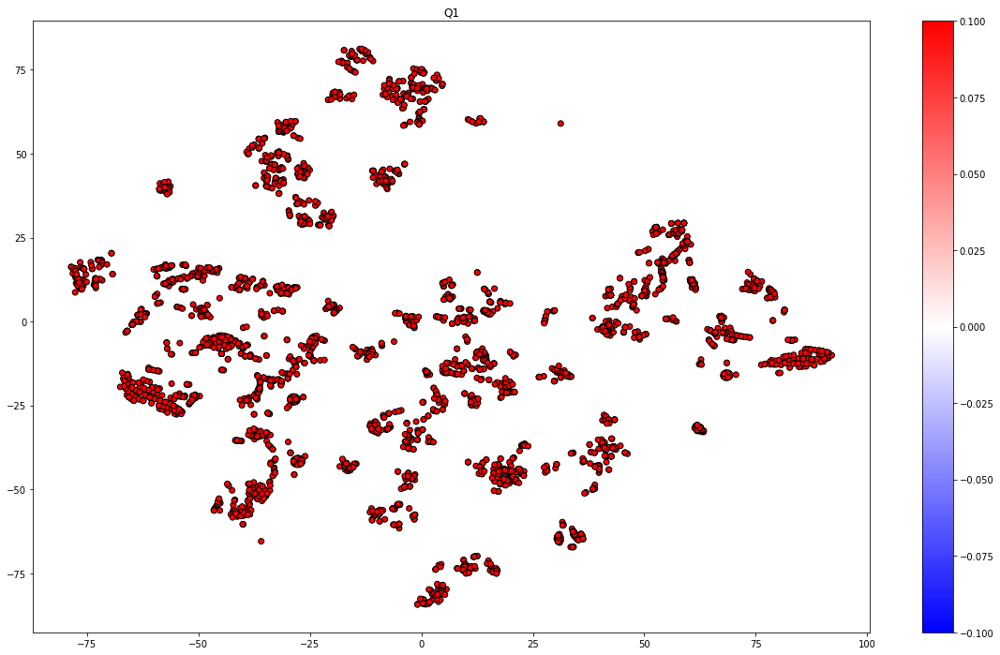

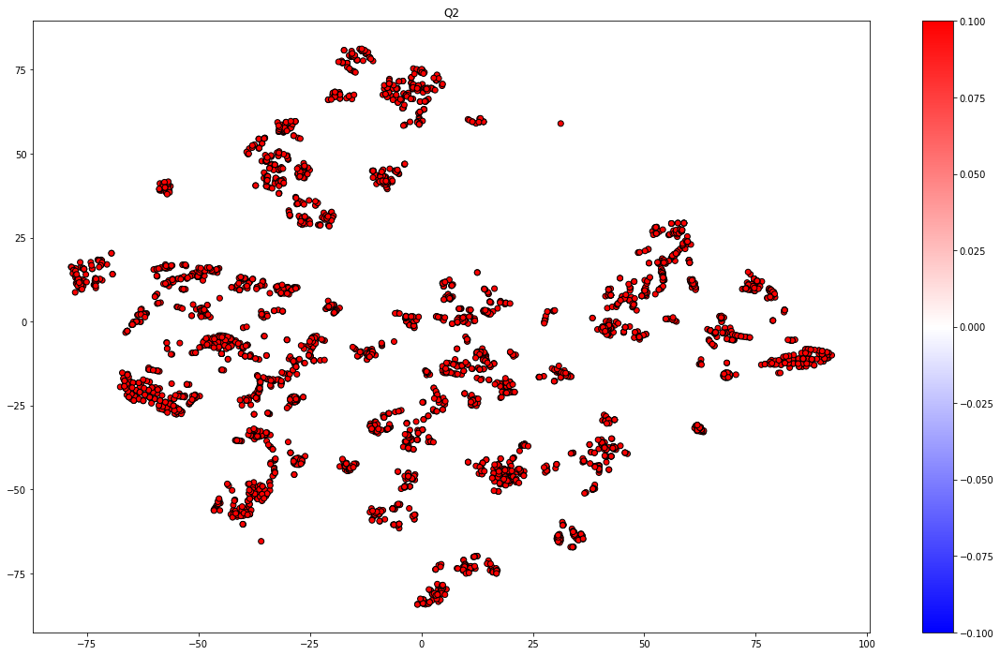

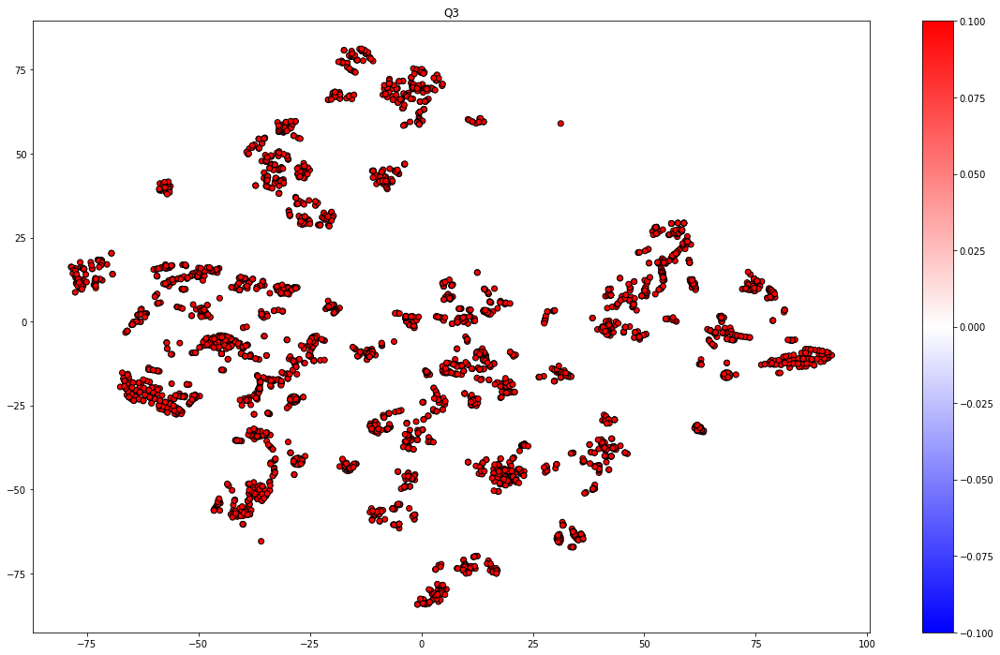

...

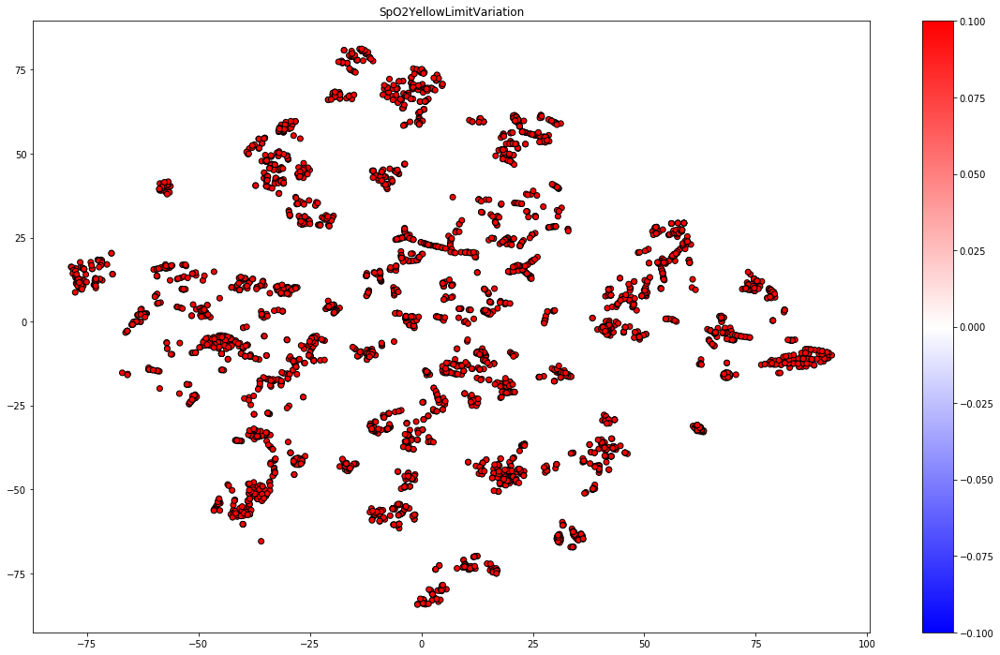

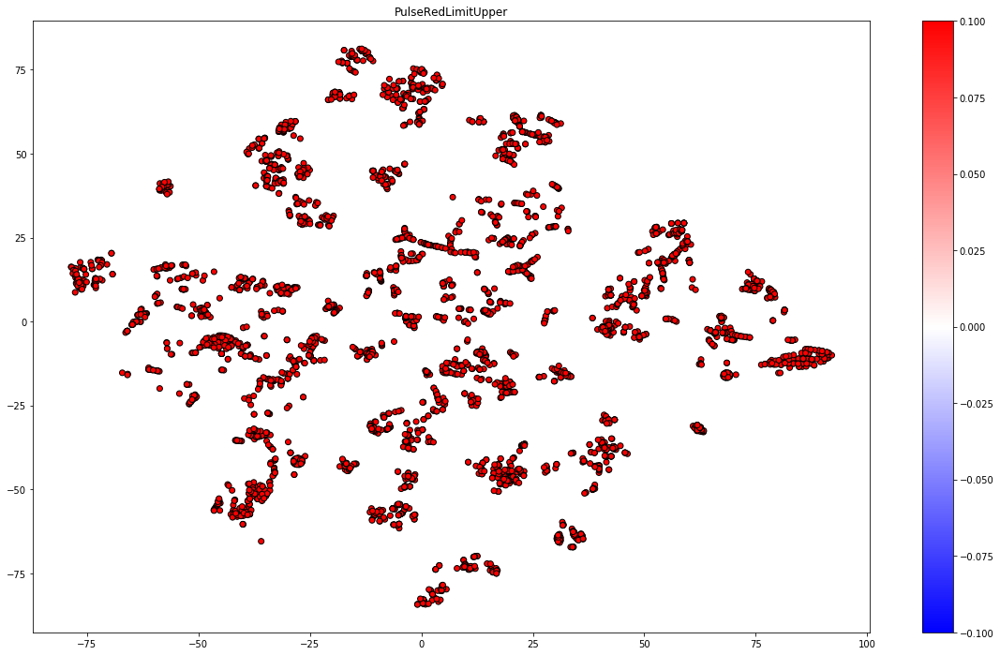

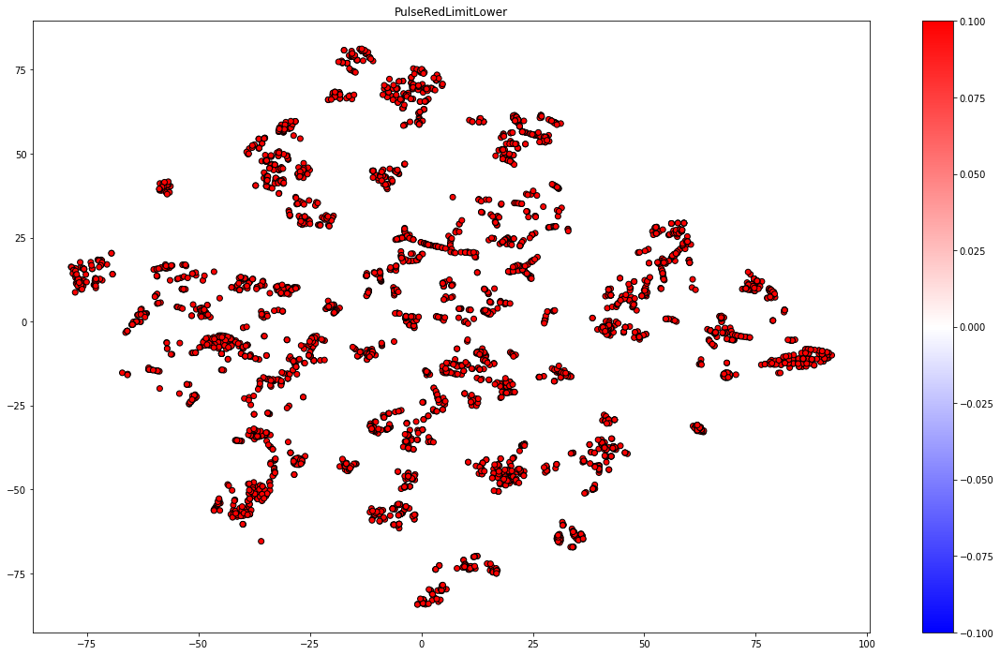

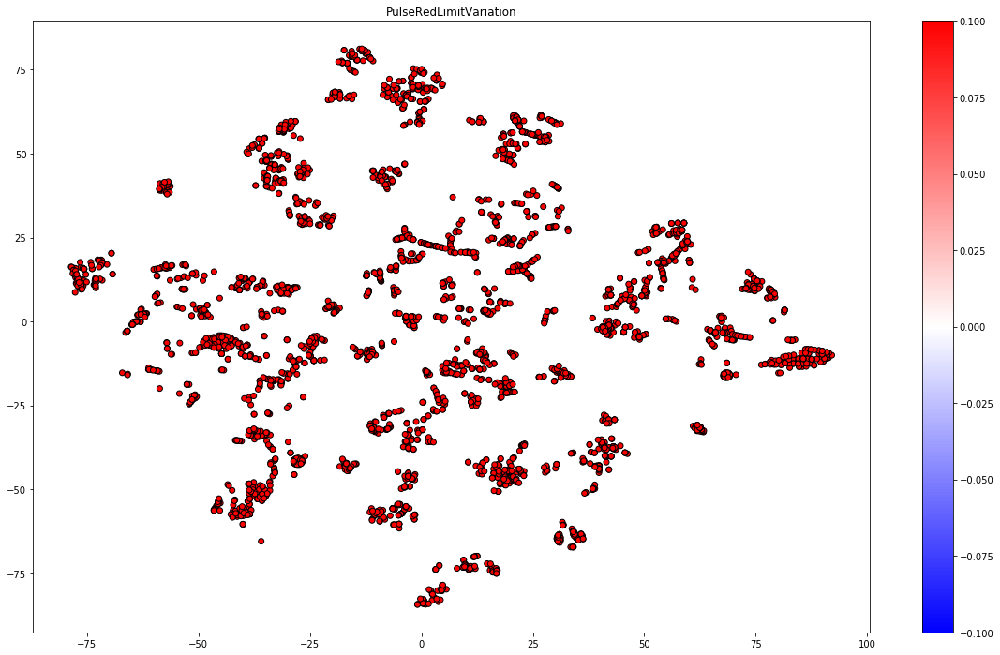

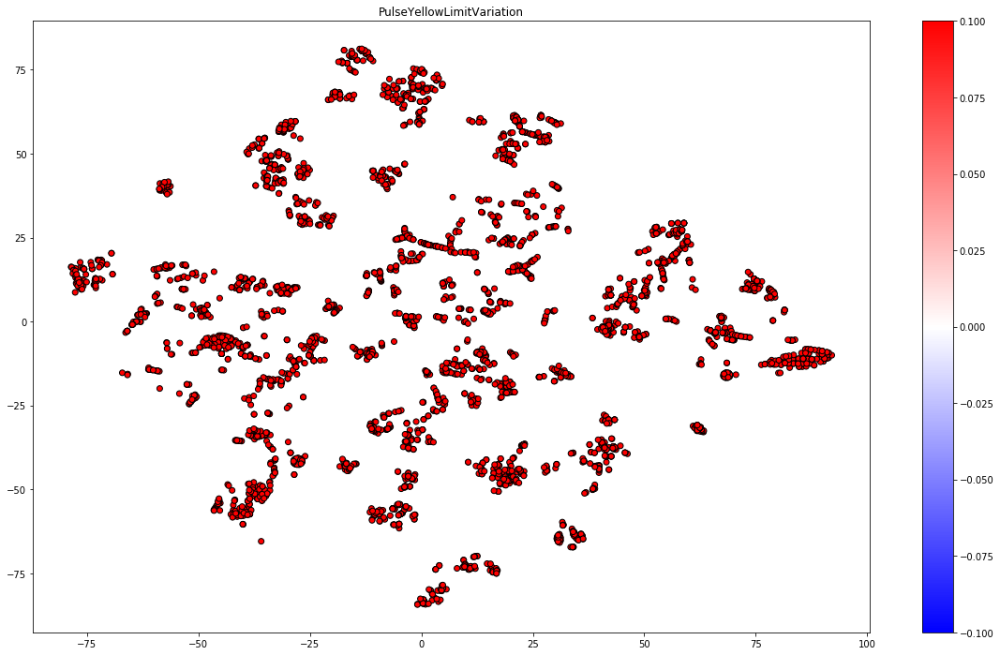

In [331]:
for c in X_patient.columns:
    plt.gcf().set_size_inches(20,12)
    z_min = np.percentile(all_X_patient[c], 5)
    z_max = np.percentile(all_X_patient[c], 95)
    p = plt.scatter(Y_patient[:,0], Y_patient[:,1], c=all_X_patient[c],
                    vmin=z_min, vmax=z_max, cmap='bwr', edgecolor='k')
    plt.colorbar(p)
    plt.title(c)
    plt.show()


In [333]:
all_X_patient

,SO2,Pulse,Q1,Q2,Q3,Q4,Q5,Q6,Q7,CQ1,...,spo2_Triage,manual_Triage,SpO2ReferenceValue,PulseReferenceValue,SpO2RedLimitVariation,SpO2YellowLimitVariation,PulseRedLimitUpper,PulseRedLimitLower,PulseRedLimitVariation,PulseYellowLimitVariation
0,97.0,71.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0,...,1.0,NaN,92.0,75.0,6.0,4.0,120.0,50.0,15.0,10.0
1,98.0,75.0,2.0,2.0,2.0,2.0,2.0,5.0,3.0,NaN,...,1.0,3.0,92.0,75.0,6.0,4.0,120.0,50.0,15.0,10.0
2,95.0,67.0,2.0,2.0,2.0,2.0,2.0,5.0,3.0,NaN,...,1.0,3.0,92.0,75.0,6.0,4.0,120.0,50.0,15.0,10.0
3,96.0,73.0,3.0,3.0,3.0,2.0,2.0,5.0,3.0,NaN,...,1.0,3.0,92.0,75.0,6.0,4.0,120.0,50.0,15.0,10.0
4,95.0,69.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,NaN,...,1.0,1.0,92.0,75.0,6.0,4.0,120.0,50.0,15.0,10.0
5,NaN,69.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,92.0,75.0,6.0,4.0,120.0,50.0,15.0,10.0
6,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,92.0,75.0,6.0,4.0,120.0,50.0,15.0,10.0
7,95.0,76.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,NaN,...,1.0,1.0,92.0,75.0,6.0,4.0,120.0,50.0,15.0,10.0
8,96.0,70.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,NaN,...,1.0,1.0,92.0,75.0,6.0,4.0,120.0,50.0,15.0,10.0
9,94.0,56.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,NaN,...,1.0,1.0,92.0,75.0,6.0,4.0,120.0,50.0,15.0,10.0


## Summarizing patient condition

In [435]:
?dummy.DummyClassifier

In [10]:
data.columns

Index(['Unnamed: 0', 'Merida ID', 'Assess_Date_With_Time', 'Region',
       'Merida ID.1', 'Patient_Group', 'Assess_Date_With_Time.1',
       'Assess_date_No_Time', 'SO2', 'Pulse',
       ...
       'question_Triage_7', 'manual_Triage_7', 'pulse_Triage_8',
       'spo2_Triage_8', 'question_Triage_8', 'manual_Triage_8',
       'pulse_Triage_9', 'spo2_Triage_9', 'question_Triage_9',
       'manual_Triage_9'],
      dtype='object', length=109)

In [11]:
np.sum(data.question_Triage==1), np.sum(data.question_Triage==3), np.sum(data.question_Triage==5)

(2034, 1256, 288)

In [12]:
np.sum(data.pulse_Triage==1), np.sum(data.pulse_Triage==3), np.sum(data.pulse_Triage==5)

(2125, 330, 513)

NameError: name 'all_X' is not defined

In [ ]:
?combinations

In [53]:
from sklearn import dummy
from itertools import product
from sklearn import tree, ensemble, linear_model
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

all_models = {
    "Dummy-Majority" : dummy.DummyClassifier(strategy='most_frequent'),    
    "Dummy-Stratified" : dummy.DummyClassifier(),
    "DT-default": tree.DecisionTreeClassifier(), # TODO Let's start like that. We will configure later.
    ##"DT-": tree.DecisionTreeClassifier(), # TODO Let's start like that. We will configure later.
    "RF-10Est": ensemble.RandomForestClassifier(n_estimators=10, random_state=0),
    "RF-100Est": ensemble.RandomForestClassifier(n_estimators=100, random_state=0),
    "GBT-def": ensemble.GradientBoostingClassifier(random_state=0),
    "LR-def" : linear_model.LogisticRegression(solver='liblinear', multi_class='ovr'),
}

def print_training_results(columns, print_rules=False):
    for cur_triage in ["question_Triage","pulse_Triage","spo2_Triage"]:
        output_exists = np.where(~np.isnan(data[cur_triage]))[0]

        # Taking only history
        all_X = data.iloc[output_exists,:][columns]
        all_Y = data.iloc[output_exists,:][[cur_triage]]

        all_X.fillna(0,inplace=True)

        for m in all_models:
            kfold_split = KFold(n_splits=10, random_state=0, shuffle=True)
            all_splits = kfold_split.split(all_X)

            model = all_models[m]

            train_results = list()
            test_results = list()
            precision = list()
            recall = list()
            f1 = list()
            tp = list()
            fp = list()
            tn = list()
            fn = list()
            for cur_train_index, cur_test_index in all_splits:
                cur_X_train = all_X.iloc[cur_train_index,:]
                cur_X_test = all_X.iloc[cur_test_index,:]
                cur_Y_train = np.ravel(all_Y.iloc[cur_train_index])
                cur_Y_test = np.ravel(all_Y.iloc[cur_test_index])    

                model = model.fit(cur_X_train, cur_Y_train)
                test_res = model.predict(cur_X_test)
                train_res = model.predict(cur_X_train)

                train_results.append(accuracy_score(train_res, cur_Y_train))
                test_results.append(accuracy_score(test_res, cur_Y_test))

                true_positive = np.sum((cur_Y_test > 1) & (test_res > 1))
                true_negative = np.sum((cur_Y_test == 1) & (test_res == 1))
                false_positive = np.sum((cur_Y_test == 1) & (test_res > 1))
                false_negative = np.sum((cur_Y_test > 1) & (test_res == 1))            

                tp.append(true_positive)
                tn.append(true_negative)
                fp.append(false_positive)
                fn.append(false_negative)

                if true_positive > 0 or false_positive>0:
                    cur_precision = true_positive / (true_positive + false_positive)
                else:
                    cur_precision = 0

                if true_positive > 0 or false_negative>0:
                    cur_recall = true_positive / (true_positive + false_negative)
                else:
                    cur_recall = 0

                if cur_precision > 0 or cur_recall > 0:
                    cur_f1 = 2*cur_precision*cur_recall / (cur_precision + cur_recall)
                else:
                    cur_f1 = 0

                precision.append(cur_precision)
                recall.append(cur_recall)
                f1.append(cur_f1)
                #print(confusion_matrix(test_res, cur_Y_test>1))
            if m == "Dummy-Majority":
                dummy_train_results = np.mean(train_results)
                dummy_test_results = np.mean(test_results)        
            print("============== Model: ", m, cur_triage, '=========')
            print("Num training samples: ", len(cur_Y_train))
            print("Num test samples: ", len(cur_Y_test))
            print("TRAIN: ", np.mean(train_results))
            print("TEST: ", np.mean(test_results))
            print("TRAIN (improved over majority): ", np.mean(train_results)-dummy_train_results)
            print("TEST  (improved over majority): ", np.mean(test_results)-dummy_test_results)
            print("True positive (avg over K-Fold): ", np.mean(tp))
            print("False positive (avg over K-Fold): ", np.mean(fp))
            print("True negative (avg over K-Fold): ", np.mean(tn))
            print("False negative (avg over K-Fold): ", np.mean(fn))        
            print("Precision: ", np.mean(precision))
            print("Recall: ", np.mean(recall))
            print("F1: ", np.mean(f1))
            
            if print_rules:
                model = model.fit(all_X, np.ravel(all_Y))
                values_list = list(product(*[[1,3,5] for i in all_X.columns]))
                test_dataframe = pd.DataFrame(columns=all_X.columns)
                for cur_values_list in values_list:
                    appended_line = dict()
                    for i in range(len(all_X.columns)):
                        cur_column = all_X.columns[i]
                        cur_value = cur_values_list[i]
                        appended_line[cur_column] = cur_value
                    test_dataframe = test_dataframe.append(appended_line, ignore_index=True)
                test_dataframe["RESULTS"] = model.predict(test_dataframe)                
                print(test_dataframe)

In [33]:
# print_training_results(avg_triage_columns)

NameError: name 'avg_triage_columns' is not defined

In [37]:
print_training_results(interesting_columns_weather)

============== Model:  Dummy-Majority question_Triage =========
Num training samples:  3221
Num test samples:  357
TRAIN:  0.5684742017158362
TEST:  0.5684897422656212
TRAIN (improved over majority):  0.0
TEST  (improved over majority):  0.0
True positive (avg over K-Fold):  0.0
False positive (avg over K-Fold):  0.0
True negative (avg over K-Fold):  203.4
False negative (avg over K-Fold):  154.4
Precision:  0.0
Recall:  0.0
F1:  0.0
============== Model:  Dummy-Stratified question_Triage =========
Num training samples:  3221
Num test samples:  357
TRAIN:  0.4559652301183422
TEST:  0.44800478850758185
TRAIN (improved over majority):  -0.11250897159749396
TEST  (improved over majority):  -0.12048495375803936
True positive (avg over K-Fold):  66.3
False positive (avg over K-Fold):  89.0
True negative (avg over K-Fold):  114.4
False negative (avg over K-Fold):  88.1
Precision:  0.4272296749568425
Recall:  0.42931246752413177
F1:  0.42751870123301217
============== Model:  DT-default quest

============== Model:  RF-10Est spo2_Triage =========
Num training samples:  2673
Num test samples:  296
TRAIN:  0.9520227082311246
TEST:  0.8787423787423787
TRAIN (improved over majority):  0.04329927406690537
TEST  (improved over majority):  -0.029977704977705022
True positive (avg over K-Fold):  1.9
False positive (avg over K-Fold):  10.0
True negative (avg over K-Fold):  259.8
False negative (avg over K-Fold):  25.2
Precision:  0.17917388167388165
Recall:  0.06823433431192051
F1:  0.0956925097764576
============== Model:  RF-100Est spo2_Triage =========
Num training samples:  2673
Num test samples:  296
TRAIN:  0.9622768492196302
TEST:  0.8821116571116571
TRAIN (improved over majority):  0.053553415055411
TEST  (improved over majority):  -0.02660842660842666
True positive (avg over K-Fold):  1.9
False positive (avg over K-Fold):  9.0
True negative (avg over K-Fold):  260.8
False negative (avg over K-Fold):  25.2
Precision:  0.17965811965811965
Recall:  0.06996383166641787
F1:  0.09

In [54]:
# =================================== LAST 3 DAYS HISTORY ONLY
for cur_triage in ["question_Triage"]:
    print_training_results([cur_triage + "_" + str(i) for i in range(1,4)], print_rules=True)

============== Model:  Dummy-Majority question_Triage =========
Num training samples:  3221
Num test samples:  357
TRAIN:  0.5684742017158362
TEST:  0.5684897422656212
TRAIN (improved over majority):  0.0
TEST  (improved over majority):  0.0
True positive (avg over K-Fold):  0.0
False positive (avg over K-Fold):  0.0
True negative (avg over K-Fold):  203.4
False negative (avg over K-Fold):  154.4
Precision:  0.0
Recall:  0.0
F1:  0.0
   question_Triage_1 question_Triage_2 question_Triage_3  RESULTS
0                  1                 1                 1      1.0
1                  1                 1                 3      1.0
2                  1                 1                 5      1.0
3                  1                 3                 1      1.0
4                  1                 3                 3      1.0
5                  1                 3                 5      1.0
6                  1                 5                 1      1.0
7                  1              

============== Model:  RF-100Est question_Triage =========
Num training samples:  3221
Num test samples:  357
TRAIN:  0.7968759171662672
TEST:  0.7853512354662534
TRAIN (improved over majority):  0.22840171545043098
TEST  (improved over majority):  0.2168614932006322
True positive (avg over K-Fold):  115.7
False positive (avg over K-Fold):  17.5
True negative (avg over K-Fold):  185.9
False negative (avg over K-Fold):  38.7
Precision:  0.8694471548961185
Recall:  0.7496345694574401
F1:  0.8041042547968912
   question_Triage_1 question_Triage_2 question_Triage_3  RESULTS
0                  1                 1                 1      1.0
1                  1                 1                 3      1.0
2                  1                 1                 5      1.0
3                  1                 3                 1      1.0
4                  1                 3                 3      1.0
5                  1                 3                 5      3.0
6                  1       

============== Model:  RF-10Est pulse_Triage =========
Num training samples:  2672
Num test samples:  296
TRAIN:  0.7233452507190785
TEST:  0.7139469014469014
TRAIN (improved over majority):  0.007374940310319045
TEST  (improved over majority):  -0.002020202020202033
True positive (avg over K-Fold):  1.4
False positive (avg over K-Fold):  1.5
True negative (avg over K-Fold):  211.0
False negative (avg over K-Fold):  82.9
Precision:  0.40166666666666656
Recall:  0.016697338675138833
F1:  0.03200061658407151
   question_Triage_1 question_Triage_2 question_Triage_3  RESULTS
0                  1                 1                 1      1.0
1                  1                 1                 3      1.0
2                  1                 1                 5      1.0
3                  1                 3                 1      1.0
4                  1                 3                 3      1.0
5                  1                 3                 5      1.0
6                  1      

============== Model:  Dummy-Majority spo2_Triage =========
Num training samples:  2673
Num test samples:  296
TRAIN:  0.9087234341642192
TEST:  0.9087200837200837
TRAIN (improved over majority):  0.0
TEST  (improved over majority):  0.0
True positive (avg over K-Fold):  0.0
False positive (avg over K-Fold):  0.0
True negative (avg over K-Fold):  269.8
False negative (avg over K-Fold):  27.1
Precision:  0.0
Recall:  0.0
F1:  0.0
   question_Triage_1 question_Triage_2 question_Triage_3  RESULTS
0                  1                 1                 1      1.0
1                  1                 1                 3      1.0
2                  1                 1                 5      1.0
3                  1                 3                 1      1.0
4                  1                 3                 3      1.0
5                  1                 3                 5      1.0
6                  1                 5                 1      1.0
7                  1                 5 

============== Model:  RF-100Est spo2_Triage =========
Num training samples:  2673
Num test samples:  296
TRAIN:  0.911941885029044
TEST:  0.906026481026481
TRAIN (improved over majority):  0.003218450864824862
TEST  (improved over majority):  -0.002693602693602748
True positive (avg over K-Fold):  0.0
False positive (avg over K-Fold):  0.8
True negative (avg over K-Fold):  269.0
False negative (avg over K-Fold):  27.1
Precision:  0.0
Recall:  0.0
F1:  0.0
   question_Triage_1 question_Triage_2 question_Triage_3  RESULTS
0                  1                 1                 1      1.0
1                  1                 1                 3      1.0
2                  1                 1                 5      1.0
3                  1                 3                 1      1.0
4                  1                 3                 3      1.0
5                  1                 3                 5      1.0
6                  1                 5                 1      1.0
7          

In [ ]:
# =================================== LAST 3 DAYS HISTORY + WEATHER
print_training_results(interesting_columns_weather + [cur_triage + "_" + str(i) for i in range(1,4)])

In [451]:
data

,Merida ID,Assess_Date_With_Time,Region,Merida ID.1,Patient_Group,Assess_Date_With_Time.1,Assess_date_No_Time,SO2,Pulse,Q1,...,weather_icon,dt_weather,weather_only_date,weather_only_time,time_difference,History_count,Avg_pulse_Triage,Avg_spo2_Triage,Avg_question_Triage,Avg_manual_Triage
0,1000405,2015-01-07 11:14:31,10.0,1000405,1.0,2015-01-07 11:14:31.000,2015-01-07,97.0,71.0,2.0,...,10,2015-01-07 11:00:00+01:00,2015-01-07,11:00:00,871,0,NaN,NaN,NaN,NaN
1,1000405,2015-01-08 09:47:05,10.0,1000405,1.0,2015-01-08 09:47:05.000,2015-01-08,98.0,75.0,2.0,...,10,2015-01-08 10:00:00+01:00,2015-01-08,10:00:00,775,1,1.000000,1.000000,1.000000,NaN
2,1000405,2015-01-09 09:28:19,10.0,1000405,1.0,2015-01-09 09:28:19.000,2015-01-09,95.0,67.0,2.0,...,10,2015-01-09 09:00:00+01:00,2015-01-09,09:00:00,1699,2,1.000000,1.000000,2.000000,3.000000
3,1000405,2015-01-12 09:17:07,10.0,1000405,1.0,2015-01-12 09:17:07.000,2015-01-12,96.0,73.0,3.0,...,10,2015-01-12 09:00:00+01:00,2015-01-12,09:00:00,1027,3,1.000000,1.000000,2.333333,3.000000
4,1000405,2015-01-13 09:25:21,10.0,1000405,1.0,2015-01-13 09:25:21.000,2015-01-13,95.0,69.0,2.0,...,10,2015-01-13 09:00:00+01:00,2015-01-13,09:00:00,1521,4,1.000000,1.000000,2.500000,3.000000
5,1000405,2015-01-14 09:38:09,10.0,1000405,1.0,2015-01-14 09:38:09.000,2015-01-14,NaN,69.0,NaN,...,10,2015-01-14 10:00:00+01:00,2015-01-14,10:00:00,1311,5,1.000000,1.000000,2.200000,2.500000
6,1000405,2015-01-14 09:38:10,10.0,1000405,1.0,2015-01-14 09:38:10.000,2015-01-14,NaN,73.0,NaN,...,10,2015-01-14 10:00:00+01:00,2015-01-14,10:00:00,1310,5,1.000000,1.000000,2.200000,2.500000
7,1000405,2015-01-14 09:39:24,10.0,1000405,1.0,2015-01-14 09:39:24.000,2015-01-14,95.0,76.0,2.0,...,10,2015-01-14 10:00:00+01:00,2015-01-14,10:00:00,1236,5,1.000000,1.000000,2.200000,2.500000
8,1000405,2015-01-15 09:35:12,10.0,1000405,1.0,2015-01-15 09:35:12.000,2015-01-15,96.0,70.0,2.0,...,10,2015-01-15 10:00:00+01:00,2015-01-15,10:00:00,1488,8,1.000000,1.000000,2.000000,2.200000
9,1000405,2015-01-16 09:28:43,10.0,1000405,1.0,2015-01-16 09:28:43.000,2015-01-16,94.0,56.0,2.0,...,10,2015-01-16 09:00:00+01:00,2015-01-16,09:00:00,1723,9,1.000000,1.000000,1.857143,2.000000


In [86]:
def triage_results_distribution(main_triage_column, history_length=3, result_options=[1.0,3.0,5.0],
                                skip_zero_rows=True):
    columns = [main_triage_column + "_" + str(i) for i in range(1,history_length+1)]
    input_columns = [str(i) for i in range(1,history_length+1)]
    result_columns = ["Res:"+str(i) for i in result_options]    
    values_list = list(product(*[result_options for i in input_columns]))    
    result_dataframe = pd.DataFrame(columns=input_columns+result_columns)
    for cur_values_list in values_list:
        line_dict = dict()
        values_vector = np.array([True]*data.shape[0])
        for i in range(len(input_columns)):
            values_vector = values_vector & \
                        (data[main_triage_column + "_" + str(input_columns[i])] == cur_values_list[i])
            line_dict[input_columns[i]] = cur_values_list[i]
        cur_results = data.iloc[np.where(values_vector)[0],:][main_triage_column]
        has_non_zero_results = False
        for r in result_columns:
            line_dict[r] = np.sum(cur_results == float(r[4:]))
            has_non_zero_results = has_non_zero_results or (line_dict[r]>0)
        if has_non_zero_results and skip_zero_rows:
            result_dataframe = result_dataframe.append(line_dict, ignore_index=True)
    return result_dataframe

for i in range(2,8):
    for triage_column in ["question_Triage","pulse_Triage","spo2_Triage","manual_Triage"]:
        print("============= ",triage_column," =============")
        with pd.option_context('display.max_rows', None):
            print(triage_results_distribution(triage_column, history_length=i))
        print("\n\n")

=============  question_Triage  =============
     1    2  Res:1.0  Res:3.0  Res:5.0
0  1.0  1.0   1195.0     91.0      0.0
1  1.0  3.0     82.0     30.0      1.0
2  1.0  5.0      7.0      8.0      1.0
3  3.0  1.0     75.0     46.0     40.0
4  3.0  3.0     36.0    446.0     53.0
5  3.0  5.0     13.0     59.0     83.0
6  5.0  1.0      0.0      1.0      0.0
7  5.0  3.0     15.0    159.0      5.0
8  5.0  5.0      0.0      4.0      2.0



=============  pulse_Triage  =============
     1    2  Res:1.0  Res:3.0  Res:5.0
0  1.0  1.0   1022.0    106.0     94.0
1  1.0  3.0    103.0     23.0     20.0
2  1.0  5.0     85.0     20.0     26.0
3  3.0  1.0    115.0     21.0     13.0
4  3.0  3.0     23.0      6.0      5.0
5  3.0  5.0     24.0      7.0     20.0
6  5.0  1.0     86.0     17.0     45.0
7  5.0  3.0     11.0     10.0     17.0
8  5.0  5.0     29.0     22.0     81.0



=============  spo2_Triage  =============
     1    2  Res:1.0  Res:3.0  Res:5.0
0  1.0  1.0   1649.0     70.0     38.0
1  1.

      1    2    3    4  Res:1.0  Res:3.0  Res:5.0
0   1.0  1.0  1.0  1.0    592.0     51.0     34.0
1   1.0  1.0  1.0  3.0     53.0      8.0      2.0
2   1.0  1.0  1.0  5.0     30.0      4.0      6.0
3   1.0  1.0  3.0  1.0     55.0      3.0      7.0
4   1.0  1.0  3.0  3.0      5.0      3.0      0.0
5   1.0  1.0  3.0  5.0      7.0      0.0      1.0
6   1.0  1.0  5.0  1.0     27.0      4.0      7.0
7   1.0  1.0  5.0  3.0      3.0      1.0      0.0
8   1.0  1.0  5.0  5.0      8.0      3.0      5.0
9   1.0  3.0  1.0  1.0     52.0      3.0      4.0
10  1.0  3.0  1.0  3.0      9.0      5.0      2.0
11  1.0  3.0  1.0  5.0      6.0      2.0      0.0
12  1.0  3.0  3.0  1.0      3.0      5.0      3.0
13  1.0  3.0  3.0  3.0      2.0      0.0      0.0
14  1.0  3.0  3.0  5.0      1.0      2.0      0.0
15  1.0  3.0  5.0  1.0      3.0      0.0      3.0
16  1.0  3.0  5.0  3.0      1.0      0.0      2.0
17  1.0  3.0  5.0  5.0      5.0      1.0      1.0
18  1.0  5.0  1.0  1.0     30.0      7.0      5.0


      1    2    3    4    5  Res:1.0  Res:3.0  Res:5.0
0   1.0  1.0  1.0  1.0  1.0    717.0     30.0      0.0
1   1.0  1.0  1.0  1.0  3.0     34.0      7.0      0.0
2   1.0  1.0  1.0  1.0  5.0      2.0      0.0      0.0
3   1.0  1.0  1.0  3.0  1.0     27.0      3.0      0.0
4   1.0  1.0  1.0  3.0  3.0     14.0      2.0      0.0
5   1.0  1.0  1.0  3.0  5.0      2.0      0.0      0.0
6   1.0  1.0  1.0  5.0  3.0      2.0      3.0      0.0
7   1.0  1.0  3.0  1.0  1.0     23.0      5.0      0.0
8   1.0  1.0  3.0  1.0  3.0      1.0      0.0      0.0
9   1.0  1.0  3.0  1.0  5.0      1.0      1.0      0.0
10  1.0  1.0  3.0  3.0  1.0      3.0      0.0      0.0
11  1.0  1.0  3.0  3.0  3.0     11.0      0.0      0.0
12  1.0  1.0  3.0  3.0  5.0      3.0      0.0      0.0
13  1.0  1.0  3.0  5.0  3.0      2.0      1.0      0.0
14  1.0  1.0  5.0  3.0  1.0      3.0      0.0      0.0
15  1.0  1.0  5.0  3.0  3.0      2.0      0.0      0.0
16  1.0  1.0  5.0  3.0  5.0      1.0      0.0      0.0
17  1.0  3

      1    2    3    4    5  Res:1.0  Res:3.0  Res:5.0
0   1.0  1.0  1.0  1.0  1.0    927.0     29.0     14.0
1   1.0  1.0  1.0  1.0  3.0     32.0      2.0      2.0
2   1.0  1.0  1.0  1.0  5.0     13.0      1.0      1.0
3   1.0  1.0  1.0  3.0  1.0     32.0      3.0      0.0
4   1.0  1.0  1.0  3.0  3.0      3.0      0.0      0.0
5   1.0  1.0  1.0  3.0  5.0      0.0      0.0      1.0
6   1.0  1.0  1.0  5.0  1.0     14.0      1.0      1.0
7   1.0  1.0  1.0  5.0  5.0      3.0      0.0      0.0
8   1.0  1.0  3.0  1.0  1.0     35.0      3.0      1.0
9   1.0  1.0  3.0  1.0  3.0      0.0      0.0      1.0
10  1.0  1.0  3.0  1.0  5.0      1.0      0.0      0.0
11  1.0  1.0  3.0  3.0  1.0      2.0      1.0      0.0
12  1.0  1.0  3.0  5.0  1.0      0.0      1.0      0.0
13  1.0  1.0  3.0  5.0  5.0      1.0      0.0      0.0
14  1.0  1.0  5.0  1.0  1.0     11.0      1.0      2.0
15  1.0  1.0  5.0  1.0  3.0      1.0      0.0      0.0
16  1.0  1.0  5.0  3.0  3.0      0.0      0.0      1.0
17  1.0  1

       1    2    3    4    5    6  Res:1.0  Res:3.0  Res:5.0
0    1.0  1.0  1.0  1.0  1.0  1.0    363.0     25.0     19.0
1    1.0  1.0  1.0  1.0  1.0  3.0     33.0      2.0      2.0
2    1.0  1.0  1.0  1.0  1.0  5.0     14.0      4.0      1.0
3    1.0  1.0  1.0  1.0  3.0  1.0     33.0      3.0      3.0
4    1.0  1.0  1.0  1.0  3.0  3.0      3.0      0.0      0.0
5    1.0  1.0  1.0  1.0  3.0  5.0      3.0      4.0      0.0
6    1.0  1.0  1.0  1.0  5.0  1.0     15.0      0.0      2.0
7    1.0  1.0  1.0  1.0  5.0  3.0      2.0      0.0      0.0
8    1.0  1.0  1.0  1.0  5.0  5.0      3.0      1.0      1.0
9    1.0  1.0  1.0  3.0  1.0  1.0     28.0      5.0      2.0
10   1.0  1.0  1.0  3.0  1.0  3.0      5.0      0.0      0.0
11   1.0  1.0  1.0  3.0  1.0  5.0      4.0      0.0      0.0
12   1.0  1.0  1.0  3.0  3.0  1.0      2.0      1.0      0.0
13   1.0  1.0  1.0  3.0  3.0  5.0      1.0      0.0      0.0
14   1.0  1.0  1.0  3.0  5.0  1.0      2.0      0.0      0.0
15   1.0  1.0  1.0  3.0 

      1    2    3    4    5    6  Res:1.0  Res:3.0  Res:5.0
0   1.0  1.0  1.0  1.0  1.0  1.0    793.0     21.0     11.0
1   1.0  1.0  1.0  1.0  1.0  3.0     24.0      1.0      1.0
2   1.0  1.0  1.0  1.0  1.0  5.0      9.0      1.0      0.0
3   1.0  1.0  1.0  1.0  3.0  1.0     26.0      2.0      2.0
4   1.0  1.0  1.0  1.0  3.0  3.0      3.0      0.0      0.0
5   1.0  1.0  1.0  1.0  5.0  1.0     10.0      1.0      0.0
6   1.0  1.0  1.0  1.0  5.0  5.0      2.0      0.0      1.0
7   1.0  1.0  1.0  3.0  1.0  1.0     28.0      2.0      0.0
8   1.0  1.0  1.0  3.0  1.0  5.0      1.0      0.0      0.0
9   1.0  1.0  1.0  3.0  3.0  1.0      2.0      0.0      0.0
10  1.0  1.0  1.0  3.0  5.0  5.0      0.0      0.0      1.0
11  1.0  1.0  1.0  5.0  1.0  1.0     11.0      0.0      0.0
12  1.0  1.0  1.0  5.0  1.0  3.0      1.0      0.0      0.0
13  1.0  1.0  1.0  5.0  5.0  1.0      2.0      0.0      0.0
14  1.0  1.0  1.0  5.0  5.0  5.0      1.0      0.0      0.0
15  1.0  1.0  3.0  1.0  1.0  1.0     28.

       1    2    3    4    5    6    7  Res:1.0  Res:3.0  Res:5.0
0    1.0  1.0  1.0  1.0  1.0  1.0  1.0    300.0     19.0     14.0
1    1.0  1.0  1.0  1.0  1.0  1.0  3.0     26.0      3.0      1.0
2    1.0  1.0  1.0  1.0  1.0  1.0  5.0     11.0      1.0      1.0
3    1.0  1.0  1.0  1.0  1.0  3.0  1.0     27.0      2.0      2.0
4    1.0  1.0  1.0  1.0  1.0  3.0  3.0      3.0      0.0      0.0
5    1.0  1.0  1.0  1.0  1.0  3.0  5.0      3.0      0.0      0.0
6    1.0  1.0  1.0  1.0  1.0  5.0  1.0     11.0      2.0      1.0
7    1.0  1.0  1.0  1.0  1.0  5.0  3.0      0.0      2.0      0.0
8    1.0  1.0  1.0  1.0  1.0  5.0  5.0      3.0      0.0      0.0
9    1.0  1.0  1.0  1.0  3.0  1.0  1.0     23.0      3.0      2.0
10   1.0  1.0  1.0  1.0  3.0  1.0  3.0      5.0      0.0      0.0
11   1.0  1.0  1.0  1.0  3.0  1.0  5.0      4.0      0.0      0.0
12   1.0  1.0  1.0  1.0  3.0  3.0  1.0      2.0      0.0      0.0
13   1.0  1.0  1.0  1.0  3.0  3.0  5.0      1.0      0.0      0.0
14   1.0  

      1    2    3    4    5    6    7  Res:1.0  Res:3.0  Res:5.0
0   1.0  1.0  1.0  1.0  1.0  1.0  1.0    704.0     21.0     10.0
1   1.0  1.0  1.0  1.0  1.0  1.0  3.0     24.0      0.0      1.0
2   1.0  1.0  1.0  1.0  1.0  1.0  5.0      9.0      0.0      0.0
3   1.0  1.0  1.0  1.0  1.0  3.0  1.0     20.0      1.0      1.0
4   1.0  1.0  1.0  1.0  1.0  3.0  3.0      3.0      0.0      0.0
5   1.0  1.0  1.0  1.0  1.0  5.0  1.0      9.0      1.0      0.0
6   1.0  1.0  1.0  1.0  3.0  1.0  1.0     24.0      2.0      2.0
7   1.0  1.0  1.0  1.0  3.0  1.0  5.0      1.0      0.0      0.0
8   1.0  1.0  1.0  1.0  3.0  3.0  1.0      2.0      0.0      0.0
9   1.0  1.0  1.0  1.0  5.0  1.0  1.0      8.0      1.0      0.0
10  1.0  1.0  1.0  1.0  5.0  5.0  1.0      1.0      0.0      1.0
11  1.0  1.0  1.0  1.0  5.0  5.0  5.0      1.0      0.0      0.0
12  1.0  1.0  1.0  3.0  1.0  1.0  1.0     25.0      1.0      0.0
13  1.0  1.0  1.0  3.0  1.0  1.0  5.0      1.0      0.0      0.0
14  1.0  1.0  1.0  3.0  1

In [59]:
data[main_triage_column + "_" + str(input_columns[i])] == values_list[i]

NameError: name 'main_triage_column' is not defined